<a href="https://colab.research.google.com/github/maneri13/Data-Science-Experiments/blob/master/Corona_Dataset_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Corona Dataset 1

## Imports

In [5]:
# !pip install automl

import scipy.io
import numpy as np
import pandas as pd
import csv
import seaborn as sn

import sklearn
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.svm import LinearSVC
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn import preprocessing, metrics

from sklearn.feature_selection import VarianceThreshold
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.svm import LinearSVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix

from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

from sklearn import datasets
from sklearn.decomposition import PCA
from google.colab import files

## Data Load & Drive Mount

In [6]:
uploaded = files.upload()

Saving 13patients.mat to 13patients (1).mat


In [7]:
# from google.colab import drive
# drive.mount('/gdrive')

## Dataset 1 (44 Features)

In [8]:
mat = scipy.io.loadmat("13patients.mat")
df_mat  = mat['FeatureVector']
df = pd.DataFrame(df_mat, columns=['ch'+str(n) for n in range(0,44)])
classes = pd.DataFrame(mat['classes'], columns= ['class']) 
df.dropna(inplace=True)

In [9]:
patients = pd.DataFrame(mat['subsetIdx'], columns= ['id'])
count = patients['id'].value_counts().sort_index()
indices = []
start_value = 0
end_value = -1


for i in range(0,13):
    start_value = end_value + 1
    end_value = start_value + count[i] - 1
    indices.append([start_value, end_value])

# test_df = pd.DataFrame(indices, columns=['start_index', 'end_index'])
# test_df.to_csv('test.csv', sep= '\t')
# files.download('test.csv')

## Methods

In [10]:
def leave_one_out(df, patient):
    start_value = indices[patient][0]
    end_value = indices[patient][1]
    print("This is the starting index: " + str(start_value) + " of patient " + str(patient))
    
    #Select test and train data by leaving one out
    test = df.iloc[start_value: end_value].values  # select values from start index to end index. 
    idx = df.index.difference(df.index[start_value:end_value])
    train = df.loc[idx].values # Select the values that were not selected in test set

    # Select class values for same indices
    test_class = classes.iloc[start_value: end_value].values # select values from start index to end index.
    idx = classes.index.difference(classes.index[start_value:end_value])
    train_class = classes.loc[idx].values #Select the values that were not selected in test set

    # Perform normalization on datasets
    min_max_scaler = preprocessing.MinMaxScaler()
    train = min_max_scaler.fit_transform(train)
    test = min_max_scaler.transform(test)
    
    return test, train, test_class, train_class

### AutoSKLearn
https://automl.github.io/auto-sklearn/master/

This section will be used to give us an idea about the kind of classifiers we should be looking at based on the recommendations made by AutoSklearn. This seems like a better approach than making human guesses as we are dealing with a novel, complex dataset that can change with every patient.

These suggestions will be used to train and test the models with different variations to give us a comparative look at the data. 

In [ ]:
from auto_ml import Predictor
from auto_ml.utils import get_boston_dataset
from auto_ml.utils_models import load_ml_model
!sudo apt-get install build-essential swig
!pip install auto-sklearn
import autosklearn.classification
from autosklearn.experimental.askl2 import AutoSklearn2Classifier

/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.metrics.scorer module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


Reading package lists... Done
Building dependency tree       
Reading state information... Done
build-essential is already the newest version (12.4ubuntu1).
swig is already the newest version (3.0.12-1).
The following package was automatically installed and is no longer required:
  libnvidia-common-440
Use 'sudo apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 35 not upgraded.


In [ ]:
# automl = autosklearn.classification.AutoSklearnClassifier()
# for i in range(0,13):
    # test, train, test_class, train_class = leave_one_out(df,i)
    # automl.fit(train, train_class.ravel())
    # y_hat = automl.predict(test)
    # print(automl.sprint_statistics())
    # # print(automl.cv_results_)
    # print(automl.show_models())
#     print("Accuracy score", sklearn.metrics.accuracy_score(test, test_class.ravel()))

This is the starting index: 0 of patient 0
[(0.820000, SimpleClassificationPipeline({'balancing:strategy': 'weighting', 'classifier:__choice__': 'sgd', 'data_preprocessing:categorical_transformer:categorical_encoding:__choice__': 'one_hot_encoding', 'data_preprocessing:categorical_transformer:category_coalescence:__choice__': 'minority_coalescer', 'data_preprocessing:numerical_transformer:imputation:strategy': 'mean', 'data_preprocessing:numerical_transformer:rescaling:__choice__': 'standardize', 'feature_preprocessor:__choice__': 'extra_trees_preproc_for_classification', 'classifier:sgd:alpha': 5.730959175685882e-05, 'classifier:sgd:average': 'True', 'classifier:sgd:fit_intercept': 'True', 'classifier:sgd:learning_rate': 'invscaling', 'classifier:sgd:loss': 'squared_hinge', 'classifier:sgd:penalty': 'l1', 'classifier:sgd:tol': 0.00020765441090953262, 'data_preprocessing:categorical_transformer:category_coalescence:minority_coalescer:minimum_fraction': 0.01824444924377202, 'feature_pre

## Models

In [11]:

x_axis_labels = ['T','F'] # labels for x-axis
y_axis_labels = ['T','F'] # labels for y-axis

### Random Forests

#### Baseline

This is the starting index: 0 of patient 0
0.8150087260034904
[([1], 0, array([0.58, 0.42])), ([1], 1, array([0.36, 0.64])), ([0], 1, array([0.4, 0.6])), ([1], 0, array([0.85, 0.15])), ([1], 1, array([0.18, 0.82])), ([0], 0, array([0.81, 0.19])), ([1], 0, array([0.66, 0.34])), ([0], 0, array([0.57, 0.43])), ([1], 1, array([0.19, 0.81])), ([0], 0, array([0.66, 0.34])), ([0], 0, array([0.63, 0.37])), ([1], 0, array([0.5, 0.5])), ([1], 0, array([0.66, 0.34])), ([0], 0, array([0.63, 0.37])), ([1], 1, array([0.44, 0.56])), ([1], 1, array([0.45, 0.55])), ([1], 0, array([0.5, 0.5])), ([1], 0, array([0.85, 0.15])), ([1], 0, array([0.52, 0.48])), ([1], 1, array([0.39, 0.61])), ([0], 0, array([0.64, 0.36])), ([1], 0, array([0.83, 0.17])), ([1], 0, array([0.62, 0.38])), ([1], 1, array([0.42, 0.58])), ([0], 0, array([0.84, 0.16])), ([0], 0, array([0.61, 0.39])), ([1], 0, array([0.76, 0.24])), ([1], 1, array([0.32, 0.68])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.72, 0.28])), ([0], 0, array(

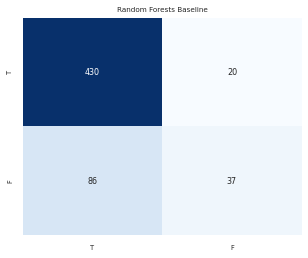

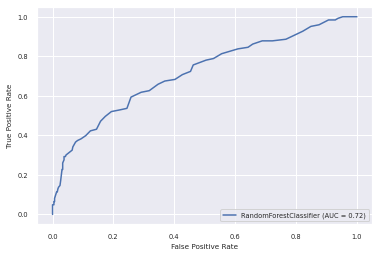

This is the starting index: 574 of patient 1
0.7360515021459227
[([0], 1, array([0.33, 0.67])), ([0], 1, array([0.38, 0.62])), ([0], 0, array([0.72, 0.28])), ([0], 1, array([0.39, 0.61])), ([0], 1, array([0.41, 0.59])), ([0], 0, array([0.74, 0.26])), ([1], 1, array([0.37, 0.63])), ([0], 0, array([0.56, 0.44])), ([0], 0, array([0.57, 0.43])), ([0], 0, array([0.68, 0.32])), ([0], 0, array([0.74, 0.26])), ([0], 1, array([0.42, 0.58])), ([1], 0, array([0.53, 0.47])), ([0], 0, array([0.51, 0.49])), ([0], 0, array([0.75, 0.25])), ([0], 0, array([0.61, 0.39])), ([0], 0, array([0.52, 0.48])), ([0], 0, array([0.56, 0.44])), ([1], 0, array([0.64, 0.36])), ([0], 0, array([0.65, 0.35])), ([1], 1, array([0.09, 0.91])), ([0], 0, array([0.65, 0.35])), ([1], 1, array([0.25, 0.75])), ([0], 0, array([0.77, 0.23])), ([1], 0, array([0.57, 0.43])), ([0], 0, array([0.73, 0.27])), ([0], 0, array([0.71, 0.29])), ([0], 0, array([0.63, 0.37])), ([0], 0, array([0.83, 0.17])), ([1], 1, array([0.15, 0.85])), ([1],

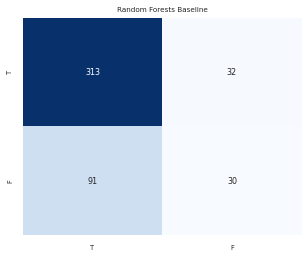

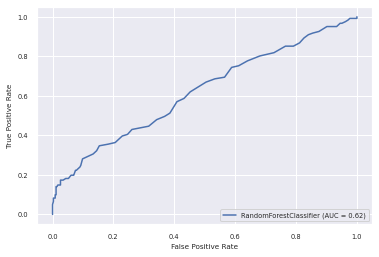

This is the starting index: 1041 of patient 2
0.31399317406143346
[([1], 1, array([0.32, 0.68])), ([0], 1, array([0.46, 0.54])), ([0], 1, array([0.47, 0.53])), ([1], 1, array([0.08, 0.92])), ([0], 1, array([0.45, 0.55])), ([0], 0, array([0.52, 0.48])), ([0], 1, array([0.42, 0.58])), ([1], 1, array([0.25, 0.75])), ([1], 1, array([0.43, 0.57])), ([1], 1, array([0.38, 0.62])), ([1], 1, array([0.28, 0.72])), ([1], 1, array([0.44, 0.56])), ([1], 1, array([0.45, 0.55])), ([0], 1, array([0.43, 0.57])), ([1], 0, array([0.56, 0.44])), ([1], 1, array([0.21, 0.79])), ([0], 1, array([0.39, 0.61])), ([0], 1, array([0.23, 0.77])), ([0], 1, array([0.33, 0.67])), ([0], 0, array([0.61, 0.39])), ([0], 1, array([0.18, 0.82])), ([0], 1, array([0.36, 0.64])), ([0], 1, array([0.37, 0.63])), ([0], 1, array([0.14, 0.86])), ([0], 1, array([0.38, 0.62])), ([0], 1, array([0.06, 0.94])), ([0], 1, array([0.48, 0.52])), ([0], 1, array([0.19, 0.81])), ([0], 1, array([0.16, 0.84])), ([0], 1, array([0.43, 0.57])), ([0

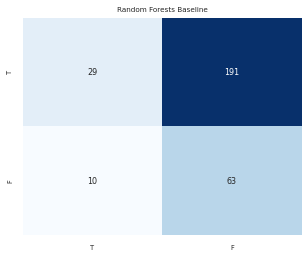

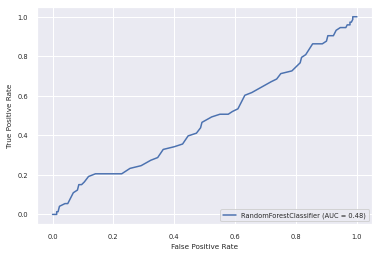

This is the starting index: 1335 of patient 3
0.6772486772486772
[([0], 0, array([0.52, 0.48])), ([1], 0, array([0.56, 0.44])), ([1], 1, array([0.39, 0.61])), ([1], 1, array([0.3, 0.7])), ([1], 1, array([0.18, 0.82])), ([1], 0, array([0.51, 0.49])), ([1], 1, array([0.41, 0.59])), ([0], 1, array([0.39, 0.61])), ([0], 0, array([0.61, 0.39])), ([0], 0, array([0.66, 0.34])), ([0], 1, array([0.46, 0.54])), ([0], 0, array([0.82, 0.18])), ([0], 0, array([0.64, 0.36])), ([1], 0, array([0.74, 0.26])), ([0], 0, array([0.64, 0.36])), ([0], 1, array([0.42, 0.58])), ([0], 0, array([0.61, 0.39])), ([0], 1, array([0.11, 0.89])), ([0], 0, array([0.61, 0.39])), ([0], 0, array([0.55, 0.45])), ([0], 0, array([0.64, 0.36])), ([0], 1, array([0.47, 0.53])), ([0], 1, array([0.45, 0.55])), ([0], 0, array([0.76, 0.24])), ([0], 0, array([0.77, 0.23])), ([0], 0, array([0.63, 0.37])), ([0], 1, array([0.47, 0.53])), ([0], 0, array([0.74, 0.26])), ([0], 1, array([0.46, 0.54])), ([1], 0, array([0.6, 0.4])), ([0], 1,

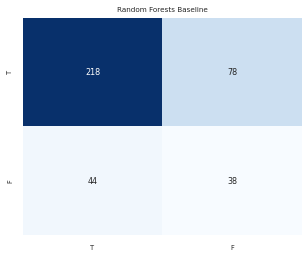

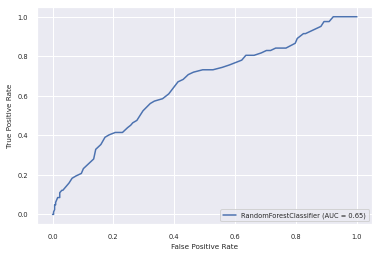

This is the starting index: 1714 of patient 4
0.43853820598006643
[([1], 1, array([0.46, 0.54])), ([1], 0, array([0.53, 0.47])), ([1], 0, array([0.6, 0.4])), ([1], 1, array([0.37, 0.63])), ([1], 1, array([0.32, 0.68])), ([1], 0, array([0.56, 0.44])), ([1], 0, array([0.6, 0.4])), ([1], 0, array([0.57, 0.43])), ([1], 0, array([0.63, 0.37])), ([1], 0, array([0.69, 0.31])), ([1], 0, array([0.52, 0.48])), ([1], 1, array([0.46, 0.54])), ([1], 0, array([0.52, 0.48])), ([1], 0, array([0.6, 0.4])), ([1], 1, array([0.39, 0.61])), ([1], 1, array([0.32, 0.68])), ([1], 1, array([0.3, 0.7])), ([1], 0, array([0.53, 0.47])), ([1], 1, array([0.37, 0.63])), ([1], 1, array([0.31, 0.69])), ([1], 1, array([0.41, 0.59])), ([1], 1, array([0.18, 0.82])), ([1], 0, array([0.5, 0.5])), ([1], 1, array([0.38, 0.62])), ([1], 1, array([0.43, 0.57])), ([1], 1, array([0.43, 0.57])), ([1], 1, array([0.46, 0.54])), ([1], 0, array([0.59, 0.41])), ([1], 1, array([0.45, 0.55])), ([1], 1, array([0.49, 0.51])), ([1], 0, arra

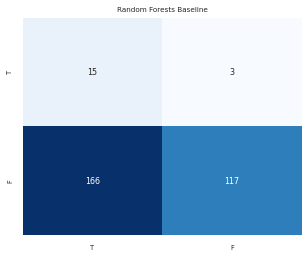

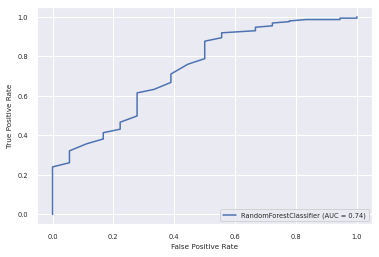

This is the starting index: 2016 of patient 5
0.4434589800443459
[([0], 0, array([0.67, 0.33])), ([0], 0, array([0.62, 0.38])), ([0], 0, array([0.83, 0.17])), ([0], 0, array([0.78, 0.22])), ([0], 0, array([0.64, 0.36])), ([0], 0, array([0.92, 0.08])), ([1], 0, array([0.89, 0.11])), ([1], 0, array([0.84, 0.16])), ([1], 0, array([0.75, 0.25])), ([1], 0, array([0.67, 0.33])), ([0], 0, array([0.78, 0.22])), ([1], 0, array([0.79, 0.21])), ([0], 0, array([0.64, 0.36])), ([1], 0, array([0.6, 0.4])), ([1], 0, array([0.67, 0.33])), ([1], 0, array([0.81, 0.19])), ([1], 0, array([0.75, 0.25])), ([1], 0, array([0.8, 0.2])), ([1], 0, array([0.73, 0.27])), ([1], 0, array([0.77, 0.23])), ([1], 1, array([0.03, 0.97])), ([1], 0, array([0.65, 0.35])), ([1], 0, array([0.87, 0.13])), ([1], 0, array([0.67, 0.33])), ([1], 0, array([0.88, 0.12])), ([1], 0, array([0.68, 0.32])), ([1], 1, array([0.27, 0.73])), ([1], 0, array([0.71, 0.29])), ([1], 0, array([0.82, 0.18])), ([1], 0, array([0.53, 0.47])), ([1], 0,

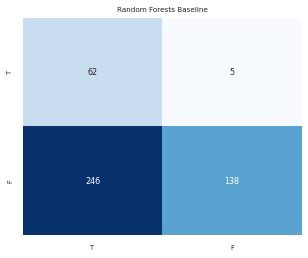

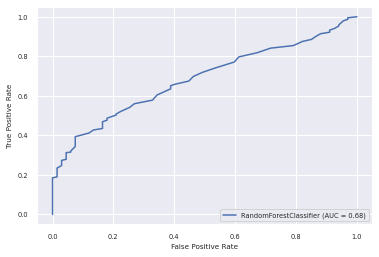

This is the starting index: 2468 of patient 6
0.5511811023622047
[([1], 1, array([0.36, 0.64])), ([1], 1, array([0.18, 0.82])), ([1], 1, array([0.4, 0.6])), ([1], 0, array([0.73, 0.27])), ([1], 0, array([0.59, 0.41])), ([1], 1, array([0.32, 0.68])), ([1], 1, array([0.22, 0.78])), ([1], 0, array([0.8, 0.2])), ([1], 0, array([0.53, 0.47])), ([1], 0, array([0.75, 0.25])), ([0], 0, array([0.87, 0.13])), ([1], 1, array([0.2, 0.8])), ([1], 0, array([0.68, 0.32])), ([1], 1, array([0.36, 0.64])), ([1], 1, array([0.47, 0.53])), ([1], 1, array([0.22, 0.78])), ([1], 1, array([0.1, 0.9])), ([1], 1, array([0.25, 0.75])), ([1], 1, array([0.27, 0.73])), ([0], 0, array([0.72, 0.28])), ([1], 0, array([0.66, 0.34])), ([1], 0, array([0.82, 0.18])), ([1], 1, array([0.38, 0.62])), ([1], 1, array([0.45, 0.55])), ([1], 1, array([0.27, 0.73])), ([1], 0, array([0.56, 0.44])), ([1], 0, array([0.86, 0.14])), ([0], 1, array([0.34, 0.66])), ([0], 0, array([0.78, 0.22])), ([1], 0, array([0.55, 0.45])), ([1], 0, arr

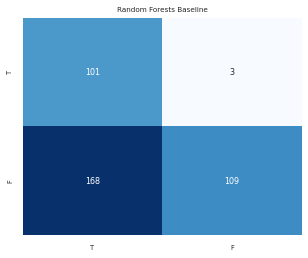

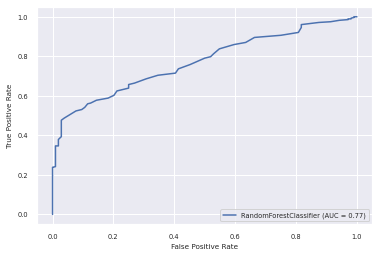

This is the starting index: 2850 of patient 7
0.8350515463917526
[([0], 0, array([0.5, 0.5])), ([0], 0, array([0.84, 0.16])), ([0], 0, array([0.79, 0.21])), ([0], 0, array([0.53, 0.47])), ([0], 0, array([0.63, 0.37])), ([0], 0, array([0.67, 0.33])), ([0], 0, array([0.78, 0.22])), ([0], 0, array([0.77, 0.23])), ([0], 0, array([0.73, 0.27])), ([0], 0, array([0.67, 0.33])), ([0], 0, array([0.78, 0.22])), ([0], 0, array([0.84, 0.16])), ([0], 1, array([0.21, 0.79])), ([0], 1, array([0.36, 0.64])), ([0], 0, array([0.58, 0.42])), ([0], 0, array([0.93, 0.07])), ([0], 0, array([0.82, 0.18])), ([0], 0, array([0.72, 0.28])), ([0], 0, array([0.79, 0.21])), ([0], 0, array([0.67, 0.33])), ([0], 0, array([0.66, 0.34])), ([0], 0, array([0.88, 0.12])), ([0], 0, array([0.59, 0.41])), ([0], 0, array([0.53, 0.47])), ([0], 0, array([0.85, 0.15])), ([0], 0, array([0.68, 0.32])), ([0], 0, array([0.72, 0.28])), ([0], 0, array([0.79, 0.21])), ([0], 1, array([0.49, 0.51])), ([0], 0, array([0.58, 0.42])), ([1], 

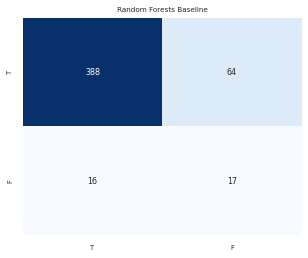

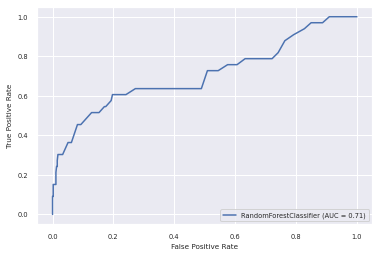

This is the starting index: 3336 of patient 8
0.7231833910034602
[([1], 0, array([0.69, 0.31])), ([1], 1, array([0.32, 0.68])), ([0], 0, array([0.68, 0.32])), ([1], 0, array([0.71, 0.29])), ([1], 1, array([0.42, 0.58])), ([1], 1, array([0.3, 0.7])), ([1], 0, array([0.5, 0.5])), ([1], 1, array([0.12, 0.88])), ([1], 1, array([0.38, 0.62])), ([1], 1, array([0.16, 0.84])), ([0], 0, array([0.52, 0.48])), ([1], 0, array([0.54, 0.46])), ([0], 0, array([0.76, 0.24])), ([1], 1, array([0.39, 0.61])), ([1], 1, array([0.4, 0.6])), ([0], 0, array([0.77, 0.23])), ([0], 0, array([0.6, 0.4])), ([1], 0, array([0.74, 0.26])), ([1], 1, array([0.11, 0.89])), ([1], 0, array([0.62, 0.38])), ([1], 1, array([0.29, 0.71])), ([0], 0, array([0.54, 0.46])), ([1], 1, array([0.19, 0.81])), ([0], 0, array([0.67, 0.33])), ([1], 1, array([0.26, 0.74])), ([0], 1, array([0.48, 0.52])), ([0], 0, array([0.7, 0.3])), ([0], 0, array([0.53, 0.47])), ([0], 0, array([0.68, 0.32])), ([1], 1, array([0.47, 0.53])), ([1], 0, array

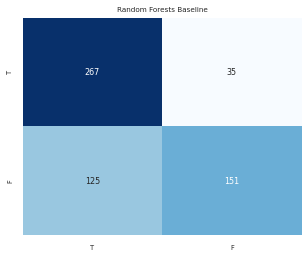

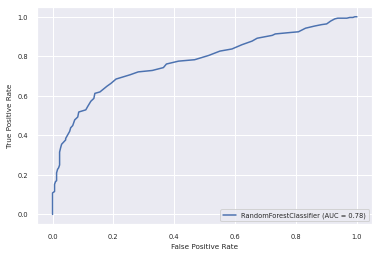

This is the starting index: 3915 of patient 9
0.5607142857142857
[([1], 1, array([0.24, 0.76])), ([1], 1, array([0.46, 0.54])), ([1], 1, array([0.48, 0.52])), ([1], 1, array([0.46, 0.54])), ([1], 1, array([0.38, 0.62])), ([1], 1, array([0.23, 0.77])), ([1], 0, array([0.7, 0.3])), ([1], 0, array([0.7, 0.3])), ([1], 1, array([0.44, 0.56])), ([1], 0, array([0.57, 0.43])), ([1], 1, array([0.27, 0.73])), ([1], 0, array([0.5, 0.5])), ([1], 1, array([0.35, 0.65])), ([1], 1, array([0.47, 0.53])), ([1], 0, array([0.59, 0.41])), ([1], 0, array([0.51, 0.49])), ([1], 1, array([0.41, 0.59])), ([1], 1, array([0.39, 0.61])), ([1], 0, array([0.55, 0.45])), ([1], 1, array([0.49, 0.51])), ([1], 1, array([0.35, 0.65])), ([1], 0, array([0.59, 0.41])), ([1], 0, array([0.62, 0.38])), ([1], 0, array([0.53, 0.47])), ([1], 0, array([0.53, 0.47])), ([0], 1, array([0.4, 0.6])), ([0], 1, array([0.36, 0.64])), ([1], 1, array([0.3, 0.7])), ([1], 0, array([0.51, 0.49])), ([1], 1, array([0.27, 0.73])), ([1], 1, array

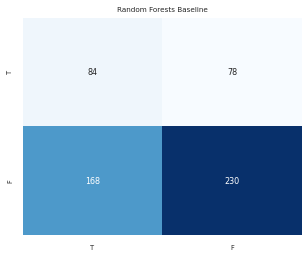

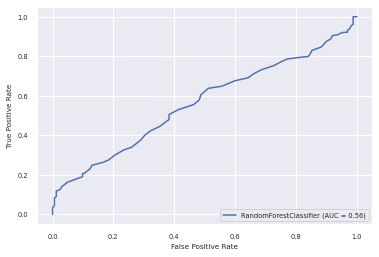

This is the starting index: 4476 of patient 10
0.9035250463821892
[([0], 0, array([0.6, 0.4])), ([0], 0, array([0.64, 0.36])), ([0], 0, array([0.69, 0.31])), ([0], 0, array([0.5, 0.5])), ([0], 0, array([0.66, 0.34])), ([0], 0, array([0.69, 0.31])), ([1], 0, array([0.5, 0.5])), ([1], 0, array([0.67, 0.33])), ([0], 0, array([0.76, 0.24])), ([0], 0, array([0.73, 0.27])), ([1], 1, array([0.41, 0.59])), ([1], 1, array([0.41, 0.59])), ([1], 0, array([0.64, 0.36])), ([0], 0, array([0.81, 0.19])), ([0], 0, array([0.72, 0.28])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.83, 0.17])), ([0], 0, array([0.85, 0.15])), ([1], 1, array([0.27, 0.73])), ([0], 0, array([0.61, 0.39])), ([1], 0, array([0.79, 0.21])), ([0], 0, array([0.88, 0.12])), ([0], 0, array([0.69, 0.31])), ([0], 0, array([0.75, 0.25])), ([0], 0, array([0.87, 0.13])), ([1], 0, array([0.52, 0.48])), ([0], 0, array([0.72, 0.28])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.67, 0.33])), ([0], 0, array([0.76, 0.24])), ([0], 0, arra

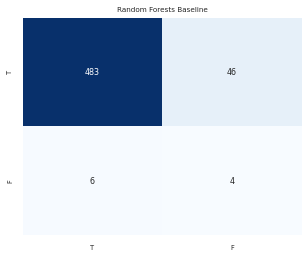

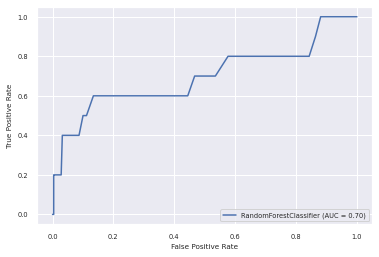

This is the starting index: 5016 of patient 11
0.7445887445887446
[([0], 0, array([0.61, 0.39])), ([0], 0, array([0.7, 0.3])), ([0], 0, array([0.84, 0.16])), ([0], 0, array([0.81, 0.19])), ([0], 0, array([0.68, 0.32])), ([0], 0, array([0.84, 0.16])), ([0], 0, array([0.61, 0.39])), ([0], 0, array([0.75, 0.25])), ([0], 0, array([0.61, 0.39])), ([0], 0, array([0.84, 0.16])), ([0], 0, array([0.78, 0.22])), ([0], 0, array([0.7, 0.3])), ([0], 0, array([0.72, 0.28])), ([1], 0, array([0.52, 0.48])), ([0], 0, array([0.67, 0.33])), ([1], 0, array([0.72, 0.28])), ([0], 0, array([0.62, 0.38])), ([0], 0, array([0.66, 0.34])), ([0], 0, array([0.88, 0.12])), ([1], 0, array([0.97, 0.03])), ([0], 0, array([0.77, 0.23])), ([0], 0, array([0.78, 0.22])), ([0], 0, array([0.89, 0.11])), ([0], 0, array([0.78, 0.22])), ([1], 0, array([0.54, 0.46])), ([0], 0, array([0.82, 0.18])), ([1], 0, array([0.89, 0.11])), ([1], 1, array([0.07, 0.93])), ([0], 0, array([0.77, 0.23])), ([0], 0, array([0.69, 0.31])), ([0], 0

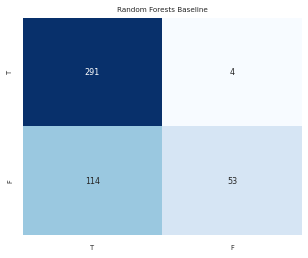

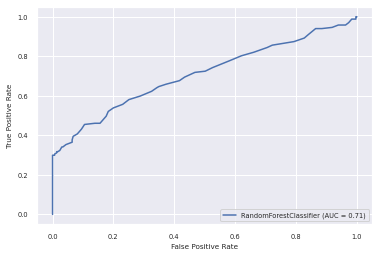

This is the starting index: 5479 of patient 12
0.3176470588235294
[([0], 1, array([0.41, 0.59])), ([0], 1, array([0.39, 0.61])), ([0], 1, array([0.39, 0.61])), ([0], 1, array([0.36, 0.64])), ([0], 1, array([0.48, 0.52])), ([0], 1, array([0.19, 0.81])), ([0], 1, array([0.4, 0.6])), ([0], 1, array([0.41, 0.59])), ([0], 1, array([0.34, 0.66])), ([0], 1, array([0.49, 0.51])), ([0], 1, array([0.22, 0.78])), ([0], 1, array([0.35, 0.65])), ([0], 1, array([0.4, 0.6])), ([0], 0, array([0.58, 0.42])), ([0], 1, array([0.13, 0.87])), ([0], 1, array([0.24, 0.76])), ([0], 1, array([0.47, 0.53])), ([0], 0, array([0.58, 0.42])), ([0], 1, array([0.46, 0.54])), ([0], 1, array([0.32, 0.68])), ([0], 1, array([0.45, 0.55])), ([0], 1, array([0.37, 0.63])), ([0], 1, array([0.35, 0.65])), ([0], 1, array([0.27, 0.73])), ([0], 1, array([0.35, 0.65])), ([0], 1, array([0.3, 0.7])), ([0], 1, array([0.48, 0.52])), ([0], 0, array([0.61, 0.39])), ([0], 1, array([0.44, 0.56])), ([0], 1, array([0.48, 0.52])), ([0], 0, 

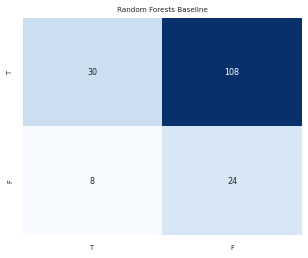

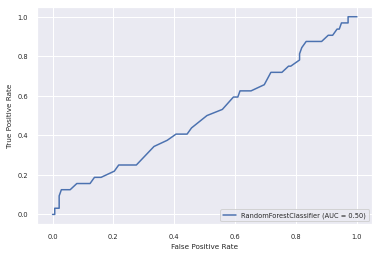

<function matplotlib.pyplot.show>

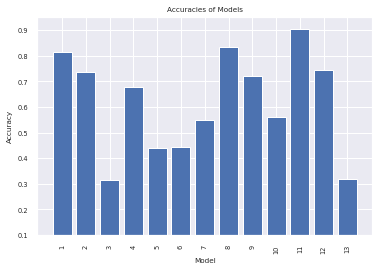

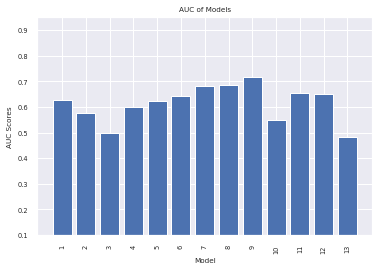

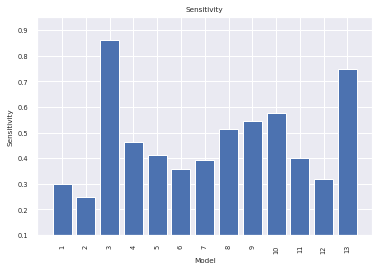

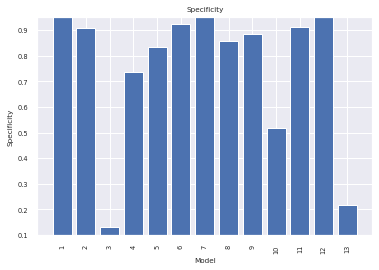

In [15]:
Accuracy = []
auc = []
sensitivity = []
specificity = []

clf = RandomForestClassifier()

for i in range(0,13):
    test, train, test_class, train_class = leave_one_out(df,i)
    clf.fit(train, train_class.ravel())

    y_predicted = clf.predict(test)
    print(metrics.accuracy_score(test_class,y_predicted))
        # print("Random Forest:\n",metrics.classification_report(test_class,y_predicted)) # Classification report
    Accuracy.append(metrics.accuracy_score(test_class,y_predicted))
    auc.append(metrics.roc_auc_score(test_class,y_predicted))
    mcm = confusion_matrix(test_class,y_predicted)
    tn = mcm[0, 0]
    tp = mcm[1, 1]
    fn = mcm[1, 0]
    fp = mcm[0, 1]
    sensitivity.append(tp / (tp + fn))
    specificity.append(tn / (tn + fp))
    pred = clf.predict_proba(test)
    result = [*zip(test_class.tolist(), y_predicted, pred)]
    print(result) 
    report = metrics.classification_report(test_class.tolist(), y_predicted)
    matrix = metrics.confusion_matrix(test_class.tolist(),y_predicted)   

    fig, (ax1) = plt.subplots(1, figsize=(5, 4))


    df_cm1 = pd.DataFrame(matrix, range(2), range(2))
    sn.set(font_scale=0.6) # for label size
    sn.heatmap(df_cm1, annot=True,annot_kws={"size": 8}, fmt='g', cmap='Blues', cbar= False, xticklabels=x_axis_labels, yticklabels=y_axis_labels, ax = ax1) # font size


    ax1.set_title('Random Forests Baseline')

    plt.show()
    metrics.plot_roc_curve(clf, test, test_class.tolist())  # doctest: +SKIP
    plt.show()

Model=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13']

Index = [1,2,3,4,5,6,7,8,9,10,11,12,13]
fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,Accuracy)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Accuracy')
plt.xlabel('Model')
plt.title('Accuracies of Models')
plt.show


fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,auc)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('AUC Scores')
plt.xlabel('Model')
plt.title('AUC of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,sensitivity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Sensitivity')
plt.xlabel('Model')
plt.title('Sensitivity')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,specificity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Specificity')
plt.xlabel('Model')
plt.title('Specificity')
plt.show


#### GridSearch

In [ ]:
parameters = {
    'n_estimators'      : [320,330,340],
    'max_depth'         : [8, 9, 10, 11, 12],
    'random_state'      : [0],
    #'max_features': ['auto'],
    #'criterion' :['gini']
}


for i in range(0,13):
    test, train, test_class, train_class = leave_one_out(df,i)
    search = GridSearchCV(RandomForestClassifier(), parameters, cv=10, n_jobs=-1)
    search.fit(train, train_class.ravel())

    print(search.score(train, train_class.ravel()))
    print(search.best_params_)

This is the starting index: 0 of patient 0
0.9493795548552295
{'max_depth': 11, 'n_estimators': 320, 'random_state': 0}
This is the starting index: 574 of patient 1
0.9423225308641975
{'max_depth': 11, 'n_estimators': 340, 'random_state': 0}
This is the starting index: 1041 of patient 2
0.9406384170244539
{'max_depth': 11, 'n_estimators': 330, 'random_state': 0}
This is the starting index: 1335 of patient 3
0.904969650986343
{'max_depth': 10, 'n_estimators': 320, 'random_state': 0}
This is the starting index: 1714 of patient 4
0.9689661618994204
{'max_depth': 12, 'n_estimators': 320, 'random_state': 0}
This is the starting index: 2016 of patient 5
0.9309482592806309
{'max_depth': 11, 'n_estimators': 320, 'random_state': 0}
This is the starting index: 2468 of patient 6
0.9599544505598785
{'max_depth': 12, 'n_estimators': 320, 'random_state': 0}
This is the starting index: 2850 of patient 7
0.9517909002904162
{'max_depth': 11, 'n_estimators': 330, 'random_state': 0}
This is the starting 

This is the starting index: 0 of patient 0
0.8045375218150087
[([1], 0, array([0.57284126, 0.42715874])), ([1], 1, array([0.48932682, 0.51067318])), ([0], 1, array([0.39420834, 0.60579166])), ([1], 0, array([0.80035357, 0.19964643])), ([1], 1, array([0.23235413, 0.76764587])), ([0], 0, array([0.83932566, 0.16067434])), ([1], 0, array([0.68514769, 0.31485231])), ([0], 0, array([0.54590143, 0.45409857])), ([1], 1, array([0.27859981, 0.72140019])), ([0], 0, array([0.56782384, 0.43217616])), ([0], 0, array([0.63907165, 0.36092835])), ([1], 0, array([0.51124361, 0.48875639])), ([1], 0, array([0.63642427, 0.36357573])), ([0], 0, array([0.66801869, 0.33198131])), ([1], 1, array([0.37616346, 0.62383654])), ([1], 1, array([0.34833366, 0.65166634])), ([1], 0, array([0.5043171, 0.4956829])), ([1], 0, array([0.80167884, 0.19832116])), ([1], 0, array([0.57717741, 0.42282259])), ([1], 1, array([0.33865695, 0.66134305])), ([0], 0, array([0.65232985, 0.34767015])), ([1], 0, array([0.80705377, 0.192946

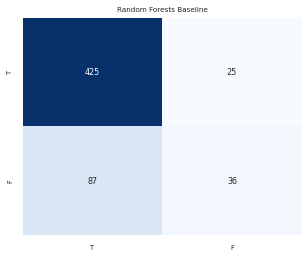

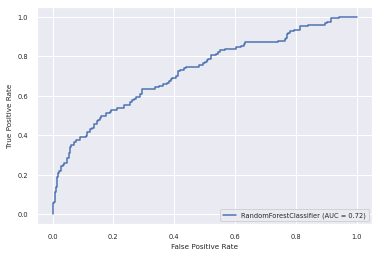

This is the starting index: 574 of patient 1
0.7424892703862661
[([0], 1, array([0.38609686, 0.61390314])), ([0], 1, array([0.3780664, 0.6219336])), ([0], 0, array([0.76667559, 0.23332441])), ([0], 1, array([0.40070886, 0.59929114])), ([0], 1, array([0.47012699, 0.52987301])), ([0], 0, array([0.72528135, 0.27471865])), ([1], 1, array([0.42962028, 0.57037972])), ([0], 0, array([0.52661115, 0.47338885])), ([0], 0, array([0.63352799, 0.36647201])), ([0], 0, array([0.76645393, 0.23354607])), ([0], 0, array([0.75103238, 0.24896762])), ([0], 1, array([0.45867361, 0.54132639])), ([1], 1, array([0.49933973, 0.50066027])), ([0], 0, array([0.55501917, 0.44498083])), ([0], 0, array([0.75374421, 0.24625579])), ([0], 0, array([0.64709501, 0.35290499])), ([0], 0, array([0.54636065, 0.45363935])), ([0], 0, array([0.53556842, 0.46443158])), ([1], 0, array([0.63398174, 0.36601826])), ([0], 0, array([0.68286169, 0.31713831])), ([1], 1, array([0.1848597, 0.8151403])), ([0], 0, array([0.72250524, 0.277494

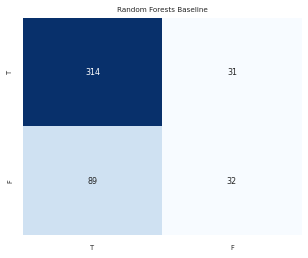

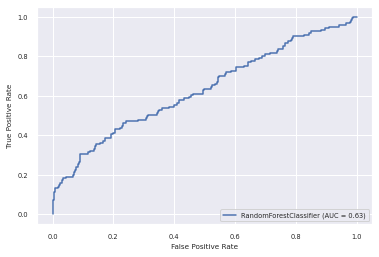

This is the starting index: 1041 of patient 2
0.28668941979522183
[([1], 1, array([0.3362732, 0.6637268])), ([0], 0, array([0.50574705, 0.49425295])), ([0], 1, array([0.41812298, 0.58187702])), ([1], 1, array([0.11949046, 0.88050954])), ([0], 1, array([0.41627077, 0.58372923])), ([0], 1, array([0.40414508, 0.59585492])), ([0], 1, array([0.37136166, 0.62863834])), ([1], 1, array([0.1530973, 0.8469027])), ([1], 1, array([0.40592624, 0.59407376])), ([1], 1, array([0.33474552, 0.66525448])), ([1], 1, array([0.31990179, 0.68009821])), ([1], 1, array([0.43217575, 0.56782425])), ([1], 1, array([0.3395987, 0.6604013])), ([0], 1, array([0.46059582, 0.53940418])), ([1], 1, array([0.48925017, 0.51074983])), ([1], 1, array([0.30150164, 0.69849836])), ([0], 1, array([0.28495718, 0.71504282])), ([0], 1, array([0.2826461, 0.7173539])), ([0], 1, array([0.2229137, 0.7770863])), ([0], 0, array([0.53960554, 0.46039446])), ([0], 1, array([0.1610194, 0.8389806])), ([0], 1, array([0.29291169, 0.70708831])),

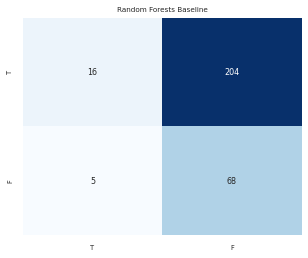

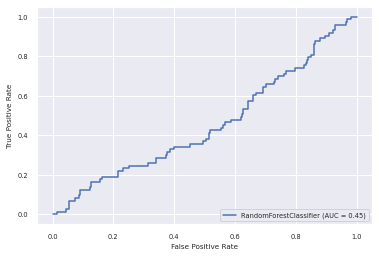

This is the starting index: 1335 of patient 3
0.6693121693121693
[([0], 0, array([0.66189746, 0.33810254])), ([1], 0, array([0.5814688, 0.4185312])), ([1], 1, array([0.3381405, 0.6618595])), ([1], 1, array([0.35180941, 0.64819059])), ([1], 1, array([0.20617218, 0.79382782])), ([1], 0, array([0.5755832, 0.4244168])), ([1], 1, array([0.48468971, 0.51531029])), ([0], 1, array([0.43302028, 0.56697972])), ([0], 0, array([0.64957538, 0.35042462])), ([0], 0, array([0.62211073, 0.37788927])), ([0], 1, array([0.46081044, 0.53918956])), ([0], 0, array([0.76453779, 0.23546221])), ([0], 0, array([0.50643374, 0.49356626])), ([1], 0, array([0.69750097, 0.30249903])), ([0], 0, array([0.63647793, 0.36352207])), ([0], 0, array([0.5008197, 0.4991803])), ([0], 0, array([0.63048126, 0.36951874])), ([0], 1, array([0.21249273, 0.78750727])), ([0], 0, array([0.61983848, 0.38016152])), ([0], 0, array([0.55132821, 0.44867179])), ([0], 0, array([0.68115657, 0.31884343])), ([0], 1, array([0.4403967, 0.5596033]))

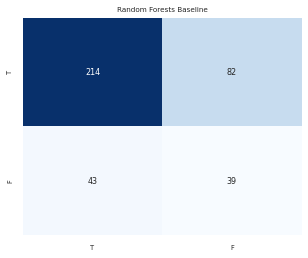

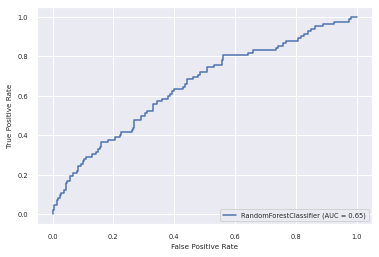

This is the starting index: 1714 of patient 4
0.46179401993355484
[([1], 1, array([0.47553184, 0.52446816])), ([1], 1, array([0.44384999, 0.55615001])), ([1], 0, array([0.59983563, 0.40016437])), ([1], 1, array([0.4223699, 0.5776301])), ([1], 1, array([0.42243396, 0.57756604])), ([1], 0, array([0.5440246, 0.4559754])), ([1], 0, array([0.56982791, 0.43017209])), ([1], 0, array([0.53080694, 0.46919306])), ([1], 0, array([0.6346555, 0.3653445])), ([1], 0, array([0.53625572, 0.46374428])), ([1], 0, array([0.54083996, 0.45916004])), ([1], 0, array([0.50379384, 0.49620616])), ([1], 1, array([0.45083321, 0.54916679])), ([1], 1, array([0.49786571, 0.50213429])), ([1], 1, array([0.43365646, 0.56634354])), ([1], 1, array([0.40600238, 0.59399762])), ([1], 1, array([0.39305444, 0.60694556])), ([1], 0, array([0.53536092, 0.46463908])), ([1], 1, array([0.41095152, 0.58904848])), ([1], 1, array([0.30375314, 0.69624686])), ([1], 1, array([0.42898217, 0.57101783])), ([1], 1, array([0.26893826, 0.731061

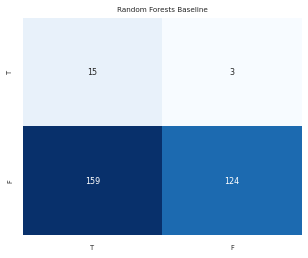

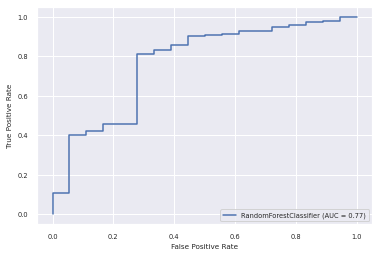

This is the starting index: 2016 of patient 5
0.4634146341463415
[([0], 0, array([0.61863472, 0.38136528])), ([0], 0, array([0.69653835, 0.30346165])), ([0], 0, array([0.80187737, 0.19812263])), ([0], 0, array([0.75088209, 0.24911791])), ([0], 0, array([0.72899765, 0.27100235])), ([0], 0, array([0.93282996, 0.06717004])), ([1], 0, array([0.81904668, 0.18095332])), ([1], 0, array([0.85568345, 0.14431655])), ([1], 0, array([0.77192836, 0.22807164])), ([1], 0, array([0.77780461, 0.22219539])), ([0], 0, array([0.73632465, 0.26367535])), ([1], 0, array([0.83139428, 0.16860572])), ([0], 0, array([0.62522001, 0.37477999])), ([1], 0, array([0.62836133, 0.37163867])), ([1], 0, array([0.77426725, 0.22573275])), ([1], 0, array([0.85841705, 0.14158295])), ([1], 0, array([0.76075581, 0.23924419])), ([1], 0, array([0.82743293, 0.17256707])), ([1], 0, array([0.76246173, 0.23753827])), ([1], 0, array([0.75981242, 0.24018758])), ([1], 1, array([0.12120373, 0.87879627])), ([1], 0, array([0.73682371, 0.2

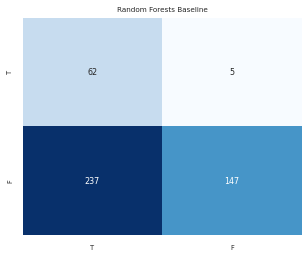

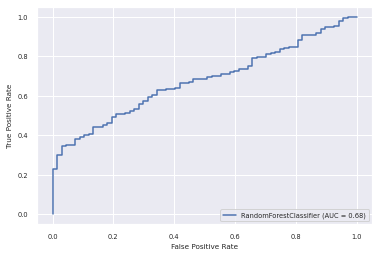

This is the starting index: 2468 of patient 6
0.5590551181102362
[([1], 1, array([0.45659288, 0.54340712])), ([1], 1, array([0.25285912, 0.74714088])), ([1], 1, array([0.40949976, 0.59050024])), ([1], 0, array([0.77139489, 0.22860511])), ([1], 0, array([0.66050863, 0.33949137])), ([1], 1, array([0.36091099, 0.63908901])), ([1], 1, array([0.18017979, 0.81982021])), ([1], 0, array([0.75813791, 0.24186209])), ([1], 0, array([0.60821022, 0.39178978])), ([1], 0, array([0.6964973, 0.3035027])), ([0], 0, array([0.88638767, 0.11361233])), ([1], 1, array([0.20742668, 0.79257332])), ([1], 0, array([0.65975799, 0.34024201])), ([1], 1, array([0.34225754, 0.65774246])), ([1], 0, array([0.56200546, 0.43799454])), ([1], 1, array([0.22170946, 0.77829054])), ([1], 1, array([0.10338822, 0.89661178])), ([1], 1, array([0.31443364, 0.68556636])), ([1], 1, array([0.34269724, 0.65730276])), ([0], 0, array([0.63011, 0.36989])), ([1], 0, array([0.57542819, 0.42457181])), ([1], 0, array([0.77160732, 0.22839268]

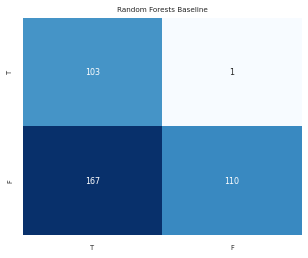

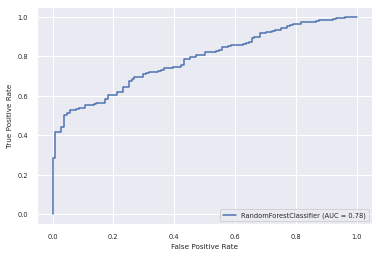

This is the starting index: 2850 of patient 7
0.843298969072165
[([0], 0, array([0.55643235, 0.44356765])), ([0], 0, array([0.82169784, 0.17830216])), ([0], 0, array([0.78141035, 0.21858965])), ([0], 0, array([0.5815307, 0.4184693])), ([0], 0, array([0.58906345, 0.41093655])), ([0], 0, array([0.68075202, 0.31924798])), ([0], 0, array([0.72662836, 0.27337164])), ([0], 0, array([0.76276875, 0.23723125])), ([0], 0, array([0.76961358, 0.23038642])), ([0], 0, array([0.80320235, 0.19679765])), ([0], 0, array([0.75546287, 0.24453713])), ([0], 0, array([0.87245248, 0.12754752])), ([0], 1, array([0.24125585, 0.75874415])), ([0], 1, array([0.36994347, 0.63005653])), ([0], 0, array([0.55363152, 0.44636848])), ([0], 0, array([0.85491918, 0.14508082])), ([0], 0, array([0.79365108, 0.20634892])), ([0], 0, array([0.72559484, 0.27440516])), ([0], 0, array([0.76559718, 0.23440282])), ([0], 0, array([0.66832454, 0.33167546])), ([0], 0, array([0.64483236, 0.35516764])), ([0], 0, array([0.8364718, 0.16352

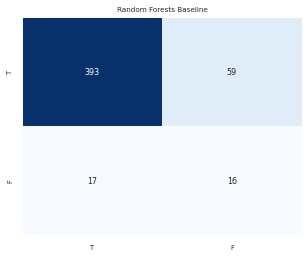

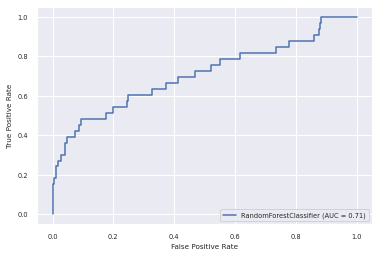

This is the starting index: 3336 of patient 8
0.740484429065744
[([1], 0, array([0.66264078, 0.33735922])), ([1], 1, array([0.36207367, 0.63792633])), ([0], 0, array([0.68099679, 0.31900321])), ([1], 0, array([0.67307235, 0.32692765])), ([1], 1, array([0.42428315, 0.57571685])), ([1], 1, array([0.30335812, 0.69664188])), ([1], 1, array([0.49392836, 0.50607164])), ([1], 1, array([0.21365565, 0.78634435])), ([1], 1, array([0.37961899, 0.62038101])), ([1], 1, array([0.31860078, 0.68139922])), ([0], 1, array([0.44337961, 0.55662039])), ([1], 1, array([0.42056582, 0.57943418])), ([0], 0, array([0.74684792, 0.25315208])), ([1], 1, array([0.38193903, 0.61806097])), ([1], 1, array([0.37898579, 0.62101421])), ([0], 0, array([0.76050049, 0.23949951])), ([0], 0, array([0.59902281, 0.40097719])), ([1], 0, array([0.71514932, 0.28485068])), ([1], 1, array([0.14301512, 0.85698488])), ([1], 0, array([0.64805129, 0.35194871])), ([1], 1, array([0.25230639, 0.74769361])), ([0], 0, array([0.60192136, 0.39

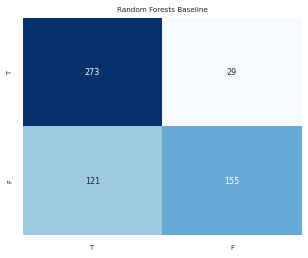

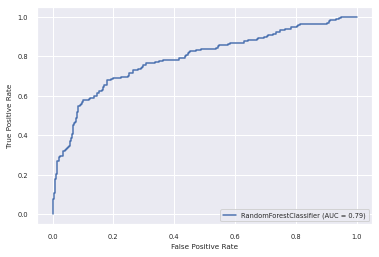

This is the starting index: 3915 of patient 9
0.5732142857142857
[([1], 1, array([0.28868546, 0.71131454])), ([1], 0, array([0.55944672, 0.44055328])), ([1], 1, array([0.48896791, 0.51103209])), ([1], 1, array([0.44097243, 0.55902757])), ([1], 1, array([0.40985503, 0.59014497])), ([1], 1, array([0.23717783, 0.76282217])), ([1], 0, array([0.72703997, 0.27296003])), ([1], 0, array([0.62882874, 0.37117126])), ([1], 1, array([0.45466183, 0.54533817])), ([1], 0, array([0.61001256, 0.38998744])), ([1], 1, array([0.21596995, 0.78403005])), ([1], 1, array([0.48724421, 0.51275579])), ([1], 1, array([0.31883324, 0.68116676])), ([1], 1, array([0.42069468, 0.57930532])), ([1], 0, array([0.52223004, 0.47776996])), ([1], 0, array([0.5878886, 0.4121114])), ([1], 1, array([0.47556146, 0.52443854])), ([1], 1, array([0.39819735, 0.60180265])), ([1], 1, array([0.49382208, 0.50617792])), ([1], 0, array([0.50733308, 0.49266692])), ([1], 1, array([0.35898099, 0.64101901])), ([1], 0, array([0.641646, 0.35835

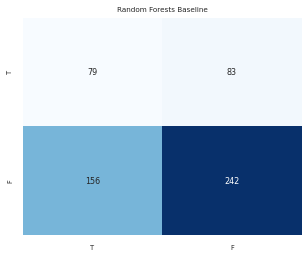

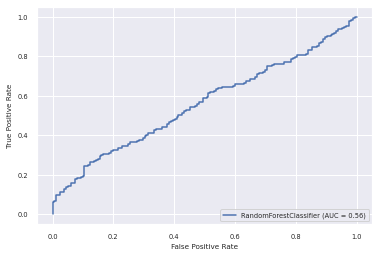

This is the starting index: 4476 of patient 10
0.8998144712430427
[([0], 0, array([0.61583309, 0.38416691])), ([0], 0, array([0.63361687, 0.36638313])), ([0], 0, array([0.67874862, 0.32125138])), ([0], 0, array([0.56415821, 0.43584179])), ([0], 0, array([0.71840118, 0.28159882])), ([0], 0, array([0.7607637, 0.2392363])), ([1], 1, array([0.40492647, 0.59507353])), ([1], 0, array([0.68572417, 0.31427583])), ([0], 0, array([0.72240132, 0.27759868])), ([0], 0, array([0.7962019, 0.2037981])), ([1], 1, array([0.38675962, 0.61324038])), ([1], 1, array([0.35303681, 0.64696319])), ([1], 0, array([0.61343425, 0.38656575])), ([0], 0, array([0.79195105, 0.20804895])), ([0], 0, array([0.73273345, 0.26726655])), ([0], 0, array([0.78555875, 0.21444125])), ([0], 0, array([0.76410071, 0.23589929])), ([0], 0, array([0.84843036, 0.15156964])), ([1], 1, array([0.28816897, 0.71183103])), ([0], 0, array([0.6087047, 0.3912953])), ([1], 0, array([0.78118471, 0.21881529])), ([0], 0, array([0.9154585, 0.0845415

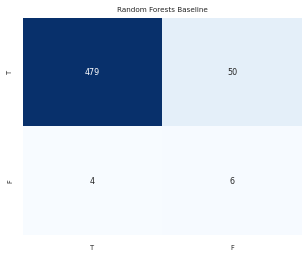

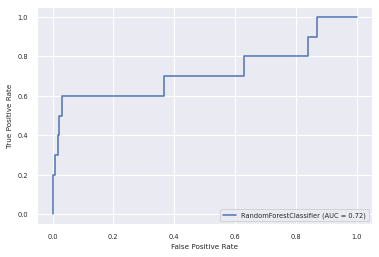

This is the starting index: 5016 of patient 11
0.7424242424242424
[([0], 0, array([0.65131557, 0.34868443])), ([0], 0, array([0.60907067, 0.39092933])), ([0], 0, array([0.83685995, 0.16314005])), ([0], 0, array([0.77378014, 0.22621986])), ([0], 0, array([0.5568519, 0.4431481])), ([0], 0, array([0.81640658, 0.18359342])), ([0], 1, array([0.49515424, 0.50484576])), ([0], 0, array([0.78146161, 0.21853839])), ([0], 0, array([0.74163867, 0.25836133])), ([0], 0, array([0.7592809, 0.2407191])), ([0], 0, array([0.72468116, 0.27531884])), ([0], 0, array([0.76026032, 0.23973968])), ([0], 0, array([0.77041258, 0.22958742])), ([1], 0, array([0.54994333, 0.45005667])), ([0], 0, array([0.69308248, 0.30691752])), ([1], 0, array([0.81068448, 0.18931552])), ([0], 0, array([0.58688672, 0.41311328])), ([0], 0, array([0.76567956, 0.23432044])), ([0], 0, array([0.82202092, 0.17797908])), ([1], 0, array([0.92994642, 0.07005358])), ([0], 0, array([0.80979145, 0.19020855])), ([0], 0, array([0.8277135, 0.17228

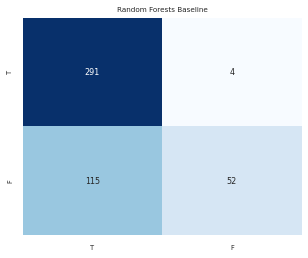

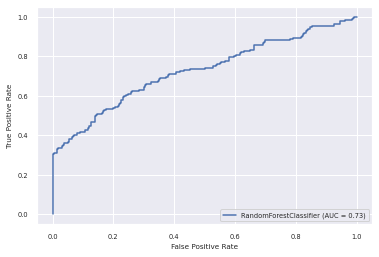

This is the starting index: 5479 of patient 12
0.2235294117647059
[([0], 1, array([0.36613328, 0.63386672])), ([0], 1, array([0.31153608, 0.68846392])), ([0], 1, array([0.31459495, 0.68540505])), ([0], 1, array([0.23198824, 0.76801176])), ([0], 1, array([0.35758474, 0.64241526])), ([0], 1, array([0.24468064, 0.75531936])), ([0], 1, array([0.34542682, 0.65457318])), ([0], 1, array([0.3254506, 0.6745494])), ([0], 1, array([0.31141018, 0.68858982])), ([0], 1, array([0.34527938, 0.65472062])), ([0], 1, array([0.2655577, 0.7344423])), ([0], 1, array([0.29506218, 0.70493782])), ([0], 1, array([0.32805702, 0.67194298])), ([0], 1, array([0.39014649, 0.60985351])), ([0], 1, array([0.14340797, 0.85659203])), ([0], 1, array([0.199135, 0.800865])), ([0], 1, array([0.3615104, 0.6384896])), ([0], 1, array([0.40696065, 0.59303935])), ([0], 1, array([0.37317034, 0.62682966])), ([0], 1, array([0.2786894, 0.7213106])), ([0], 1, array([0.37974812, 0.62025188])), ([0], 1, array([0.30523474, 0.69476526])),

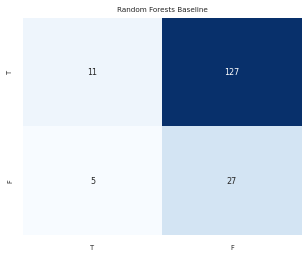

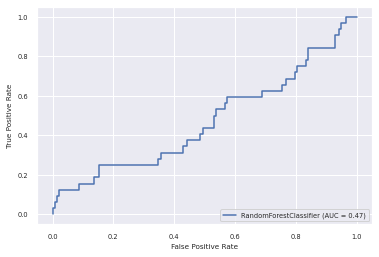

<function matplotlib.pyplot.show>

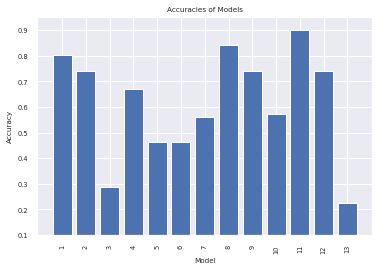

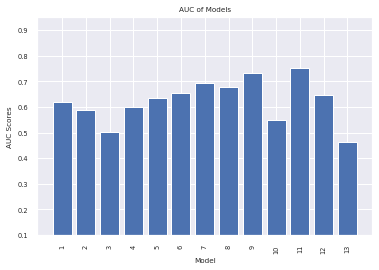

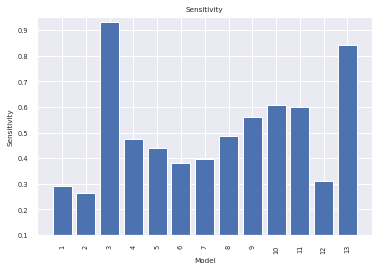

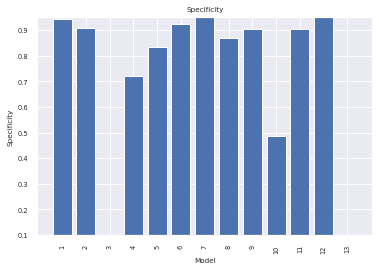

In [20]:
Accuracy = []
auc = []
sensitivity = []
specificity = []
clf = RandomForestClassifier(max_depth = 11, n_estimators= 320, random_state= 0)

for i in range(0,13):
    test, train, test_class, train_class = leave_one_out(df,i)
    clf.fit(train, train_class.ravel())

    y_predicted = clf.predict(test)
    print(metrics.accuracy_score(test_class,y_predicted))
        # print("Random Forest:\n",metrics.classification_report(test_class,y_predicted)) # Classification report
    Accuracy.append(metrics.accuracy_score(test_class,y_predicted))
    auc.append(metrics.roc_auc_score(test_class,y_predicted))
    mcm = confusion_matrix(test_class,y_predicted)
    tn = mcm[0, 0]
    tp = mcm[1, 1]
    fn = mcm[1, 0]
    fp = mcm[0, 1]
    sensitivity.append(tp / (tp + fn))
    specificity.append(tn / (tn + fp))
    pred = clf.predict_proba(test)
    result = [*zip(test_class.tolist(), y_predicted, pred)]
    print(result)
    report = metrics.classification_report(test_class.tolist(), y_predicted)
    matrix = metrics.confusion_matrix(test_class.tolist(),y_predicted)   

    fig, (ax1) = plt.subplots(1, figsize=(5, 4))


    df_cm1 = pd.DataFrame(matrix, range(2), range(2))
    sn.set(font_scale=0.6) # for label size
    sn.heatmap(df_cm1, annot=True,annot_kws={"size": 8}, fmt='g', cmap='Blues', cbar= False, xticklabels=x_axis_labels, yticklabels=y_axis_labels, ax = ax1) # font size


    ax1.set_title('Random Forests Baseline')

    plt.show()
    metrics.plot_roc_curve(clf, test, test_class.tolist())  # doctest: +SKIP
    plt.show()

Model=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13']

Index = [1,2,3,4,5,6,7,8,9,10,11,12,13]
fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,Accuracy)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Accuracy')
plt.xlabel('Model')
plt.title('Accuracies of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,auc)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('AUC Scores')
plt.xlabel('Model')
plt.title('AUC of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,sensitivity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Sensitivity')
plt.xlabel('Model')
plt.title('Sensitivity')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,specificity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Specificity')
plt.xlabel('Model')
plt.title('Specificity')
plt.show

#### Low Variance

This is the starting index: 0 of patient 0
0.806282722513089
[([1], 0, array([0.53, 0.47])), ([1], 0, array([0.51, 0.49])), ([0], 1, array([0.45, 0.55])), ([1], 0, array([0.74, 0.26])), ([1], 1, array([0.14, 0.86])), ([0], 0, array([0.8, 0.2])), ([1], 0, array([0.66, 0.34])), ([0], 0, array([0.53, 0.47])), ([1], 1, array([0.23, 0.77])), ([0], 0, array([0.68, 0.32])), ([0], 0, array([0.57, 0.43])), ([1], 0, array([0.51, 0.49])), ([1], 0, array([0.55, 0.45])), ([0], 0, array([0.55, 0.45])), ([1], 1, array([0.39, 0.61])), ([1], 1, array([0.32, 0.68])), ([1], 1, array([0.48, 0.52])), ([1], 0, array([0.77, 0.23])), ([1], 0, array([0.56, 0.44])), ([1], 1, array([0.37, 0.63])), ([0], 0, array([0.57, 0.43])), ([1], 0, array([0.81, 0.19])), ([1], 0, array([0.63, 0.37])), ([1], 1, array([0.3, 0.7])), ([0], 0, array([0.86, 0.14])), ([0], 0, array([0.65, 0.35])), ([1], 0, array([0.69, 0.31])), ([1], 1, array([0.47, 0.53])), ([0], 0, array([0.63, 0.37])), ([0], 0, array([0.74, 0.26])), ([0], 0, arr

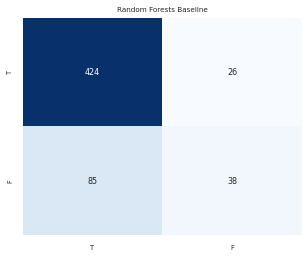

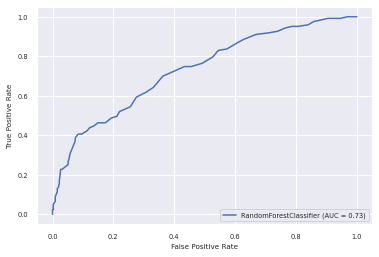

This is the starting index: 574 of patient 1
0.7339055793991416
[([0], 1, array([0.38, 0.62])), ([0], 1, array([0.3, 0.7])), ([0], 0, array([0.79, 0.21])), ([0], 1, array([0.38, 0.62])), ([0], 1, array([0.36, 0.64])), ([0], 0, array([0.64, 0.36])), ([1], 1, array([0.42, 0.58])), ([0], 0, array([0.51, 0.49])), ([0], 0, array([0.57, 0.43])), ([0], 0, array([0.79, 0.21])), ([0], 0, array([0.66, 0.34])), ([0], 1, array([0.49, 0.51])), ([1], 1, array([0.47, 0.53])), ([0], 0, array([0.53, 0.47])), ([0], 0, array([0.86, 0.14])), ([0], 0, array([0.61, 0.39])), ([0], 0, array([0.52, 0.48])), ([0], 0, array([0.61, 0.39])), ([1], 0, array([0.71, 0.29])), ([0], 0, array([0.63, 0.37])), ([1], 1, array([0.19, 0.81])), ([0], 0, array([0.73, 0.27])), ([1], 1, array([0.26, 0.74])), ([0], 0, array([0.78, 0.22])), ([1], 0, array([0.52, 0.48])), ([0], 0, array([0.75, 0.25])), ([0], 0, array([0.79, 0.21])), ([0], 0, array([0.7, 0.3])), ([0], 0, array([0.77, 0.23])), ([1], 1, array([0.12, 0.88])), ([1], 1, 

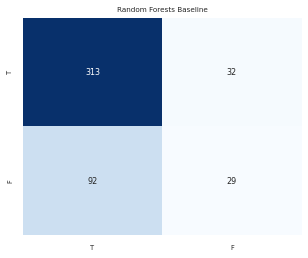

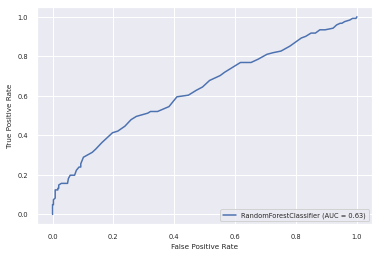

This is the starting index: 1041 of patient 2
0.26621160409556316
[([1], 1, array([0.35, 0.65])), ([0], 1, array([0.44, 0.56])), ([0], 1, array([0.42, 0.58])), ([1], 1, array([0.04, 0.96])), ([0], 1, array([0.38, 0.62])), ([0], 1, array([0.42, 0.58])), ([0], 1, array([0.49, 0.51])), ([1], 1, array([0.18, 0.82])), ([1], 1, array([0.42, 0.58])), ([1], 1, array([0.32, 0.68])), ([1], 1, array([0.27, 0.73])), ([1], 1, array([0.43, 0.57])), ([1], 1, array([0.37, 0.63])), ([0], 1, array([0.34, 0.66])), ([1], 0, array([0.56, 0.44])), ([1], 1, array([0.33, 0.67])), ([0], 1, array([0.28, 0.72])), ([0], 1, array([0.3, 0.7])), ([0], 1, array([0.27, 0.73])), ([0], 1, array([0.43, 0.57])), ([0], 1, array([0.2, 0.8])), ([0], 1, array([0.32, 0.68])), ([0], 1, array([0.42, 0.58])), ([0], 1, array([0.07, 0.93])), ([0], 1, array([0.4, 0.6])), ([0], 1, array([0.03, 0.97])), ([0], 1, array([0.48, 0.52])), ([0], 1, array([0.1, 0.9])), ([0], 1, array([0.11, 0.89])), ([0], 1, array([0.42, 0.58])), ([0], 1, ar

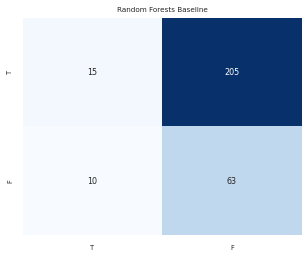

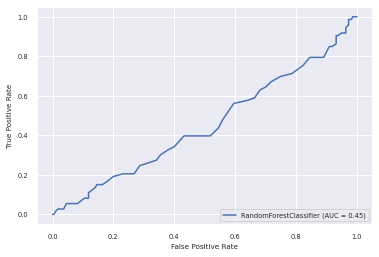

This is the starting index: 1335 of patient 3
0.6693121693121693
[([0], 0, array([0.73, 0.27])), ([1], 0, array([0.64, 0.36])), ([1], 1, array([0.32, 0.68])), ([1], 1, array([0.29, 0.71])), ([1], 1, array([0.16, 0.84])), ([1], 0, array([0.53, 0.47])), ([1], 1, array([0.42, 0.58])), ([0], 1, array([0.45, 0.55])), ([0], 0, array([0.64, 0.36])), ([0], 0, array([0.61, 0.39])), ([0], 0, array([0.53, 0.47])), ([0], 0, array([0.84, 0.16])), ([0], 0, array([0.6, 0.4])), ([1], 0, array([0.66, 0.34])), ([0], 0, array([0.64, 0.36])), ([0], 1, array([0.48, 0.52])), ([0], 0, array([0.58, 0.42])), ([0], 1, array([0.25, 0.75])), ([0], 0, array([0.64, 0.36])), ([0], 0, array([0.58, 0.42])), ([0], 0, array([0.69, 0.31])), ([0], 1, array([0.49, 0.51])), ([0], 0, array([0.53, 0.47])), ([0], 0, array([0.81, 0.19])), ([0], 0, array([0.81, 0.19])), ([0], 0, array([0.62, 0.38])), ([0], 1, array([0.43, 0.57])), ([0], 0, array([0.77, 0.23])), ([0], 1, array([0.45, 0.55])), ([1], 0, array([0.57, 0.43])), ([0], 

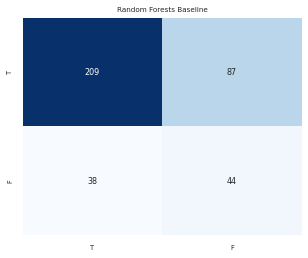

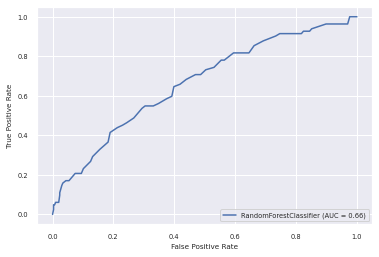

This is the starting index: 1714 of patient 4
0.4684385382059801
[([1], 1, array([0.45, 0.55])), ([1], 1, array([0.45, 0.55])), ([1], 0, array([0.6, 0.4])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.33, 0.67])), ([1], 0, array([0.63, 0.37])), ([1], 1, array([0.47, 0.53])), ([1], 0, array([0.65, 0.35])), ([1], 0, array([0.62, 0.38])), ([1], 0, array([0.54, 0.46])), ([1], 1, array([0.49, 0.51])), ([1], 1, array([0.49, 0.51])), ([1], 1, array([0.46, 0.54])), ([1], 0, array([0.6, 0.4])), ([1], 1, array([0.46, 0.54])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.32, 0.68])), ([1], 1, array([0.47, 0.53])), ([1], 1, array([0.33, 0.67])), ([1], 1, array([0.23, 0.77])), ([1], 1, array([0.33, 0.67])), ([1], 1, array([0.24, 0.76])), ([1], 1, array([0.39, 0.61])), ([1], 1, array([0.42, 0.58])), ([1], 1, array([0.36, 0.64])), ([1], 0, array([0.5, 0.5])), ([1], 0, array([0.54, 0.46])), ([1], 0, array([0.7, 0.3])), ([1], 0, array([0.52, 0.48])), ([1], 0, array([0.5, 0.5])), ([1], 0, array([0.

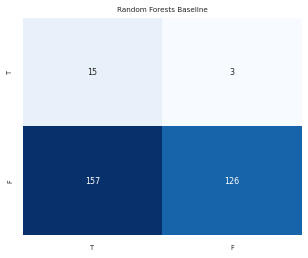

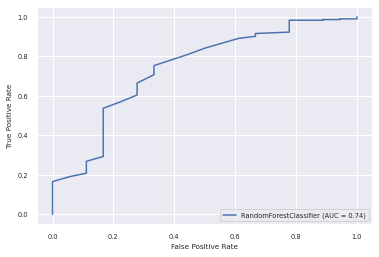

This is the starting index: 2016 of patient 5
0.4567627494456763
[([0], 0, array([0.64, 0.36])), ([0], 0, array([0.69, 0.31])), ([0], 0, array([0.78, 0.22])), ([0], 0, array([0.79, 0.21])), ([0], 0, array([0.64, 0.36])), ([0], 0, array([0.98, 0.02])), ([1], 0, array([0.75, 0.25])), ([1], 0, array([0.83, 0.17])), ([1], 0, array([0.75, 0.25])), ([1], 0, array([0.78, 0.22])), ([0], 0, array([0.72, 0.28])), ([1], 0, array([0.85, 0.15])), ([0], 0, array([0.66, 0.34])), ([1], 0, array([0.55, 0.45])), ([1], 0, array([0.73, 0.27])), ([1], 0, array([0.86, 0.14])), ([1], 0, array([0.7, 0.3])), ([1], 0, array([0.83, 0.17])), ([1], 0, array([0.7, 0.3])), ([1], 0, array([0.74, 0.26])), ([1], 1, array([0.1, 0.9])), ([1], 0, array([0.66, 0.34])), ([1], 0, array([0.85, 0.15])), ([1], 0, array([0.6, 0.4])), ([1], 0, array([0.83, 0.17])), ([1], 0, array([0.7, 0.3])), ([1], 1, array([0.18, 0.82])), ([1], 0, array([0.7, 0.3])), ([1], 0, array([0.81, 0.19])), ([1], 0, array([0.5, 0.5])), ([1], 0, array([0.

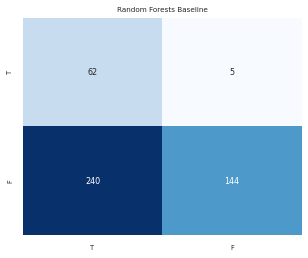

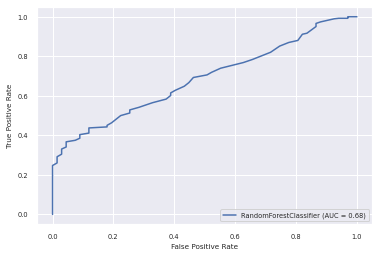

This is the starting index: 2468 of patient 6
0.5485564304461942
[([1], 1, array([0.49, 0.51])), ([1], 1, array([0.21, 0.79])), ([1], 1, array([0.43, 0.57])), ([1], 0, array([0.82, 0.18])), ([1], 0, array([0.54, 0.46])), ([1], 1, array([0.3, 0.7])), ([1], 1, array([0.18, 0.82])), ([1], 0, array([0.79, 0.21])), ([1], 0, array([0.56, 0.44])), ([1], 0, array([0.63, 0.37])), ([0], 0, array([0.84, 0.16])), ([1], 1, array([0.17, 0.83])), ([1], 0, array([0.71, 0.29])), ([1], 1, array([0.37, 0.63])), ([1], 0, array([0.52, 0.48])), ([1], 1, array([0.15, 0.85])), ([1], 1, array([0.09, 0.91])), ([1], 1, array([0.27, 0.73])), ([1], 1, array([0.3, 0.7])), ([0], 0, array([0.66, 0.34])), ([1], 0, array([0.56, 0.44])), ([1], 0, array([0.77, 0.23])), ([1], 1, array([0.45, 0.55])), ([1], 0, array([0.56, 0.44])), ([1], 1, array([0.31, 0.69])), ([1], 0, array([0.6, 0.4])), ([1], 0, array([0.86, 0.14])), ([0], 1, array([0.42, 0.58])), ([0], 0, array([0.75, 0.25])), ([1], 1, array([0.48, 0.52])), ([1], 0, a

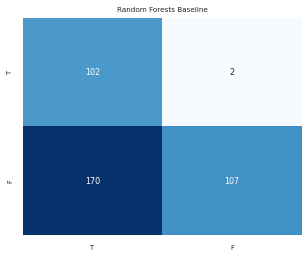

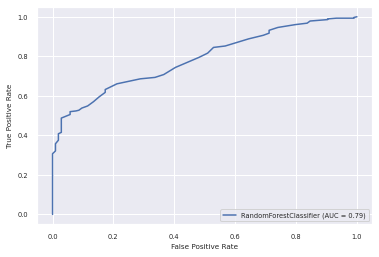

This is the starting index: 2850 of patient 7
0.8309278350515464
[([0], 0, array([0.56, 0.44])), ([0], 0, array([0.83, 0.17])), ([0], 0, array([0.78, 0.22])), ([0], 0, array([0.68, 0.32])), ([0], 0, array([0.57, 0.43])), ([0], 0, array([0.58, 0.42])), ([0], 0, array([0.75, 0.25])), ([0], 0, array([0.77, 0.23])), ([0], 0, array([0.81, 0.19])), ([0], 0, array([0.69, 0.31])), ([0], 0, array([0.67, 0.33])), ([0], 0, array([0.92, 0.08])), ([0], 1, array([0.2, 0.8])), ([0], 1, array([0.45, 0.55])), ([0], 0, array([0.64, 0.36])), ([0], 0, array([0.89, 0.11])), ([0], 0, array([0.81, 0.19])), ([0], 0, array([0.7, 0.3])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.64, 0.36])), ([0], 0, array([0.63, 0.37])), ([0], 0, array([0.86, 0.14])), ([0], 0, array([0.57, 0.43])), ([0], 1, array([0.41, 0.59])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.56, 0.44])), ([0], 0, array([0.79, 0.21])), ([0], 0, array([0.77, 0.23])), ([0], 0, array([0.51, 0.49])), ([0], 0, array([0.58, 0.42])), ([1], 0, arr

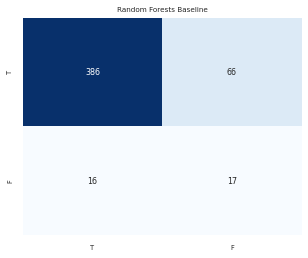

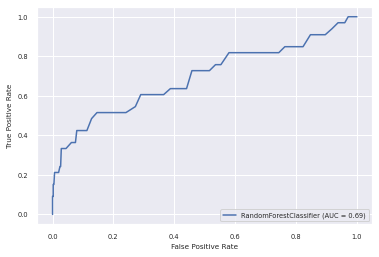

This is the starting index: 3336 of patient 8
0.7318339100346021
[([1], 0, array([0.76, 0.24])), ([1], 1, array([0.35, 0.65])), ([0], 0, array([0.65, 0.35])), ([1], 0, array([0.63, 0.37])), ([1], 1, array([0.37, 0.63])), ([1], 1, array([0.3, 0.7])), ([1], 1, array([0.48, 0.52])), ([1], 1, array([0.26, 0.74])), ([1], 1, array([0.39, 0.61])), ([1], 1, array([0.25, 0.75])), ([0], 0, array([0.5, 0.5])), ([1], 1, array([0.4, 0.6])), ([0], 0, array([0.77, 0.23])), ([1], 1, array([0.44, 0.56])), ([1], 1, array([0.38, 0.62])), ([0], 0, array([0.78, 0.22])), ([0], 0, array([0.64, 0.36])), ([1], 0, array([0.75, 0.25])), ([1], 1, array([0.11, 0.89])), ([1], 0, array([0.7, 0.3])), ([1], 1, array([0.3, 0.7])), ([0], 0, array([0.54, 0.46])), ([1], 1, array([0.24, 0.76])), ([0], 0, array([0.76, 0.24])), ([1], 1, array([0.26, 0.74])), ([0], 1, array([0.41, 0.59])), ([0], 0, array([0.69, 0.31])), ([0], 1, array([0.44, 0.56])), ([0], 0, array([0.86, 0.14])), ([1], 1, array([0.41, 0.59])), ([1], 1, array

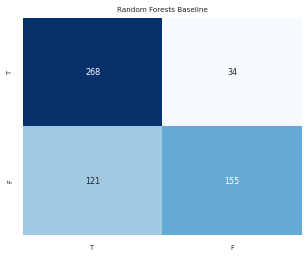

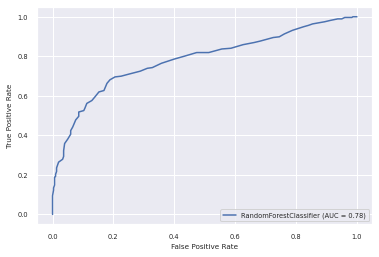

This is the starting index: 3915 of patient 9
0.5464285714285714
[([1], 1, array([0.24, 0.76])), ([1], 1, array([0.45, 0.55])), ([1], 0, array([0.57, 0.43])), ([1], 0, array([0.51, 0.49])), ([1], 1, array([0.42, 0.58])), ([1], 1, array([0.22, 0.78])), ([1], 0, array([0.79, 0.21])), ([1], 0, array([0.63, 0.37])), ([1], 0, array([0.5, 0.5])), ([1], 0, array([0.65, 0.35])), ([1], 1, array([0.23, 0.77])), ([1], 0, array([0.51, 0.49])), ([1], 1, array([0.35, 0.65])), ([1], 1, array([0.49, 0.51])), ([1], 0, array([0.68, 0.32])), ([1], 0, array([0.55, 0.45])), ([1], 1, array([0.42, 0.58])), ([1], 1, array([0.31, 0.69])), ([1], 0, array([0.56, 0.44])), ([1], 0, array([0.54, 0.46])), ([1], 1, array([0.4, 0.6])), ([1], 0, array([0.66, 0.34])), ([1], 0, array([0.61, 0.39])), ([1], 0, array([0.53, 0.47])), ([1], 1, array([0.43, 0.57])), ([0], 1, array([0.44, 0.56])), ([0], 1, array([0.41, 0.59])), ([1], 1, array([0.29, 0.71])), ([1], 0, array([0.62, 0.38])), ([1], 1, array([0.31, 0.69])), ([1], 1,

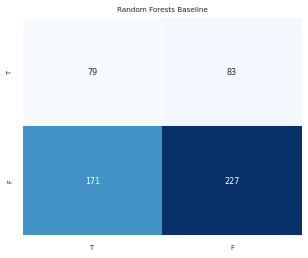

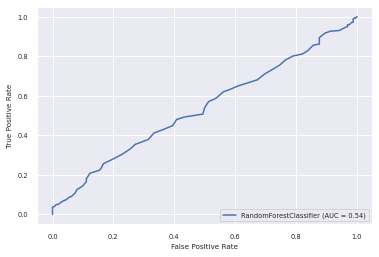

This is the starting index: 4476 of patient 10
0.8849721706864564
[([0], 0, array([0.64, 0.36])), ([0], 0, array([0.63, 0.37])), ([0], 0, array([0.74, 0.26])), ([0], 0, array([0.59, 0.41])), ([0], 0, array([0.65, 0.35])), ([0], 0, array([0.8, 0.2])), ([1], 1, array([0.45, 0.55])), ([1], 0, array([0.62, 0.38])), ([0], 0, array([0.75, 0.25])), ([0], 0, array([0.74, 0.26])), ([1], 1, array([0.45, 0.55])), ([1], 0, array([0.5, 0.5])), ([1], 0, array([0.52, 0.48])), ([0], 0, array([0.77, 0.23])), ([0], 0, array([0.73, 0.27])), ([0], 0, array([0.83, 0.17])), ([0], 0, array([0.78, 0.22])), ([0], 0, array([0.79, 0.21])), ([1], 1, array([0.42, 0.58])), ([0], 0, array([0.58, 0.42])), ([1], 0, array([0.77, 0.23])), ([0], 0, array([0.89, 0.11])), ([0], 0, array([0.7, 0.3])), ([0], 0, array([0.68, 0.32])), ([0], 0, array([0.93, 0.07])), ([1], 1, array([0.44, 0.56])), ([0], 0, array([0.75, 0.25])), ([0], 0, array([0.69, 0.31])), ([0], 0, array([0.59, 0.41])), ([0], 0, array([0.81, 0.19])), ([0], 0, 

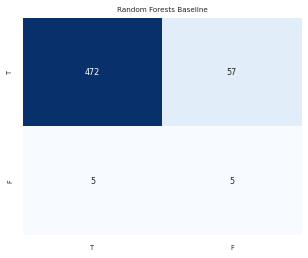

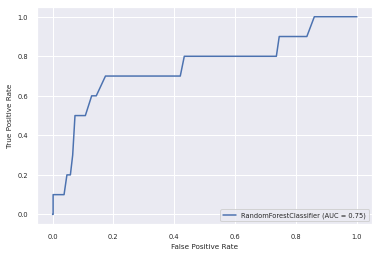

This is the starting index: 5016 of patient 11
0.7467532467532467
[([0], 0, array([0.59, 0.41])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.9, 0.1])), ([0], 0, array([0.78, 0.22])), ([0], 0, array([0.53, 0.47])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.54, 0.46])), ([0], 0, array([0.75, 0.25])), ([0], 0, array([0.68, 0.32])), ([0], 0, array([0.82, 0.18])), ([0], 0, array([0.71, 0.29])), ([0], 0, array([0.7, 0.3])), ([0], 0, array([0.76, 0.24])), ([1], 0, array([0.56, 0.44])), ([0], 0, array([0.77, 0.23])), ([1], 0, array([0.73, 0.27])), ([0], 0, array([0.54, 0.46])), ([0], 0, array([0.75, 0.25])), ([0], 0, array([0.78, 0.22])), ([1], 0, array([0.95, 0.05])), ([0], 0, array([0.79, 0.21])), ([0], 0, array([0.84, 0.16])), ([0], 0, array([0.94, 0.06])), ([0], 0, array([0.82, 0.18])), ([1], 0, array([0.51, 0.49])), ([0], 0, array([0.81, 0.19])), ([1], 0, array([0.9, 0.1])), ([1], 1, array([0.08, 0.92])), ([0], 0, array([0.68, 0.32])), ([0], 0, array([0.67, 0.33])), ([0], 0, arra

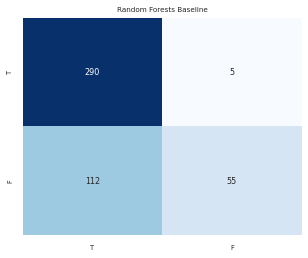

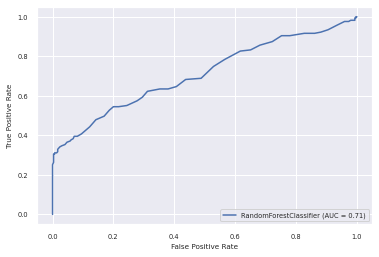

This is the starting index: 5479 of patient 12


ValueError: ignored

In [21]:
Accuracy = []
auc = []
specificity = []
sensitivity = []
clf = RandomForestClassifier()
sel = VarianceThreshold(threshold=(.2 * (1 - .8)))
for i in range(0,13):
    test, train, test_class, train_class = leave_one_out(df,i)
    sel.fit_transform(train)
    sel.fit_transform(test)
    clf.fit(train, train_class.ravel())

    y_predicted = clf.predict(test)
    print(metrics.accuracy_score(test_class,y_predicted))
        # print("Random Forest:\n",metrics.classification_report(test_class,y_predicted)) # Classification report
    Accuracy.append(metrics.accuracy_score(test_class,y_predicted))
    auc.append(metrics.roc_auc_score(test_class,y_predicted))
    mcm = confusion_matrix(test_class,y_predicted)
    tn = mcm[0, 0]
    tp = mcm[1, 1]
    fn = mcm[1, 0]
    fp = mcm[0, 1]
    sensitivity.append(tp / (tp + fn))
    specificity.append(tn / (tn + fp))
    pred = clf.predict_proba(test)
    result = [*zip(test_class.tolist(), y_predicted, pred)]
    print(result)
    report = metrics.classification_report(test_class.tolist(), y_predicted)
    matrix = metrics.confusion_matrix(test_class.tolist(),y_predicted)   

    fig, (ax1) = plt.subplots(1, figsize=(5, 4))


    df_cm1 = pd.DataFrame(matrix, range(2), range(2))
    sn.set(font_scale=0.6) # for label size
    sn.heatmap(df_cm1, annot=True,annot_kws={"size": 8}, fmt='g', cmap='Blues', cbar= False, xticklabels=x_axis_labels, yticklabels=y_axis_labels, ax = ax1) # font size


    ax1.set_title('Random Forests Baseline')

    plt.show()
    metrics.plot_roc_curve(clf, test, test_class.tolist())  # doctest: +SKIP
    plt.show()

Model=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13']

Index = [1,2,3,4,5,6,7,8,9,10,11,12,13]
fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,Accuracy)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Accuracy')
plt.xlabel('Model')
plt.title('Accuracies of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,auc)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('AUC Scores')
plt.xlabel('Model')
plt.title('AUC of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,sensitivity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Sensitivity')
plt.xlabel('Model')
plt.title('Sensitivity')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,specificity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Specificity')
plt.xlabel('Model')
plt.title('Specificity')
plt.show

#### Univariate Feature Selection

#### L1-based feature selection

This is the starting index: 0 of patient 0
0.7888307155322862
[([1], 1, array([0.33, 0.67])), ([1], 1, array([0.35, 0.65])), ([0], 1, array([0.43, 0.57])), ([1], 0, array([0.89, 0.11])), ([1], 1, array([0.16, 0.84])), ([0], 0, array([0.87, 0.13])), ([1], 0, array([0.72, 0.28])), ([0], 0, array([0.8, 0.2])), ([1], 1, array([0.21, 0.79])), ([0], 1, array([0.48, 0.52])), ([0], 0, array([0.66, 0.34])), ([1], 0, array([0.6, 0.4])), ([1], 1, array([0.37, 0.63])), ([0], 1, array([0.48, 0.52])), ([1], 1, array([0.32, 0.68])), ([1], 1, array([0.46, 0.54])), ([1], 1, array([0.31, 0.69])), ([1], 0, array([0.86, 0.14])), ([1], 0, array([0.54, 0.46])), ([1], 1, array([0.27, 0.73])), ([0], 0, array([0.61, 0.39])), ([1], 0, array([0.88, 0.12])), ([1], 1, array([0.49, 0.51])), ([1], 1, array([0.32, 0.68])), ([0], 0, array([0.62, 0.38])), ([0], 1, array([0.48, 0.52])), ([1], 0, array([0.68, 0.32])), ([1], 1, array([0.39, 0.61])), ([0], 1, array([0.26, 0.74])), ([0], 0, array([0.76, 0.24])), ([0], 0, ar

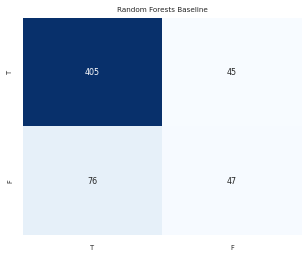

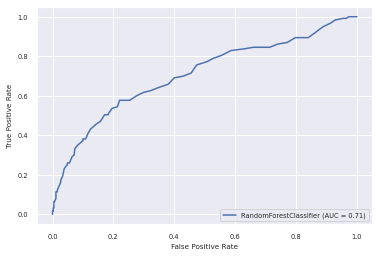

This is the starting index: 574 of patient 1
0.6974248927038627
[([0], 1, array([0.32, 0.68])), ([0], 1, array([0.2, 0.8])), ([0], 0, array([0.55, 0.45])), ([0], 1, array([0.48, 0.52])), ([0], 1, array([0.47, 0.53])), ([0], 1, array([0.48, 0.52])), ([1], 1, array([0.24, 0.76])), ([0], 0, array([0.72, 0.28])), ([0], 0, array([0.69, 0.31])), ([0], 0, array([0.81, 0.19])), ([0], 0, array([0.58, 0.42])), ([0], 0, array([0.62, 0.38])), ([1], 1, array([0.46, 0.54])), ([0], 0, array([0.56, 0.44])), ([0], 0, array([0.54, 0.46])), ([0], 0, array([0.52, 0.48])), ([0], 1, array([0.32, 0.68])), ([0], 0, array([0.78, 0.22])), ([1], 0, array([0.62, 0.38])), ([0], 0, array([0.53, 0.47])), ([1], 1, array([0.01, 0.99])), ([0], 0, array([0.67, 0.33])), ([1], 1, array([0.17, 0.83])), ([0], 0, array([0.75, 0.25])), ([1], 1, array([0.37, 0.63])), ([0], 0, array([0.59, 0.41])), ([0], 0, array([0.63, 0.37])), ([0], 0, array([0.84, 0.16])), ([0], 0, array([0.88, 0.12])), ([1], 1, array([0.01, 0.99])), ([1], 1

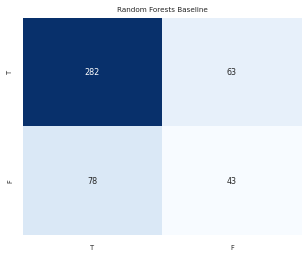

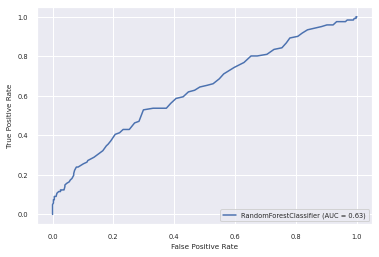

This is the starting index: 1041 of patient 2
0.30716723549488056
[([1], 1, array([0.37, 0.63])), ([0], 0, array([0.56, 0.44])), ([0], 1, array([0.39, 0.61])), ([1], 1, array([0.12, 0.88])), ([0], 0, array([0.51, 0.49])), ([0], 1, array([0.48, 0.52])), ([0], 0, array([0.61, 0.39])), ([1], 1, array([0.24, 0.76])), ([1], 0, array([0.64, 0.36])), ([1], 1, array([0.27, 0.73])), ([1], 0, array([0.51, 0.49])), ([1], 1, array([0.25, 0.75])), ([1], 1, array([0.05, 0.95])), ([0], 1, array([0.38, 0.62])), ([1], 0, array([0.57, 0.43])), ([1], 1, array([0.26, 0.74])), ([0], 1, array([0.17, 0.83])), ([0], 1, array([0.27, 0.73])), ([0], 1, array([0.31, 0.69])), ([0], 0, array([0.64, 0.36])), ([0], 1, array([0.12, 0.88])), ([0], 1, array([0.46, 0.54])), ([0], 1, array([0.35, 0.65])), ([0], 1, array([0.06, 0.94])), ([0], 1, array([0.26, 0.74])), ([0], 1, array([0.05, 0.95])), ([0], 0, array([0.51, 0.49])), ([0], 1, array([0.11, 0.89])), ([0], 1, array([0.09, 0.91])), ([0], 1, array([0.09, 0.91])), ([0

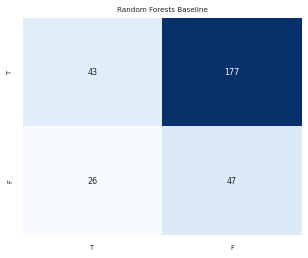

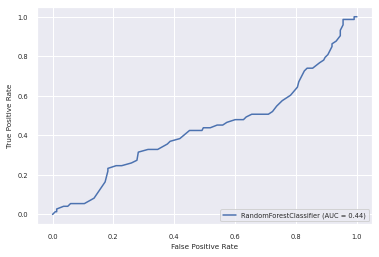

This is the starting index: 1335 of patient 3
0.6058201058201058
[([0], 1, array([0.48, 0.52])), ([1], 1, array([0.45, 0.55])), ([1], 1, array([0.31, 0.69])), ([1], 1, array([0.28, 0.72])), ([1], 1, array([0.2, 0.8])), ([1], 0, array([0.51, 0.49])), ([1], 1, array([0.3, 0.7])), ([0], 0, array([0.54, 0.46])), ([0], 1, array([0.38, 0.62])), ([0], 1, array([0.33, 0.67])), ([0], 1, array([0.43, 0.57])), ([0], 1, array([0.46, 0.54])), ([0], 1, array([0.45, 0.55])), ([1], 0, array([0.64, 0.36])), ([0], 1, array([0.49, 0.51])), ([0], 0, array([0.53, 0.47])), ([0], 0, array([0.7, 0.3])), ([0], 1, array([0.32, 0.68])), ([0], 0, array([0.61, 0.39])), ([0], 1, array([0.48, 0.52])), ([0], 1, array([0.36, 0.64])), ([0], 1, array([0.47, 0.53])), ([0], 1, array([0.38, 0.62])), ([0], 0, array([0.61, 0.39])), ([0], 0, array([0.76, 0.24])), ([0], 0, array([0.5, 0.5])), ([0], 0, array([0.67, 0.33])), ([0], 0, array([0.84, 0.16])), ([0], 0, array([0.52, 0.48])), ([1], 1, array([0.3, 0.7])), ([0], 1, array

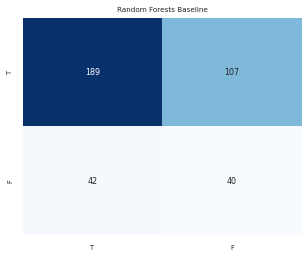

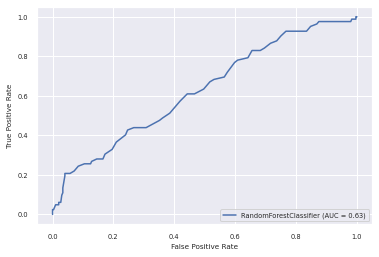

This is the starting index: 1714 of patient 4
0.3787375415282392
[([1], 1, array([0.45, 0.55])), ([1], 1, array([0.42, 0.58])), ([1], 0, array([0.71, 0.29])), ([1], 0, array([0.52, 0.48])), ([1], 1, array([0.42, 0.58])), ([1], 0, array([0.79, 0.21])), ([1], 0, array([0.73, 0.27])), ([1], 0, array([0.51, 0.49])), ([1], 0, array([0.71, 0.29])), ([1], 1, array([0.18, 0.82])), ([1], 1, array([0.46, 0.54])), ([1], 0, array([0.54, 0.46])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.46, 0.54])), ([1], 0, array([0.54, 0.46])), ([1], 1, array([0.41, 0.59])), ([1], 0, array([0.53, 0.47])), ([1], 0, array([0.54, 0.46])), ([1], 0, array([0.53, 0.47])), ([1], 1, array([0.49, 0.51])), ([1], 1, array([0.29, 0.71])), ([1], 0, array([0.59, 0.41])), ([1], 1, array([0.43, 0.57])), ([1], 1, array([0.41, 0.59])), ([1], 1, array([0.44, 0.56])), ([1], 0, array([0.55, 0.45])), ([1], 0, array([0.7, 0.3])), ([1], 0, array([0.61, 0.39])), ([1], 1, array([0.42, 0.58])), ([1], 0, a

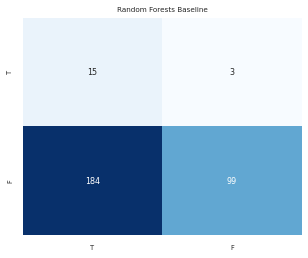

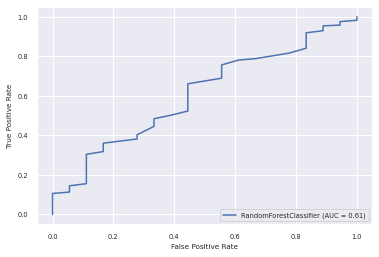

This is the starting index: 2016 of patient 5
0.43015521064301554
[([0], 0, array([0.77, 0.23])), ([0], 0, array([0.75, 0.25])), ([0], 0, array([0.73, 0.27])), ([0], 0, array([0.81, 0.19])), ([0], 0, array([0.68, 0.32])), ([0], 0, array([0.86, 0.14])), ([1], 0, array([0.81, 0.19])), ([1], 0, array([0.92, 0.08])), ([1], 0, array([0.76, 0.24])), ([1], 0, array([0.57, 0.43])), ([0], 0, array([0.66, 0.34])), ([1], 0, array([0.73, 0.27])), ([0], 0, array([0.65, 0.35])), ([1], 0, array([0.54, 0.46])), ([1], 0, array([0.78, 0.22])), ([1], 0, array([0.83, 0.17])), ([1], 0, array([0.59, 0.41])), ([1], 0, array([0.61, 0.39])), ([1], 0, array([0.7, 0.3])), ([1], 0, array([0.86, 0.14])), ([1], 1, array([0.13, 0.87])), ([1], 0, array([0.64, 0.36])), ([1], 0, array([0.88, 0.12])), ([1], 0, array([0.53, 0.47])), ([1], 0, array([0.77, 0.23])), ([1], 0, array([0.87, 0.13])), ([1], 1, array([0.14, 0.86])), ([1], 0, array([0.69, 0.31])), ([1], 0, array([0.83, 0.17])), ([1], 0, array([0.51, 0.49])), ([1],

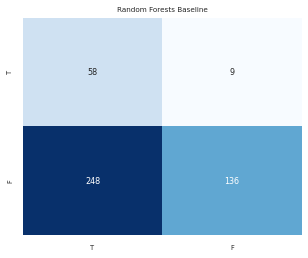

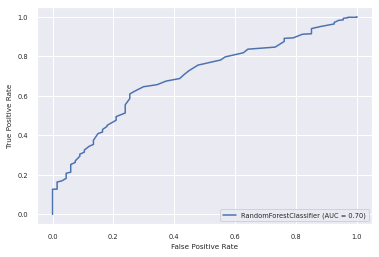

This is the starting index: 2468 of patient 6
0.5511811023622047
[([1], 0, array([0.56, 0.44])), ([1], 1, array([0.35, 0.65])), ([1], 1, array([0.45, 0.55])), ([1], 0, array([0.77, 0.23])), ([1], 0, array([0.58, 0.42])), ([1], 1, array([0.26, 0.74])), ([1], 1, array([0.29, 0.71])), ([1], 0, array([0.93, 0.07])), ([1], 0, array([0.65, 0.35])), ([1], 0, array([0.63, 0.37])), ([0], 0, array([0.88, 0.12])), ([1], 1, array([0.34, 0.66])), ([1], 0, array([0.74, 0.26])), ([1], 1, array([0.39, 0.61])), ([1], 0, array([0.87, 0.13])), ([1], 1, array([0.43, 0.57])), ([1], 1, array([0.23, 0.77])), ([1], 0, array([0.59, 0.41])), ([1], 1, array([0.42, 0.58])), ([0], 0, array([0.64, 0.36])), ([1], 1, array([0.48, 0.52])), ([1], 1, array([0.46, 0.54])), ([1], 0, array([0.64, 0.36])), ([1], 1, array([0.25, 0.75])), ([1], 1, array([0.37, 0.63])), ([1], 0, array([0.75, 0.25])), ([1], 0, array([0.82, 0.18])), ([0], 1, array([0.43, 0.57])), ([0], 0, array([0.75, 0.25])), ([1], 0, array([0.52, 0.48])), ([1]

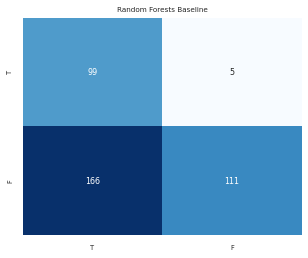

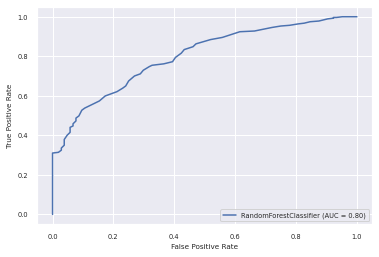

This is the starting index: 2850 of patient 7
0.7546391752577319
[([0], 1, array([0.43, 0.57])), ([0], 0, array([0.57, 0.43])), ([0], 0, array([0.75, 0.25])), ([0], 1, array([0.4, 0.6])), ([0], 1, array([0.48, 0.52])), ([0], 0, array([0.55, 0.45])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.72, 0.28])), ([0], 0, array([0.65, 0.35])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.77, 0.23])), ([0], 0, array([0.75, 0.25])), ([0], 1, array([0.18, 0.82])), ([0], 1, array([0.43, 0.57])), ([0], 1, array([0.35, 0.65])), ([0], 0, array([0.78, 0.22])), ([0], 0, array([0.58, 0.42])), ([0], 0, array([0.67, 0.33])), ([0], 0, array([0.81, 0.19])), ([0], 0, array([0.68, 0.32])), ([0], 0, array([0.55, 0.45])), ([0], 0, array([0.8, 0.2])), ([0], 1, array([0.39, 0.61])), ([0], 1, array([0.49, 0.51])), ([0], 0, array([0.72, 0.28])), ([0], 0, array([0.58, 0.42])), ([0], 0, array([0.81, 0.19])), ([0], 0, array([0.76, 0.24])), ([0], 1, array([0.48, 0.52])), ([0], 0, array([0.64, 0.36])), ([1], 0, arr

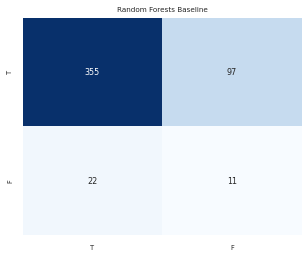

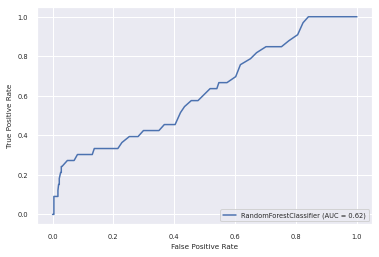

This is the starting index: 3336 of patient 8
0.6487889273356401
[([1], 0, array([0.71, 0.29])), ([1], 1, array([0.3, 0.7])), ([0], 0, array([0.82, 0.18])), ([1], 0, array([0.79, 0.21])), ([1], 1, array([0.31, 0.69])), ([1], 1, array([0.33, 0.67])), ([1], 0, array([0.5, 0.5])), ([1], 1, array([0.26, 0.74])), ([1], 1, array([0.3, 0.7])), ([1], 1, array([0.21, 0.79])), ([0], 0, array([0.55, 0.45])), ([1], 1, array([0.26, 0.74])), ([0], 0, array([0.84, 0.16])), ([1], 0, array([0.52, 0.48])), ([1], 1, array([0.28, 0.72])), ([0], 0, array([0.97, 0.03])), ([0], 0, array([0.73, 0.27])), ([1], 0, array([0.53, 0.47])), ([1], 1, array([0.14, 0.86])), ([1], 0, array([0.82, 0.18])), ([1], 1, array([0.44, 0.56])), ([0], 0, array([0.82, 0.18])), ([1], 1, array([0.32, 0.68])), ([0], 0, array([0.73, 0.27])), ([1], 1, array([0.23, 0.77])), ([0], 1, array([0.4, 0.6])), ([0], 0, array([0.85, 0.15])), ([0], 0, array([0.71, 0.29])), ([0], 0, array([0.81, 0.19])), ([1], 0, array([0.55, 0.45])), ([1], 1, arr

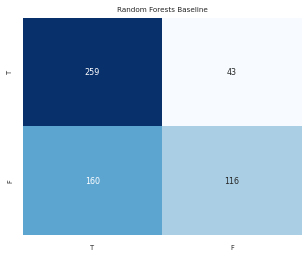

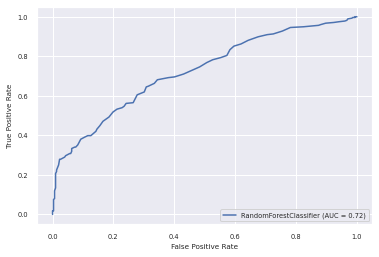

This is the starting index: 3915 of patient 9
0.49642857142857144
[([1], 1, array([0.37, 0.63])), ([1], 0, array([0.83, 0.17])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.45, 0.55])), ([1], 1, array([0.33, 0.67])), ([1], 1, array([0.42, 0.58])), ([1], 1, array([0.43, 0.57])), ([1], 0, array([0.6, 0.4])), ([1], 1, array([0.31, 0.69])), ([1], 1, array([0.41, 0.59])), ([1], 1, array([0.3, 0.7])), ([1], 1, array([0.17, 0.83])), ([1], 1, array([0.46, 0.54])), ([1], 0, array([0.55, 0.45])), ([1], 0, array([0.61, 0.39])), ([1], 1, array([0.44, 0.56])), ([1], 0, array([0.63, 0.37])), ([1], 1, array([0.36, 0.64])), ([1], 1, array([0.25, 0.75])), ([1], 0, array([0.52, 0.48])), ([1], 1, array([0.48, 0.52])), ([1], 1, array([0.34, 0.66])), ([1], 0, array([0.52, 0.48])), ([1], 1, array([0.36, 0.64])), ([1], 0, array([0.52, 0.48])), ([0], 0, array([0.58, 0.42])), ([0], 1, array([0.39, 0.61])), ([1], 1, array([0.1, 0.9])), ([1], 1, array([0.49, 0.51])), ([1], 0, array([0.52, 0.48])), ([1], 0, ar

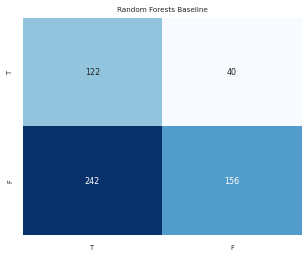

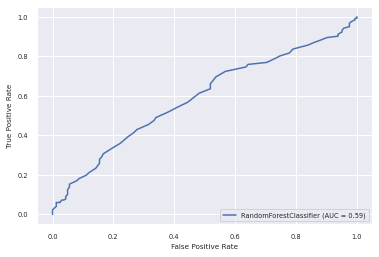

This is the starting index: 4476 of patient 10
0.8404452690166976
[([0], 0, array([0.62, 0.38])), ([0], 0, array([0.58, 0.42])), ([0], 0, array([0.61, 0.39])), ([0], 0, array([0.73, 0.27])), ([0], 0, array([0.67, 0.33])), ([0], 0, array([0.71, 0.29])), ([1], 1, array([0.49, 0.51])), ([1], 0, array([0.68, 0.32])), ([0], 0, array([0.81, 0.19])), ([0], 0, array([0.79, 0.21])), ([1], 0, array([0.56, 0.44])), ([1], 0, array([0.5, 0.5])), ([1], 0, array([0.62, 0.38])), ([0], 0, array([0.76, 0.24])), ([0], 0, array([0.64, 0.36])), ([0], 0, array([0.83, 0.17])), ([0], 0, array([0.62, 0.38])), ([0], 0, array([0.86, 0.14])), ([1], 1, array([0.41, 0.59])), ([0], 1, array([0.47, 0.53])), ([1], 0, array([0.75, 0.25])), ([0], 0, array([0.9, 0.1])), ([0], 1, array([0.41, 0.59])), ([0], 0, array([0.62, 0.38])), ([0], 0, array([0.89, 0.11])), ([1], 0, array([0.65, 0.35])), ([0], 0, array([0.68, 0.32])), ([0], 0, array([0.54, 0.46])), ([0], 0, array([0.66, 0.34])), ([0], 0, array([0.58, 0.42])), ([0], 0

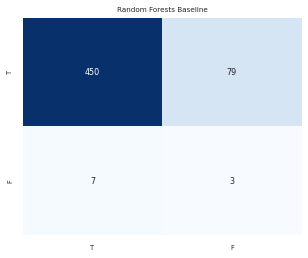

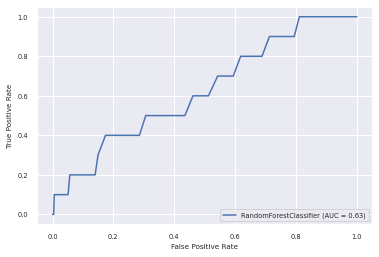

This is the starting index: 5016 of patient 11
0.7359307359307359
[([0], 0, array([0.57, 0.43])), ([0], 0, array([0.7, 0.3])), ([0], 0, array([0.84, 0.16])), ([0], 0, array([0.58, 0.42])), ([0], 0, array([0.65, 0.35])), ([0], 0, array([0.65, 0.35])), ([0], 0, array([0.58, 0.42])), ([0], 0, array([0.86, 0.14])), ([0], 0, array([0.66, 0.34])), ([0], 0, array([0.54, 0.46])), ([0], 0, array([0.81, 0.19])), ([0], 0, array([0.83, 0.17])), ([0], 0, array([0.81, 0.19])), ([1], 0, array([0.58, 0.42])), ([0], 0, array([0.57, 0.43])), ([1], 0, array([0.75, 0.25])), ([0], 1, array([0.49, 0.51])), ([0], 0, array([0.77, 0.23])), ([0], 0, array([0.83, 0.17])), ([1], 0, array([0.94, 0.06])), ([0], 0, array([0.75, 0.25])), ([0], 0, array([0.97, 0.03])), ([0], 0, array([0.94, 0.06])), ([0], 0, array([0.86, 0.14])), ([1], 0, array([0.59, 0.41])), ([0], 0, array([0.75, 0.25])), ([1], 0, array([0.91, 0.09])), ([1], 1, array([0.18, 0.82])), ([0], 0, array([0.78, 0.22])), ([0], 0, array([0.5, 0.5])), ([0], 0

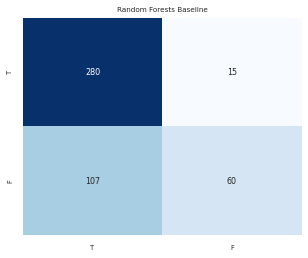

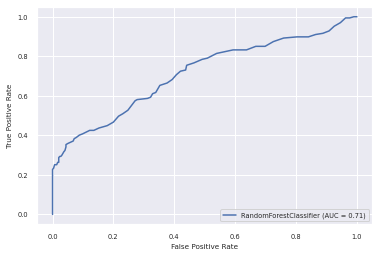

This is the starting index: 5479 of patient 12
0.35294117647058826
[([0], 1, array([0.45, 0.55])), ([0], 1, array([0.41, 0.59])), ([0], 1, array([0.37, 0.63])), ([0], 1, array([0.24, 0.76])), ([0], 0, array([0.76, 0.24])), ([0], 1, array([0.23, 0.77])), ([0], 1, array([0.44, 0.56])), ([0], 1, array([0.42, 0.58])), ([0], 0, array([0.5, 0.5])), ([0], 1, array([0.45, 0.55])), ([0], 1, array([0.31, 0.69])), ([0], 1, array([0.33, 0.67])), ([0], 0, array([0.52, 0.48])), ([0], 1, array([0.35, 0.65])), ([0], 1, array([0.17, 0.83])), ([0], 1, array([0.17, 0.83])), ([0], 1, array([0.43, 0.57])), ([0], 1, array([0.47, 0.53])), ([0], 1, array([0.43, 0.57])), ([0], 1, array([0.23, 0.77])), ([0], 1, array([0.46, 0.54])), ([0], 1, array([0.4, 0.6])), ([0], 1, array([0.14, 0.86])), ([0], 1, array([0.24, 0.76])), ([0], 0, array([0.55, 0.45])), ([0], 1, array([0.39, 0.61])), ([0], 1, array([0.47, 0.53])), ([0], 0, array([0.51, 0.49])), ([0], 1, array([0.45, 0.55])), ([0], 0, array([0.52, 0.48])), ([0], 

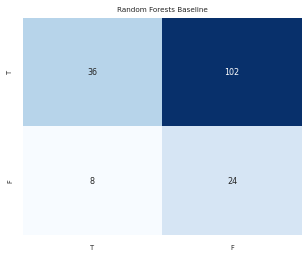

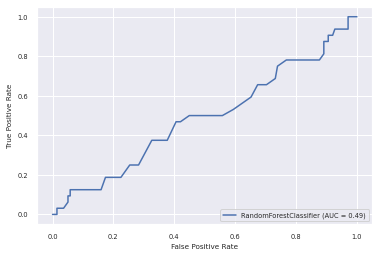

<function matplotlib.pyplot.show>

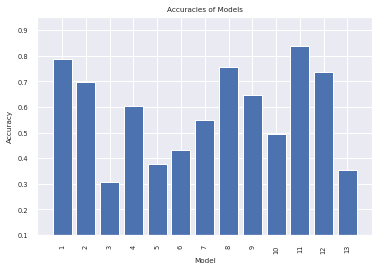

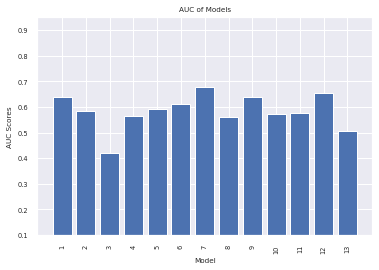

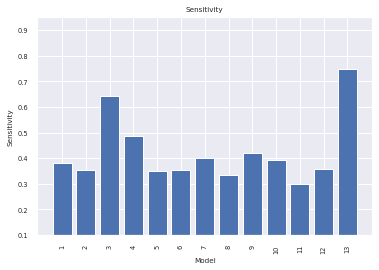

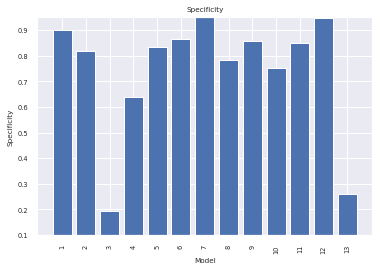

In [22]:
Accuracy = []
auc = []
sensitivity = []
specificity = []
clf = RandomForestClassifier()

for i in range(0,13):
    test, train, test_class, train_class = leave_one_out(df,i)
    lsvc = LinearSVC(C=0.01, penalty="l1", dual=False).fit(train, train_class.ravel())
    model = SelectFromModel(lsvc, prefit=True)
    train = model.transform(train)
    test = model.transform(test)
    clf.fit(train, train_class.ravel())

    y_predicted = clf.predict(test)
    print(metrics.accuracy_score(test_class,y_predicted))
        # print("Random Forest:\n",metrics.classification_report(test_class,y_predicted)) # Classification report
    Accuracy.append(metrics.accuracy_score(test_class,y_predicted))
    auc.append(metrics.roc_auc_score(test_class,y_predicted))
    mcm = confusion_matrix(test_class,y_predicted)
    tn = mcm[0, 0]
    tp = mcm[1, 1]
    fn = mcm[1, 0]
    fp = mcm[0, 1]
    sensitivity.append(tp / (tp + fn))
    specificity.append(tn / (tn + fp))
    pred = clf.predict_proba(test)
    result = [*zip(test_class.tolist(), y_predicted, pred)]
    print(result)
    report = metrics.classification_report(test_class.tolist(), y_predicted)
    matrix = metrics.confusion_matrix(test_class.tolist(),y_predicted)   

    fig, (ax1) = plt.subplots(1, figsize=(5, 4))


    df_cm1 = pd.DataFrame(matrix, range(2), range(2))
    sn.set(font_scale=0.6) # for label size
    sn.heatmap(df_cm1, annot=True,annot_kws={"size": 8}, fmt='g', cmap='Blues', cbar= False, xticklabels=x_axis_labels, yticklabels=y_axis_labels, ax = ax1) # font size


    ax1.set_title('Random Forests Baseline')

    plt.show()
    metrics.plot_roc_curve(clf, test, test_class.tolist())  # doctest: +SKIP
    plt.show()

Model=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13']

Index = [1,2,3,4,5,6,7,8,9,10,11,12,13]
fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,Accuracy)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Accuracy')
plt.xlabel('Model')
plt.title('Accuracies of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,auc)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('AUC Scores')
plt.xlabel('Model')
plt.title('AUC of Models')
plt.show


fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,sensitivity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Sensitivity')
plt.xlabel('Model')
plt.title('Sensitivity')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,specificity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Specificity')
plt.xlabel('Model')
plt.title('Specificity')
plt.show

#### Tree Based Feature Selection

This is the starting index: 0 of patient 0
0.7975567190226877
[([1], 1, array([0.47, 0.53])), ([1], 1, array([0.48, 0.52])), ([0], 1, array([0.25, 0.75])), ([1], 0, array([0.95, 0.05])), ([1], 1, array([0.21, 0.79])), ([0], 0, array([0.95, 0.05])), ([1], 0, array([0.8, 0.2])), ([0], 0, array([0.5, 0.5])), ([1], 1, array([0.21, 0.79])), ([0], 1, array([0.49, 0.51])), ([0], 1, array([0.49, 0.51])), ([1], 0, array([0.51, 0.49])), ([1], 0, array([0.54, 0.46])), ([0], 0, array([0.56, 0.44])), ([1], 1, array([0.2, 0.8])), ([1], 1, array([0.39, 0.61])), ([1], 1, array([0.45, 0.55])), ([1], 0, array([0.79, 0.21])), ([1], 0, array([0.59, 0.41])), ([1], 0, array([0.5, 0.5])), ([0], 0, array([0.51, 0.49])), ([1], 0, array([0.92, 0.08])), ([1], 0, array([0.66, 0.34])), ([1], 1, array([0.29, 0.71])), ([0], 0, array([0.83, 0.17])), ([0], 0, array([0.59, 0.41])), ([1], 0, array([0.68, 0.32])), ([1], 1, array([0.41, 0.59])), ([0], 0, array([0.65, 0.35])), ([0], 0, array([0.76, 0.24])), ([0], 0, array(

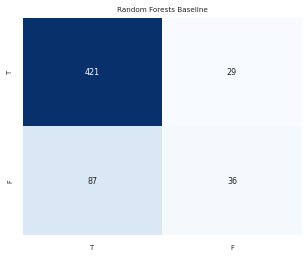

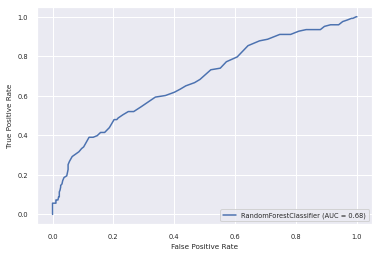

This is the starting index: 574 of patient 1
0.7167381974248928
[([0], 1, array([0.23, 0.77])), ([0], 1, array([0.26, 0.74])), ([0], 0, array([0.66, 0.34])), ([0], 1, array([0.27, 0.73])), ([0], 0, array([0.63, 0.37])), ([0], 0, array([0.76, 0.24])), ([1], 1, array([0.37, 0.63])), ([0], 0, array([0.58, 0.42])), ([0], 0, array([0.52, 0.48])), ([0], 0, array([0.59, 0.41])), ([0], 0, array([0.61, 0.39])), ([0], 1, array([0.46, 0.54])), ([1], 0, array([0.54, 0.46])), ([0], 1, array([0.45, 0.55])), ([0], 0, array([0.74, 0.26])), ([0], 0, array([0.52, 0.48])), ([0], 1, array([0.46, 0.54])), ([0], 0, array([0.58, 0.42])), ([1], 0, array([0.76, 0.24])), ([0], 0, array([0.54, 0.46])), ([1], 1, array([0.05, 0.95])), ([0], 0, array([0.87, 0.13])), ([1], 1, array([0.1, 0.9])), ([0], 0, array([0.68, 0.32])), ([1], 0, array([0.52, 0.48])), ([0], 0, array([0.81, 0.19])), ([0], 0, array([0.69, 0.31])), ([0], 0, array([0.71, 0.29])), ([0], 0, array([0.79, 0.21])), ([1], 1, array([0.16, 0.84])), ([1], 1

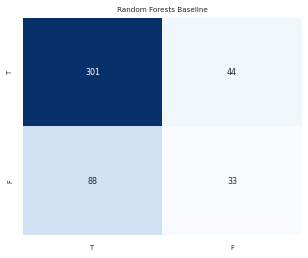

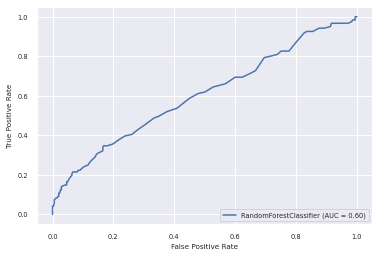

This is the starting index: 1041 of patient 2
0.3174061433447099
[([1], 1, array([0.18, 0.82])), ([0], 0, array([0.57, 0.43])), ([0], 1, array([0.44, 0.56])), ([1], 1, array([0.07, 0.93])), ([0], 0, array([0.61, 0.39])), ([0], 0, array([0.58, 0.42])), ([0], 0, array([0.61, 0.39])), ([1], 1, array([0.15, 0.85])), ([1], 0, array([0.52, 0.48])), ([1], 1, array([0.31, 0.69])), ([1], 0, array([0.58, 0.42])), ([1], 1, array([0.28, 0.72])), ([1], 1, array([0.05, 0.95])), ([0], 0, array([0.55, 0.45])), ([1], 0, array([0.51, 0.49])), ([1], 1, array([0.26, 0.74])), ([0], 1, array([0.27, 0.73])), ([0], 1, array([0.13, 0.87])), ([0], 1, array([0.44, 0.56])), ([0], 0, array([0.58, 0.42])), ([0], 1, array([0.1, 0.9])), ([0], 0, array([0.53, 0.47])), ([0], 1, array([0.3, 0.7])), ([0], 1, array([0.02, 0.98])), ([0], 1, array([0.27, 0.73])), ([0], 1, array([0.01, 0.99])), ([0], 1, array([0.43, 0.57])), ([0], 1, array([0.11, 0.89])), ([0], 1, array([0.04, 0.96])), ([0], 1, array([0.1, 0.9])), ([0], 1, a

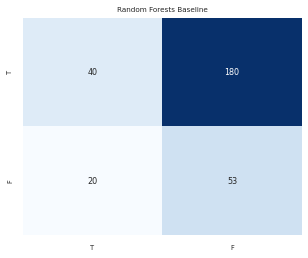

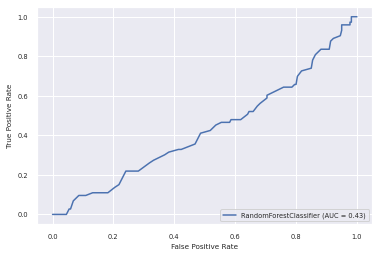

This is the starting index: 1335 of patient 3
0.6296296296296297
[([0], 0, array([0.51, 0.49])), ([1], 0, array([0.53, 0.47])), ([1], 1, array([0.19, 0.81])), ([1], 1, array([0.32, 0.68])), ([1], 1, array([0.23, 0.77])), ([1], 0, array([0.55, 0.45])), ([1], 1, array([0.47, 0.53])), ([0], 1, array([0.46, 0.54])), ([0], 0, array([0.65, 0.35])), ([0], 0, array([0.56, 0.44])), ([0], 0, array([0.57, 0.43])), ([0], 0, array([0.73, 0.27])), ([0], 0, array([0.56, 0.44])), ([1], 0, array([0.6, 0.4])), ([0], 0, array([0.57, 0.43])), ([0], 0, array([0.5, 0.5])), ([0], 0, array([0.65, 0.35])), ([0], 1, array([0.1, 0.9])), ([0], 0, array([0.58, 0.42])), ([0], 1, array([0.47, 0.53])), ([0], 0, array([0.56, 0.44])), ([0], 1, array([0.22, 0.78])), ([0], 1, array([0.38, 0.62])), ([0], 0, array([0.75, 0.25])), ([0], 0, array([0.75, 0.25])), ([0], 0, array([0.61, 0.39])), ([0], 0, array([0.56, 0.44])), ([0], 0, array([0.86, 0.14])), ([0], 1, array([0.35, 0.65])), ([1], 0, array([0.64, 0.36])), ([0], 1, a

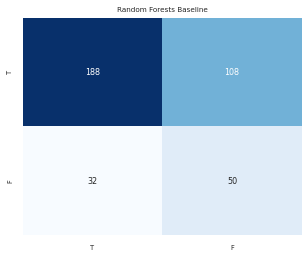

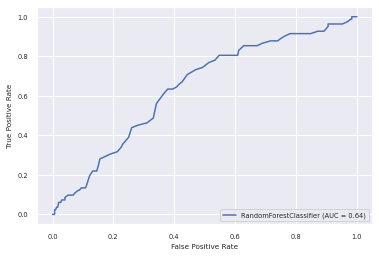

This is the starting index: 1714 of patient 4
0.5481727574750831
[([1], 1, array([0.49, 0.51])), ([1], 1, array([0.24, 0.76])), ([1], 0, array([0.61, 0.39])), ([1], 1, array([0.48, 0.52])), ([1], 1, array([0.46, 0.54])), ([1], 0, array([0.61, 0.39])), ([1], 0, array([0.59, 0.41])), ([1], 0, array([0.51, 0.49])), ([1], 1, array([0.48, 0.52])), ([1], 0, array([0.57, 0.43])), ([1], 0, array([0.5, 0.5])), ([1], 1, array([0.45, 0.55])), ([1], 1, array([0.48, 0.52])), ([1], 1, array([0.33, 0.67])), ([1], 1, array([0.38, 0.62])), ([1], 1, array([0.42, 0.58])), ([1], 1, array([0.25, 0.75])), ([1], 1, array([0.35, 0.65])), ([1], 1, array([0.37, 0.63])), ([1], 1, array([0.26, 0.74])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.23, 0.77])), ([1], 0, array([0.51, 0.49])), ([1], 1, array([0.42, 0.58])), ([1], 1, array([0.32, 0.68])), ([1], 1, array([0.38, 0.62])), ([1], 1, array([0.3, 0.7])), ([1], 0, array([0.62, 0.38])), ([1], 1, array([0.43, 0.57])), ([1], 1, array([0.41, 0.59])), ([1], 0, a

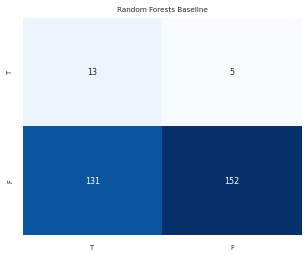

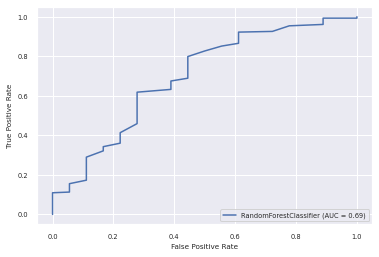

This is the starting index: 2016 of patient 5
0.44789356984478934
[([0], 0, array([0.65, 0.35])), ([0], 0, array([0.71, 0.29])), ([0], 0, array([0.65, 0.35])), ([0], 0, array([0.73, 0.27])), ([0], 0, array([0.83, 0.17])), ([0], 0, array([0.85, 0.15])), ([1], 0, array([0.8, 0.2])), ([1], 0, array([0.89, 0.11])), ([1], 0, array([0.73, 0.27])), ([1], 0, array([0.85, 0.15])), ([0], 0, array([0.68, 0.32])), ([1], 0, array([0.9, 0.1])), ([0], 0, array([0.58, 0.42])), ([1], 0, array([0.75, 0.25])), ([1], 0, array([0.68, 0.32])), ([1], 0, array([0.77, 0.23])), ([1], 0, array([0.78, 0.22])), ([1], 0, array([0.82, 0.18])), ([1], 0, array([0.62, 0.38])), ([1], 0, array([0.9, 0.1])), ([1], 1, array([0.12, 0.88])), ([1], 0, array([0.69, 0.31])), ([1], 0, array([0.83, 0.17])), ([1], 0, array([0.57, 0.43])), ([1], 0, array([0.81, 0.19])), ([1], 0, array([0.62, 0.38])), ([1], 1, array([0.11, 0.89])), ([1], 0, array([0.55, 0.45])), ([1], 0, array([0.81, 0.19])), ([1], 0, array([0.51, 0.49])), ([1], 0, 

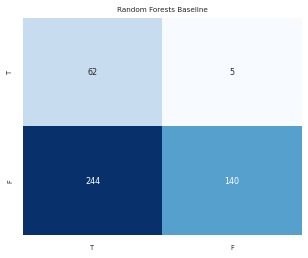

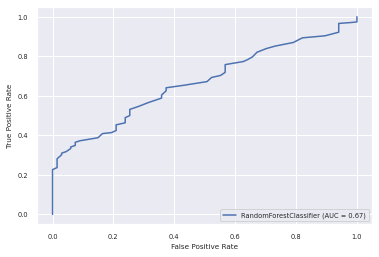

This is the starting index: 2468 of patient 6
0.5643044619422573
[([1], 1, array([0.45, 0.55])), ([1], 1, array([0.31, 0.69])), ([1], 1, array([0.27, 0.73])), ([1], 0, array([0.68, 0.32])), ([1], 0, array([0.76, 0.24])), ([1], 1, array([0.26, 0.74])), ([1], 1, array([0.34, 0.66])), ([1], 0, array([0.82, 0.18])), ([1], 0, array([0.57, 0.43])), ([1], 0, array([0.74, 0.26])), ([0], 0, array([0.84, 0.16])), ([1], 1, array([0.24, 0.76])), ([1], 0, array([0.83, 0.17])), ([1], 1, array([0.4, 0.6])), ([1], 0, array([0.72, 0.28])), ([1], 1, array([0.33, 0.67])), ([1], 1, array([0.1, 0.9])), ([1], 1, array([0.42, 0.58])), ([1], 1, array([0.29, 0.71])), ([0], 0, array([0.72, 0.28])), ([1], 0, array([0.65, 0.35])), ([1], 0, array([0.81, 0.19])), ([1], 1, array([0.37, 0.63])), ([1], 1, array([0.33, 0.67])), ([1], 1, array([0.44, 0.56])), ([1], 0, array([0.62, 0.38])), ([1], 0, array([0.87, 0.13])), ([0], 1, array([0.22, 0.78])), ([0], 0, array([0.73, 0.27])), ([1], 1, array([0.36, 0.64])), ([1], 0,

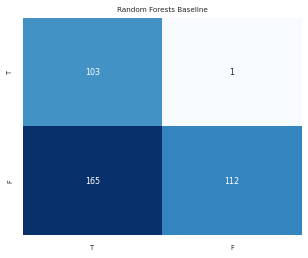

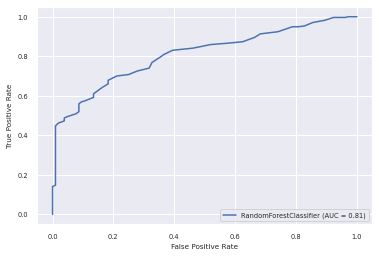

This is the starting index: 2850 of patient 7
0.8391752577319588
[([0], 0, array([0.5, 0.5])), ([0], 0, array([0.73, 0.27])), ([0], 0, array([0.81, 0.19])), ([0], 0, array([0.53, 0.47])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.78, 0.22])), ([0], 0, array([0.68, 0.32])), ([0], 0, array([0.81, 0.19])), ([0], 0, array([0.81, 0.19])), ([0], 0, array([0.75, 0.25])), ([0], 0, array([0.69, 0.31])), ([0], 0, array([0.83, 0.17])), ([0], 1, array([0.2, 0.8])), ([0], 1, array([0.29, 0.71])), ([0], 1, array([0.49, 0.51])), ([0], 0, array([0.84, 0.16])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.72, 0.28])), ([0], 0, array([0.76, 0.24])), ([0], 0, array([0.65, 0.35])), ([0], 0, array([0.63, 0.37])), ([0], 0, array([0.92, 0.08])), ([0], 0, array([0.66, 0.34])), ([0], 0, array([0.55, 0.45])), ([0], 0, array([0.79, 0.21])), ([0], 1, array([0.47, 0.53])), ([0], 0, array([0.81, 0.19])), ([0], 0, array([0.85, 0.15])), ([0], 1, array([0.45, 0.55])), ([0], 0, array([0.64, 0.36])), ([1], 0, arr

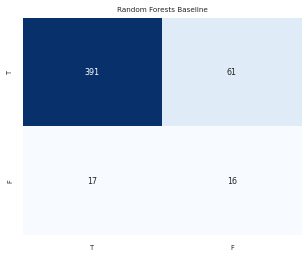

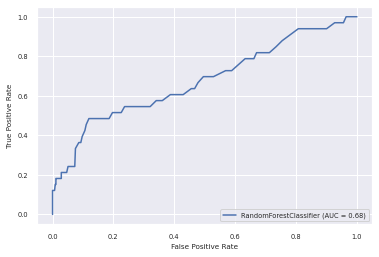

This is the starting index: 3336 of patient 8
0.7249134948096886
[([1], 0, array([0.69, 0.31])), ([1], 1, array([0.34, 0.66])), ([0], 0, array([0.67, 0.33])), ([1], 0, array([0.66, 0.34])), ([1], 1, array([0.41, 0.59])), ([1], 1, array([0.31, 0.69])), ([1], 0, array([0.56, 0.44])), ([1], 1, array([0.19, 0.81])), ([1], 1, array([0.38, 0.62])), ([1], 1, array([0.17, 0.83])), ([0], 1, array([0.36, 0.64])), ([1], 1, array([0.37, 0.63])), ([0], 0, array([0.8, 0.2])), ([1], 1, array([0.41, 0.59])), ([1], 1, array([0.24, 0.76])), ([0], 0, array([0.9, 0.1])), ([0], 0, array([0.72, 0.28])), ([1], 0, array([0.7, 0.3])), ([1], 1, array([0.18, 0.82])), ([1], 0, array([0.7, 0.3])), ([1], 1, array([0.28, 0.72])), ([0], 0, array([0.61, 0.39])), ([1], 1, array([0.2, 0.8])), ([0], 0, array([0.85, 0.15])), ([1], 1, array([0.12, 0.88])), ([0], 1, array([0.4, 0.6])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.52, 0.48])), ([0], 0, array([0.85, 0.15])), ([1], 1, array([0.27, 0.73])), ([1], 1, array([0.

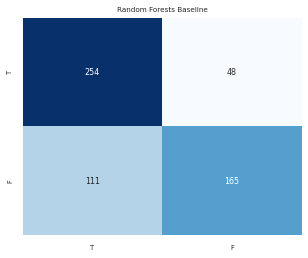

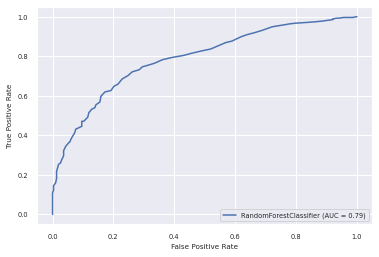

This is the starting index: 3915 of patient 9
0.6017857142857143
[([1], 1, array([0.15, 0.85])), ([1], 0, array([0.5, 0.5])), ([1], 1, array([0.41, 0.59])), ([1], 1, array([0.45, 0.55])), ([1], 1, array([0.17, 0.83])), ([1], 1, array([0.25, 0.75])), ([1], 0, array([0.69, 0.31])), ([1], 0, array([0.7, 0.3])), ([1], 1, array([0.39, 0.61])), ([1], 0, array([0.61, 0.39])), ([1], 1, array([0.22, 0.78])), ([1], 0, array([0.51, 0.49])), ([1], 1, array([0.32, 0.68])), ([1], 1, array([0.47, 0.53])), ([1], 0, array([0.59, 0.41])), ([1], 0, array([0.6, 0.4])), ([1], 1, array([0.46, 0.54])), ([1], 1, array([0.36, 0.64])), ([1], 1, array([0.4, 0.6])), ([1], 0, array([0.52, 0.48])), ([1], 1, array([0.28, 0.72])), ([1], 0, array([0.55, 0.45])), ([1], 0, array([0.56, 0.44])), ([1], 0, array([0.59, 0.41])), ([1], 0, array([0.68, 0.32])), ([0], 1, array([0.36, 0.64])), ([0], 1, array([0.42, 0.58])), ([1], 1, array([0.19, 0.81])), ([1], 0, array([0.73, 0.27])), ([1], 1, array([0.27, 0.73])), ([1], 1, arr

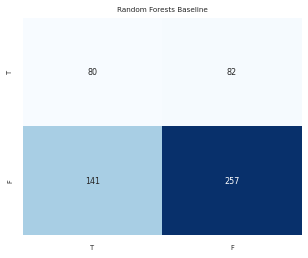

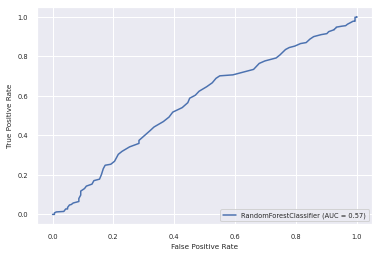

This is the starting index: 4476 of patient 10
0.8534322820037106
[([0], 0, array([0.5, 0.5])), ([0], 0, array([0.58, 0.42])), ([0], 0, array([0.61, 0.39])), ([0], 0, array([0.63, 0.37])), ([0], 0, array([0.65, 0.35])), ([0], 0, array([0.64, 0.36])), ([1], 1, array([0.44, 0.56])), ([1], 0, array([0.67, 0.33])), ([0], 0, array([0.83, 0.17])), ([0], 0, array([0.83, 0.17])), ([1], 0, array([0.52, 0.48])), ([1], 1, array([0.42, 0.58])), ([1], 1, array([0.47, 0.53])), ([0], 0, array([0.87, 0.13])), ([0], 0, array([0.74, 0.26])), ([0], 0, array([0.9, 0.1])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.86, 0.14])), ([1], 1, array([0.39, 0.61])), ([0], 0, array([0.52, 0.48])), ([1], 0, array([0.78, 0.22])), ([0], 0, array([0.9, 0.1])), ([0], 0, array([0.69, 0.31])), ([0], 0, array([0.61, 0.39])), ([0], 0, array([0.84, 0.16])), ([1], 0, array([0.52, 0.48])), ([0], 0, array([0.78, 0.22])), ([0], 0, array([0.69, 0.31])), ([0], 0, array([0.54, 0.46])), ([0], 0, array([0.78, 0.22])), ([0], 0, ar

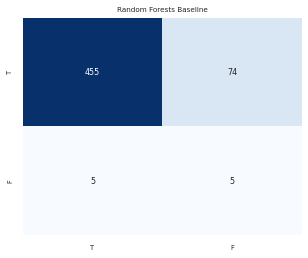

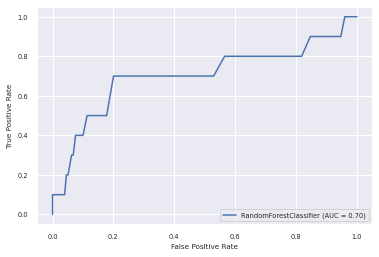

This is the starting index: 5016 of patient 11
0.7575757575757576
[([0], 1, array([0.49, 0.51])), ([0], 0, array([0.5, 0.5])), ([0], 0, array([0.77, 0.23])), ([0], 0, array([0.77, 0.23])), ([0], 1, array([0.28, 0.72])), ([0], 0, array([0.75, 0.25])), ([0], 0, array([0.59, 0.41])), ([0], 0, array([0.72, 0.28])), ([0], 0, array([0.56, 0.44])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.85, 0.15])), ([0], 0, array([0.75, 0.25])), ([1], 0, array([0.55, 0.45])), ([0], 0, array([0.75, 0.25])), ([1], 0, array([0.66, 0.34])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.75, 0.25])), ([0], 0, array([0.87, 0.13])), ([1], 0, array([0.94, 0.06])), ([0], 0, array([0.78, 0.22])), ([0], 0, array([0.94, 0.06])), ([0], 0, array([0.95, 0.05])), ([0], 0, array([0.84, 0.16])), ([1], 0, array([0.71, 0.29])), ([0], 0, array([0.7, 0.3])), ([1], 0, array([0.87, 0.13])), ([1], 1, array([0.09, 0.91])), ([0], 0, array([0.76, 0.24])), ([0], 0, array([0.66, 0.34])), ([0], 0, arra

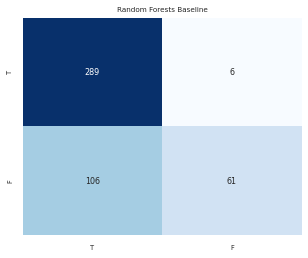

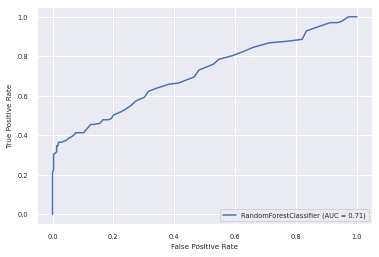

This is the starting index: 5479 of patient 12
0.3411764705882353
[([0], 1, array([0.45, 0.55])), ([0], 1, array([0.32, 0.68])), ([0], 1, array([0.38, 0.62])), ([0], 1, array([0.38, 0.62])), ([0], 0, array([0.69, 0.31])), ([0], 1, array([0.3, 0.7])), ([0], 1, array([0.37, 0.63])), ([0], 1, array([0.37, 0.63])), ([0], 1, array([0.46, 0.54])), ([0], 1, array([0.42, 0.58])), ([0], 1, array([0.32, 0.68])), ([0], 1, array([0.19, 0.81])), ([0], 0, array([0.63, 0.37])), ([0], 1, array([0.26, 0.74])), ([0], 1, array([0.13, 0.87])), ([0], 1, array([0.16, 0.84])), ([0], 1, array([0.49, 0.51])), ([0], 1, array([0.48, 0.52])), ([0], 1, array([0.4, 0.6])), ([0], 1, array([0.27, 0.73])), ([0], 1, array([0.3, 0.7])), ([0], 1, array([0.38, 0.62])), ([0], 1, array([0.27, 0.73])), ([0], 1, array([0.17, 0.83])), ([0], 0, array([0.54, 0.46])), ([0], 1, array([0.26, 0.74])), ([0], 1, array([0.49, 0.51])), ([0], 1, array([0.38, 0.62])), ([0], 0, array([0.52, 0.48])), ([0], 1, array([0.47, 0.53])), ([0], 1, 

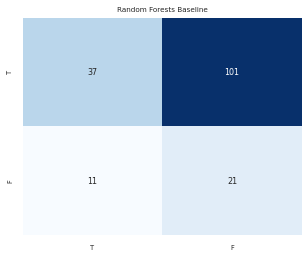

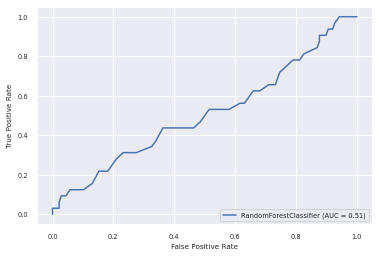

<function matplotlib.pyplot.show>

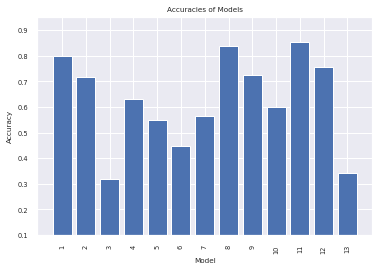

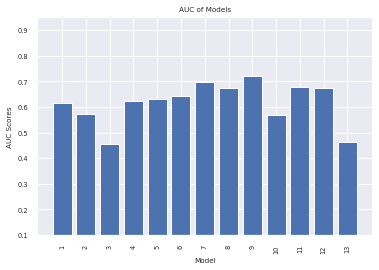

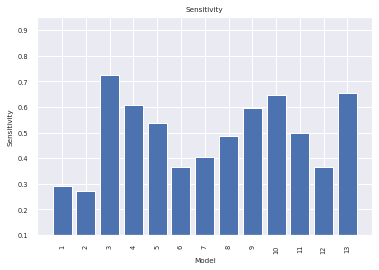

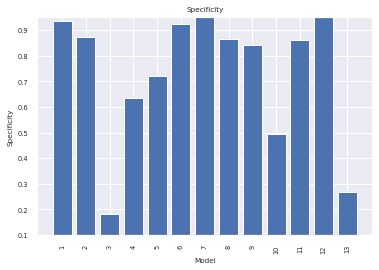

In [23]:
Accuracy = []
auc = []
sensitivity = []
specificity = []
clf = RandomForestClassifier()

for i in range(0,13):
    test, train, test_class, train_class = leave_one_out(df,i)
    clf = ExtraTreesClassifier(n_estimators=50)
    clf = clf.fit(train, train_class.ravel())
    model = SelectFromModel(clf, prefit=True)
    train = model.transform(train)
    # clf = ExtraTreesClassifier(n_estimators=50)
    # clf = clf.fit(test, test_class.ravel())
    # model = SelectFromModel(clf, prefit=True) 

    test = model.transform(test)
    clf = RandomForestClassifier()
    clf.fit(train, train_class.ravel())


    y_predicted = clf.predict(test)
    print(metrics.accuracy_score(test_class,y_predicted))
        # print("Random Forest:\n",metrics.classification_report(test_class,y_predicted)) # Classification report
    Accuracy.append(metrics.accuracy_score(test_class,y_predicted))
    auc.append(metrics.roc_auc_score(test_class,y_predicted))
    mcm = confusion_matrix(test_class,y_predicted)
    tn = mcm[0, 0]
    tp = mcm[1, 1]
    fn = mcm[1, 0]
    fp = mcm[0, 1]
    sensitivity.append(tp / (tp + fn))
    specificity.append(tn / (tn + fp))
    pred = clf.predict_proba(test)
    result = [*zip(test_class.tolist(), y_predicted, pred)]
    print(result)
    report = metrics.classification_report(test_class.tolist(), y_predicted)
    matrix = metrics.confusion_matrix(test_class.tolist(),y_predicted)   

    fig, (ax1) = plt.subplots(1, figsize=(5, 4))


    df_cm1 = pd.DataFrame(matrix, range(2), range(2))
    sn.set(font_scale=0.6) # for label size
    sn.heatmap(df_cm1, annot=True,annot_kws={"size": 8}, fmt='g', cmap='Blues', cbar= False, xticklabels=x_axis_labels, yticklabels=y_axis_labels, ax = ax1) # font size


    ax1.set_title('Random Forests Baseline')

    plt.show()
    metrics.plot_roc_curve(clf, test, test_class.tolist())  # doctest: +SKIP
    plt.show()

Model=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13']

Index = [1,2,3,4,5,6,7,8,9,10,11,12,13]
fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,Accuracy)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Accuracy')
plt.xlabel('Model')
plt.title('Accuracies of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,auc)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('AUC Scores')
plt.xlabel('Model')
plt.title('AUC of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,sensitivity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Sensitivity')
plt.xlabel('Model')
plt.title('Sensitivity')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,specificity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Specificity')
plt.xlabel('Model')
plt.title('Specificity')
plt.show

#### Auto Sklearn Recommendation

In [ ]:
#SVM with manual parameters
svm = Pipeline([('vect', CountVectorizer()),('tfidf', TfidfTransformer()),
                         ('svm', SGDClassifier(loss='hinge', alpha=1e-3, random_state=42)),])

SimpleClassificationPipeline({'balancing:strategy': 'weighting', 'classifier:__choice__': 'random_forest', 'data_preprocessing:categorical_transformer:categorical_encoding:__choice__': 'one_hot_encoding', 'data_preprocessing:categorical_transformer:category_coalescence:__choice__': 'minority_coalescer', 'data_preprocessing:numerical_transformer:imputation:strategy': 'most_frequent', 'data_preprocessing:numerical_transformer:rescaling:__choice__': 'normalize', 'feature_preprocessor:__choice__': 'extra_trees_preproc_for_classification', 'classifier:random_forest:bootstrap': 'False', 'classifier:random_forest:criterion': 'entropy', 'classifier:random_forest:max_depth': 'None', 'classifier:random_forest:max_features': 0.27453376891983117, 'classifier:random_forest:max_leaf_nodes': 'None', 'classifier:random_forest:min_impurity_decrease': 0.0, 'classifier:random_forest:min_samples_leaf': 13, 'classifier:random_forest:min_samples_split': 19, 'classifier:random_forest:min_weight_fraction_leaf': 0.0, 'data_preprocessing:categorical_transformer:category_coalescence:minority_coalescer:minimum_fraction': 0.2166847947584762, 'feature_preprocessor:extra_trees_preproc_for_classification:bootstrap': 'False', 'feature_preprocessor:extra_trees_preproc_for_classification:criterion': 'entropy', 'feature_preprocessor:extra_trees_preproc_for_classification:max_depth': 'None', 'feature_preprocessor:extra_trees_preproc_for_classification:max_features': 0.2819773130241576, 'feature_preprocessor:extra_trees_preproc_for_classification:max_leaf_nodes': 'None', 'feature_preprocessor:extra_trees_preproc_for_classification:min_impurity_decrease': 0.0, 'feature_preprocessor:extra_trees_preproc_for_classification:min_samples_leaf': 20, 'feature_preprocessor:extra_trees_preproc_for_classification:min_samples_split': 3, 'feature_preprocessor:extra_trees_preproc_for_classification:min_weight_fraction_leaf': 0.0, 'feature_preprocessor:extra_trees_preproc_for_classification:n_estimators': 100},
d

### K Nearest Neighbors

#### Baseline

This is the starting index: 0 of patient 0
0.7347294938917975
[([1], 1, array([0.46666667, 0.53333333])), ([1], 0, array([0.86666667, 0.13333333])), ([0], 1, array([0.26666667, 0.73333333])), ([1], 0, array([0.8, 0.2])), ([1], 1, array([0.2, 0.8])), ([0], 0, array([0.86666667, 0.13333333])), ([1], 0, array([0.6, 0.4])), ([0], 0, array([0.86666667, 0.13333333])), ([1], 1, array([0.26666667, 0.73333333])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 0, array([0.8, 0.2])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 1, array([0.4, 0.6])), ([0], 1, array([0.4, 0.6])), ([1], 1, array([0.26666667, 0.73333333])), ([1], 0, array([0.66666667, 0.33333333])), ([1], 1, array([0.33333333, 0.66666667])), ([1], 0, array([0.93333333, 0.06666667])), ([1], 0, array([0.6, 0.4])), ([1], 1, array([0.26666667, 0.73333333])), ([0], 0, array([0.6, 0.4])), ([1], 0, array([0.73333333, 0.26666667])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 1, array([0.46666667, 0.53333333])), ([0], 0, array([0

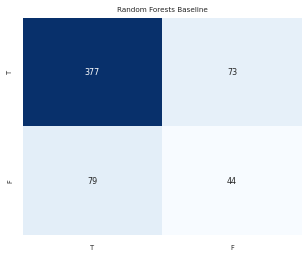

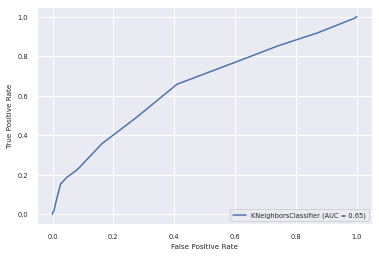

This is the starting index: 574 of patient 1
0.6652360515021459
[([0], 1, array([0.33333333, 0.66666667])), ([0], 1, array([0.4, 0.6])), ([0], 0, array([0.93333333, 0.06666667])), ([0], 1, array([0.33333333, 0.66666667])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 1, array([0.33333333, 0.66666667])), ([1], 0, array([0.53333333, 0.46666667])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 1, array([0.4, 0.6])), ([1], 1, array([0.33333333, 0.66666667])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.53333333, 0.46666667])), ([1], 0, array([0.8, 0.2])), ([0], 0, array([0.6, 0.4])), ([1], 1, array([0., 1.])), ([0], 0, array([0.73333333, 0.26666667])), ([1], 1, array([0.2, 0.8])), ([0], 0, array([0.86666667, 0.13333333])), ([1], 1, array([0.33333333, 0.66666667])), ([0], 0, array([

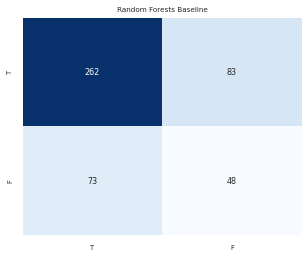

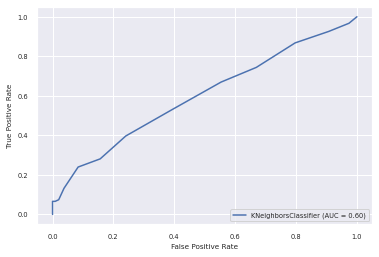

This is the starting index: 1041 of patient 2
0.3310580204778157
[([1], 1, array([0.46666667, 0.53333333])), ([0], 1, array([0.4, 0.6])), ([0], 1, array([0.33333333, 0.66666667])), ([1], 1, array([0., 1.])), ([0], 1, array([0.13333333, 0.86666667])), ([0], 1, array([0.4, 0.6])), ([0], 1, array([0.06666667, 0.93333333])), ([1], 1, array([0.26666667, 0.73333333])), ([1], 1, array([0.26666667, 0.73333333])), ([1], 1, array([0.13333333, 0.86666667])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.13333333, 0.86666667])), ([0], 1, array([0.4, 0.6])), ([1], 1, array([0.4, 0.6])), ([1], 0, array([0.6, 0.4])), ([0], 1, array([0.06666667, 0.93333333])), ([0], 1, array([0.06666667, 0.93333333])), ([0], 1, array([0.06666667, 0.93333333])), ([0], 0, array([0.6, 0.4])), ([0], 1, array([0.26666667, 0.73333333])), ([0], 1, array([0.33333333, 0.66666667])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 1, array([0.06666667, 0.93333333])), ([0], 1, array([0.13333333, 0.

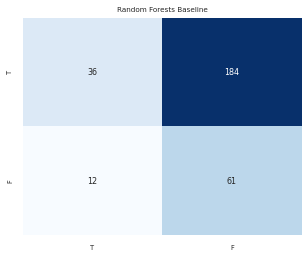

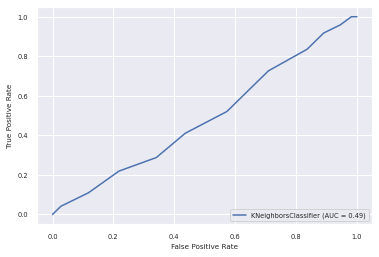

This is the starting index: 1335 of patient 3
0.6137566137566137
[([0], 0, array([0.8, 0.2])), ([1], 0, array([0.8, 0.2])), ([1], 1, array([0.26666667, 0.73333333])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.13333333, 0.86666667])), ([1], 0, array([0.66666667, 0.33333333])), ([1], 1, array([0.26666667, 0.73333333])), ([0], 0, array([0.6, 0.4])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 0, array([0.6, 0.4])), ([0], 1, array([0.26666667, 0.73333333])), ([1], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.6, 0.4])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 1, array([0.4, 0.6])), ([0], 1, array([0.2, 0.8])), ([0], 0, array([0.73333333, 0.26666667])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 0, array([0.53333333, 0.46666667])),

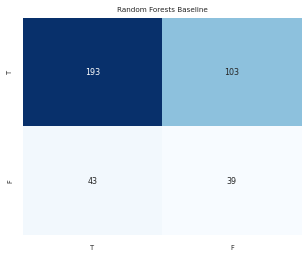

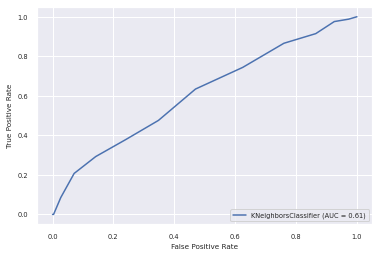

This is the starting index: 1714 of patient 4
0.42524916943521596
[([1], 0, array([0.73333333, 0.26666667])), ([1], 1, array([0.2, 0.8])), ([1], 0, array([0.73333333, 0.26666667])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 1, array([0.4, 0.6])), ([1], 0, array([0.6, 0.4])), ([1], 0, array([0.6, 0.4])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 0, array([0.73333333, 0.26666667])), ([1], 1, array([0.4, 0.6])), ([1], 0, array([0.6, 0.4])), ([1], 0, array([0.6, 0.4])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.33333333, 0.66666667])), ([1], 1, array([0.13333333, 0.86666667])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.13333333, 0.86666667])), ([1], 1, array([0.33333333, 0.66666667])), ([1], 0, array([0.6, 0.4])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 1, array([0.33333333, 0.66666667])), ([1], 1, array([0.4, 0.6])

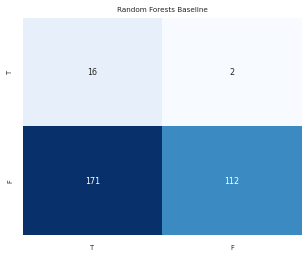

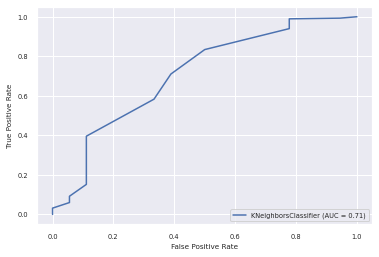

This is the starting index: 2016 of patient 5
0.49223946784922396
[([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.73333333, 0.26666667])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([1., 0.])), ([1], 1, array([0.33333333, 0.66666667])), ([1], 0, array([0.93333333, 0.06666667])), ([1], 0, array([0.6, 0.4])), ([1], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.8, 0.2])), ([1], 0, array([0.6, 0.4])), ([0], 0, array([0.8, 0.2])), ([1], 0, array([0.6, 0.4])), ([1], 0, array([0.8, 0.2])), ([1], 0, array([0.73333333, 0.26666667])), ([1], 0, array([0.73333333, 0.26666667])), ([1], 0, array([0.8, 0.2])), ([1], 0, array([0.73333333, 0.26666667])), ([1], 0, array([0.6, 0.4])), ([1], 1, array([0.06666667, 0.93333333])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 0, array([0.93333333, 0.06666667])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 0, array([0.86666667, 0.13333333])), 

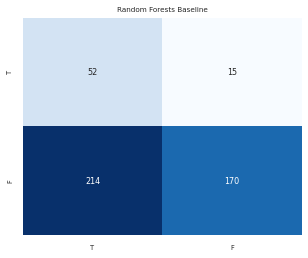

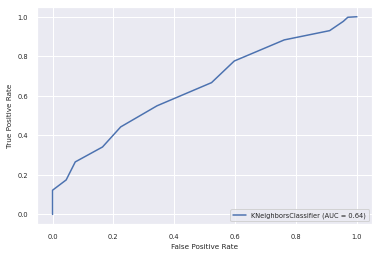

This is the starting index: 2468 of patient 6
0.6325459317585301
[([1], 0, array([0.6, 0.4])), ([1], 1, array([0.13333333, 0.86666667])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.33333333, 0.66666667])), ([1], 1, array([0.2, 0.8])), ([1], 1, array([0.33333333, 0.66666667])), ([1], 0, array([1., 0.])), ([1], 1, array([0.4, 0.6])), ([1], 0, array([0.8, 0.2])), ([0], 0, array([0.93333333, 0.06666667])), ([1], 1, array([0., 1.])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.2, 0.8])), ([1], 1, array([0., 1.])), ([1], 1, array([0.26666667, 0.73333333])), ([1], 1, array([0.13333333, 0.86666667])), ([0], 0, array([0.73333333, 0.26666667])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 1, array([0.26666667, 0.73333333])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 1, array([0.06666667, 0.93333333])), ([1], 0, array([0.8

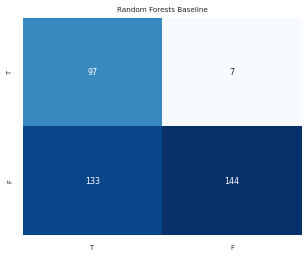

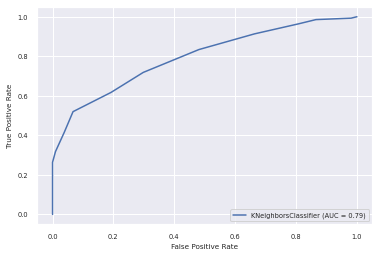

This is the starting index: 2850 of patient 7
0.7463917525773196
[([0], 0, array([0.53333333, 0.46666667])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.6, 0.4])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.86666667, 0.13333333])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.8, 0.2])), ([0], 1, array([0.2, 0.8])), ([0], 1, array([0.26666667, 0.73333333])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.93333333, 0.06666667])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.73333333, 0.26666667])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.93333333, 0.06666667])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 0, array([0.66666667, 0.33333333])),

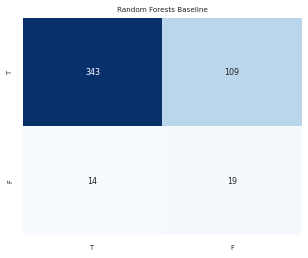

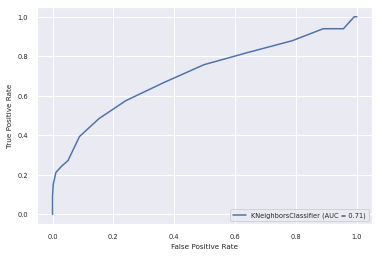

This is the starting index: 3336 of patient 8
0.6903114186851211
[([1], 0, array([0.8, 0.2])), ([1], 1, array([0.33333333, 0.66666667])), ([0], 0, array([0.73333333, 0.26666667])), ([1], 0, array([0.73333333, 0.26666667])), ([1], 1, array([0.26666667, 0.73333333])), ([1], 1, array([0.2, 0.8])), ([1], 0, array([0.66666667, 0.33333333])), ([1], 1, array([0.4, 0.6])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 1, array([0.4, 0.6])), ([0], 0, array([0.53333333, 0.46666667])), ([1], 1, array([0.26666667, 0.73333333])), ([0], 0, array([0.73333333, 0.26666667])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 1, array([0.26666667, 0.73333333])), ([0], 0, array([0.86666667, 0.13333333])), ([0], 0, array([0.6, 0.4])), ([1], 0, array([0.66666667, 0.33333333])), ([1], 1, array([0.06666667, 0.93333333])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 1, array([0.26666667, 0.73333333])), ([0], 0, array([0.6, 0.4])), ([1], 1, array([0.2, 0.8])), ([0], 0, array([0.73333333, 0.26666667])), 

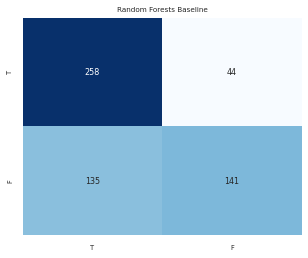

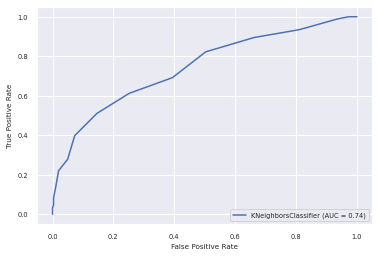

This is the starting index: 3915 of patient 9
0.5553571428571429
[([1], 1, array([0.06666667, 0.93333333])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.26666667, 0.73333333])), ([1], 1, array([0.26666667, 0.73333333])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 0, array([0.66666667, 0.33333333])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 1, array([0.06666667, 0.93333333])), ([1], 1, array([0.2, 0.8])), ([1], 1, array([0.33333333, 0.66666667])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.26666667, 0.73333333])), ([1], 0, array([0.73333333, 0.26666667])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 1, array([0.13333333, 0.86666667])), ([1], 1, array([0.33333333, 0.66666667])), ([1], 1, array([0.26666667, 0.73333333])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 1, array([0.4, 0.6])), ([1], 0, array([0.53333333, 0

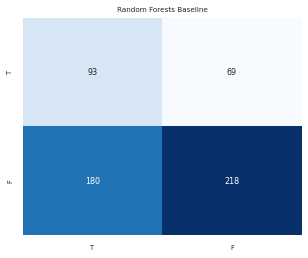

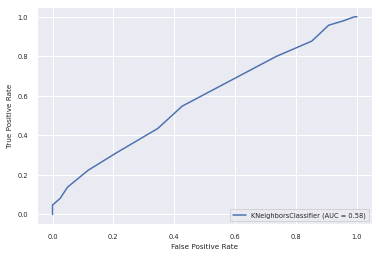

This is the starting index: 4476 of patient 10
0.7755102040816326
[([0], 0, array([0.6, 0.4])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 0, array([0.73333333, 0.26666667])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.53333333, 0.46666667])), ([1], 1, array([0.4, 0.6])), ([1], 0, array([0.73333333, 0.26666667])), ([0], 1, array([0.26666667, 0.73333333])), ([0], 0, array([0.66666667, 0.33333333])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 0, array([0.6, 0.4])), ([1], 0, array([0.73333333, 0.26666667])), ([0], 0, array([0.73333333, 0.26666667])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.8, 0.2])), ([1], 0, array([0.73333333, 0.26666667])), ([0], 1, array([0.4, 0.6])), ([1], 0, array([0.73333333, 0.26666667])), ([0], 0, array([0.86666667, 0.13333333])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 0, arra

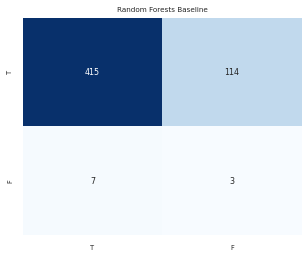

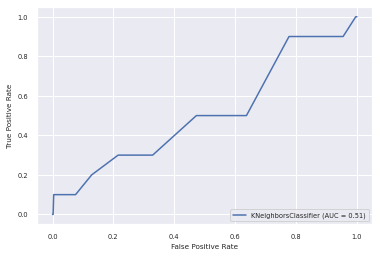

This is the starting index: 5016 of patient 11
0.7272727272727273
[([0], 1, array([0.46666667, 0.53333333])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 1, array([0.26666667, 0.73333333])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 1, array([0.26666667, 0.73333333])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.86666667, 0.13333333])), ([0], 0, array([0.73333333, 0.26666667])), ([0], 1, array([0.46666667, 0.53333333])), ([1], 0, array([0.8, 0.2])), ([0], 0, array([0.53333333, 0.46666667])), ([1], 0, array([0.73333333, 0.26666667])), ([0], 1, array([0.33333333, 0.66666667])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.86666667, 0.13333333])), ([1], 0, array([0.86666667, 0.13333333])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 0, array([0.93333333, 0.06666667])), ([0], 0, array([1., 0.])), ([0], 0, array([

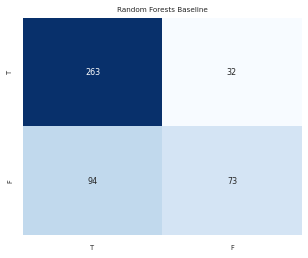

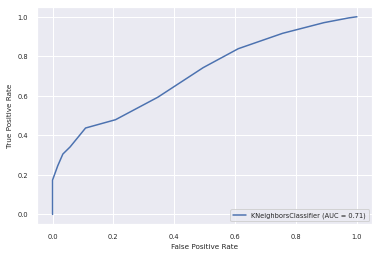

This is the starting index: 5479 of patient 12
0.3764705882352941
[([0], 1, array([0.26666667, 0.73333333])), ([0], 1, array([0.33333333, 0.66666667])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 1, array([0.4, 0.6])), ([0], 1, array([0.26666667, 0.73333333])), ([0], 1, array([0.2, 0.8])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 1, array([0.4, 0.6])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 1, array([0.13333333, 0.86666667])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 1, array([0.4, 0.6])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 1, array([0.2, 0.8])), ([0], 1, array([0.4, 0.6])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 0, array([0.6, 0.4])), ([0], 1, array([0.33333333, 0.66666667])), ([0], 1, array([0.26666667, 0.73333333])), ([0], 1, array([0.2, 0.8])), ([0], 1, array([0.2, 0.8])), ([0], 1, array([0.33333333, 0.66666667])), ([0], 1, array([0.4, 0.6]))

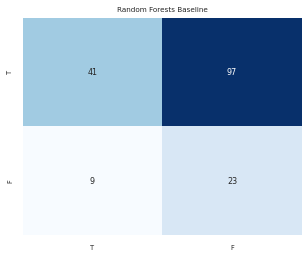

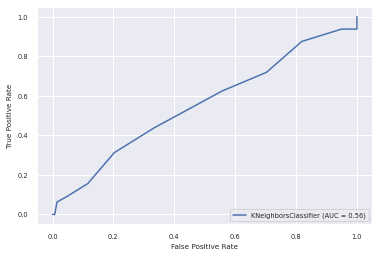

<function matplotlib.pyplot.show>

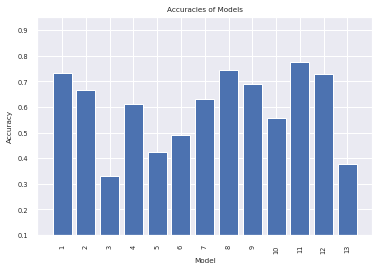

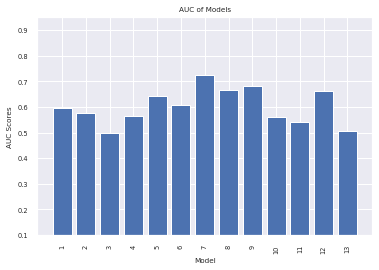

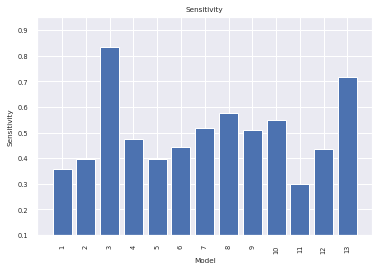

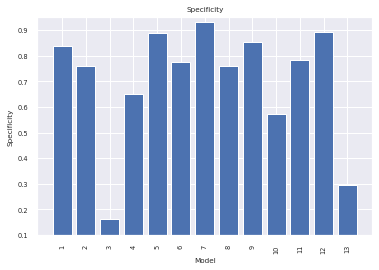

In [24]:
Accuracy = []
auc = []
sensitivity = []
specificity = []
clf = KNeighborsClassifier(n_neighbors=15)

for i in range(0,13):
    test, train, test_class, train_class = leave_one_out(df,i)
    clf.fit(train, train_class.ravel())

    y_predicted = clf.predict(test)
    print(metrics.accuracy_score(test_class,y_predicted))
        # print("Random Forest:\n",metrics.classification_report(test_class,y_predicted)) # Classification report
    Accuracy.append(metrics.accuracy_score(test_class,y_predicted))
    auc.append(metrics.roc_auc_score(test_class,y_predicted))
    mcm = confusion_matrix(test_class,y_predicted)
    tn = mcm[0, 0]
    tp = mcm[1, 1]
    fn = mcm[1, 0]
    fp = mcm[0, 1]
    sensitivity.append(tp / (tp + fn))
    specificity.append(tn / (tn + fp))
    pred = clf.predict_proba(test)
    result = [*zip(test_class.tolist(), y_predicted, pred)]
    print(result) 
    report = metrics.classification_report(test_class.tolist(), y_predicted)
    matrix = metrics.confusion_matrix(test_class.tolist(),y_predicted)   

    fig, (ax1) = plt.subplots(1, figsize=(5, 4))


    df_cm1 = pd.DataFrame(matrix, range(2), range(2))
    sn.set(font_scale=0.6) # for label size
    sn.heatmap(df_cm1, annot=True,annot_kws={"size": 8}, fmt='g', cmap='Blues', cbar= False, xticklabels=x_axis_labels, yticklabels=y_axis_labels, ax = ax1) # font size


    ax1.set_title('Random Forests Baseline')

    plt.show()
    metrics.plot_roc_curve(clf, test, test_class.tolist())  # doctest: +SKIP
    plt.show()

Model=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13']

Index = [1,2,3,4,5,6,7,8,9,10,11,12,13]
fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,Accuracy)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Accuracy')
plt.xlabel('Model')
plt.title('Accuracies of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,auc)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('AUC Scores')
plt.xlabel('Model')
plt.title('AUC of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,sensitivity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Sensitivity')
plt.xlabel('Model')
plt.title('Sensitivity')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,specificity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Specificity')
plt.xlabel('Model')
plt.title('Specificity')
plt.show

#### GridSearch

In [ ]:
parameters = {
    'n_neighbors'      : [20,25,30,35],
    'weights'         : ['uniform', 'distance'],
    'metric'      : ['euclidean','manhattan'],
    #'max_features': ['auto'],
    #'criterion' :['gini']
}


for i in range(0,13):
    test, train, test_class, train_class = leave_one_out(df,i)
    search = GridSearchCV(KNeighborsClassifier(), parameters, cv=10, n_jobs=-1)
    search.fit(train, train_class.ravel())

    print(search.score(train, train_class.ravel()))
    print(search.best_params_)

This is the starting index: 0 of patient 0
1.0
{'metric': 'manhattan', 'n_neighbors': 30, 'weights': 'distance'}
This is the starting index: 574 of patient 1
0.7268518518518519
{'metric': 'manhattan', 'n_neighbors': 30, 'weights': 'uniform'}
This is the starting index: 1041 of patient 2
1.0
{'metric': 'manhattan', 'n_neighbors': 30, 'weights': 'distance'}
This is the starting index: 1335 of patient 3
1.0
{'metric': 'manhattan', 'n_neighbors': 30, 'weights': 'distance'}
This is the starting index: 1714 of patient 4
0.7322864086745186
{'metric': 'euclidean', 'n_neighbors': 30, 'weights': 'uniform'}
This is the starting index: 2016 of patient 5
1.0
{'metric': 'manhattan', 'n_neighbors': 20, 'weights': 'distance'}
This is the starting index: 2468 of patient 6
1.0
{'metric': 'manhattan', 'n_neighbors': 20, 'weights': 'distance'}
This is the starting index: 2850 of patient 7
1.0
{'metric': 'manhattan', 'n_neighbors': 30, 'weights': 'distance'}
This is the starting index: 3336 of patient 8
1.

This is the starting index: 0 of patient 0
0.7818499127399651
[([1], 0, array([0.5716792, 0.4283208])), ([1], 0, array([0.71012126, 0.28987874])), ([0], 1, array([0.41092367, 0.58907633])), ([1], 0, array([0.76267005, 0.23732995])), ([1], 1, array([0.25373487, 0.74626513])), ([0], 0, array([0.80479245, 0.19520755])), ([1], 0, array([0.66646497, 0.33353503])), ([0], 0, array([0.64792259, 0.35207741])), ([1], 1, array([0.26821004, 0.73178996])), ([0], 1, array([0.40879614, 0.59120386])), ([0], 0, array([0.56936666, 0.43063334])), ([1], 1, array([0.3375085, 0.6624915])), ([1], 1, array([0.48734989, 0.51265011])), ([0], 0, array([0.53268309, 0.46731691])), ([1], 1, array([0.33310135, 0.66689865])), ([1], 0, array([0.52585104, 0.47414896])), ([1], 1, array([0.39681863, 0.60318137])), ([1], 0, array([0.8679368, 0.1320632])), ([1], 0, array([0.63697789, 0.36302211])), ([1], 1, array([0.29212488, 0.70787512])), ([0], 0, array([0.56514281, 0.43485719])), ([1], 0, array([0.73499384, 0.26500616])

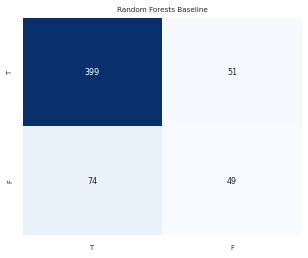

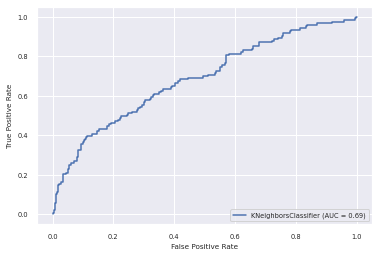

This is the starting index: 574 of patient 1
0.6995708154506438
[([0], 1, array([0.41720625, 0.58279375])), ([0], 1, array([0.3355496, 0.6644504])), ([0], 0, array([0.86781743, 0.13218257])), ([0], 1, array([0.36617995, 0.63382005])), ([0], 1, array([0.35679188, 0.64320812])), ([0], 0, array([0.5899814, 0.4100186])), ([1], 1, array([0.45716068, 0.54283932])), ([0], 1, array([0.44773498, 0.55226502])), ([0], 0, array([0.56768372, 0.43231628])), ([0], 0, array([0.76638677, 0.23361323])), ([0], 0, array([0.69926555, 0.30073445])), ([0], 1, array([0.34184516, 0.65815484])), ([1], 1, array([0.34779105, 0.65220895])), ([0], 1, array([0.45982333, 0.54017667])), ([0], 0, array([0.7455418, 0.2544582])), ([0], 0, array([0.54215051, 0.45784949])), ([0], 0, array([0.55843778, 0.44156222])), ([0], 0, array([0.6429316, 0.3570684])), ([1], 0, array([0.73949443, 0.26050557])), ([0], 0, array([0.70468294, 0.29531706])), ([1], 1, array([0.1622167, 0.8377833])), ([0], 0, array([0.706654, 0.293346])), ([1

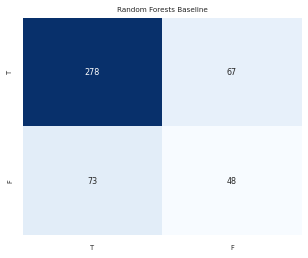

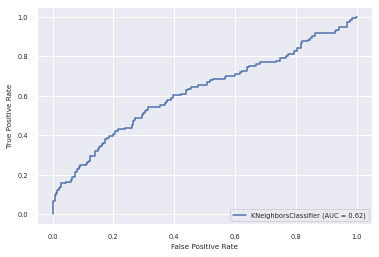

This is the starting index: 1041 of patient 2
0.32081911262798635
[([1], 1, array([0.31649827, 0.68350173])), ([0], 1, array([0.27712899, 0.72287101])), ([0], 1, array([0.2190794, 0.7809206])), ([1], 1, array([0.06107742, 0.93892258])), ([0], 1, array([0.19506881, 0.80493119])), ([0], 1, array([0.26764772, 0.73235228])), ([0], 1, array([0.153186, 0.846814])), ([1], 1, array([0.29017055, 0.70982945])), ([1], 1, array([0.22462257, 0.77537743])), ([1], 1, array([0.32246012, 0.67753988])), ([1], 1, array([0.44264554, 0.55735446])), ([1], 1, array([0.38697394, 0.61302606])), ([1], 1, array([0.19264958, 0.80735042])), ([0], 1, array([0.33400549, 0.66599451])), ([1], 1, array([0.29523295, 0.70476705])), ([1], 1, array([0.4328874, 0.5671126])), ([0], 1, array([0.21206618, 0.78793382])), ([0], 1, array([0.29035376, 0.70964624])), ([0], 1, array([0.12949316, 0.87050684])), ([0], 0, array([0.52957626, 0.47042374])), ([0], 1, array([0.1972778, 0.8027222])), ([0], 1, array([0.29462404, 0.70537596])

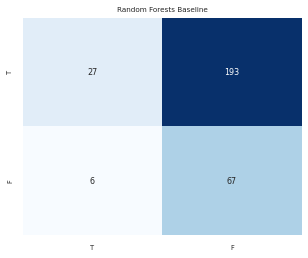

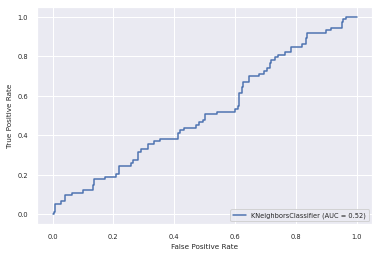

This is the starting index: 1335 of patient 3
0.6481481481481481
[([0], 0, array([0.82713218, 0.17286782])), ([1], 0, array([0.70137922, 0.29862078])), ([1], 1, array([0.39868891, 0.60131109])), ([1], 1, array([0.35990244, 0.64009756])), ([1], 1, array([0.20155277, 0.79844723])), ([1], 0, array([0.63519693, 0.36480307])), ([1], 0, array([0.58749945, 0.41250055])), ([0], 0, array([0.62669128, 0.37330872])), ([0], 1, array([0.46860433, 0.53139567])), ([0], 0, array([0.67006582, 0.32993418])), ([0], 0, array([0.56280916, 0.43719084])), ([0], 0, array([0.68720951, 0.31279049])), ([0], 1, array([0.37328417, 0.62671583])), ([1], 0, array([0.60640845, 0.39359155])), ([0], 0, array([0.70248108, 0.29751892])), ([0], 1, array([0.47198475, 0.52801525])), ([0], 0, array([0.50388256, 0.49611744])), ([0], 1, array([0.19311039, 0.80688961])), ([0], 0, array([0.57756976, 0.42243024])), ([0], 0, array([0.66748959, 0.33251041])), ([0], 0, array([0.54375034, 0.45624966])), ([0], 0, array([0.52588181, 0.4

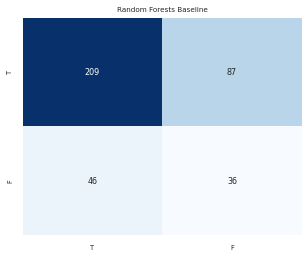

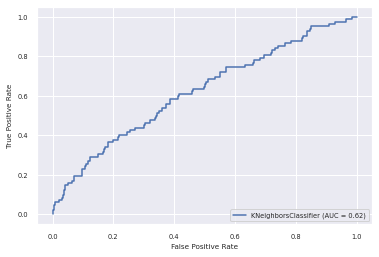

This is the starting index: 1714 of patient 4
0.46179401993355484
[([1], 0, array([0.50630691, 0.49369309])), ([1], 1, array([0.42339588, 0.57660412])), ([1], 0, array([0.69814123, 0.30185877])), ([1], 1, array([0.23700438, 0.76299562])), ([1], 1, array([0.39281916, 0.60718084])), ([1], 0, array([0.50671774, 0.49328226])), ([1], 1, array([0.44157414, 0.55842586])), ([1], 0, array([0.63850484, 0.36149516])), ([1], 0, array([0.66682793, 0.33317207])), ([1], 1, array([0.40274201, 0.59725799])), ([1], 0, array([0.62900944, 0.37099056])), ([1], 0, array([0.69777796, 0.30222204])), ([1], 0, array([0.55014291, 0.44985709])), ([1], 1, array([0.47183259, 0.52816741])), ([1], 0, array([0.5279746, 0.4720254])), ([1], 1, array([0.45934585, 0.54065415])), ([1], 1, array([0.22823176, 0.77176824])), ([1], 1, array([0.43493965, 0.56506035])), ([1], 0, array([0.54120758, 0.45879242])), ([1], 1, array([0.29992722, 0.70007278])), ([1], 1, array([0.29379809, 0.70620191])), ([1], 1, array([0.32839605, 0.67

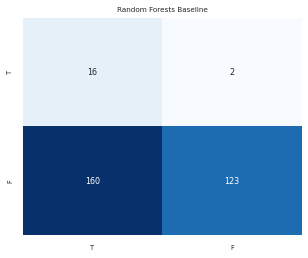

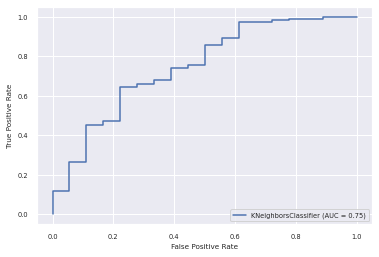

This is the starting index: 2016 of patient 5
0.4656319290465632
[([0], 0, array([0.57211024, 0.42788976])), ([0], 0, array([0.75923804, 0.24076196])), ([0], 0, array([0.71938516, 0.28061484])), ([0], 0, array([0.79879219, 0.20120781])), ([0], 0, array([0.66760199, 0.33239801])), ([0], 0, array([0.87567674, 0.12432326])), ([1], 0, array([0.57523413, 0.42476587])), ([1], 0, array([0.87203953, 0.12796047])), ([1], 0, array([0.61813975, 0.38186025])), ([1], 0, array([0.60132456, 0.39867544])), ([0], 0, array([0.67351651, 0.32648349])), ([1], 0, array([0.7350841, 0.2649159])), ([0], 0, array([0.67990192, 0.32009808])), ([1], 0, array([0.50516672, 0.49483328])), ([1], 0, array([0.77302003, 0.22697997])), ([1], 0, array([0.79837095, 0.20162905])), ([1], 0, array([0.84080907, 0.15919093])), ([1], 0, array([0.64748488, 0.35251512])), ([1], 0, array([0.76640453, 0.23359547])), ([1], 0, array([0.63568372, 0.36431628])), ([1], 1, array([0.15590867, 0.84409133])), ([1], 0, array([0.67207195, 0.327

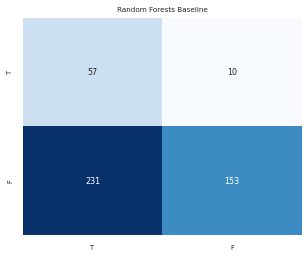

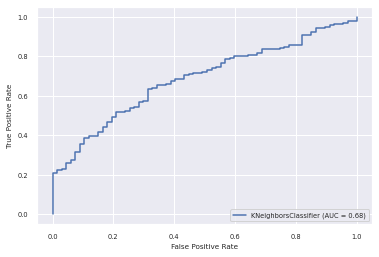

This is the starting index: 2468 of patient 6
0.5879265091863517
[([1], 0, array([0.5980696, 0.4019304])), ([1], 1, array([0.26447316, 0.73552684])), ([1], 0, array([0.53038222, 0.46961778])), ([1], 0, array([0.6353718, 0.3646282])), ([1], 1, array([0.36968683, 0.63031317])), ([1], 1, array([0.22500376, 0.77499624])), ([1], 1, array([0.23263725, 0.76736275])), ([1], 0, array([0.89978807, 0.10021193])), ([1], 0, array([0.5272456, 0.4727544])), ([1], 0, array([0.73923254, 0.26076746])), ([0], 0, array([0.80552438, 0.19447562])), ([1], 1, array([0., 1.])), ([1], 1, array([0.47945131, 0.52054869])), ([1], 1, array([0.41116436, 0.58883564])), ([1], 1, array([0.39360729, 0.60639271])), ([1], 1, array([0.19130252, 0.80869748])), ([1], 1, array([0.02916473, 0.97083527])), ([1], 1, array([0.46440706, 0.53559294])), ([1], 1, array([0.24831936, 0.75168064])), ([0], 0, array([0.6378418, 0.3621582])), ([1], 0, array([0.56030587, 0.43969413])), ([1], 1, array([0.43255914, 0.56744086])), ([1], 0, arr

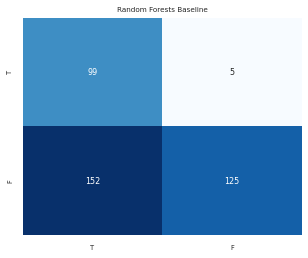

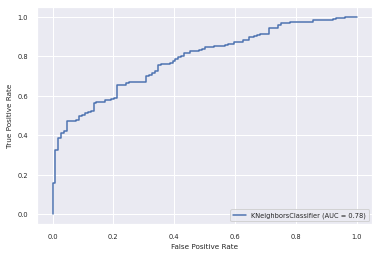

This is the starting index: 2850 of patient 7
0.7793814432989691
[([0], 0, array([0.6133101, 0.3866899])), ([0], 0, array([0.73404847, 0.26595153])), ([0], 0, array([0.68579092, 0.31420908])), ([0], 1, array([0.33151098, 0.66848902])), ([0], 0, array([0.63853349, 0.36146651])), ([0], 0, array([0.61577539, 0.38422461])), ([0], 0, array([0.66087088, 0.33912912])), ([0], 0, array([0.73549864, 0.26450136])), ([0], 0, array([0.839225, 0.160775])), ([0], 0, array([0.71854969, 0.28145031])), ([0], 0, array([0.73634836, 0.26365164])), ([0], 0, array([0.80247407, 0.19752593])), ([0], 1, array([0.2194126, 0.7805874])), ([0], 1, array([0.26199471, 0.73800529])), ([0], 0, array([0.57353088, 0.42646912])), ([0], 0, array([0.9047264, 0.0952736])), ([0], 0, array([0.67567172, 0.32432828])), ([0], 0, array([0.70527321, 0.29472679])), ([0], 0, array([0.70762365, 0.29237635])), ([0], 0, array([0.73017664, 0.26982336])), ([0], 0, array([0.57392373, 0.42607627])), ([0], 0, array([0.75970714, 0.24029286]))

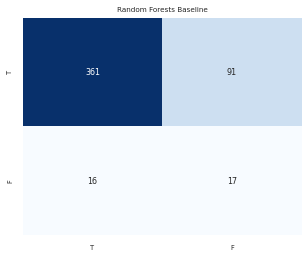

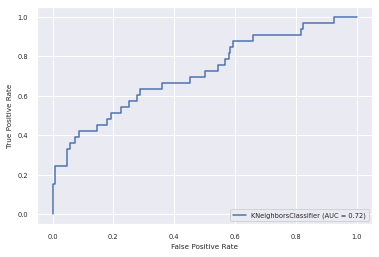

This is the starting index: 3336 of patient 8
0.6851211072664359
[([1], 0, array([0.80194528, 0.19805472])), ([1], 1, array([0.36190177, 0.63809823])), ([0], 0, array([0.73291354, 0.26708646])), ([1], 0, array([0.69730135, 0.30269865])), ([1], 1, array([0.39736403, 0.60263597])), ([1], 1, array([0.43882131, 0.56117869])), ([1], 0, array([0.53406119, 0.46593881])), ([1], 1, array([0.20519125, 0.79480875])), ([1], 0, array([0.52083386, 0.47916614])), ([1], 1, array([0.32206006, 0.67793994])), ([0], 1, array([0.42573646, 0.57426354])), ([1], 1, array([0.45761224, 0.54238776])), ([0], 0, array([0.80644007, 0.19355993])), ([1], 0, array([0.54593563, 0.45406437])), ([1], 1, array([0.39107793, 0.60892207])), ([0], 0, array([0.7678555, 0.2321445])), ([0], 0, array([0.73047886, 0.26952114])), ([1], 0, array([0.75432069, 0.24567931])), ([1], 1, array([0.13215577, 0.86784423])), ([1], 0, array([0.6003261, 0.3996739])), ([1], 1, array([0.26934624, 0.73065376])), ([0], 0, array([0.76084115, 0.23915

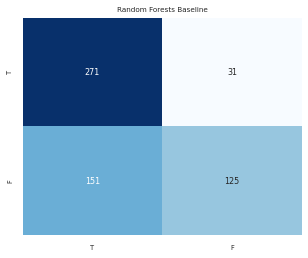

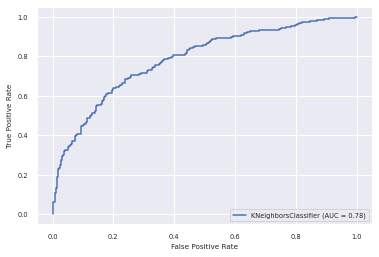

This is the starting index: 3915 of patient 9
0.5428571428571428
[([1], 1, array([0.29433421, 0.70566579])), ([1], 0, array([0.64810007, 0.35189993])), ([1], 1, array([0.34034474, 0.65965526])), ([1], 1, array([0.43622991, 0.56377009])), ([1], 1, array([0.32015426, 0.67984574])), ([1], 1, array([0.27731552, 0.72268448])), ([1], 0, array([0.60760056, 0.39239944])), ([1], 0, array([0.61186495, 0.38813505])), ([1], 1, array([0.40304971, 0.59695029])), ([1], 0, array([0.53838098, 0.46161902])), ([1], 1, array([0.13956162, 0.86043838])), ([1], 1, array([0.36808278, 0.63191722])), ([1], 1, array([0.26183732, 0.73816268])), ([1], 1, array([0.36440981, 0.63559019])), ([1], 0, array([0.52809067, 0.47190933])), ([1], 0, array([0.59638344, 0.40361656])), ([1], 1, array([0.35920401, 0.64079599])), ([1], 1, array([0.35907759, 0.64092241])), ([1], 1, array([0.39267516, 0.60732484])), ([1], 1, array([0.43120892, 0.56879108])), ([1], 1, array([0.28886823, 0.71113177])), ([1], 0, array([0.55343046, 0.4

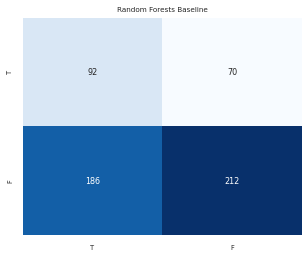

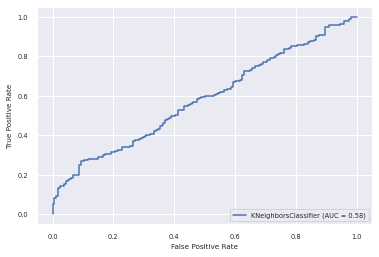

This is the starting index: 4476 of patient 10
0.8107606679035251
[([0], 0, array([0.71490028, 0.28509972])), ([0], 0, array([0.65210949, 0.34789051])), ([0], 0, array([0.6564911, 0.3435089])), ([0], 0, array([0.60791058, 0.39208942])), ([0], 0, array([0.60157927, 0.39842073])), ([0], 0, array([0.66280123, 0.33719877])), ([1], 1, array([0.41135192, 0.58864808])), ([1], 0, array([0.68501673, 0.31498327])), ([0], 1, array([0.42791265, 0.57208735])), ([0], 0, array([0.65513643, 0.34486357])), ([1], 1, array([0.394066, 0.605934])), ([1], 1, array([0.46911631, 0.53088369])), ([1], 0, array([0.63598232, 0.36401768])), ([0], 0, array([0.71565907, 0.28434093])), ([0], 0, array([0.50735848, 0.49264152])), ([0], 0, array([0.72531619, 0.27468381])), ([0], 0, array([0.66854365, 0.33145635])), ([0], 0, array([0.80910447, 0.19089553])), ([1], 0, array([0.57238989, 0.42761011])), ([0], 1, array([0.45575277, 0.54424723])), ([1], 0, array([0.75132374, 0.24867626])), ([0], 0, array([0.84371933, 0.156280

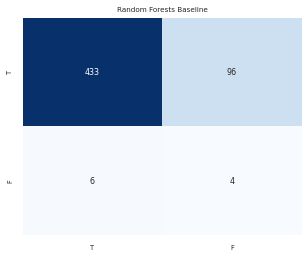

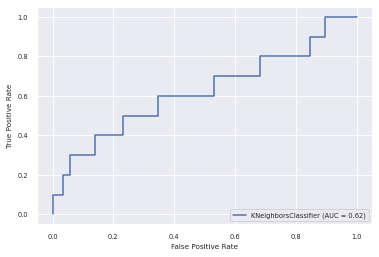

This is the starting index: 5016 of patient 11
0.7380952380952381
[([0], 0, array([0.56630783, 0.43369217])), ([0], 0, array([0.64640306, 0.35359694])), ([0], 0, array([0.86580508, 0.13419492])), ([0], 0, array([0.72551716, 0.27448284])), ([0], 0, array([0.50974898, 0.49025102])), ([0], 0, array([0.70061326, 0.29938674])), ([0], 1, array([0.40058153, 0.59941847])), ([0], 0, array([0.77164433, 0.22835567])), ([0], 0, array([0.66734156, 0.33265844])), ([0], 0, array([0.79736518, 0.20263482])), ([0], 0, array([0.84412862, 0.15587138])), ([0], 0, array([0.72877201, 0.27122799])), ([0], 0, array([0.56329891, 0.43670109])), ([1], 0, array([0.68051722, 0.31948278])), ([0], 0, array([0.6998186, 0.3001814])), ([1], 0, array([0.67397991, 0.32602009])), ([0], 1, array([0.32978555, 0.67021445])), ([0], 0, array([0.65461832, 0.34538168])), ([0], 0, array([0.83891335, 0.16108665])), ([1], 0, array([0.86991444, 0.13008556])), ([0], 0, array([0.66431024, 0.33568976])), ([0], 0, array([0.85841443, 0.14

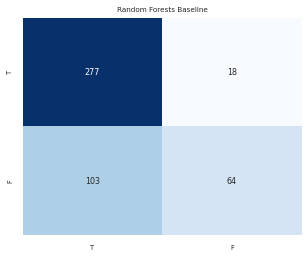

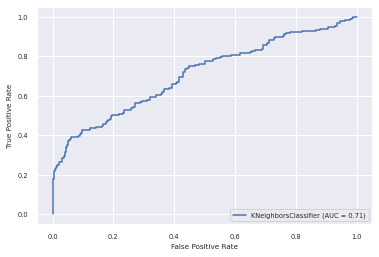

This is the starting index: 5479 of patient 12
0.32941176470588235
[([0], 1, array([0.36175423, 0.63824577])), ([0], 1, array([0.33705947, 0.66294053])), ([0], 1, array([0.4672285, 0.5327715])), ([0], 1, array([0.35578335, 0.64421665])), ([0], 1, array([0.20779776, 0.79220224])), ([0], 1, array([0.29134363, 0.70865637])), ([0], 0, array([0.59676115, 0.40323885])), ([0], 1, array([0.43659222, 0.56340778])), ([0], 0, array([0.50210212, 0.49789788])), ([0], 1, array([0.46382431, 0.53617569])), ([0], 1, array([0.19890376, 0.80109624])), ([0], 1, array([0.30808492, 0.69191508])), ([0], 1, array([0.49721045, 0.50278955])), ([0], 0, array([0.55871522, 0.44128478])), ([0], 1, array([0.1406676, 0.8593324])), ([0], 1, array([0.34455722, 0.65544278])), ([0], 0, array([0.65729711, 0.34270289])), ([0], 1, array([0.46892114, 0.53107886])), ([0], 0, array([0.56847285, 0.43152715])), ([0], 1, array([0.1997668, 0.8002332])), ([0], 1, array([0.36320788, 0.63679212])), ([0], 1, array([0.31985827, 0.68014

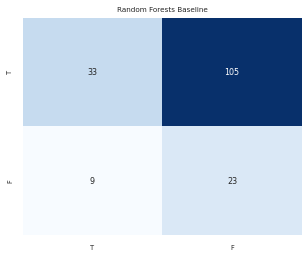

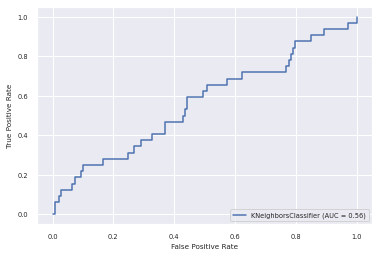

<function matplotlib.pyplot.show>

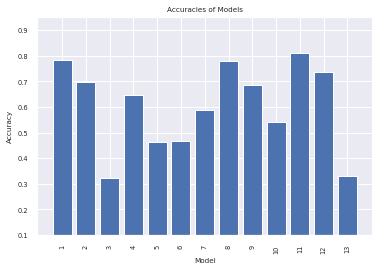

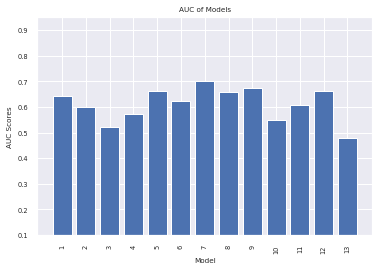

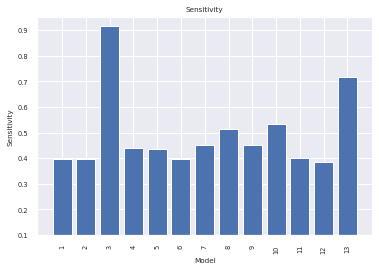

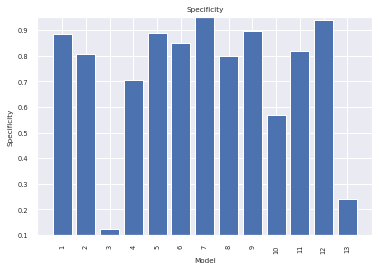

In [25]:
Accuracy = []
auc = []
specificity = []
sensitivity = []
clf = KNeighborsClassifier(n_neighbors=30, metric='manhattan', weights= 'distance')

for i in range(0,13):
    test, train, test_class, train_class = leave_one_out(df,i)
    clf.fit(train, train_class.ravel())

    y_predicted = clf.predict(test)
    print(metrics.accuracy_score(test_class,y_predicted))
        # print("Random Forest:\n",metrics.classification_report(test_class,y_predicted)) # Classification report
    Accuracy.append(metrics.accuracy_score(test_class,y_predicted))
    auc.append(metrics.roc_auc_score(test_class,y_predicted))
    mcm = confusion_matrix(test_class,y_predicted)
    tn = mcm[0, 0]
    tp = mcm[1, 1]
    fn = mcm[1, 0]
    fp = mcm[0, 1]
    sensitivity.append(tp / (tp + fn))
    specificity.append(tn / (tn + fp))
    pred = clf.predict_proba(test)
    result = [*zip(test_class.tolist(), y_predicted, pred)]
    print(result)
    report = metrics.classification_report(test_class.tolist(), y_predicted)
    matrix = metrics.confusion_matrix(test_class.tolist(),y_predicted)   

    fig, (ax1) = plt.subplots(1, figsize=(5, 4))


    df_cm1 = pd.DataFrame(matrix, range(2), range(2))
    sn.set(font_scale=0.6) # for label size
    sn.heatmap(df_cm1, annot=True,annot_kws={"size": 8}, fmt='g', cmap='Blues', cbar= False, xticklabels=x_axis_labels, yticklabels=y_axis_labels, ax = ax1) # font size


    ax1.set_title('Random Forests Baseline')

    plt.show()
    metrics.plot_roc_curve(clf, test, test_class.tolist())  # doctest: +SKIP
    plt.show()

Model=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13']

Index = [1,2,3,4,5,6,7,8,9,10,11,12,13]
fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,Accuracy)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Accuracy')
plt.xlabel('Model')
plt.title('Accuracies of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,auc)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('AUC Scores')
plt.xlabel('Model')
plt.title('AUC of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,sensitivity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Sensitivity')
plt.xlabel('Model')
plt.title('Sensitivity')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,specificity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Specificity')
plt.xlabel('Model')
plt.title('Specificity')
plt.show

#### Low Variance

This is the starting index: 0 of patient 0
0.7347294938917975
[([1], 1, array([0.46666667, 0.53333333])), ([1], 0, array([0.86666667, 0.13333333])), ([0], 1, array([0.26666667, 0.73333333])), ([1], 0, array([0.8, 0.2])), ([1], 1, array([0.2, 0.8])), ([0], 0, array([0.86666667, 0.13333333])), ([1], 0, array([0.6, 0.4])), ([0], 0, array([0.86666667, 0.13333333])), ([1], 1, array([0.26666667, 0.73333333])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 0, array([0.8, 0.2])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 1, array([0.4, 0.6])), ([0], 1, array([0.4, 0.6])), ([1], 1, array([0.26666667, 0.73333333])), ([1], 0, array([0.66666667, 0.33333333])), ([1], 1, array([0.33333333, 0.66666667])), ([1], 0, array([0.93333333, 0.06666667])), ([1], 0, array([0.6, 0.4])), ([1], 1, array([0.26666667, 0.73333333])), ([0], 0, array([0.6, 0.4])), ([1], 0, array([0.73333333, 0.26666667])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 1, array([0.46666667, 0.53333333])), ([0], 0, array([0

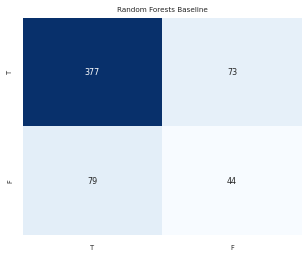

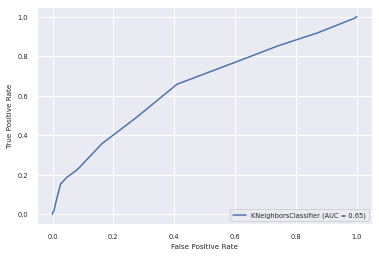

This is the starting index: 574 of patient 1
0.6652360515021459
[([0], 1, array([0.33333333, 0.66666667])), ([0], 1, array([0.4, 0.6])), ([0], 0, array([0.93333333, 0.06666667])), ([0], 1, array([0.33333333, 0.66666667])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 1, array([0.33333333, 0.66666667])), ([1], 0, array([0.53333333, 0.46666667])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 1, array([0.4, 0.6])), ([1], 1, array([0.33333333, 0.66666667])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.53333333, 0.46666667])), ([1], 0, array([0.8, 0.2])), ([0], 0, array([0.6, 0.4])), ([1], 1, array([0., 1.])), ([0], 0, array([0.73333333, 0.26666667])), ([1], 1, array([0.2, 0.8])), ([0], 0, array([0.86666667, 0.13333333])), ([1], 1, array([0.33333333, 0.66666667])), ([0], 0, array([

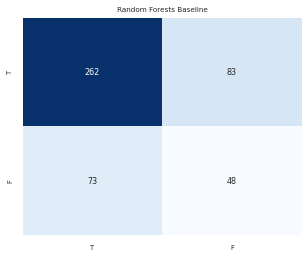

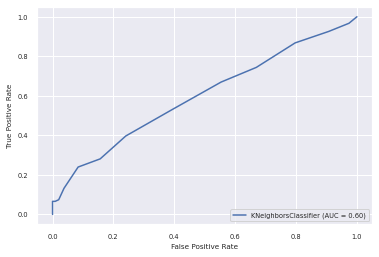

This is the starting index: 1041 of patient 2
0.3310580204778157
[([1], 1, array([0.46666667, 0.53333333])), ([0], 1, array([0.4, 0.6])), ([0], 1, array([0.33333333, 0.66666667])), ([1], 1, array([0., 1.])), ([0], 1, array([0.13333333, 0.86666667])), ([0], 1, array([0.4, 0.6])), ([0], 1, array([0.06666667, 0.93333333])), ([1], 1, array([0.26666667, 0.73333333])), ([1], 1, array([0.26666667, 0.73333333])), ([1], 1, array([0.13333333, 0.86666667])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.13333333, 0.86666667])), ([0], 1, array([0.4, 0.6])), ([1], 1, array([0.4, 0.6])), ([1], 0, array([0.6, 0.4])), ([0], 1, array([0.06666667, 0.93333333])), ([0], 1, array([0.06666667, 0.93333333])), ([0], 1, array([0.06666667, 0.93333333])), ([0], 0, array([0.6, 0.4])), ([0], 1, array([0.26666667, 0.73333333])), ([0], 1, array([0.33333333, 0.66666667])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 1, array([0.06666667, 0.93333333])), ([0], 1, array([0.13333333, 0.

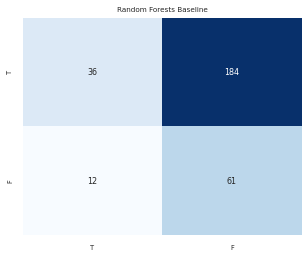

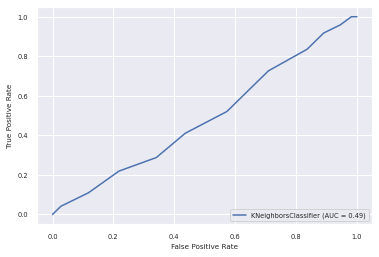

This is the starting index: 1335 of patient 3
0.6137566137566137
[([0], 0, array([0.8, 0.2])), ([1], 0, array([0.8, 0.2])), ([1], 1, array([0.26666667, 0.73333333])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.13333333, 0.86666667])), ([1], 0, array([0.66666667, 0.33333333])), ([1], 1, array([0.26666667, 0.73333333])), ([0], 0, array([0.6, 0.4])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 0, array([0.6, 0.4])), ([0], 1, array([0.26666667, 0.73333333])), ([1], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.6, 0.4])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 1, array([0.4, 0.6])), ([0], 1, array([0.2, 0.8])), ([0], 0, array([0.73333333, 0.26666667])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 0, array([0.53333333, 0.46666667])),

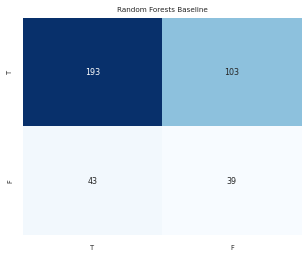

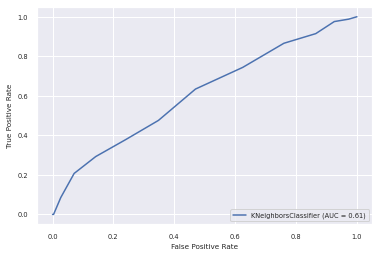

This is the starting index: 1714 of patient 4
0.42524916943521596
[([1], 0, array([0.73333333, 0.26666667])), ([1], 1, array([0.2, 0.8])), ([1], 0, array([0.73333333, 0.26666667])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 1, array([0.4, 0.6])), ([1], 0, array([0.6, 0.4])), ([1], 0, array([0.6, 0.4])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 0, array([0.73333333, 0.26666667])), ([1], 1, array([0.4, 0.6])), ([1], 0, array([0.6, 0.4])), ([1], 0, array([0.6, 0.4])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.33333333, 0.66666667])), ([1], 1, array([0.13333333, 0.86666667])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.13333333, 0.86666667])), ([1], 1, array([0.33333333, 0.66666667])), ([1], 0, array([0.6, 0.4])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 1, array([0.33333333, 0.66666667])), ([1], 1, array([0.4, 0.6])

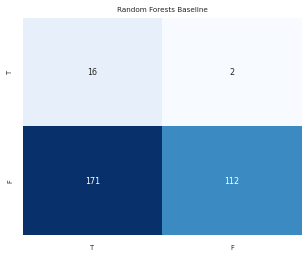

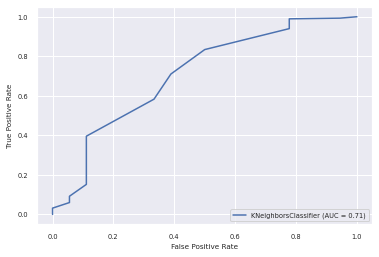

This is the starting index: 2016 of patient 5
0.49223946784922396
[([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.73333333, 0.26666667])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([1., 0.])), ([1], 1, array([0.33333333, 0.66666667])), ([1], 0, array([0.93333333, 0.06666667])), ([1], 0, array([0.6, 0.4])), ([1], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.8, 0.2])), ([1], 0, array([0.6, 0.4])), ([0], 0, array([0.8, 0.2])), ([1], 0, array([0.6, 0.4])), ([1], 0, array([0.8, 0.2])), ([1], 0, array([0.73333333, 0.26666667])), ([1], 0, array([0.73333333, 0.26666667])), ([1], 0, array([0.8, 0.2])), ([1], 0, array([0.73333333, 0.26666667])), ([1], 0, array([0.6, 0.4])), ([1], 1, array([0.06666667, 0.93333333])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 0, array([0.93333333, 0.06666667])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 0, array([0.86666667, 0.13333333])), 

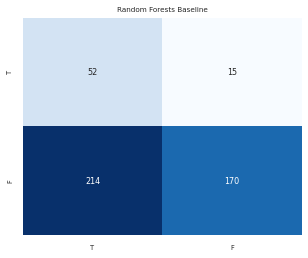

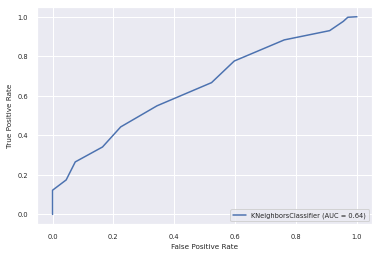

This is the starting index: 2468 of patient 6
0.6325459317585301
[([1], 0, array([0.6, 0.4])), ([1], 1, array([0.13333333, 0.86666667])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.33333333, 0.66666667])), ([1], 1, array([0.2, 0.8])), ([1], 1, array([0.33333333, 0.66666667])), ([1], 0, array([1., 0.])), ([1], 1, array([0.4, 0.6])), ([1], 0, array([0.8, 0.2])), ([0], 0, array([0.93333333, 0.06666667])), ([1], 1, array([0., 1.])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.2, 0.8])), ([1], 1, array([0., 1.])), ([1], 1, array([0.26666667, 0.73333333])), ([1], 1, array([0.13333333, 0.86666667])), ([0], 0, array([0.73333333, 0.26666667])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 1, array([0.26666667, 0.73333333])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 1, array([0.06666667, 0.93333333])), ([1], 0, array([0.8

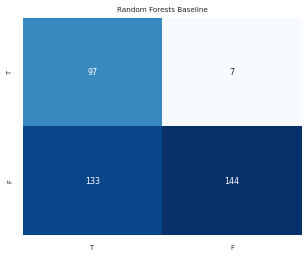

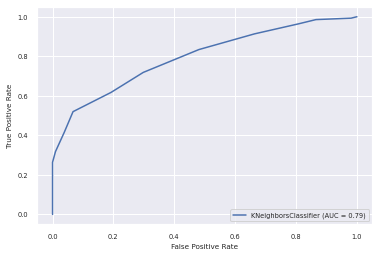

This is the starting index: 2850 of patient 7
0.7463917525773196
[([0], 0, array([0.53333333, 0.46666667])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.6, 0.4])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.86666667, 0.13333333])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.8, 0.2])), ([0], 1, array([0.2, 0.8])), ([0], 1, array([0.26666667, 0.73333333])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.93333333, 0.06666667])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.73333333, 0.26666667])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.93333333, 0.06666667])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 0, array([0.66666667, 0.33333333])),

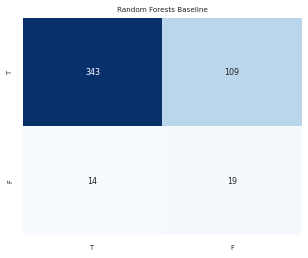

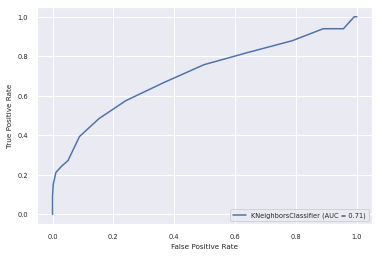

This is the starting index: 3336 of patient 8
0.6903114186851211
[([1], 0, array([0.8, 0.2])), ([1], 1, array([0.33333333, 0.66666667])), ([0], 0, array([0.73333333, 0.26666667])), ([1], 0, array([0.73333333, 0.26666667])), ([1], 1, array([0.26666667, 0.73333333])), ([1], 1, array([0.2, 0.8])), ([1], 0, array([0.66666667, 0.33333333])), ([1], 1, array([0.4, 0.6])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 1, array([0.4, 0.6])), ([0], 0, array([0.53333333, 0.46666667])), ([1], 1, array([0.26666667, 0.73333333])), ([0], 0, array([0.73333333, 0.26666667])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 1, array([0.26666667, 0.73333333])), ([0], 0, array([0.86666667, 0.13333333])), ([0], 0, array([0.6, 0.4])), ([1], 0, array([0.66666667, 0.33333333])), ([1], 1, array([0.06666667, 0.93333333])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 1, array([0.26666667, 0.73333333])), ([0], 0, array([0.6, 0.4])), ([1], 1, array([0.2, 0.8])), ([0], 0, array([0.73333333, 0.26666667])), 

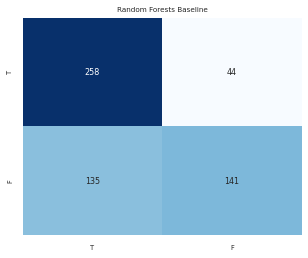

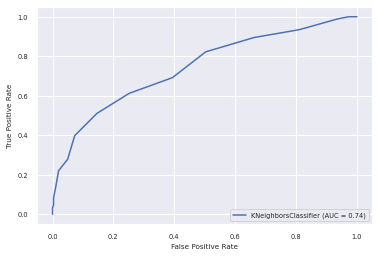

This is the starting index: 3915 of patient 9
0.5553571428571429
[([1], 1, array([0.06666667, 0.93333333])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.26666667, 0.73333333])), ([1], 1, array([0.26666667, 0.73333333])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 0, array([0.66666667, 0.33333333])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 1, array([0.06666667, 0.93333333])), ([1], 1, array([0.2, 0.8])), ([1], 1, array([0.33333333, 0.66666667])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.26666667, 0.73333333])), ([1], 0, array([0.73333333, 0.26666667])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 1, array([0.13333333, 0.86666667])), ([1], 1, array([0.33333333, 0.66666667])), ([1], 1, array([0.26666667, 0.73333333])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 1, array([0.4, 0.6])), ([1], 0, array([0.53333333, 0

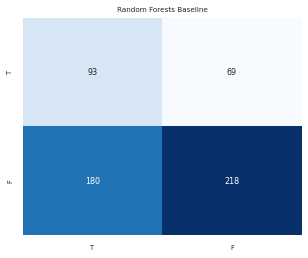

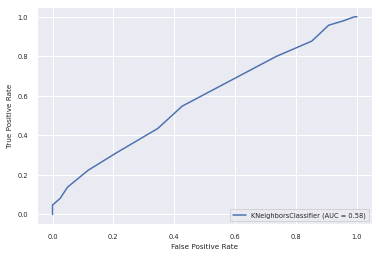

This is the starting index: 4476 of patient 10
0.7755102040816326
[([0], 0, array([0.6, 0.4])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 0, array([0.73333333, 0.26666667])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.53333333, 0.46666667])), ([1], 1, array([0.4, 0.6])), ([1], 0, array([0.73333333, 0.26666667])), ([0], 1, array([0.26666667, 0.73333333])), ([0], 0, array([0.66666667, 0.33333333])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 0, array([0.6, 0.4])), ([1], 0, array([0.73333333, 0.26666667])), ([0], 0, array([0.73333333, 0.26666667])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.8, 0.2])), ([1], 0, array([0.73333333, 0.26666667])), ([0], 1, array([0.4, 0.6])), ([1], 0, array([0.73333333, 0.26666667])), ([0], 0, array([0.86666667, 0.13333333])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 0, arra

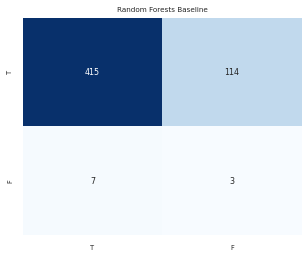

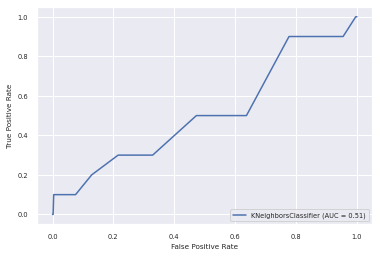

This is the starting index: 5016 of patient 11
0.7272727272727273
[([0], 1, array([0.46666667, 0.53333333])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 1, array([0.26666667, 0.73333333])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 1, array([0.26666667, 0.73333333])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.86666667, 0.13333333])), ([0], 0, array([0.73333333, 0.26666667])), ([0], 1, array([0.46666667, 0.53333333])), ([1], 0, array([0.8, 0.2])), ([0], 0, array([0.53333333, 0.46666667])), ([1], 0, array([0.73333333, 0.26666667])), ([0], 1, array([0.33333333, 0.66666667])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.86666667, 0.13333333])), ([1], 0, array([0.86666667, 0.13333333])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 0, array([0.93333333, 0.06666667])), ([0], 0, array([1., 0.])), ([0], 0, array([

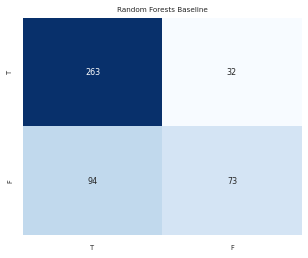

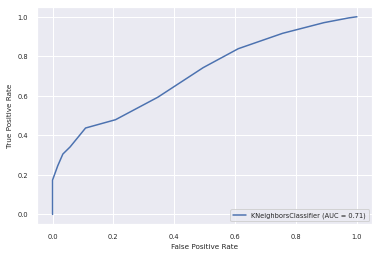

This is the starting index: 5479 of patient 12


ValueError: ignored

In [26]:
Accuracy = []
auc = []
sensitivity = []
specificity = []
clf = KNeighborsClassifier(n_neighbors=15)
sel = VarianceThreshold(threshold=(.2 * (1 - .8)))
for i in range(0,13):
    test, train, test_class, train_class = leave_one_out(df,i)
    sel.fit_transform(train)
    sel.fit_transform(test)
    clf.fit(train, train_class.ravel())

    y_predicted = clf.predict(test)
    print(metrics.accuracy_score(test_class,y_predicted))
        # print("Random Forest:\n",metrics.classification_report(test_class,y_predicted)) # Classification report
    Accuracy.append(metrics.accuracy_score(test_class,y_predicted))
    auc.append(metrics.roc_auc_score(test_class,y_predicted))
    mcm = confusion_matrix(test_class,y_predicted)
    tn = mcm[0, 0]
    tp = mcm[1, 1]
    fn = mcm[1, 0]
    fp = mcm[0, 1]
    sensitivity.append(tp / (tp + fn))
    specificity.append(tn / (tn + fp))
    pred = clf.predict_proba(test)
    result = [*zip(test_class.tolist(), y_predicted, pred)]
    print(result)
    report = metrics.classification_report(test_class.tolist(), y_predicted)
    matrix = metrics.confusion_matrix(test_class.tolist(),y_predicted)   

    fig, (ax1) = plt.subplots(1, figsize=(5, 4))


    df_cm1 = pd.DataFrame(matrix, range(2), range(2))
    sn.set(font_scale=0.6) # for label size
    sn.heatmap(df_cm1, annot=True,annot_kws={"size": 8}, fmt='g', cmap='Blues', cbar= False, xticklabels=x_axis_labels, yticklabels=y_axis_labels, ax = ax1) # font size


    ax1.set_title('Random Forests Baseline')

    plt.show()
    metrics.plot_roc_curve(clf, test, test_class.tolist())  # doctest: +SKIP
    plt.show()

Model=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13']

Index = [1,2,3,4,5,6,7,8,9,10,11,12,13]
fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,Accuracy)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Accuracy')
plt.xlabel('Model')
plt.title('Accuracies of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,auc)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('AUC Scores')
plt.xlabel('Model')
plt.title('AUC of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,sensitivity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Sensitivity')
plt.xlabel('Model')
plt.title('Sensitivity')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,specificity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Specificity')
plt.xlabel('Model')
plt.title('Specificity')
plt.show

#### Univariate Feature Selection

#### L1-based feature selection

This is the starting index: 0 of patient 0
0.7469458987783595
[([1], 0, array([0.53333333, 0.46666667])), ([1], 0, array([0.73333333, 0.26666667])), ([0], 1, array([0.26666667, 0.73333333])), ([1], 0, array([0.6, 0.4])), ([1], 1, array([0.13333333, 0.86666667])), ([0], 0, array([0.93333333, 0.06666667])), ([1], 1, array([0.4, 0.6])), ([0], 0, array([0.86666667, 0.13333333])), ([1], 1, array([0.46666667, 0.53333333])), ([0], 1, array([0.33333333, 0.66666667])), ([0], 0, array([0.66666667, 0.33333333])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.26666667, 0.73333333])), ([0], 1, array([0.46666667, 0.53333333])), ([1], 1, array([0.4, 0.6])), ([1], 0, array([0.6, 0.4])), ([1], 1, array([0.33333333, 0.66666667])), ([1], 0, array([0.93333333, 0.06666667])), ([1], 0, array([0.73333333, 0.26666667])), ([1], 1, array([0.46666667, 0.53333333])), ([0], 0, array([0.53333333, 0.46666667])), ([1], 0, array([0.8, 0.2])), ([1], 1, array([0.33333333, 0.66666667])), ([1], 0, array([0.53333333, 0.46

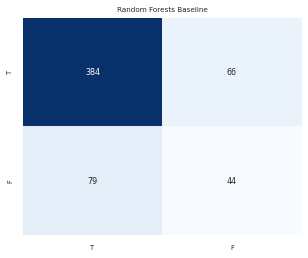

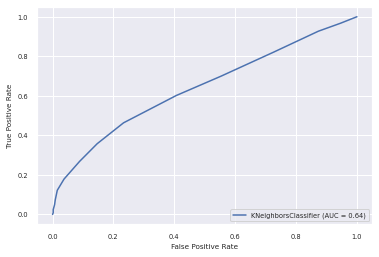

This is the starting index: 574 of patient 1
0.6437768240343348
[([0], 0, array([0.8, 0.2])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 1, array([0.4, 0.6])), ([1], 0, array([0.6, 0.4])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.73333333, 0.26666667])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 1, array([0.46666667, 0.53333333])), ([1], 0, array([0.53333333, 0.46666667])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 0, array([0.8, 0.2])), ([1], 0, array([0.66666667, 0.33333333])), ([0], 1, array([0.46666667, 0.53333333])), ([1], 1, array([0.06666667, 0.93333333])), ([0], 0, array([0.8, 0.2])), ([1], 1, array([0.13333333, 0.86666667])), ([0], 0, array([0.8, 0.2])), ([1], 1, array(

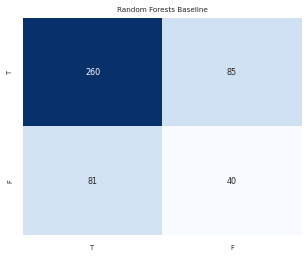

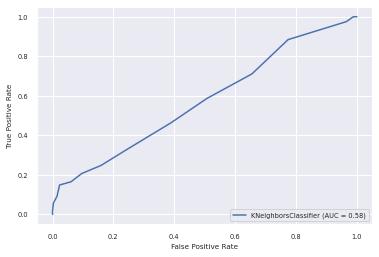

This is the starting index: 1041 of patient 2
0.3412969283276451
[([1], 1, array([0.46666667, 0.53333333])), ([0], 1, array([0.4, 0.6])), ([0], 1, array([0.33333333, 0.66666667])), ([1], 1, array([0.13333333, 0.86666667])), ([0], 1, array([0.2, 0.8])), ([0], 1, array([0.33333333, 0.66666667])), ([0], 1, array([0.06666667, 0.93333333])), ([1], 1, array([0.2, 0.8])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 1, array([0.2, 0.8])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 1, array([0.2, 0.8])), ([1], 1, array([0.06666667, 0.93333333])), ([0], 1, array([0.4, 0.6])), ([1], 1, array([0.26666667, 0.73333333])), ([1], 1, array([0.26666667, 0.73333333])), ([0], 1, array([0.06666667, 0.93333333])), ([0], 1, array([0., 1.])), ([0], 1, array([0.13333333, 0.86666667])), ([0], 1, array([0.4, 0.6])), ([0], 1, array([0.06666667, 0.93333333])), ([0], 1, array([0.2, 0.8])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 1, array([0., 1.])), ([0], 1, array([0.2, 0.8])), ([0], 1, array([0

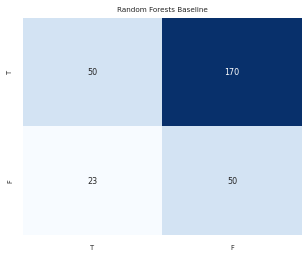

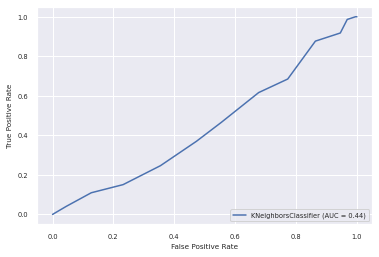

This is the starting index: 1335 of patient 3
0.6084656084656085
[([0], 0, array([0.73333333, 0.26666667])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.33333333, 0.66666667])), ([1], 0, array([0.6, 0.4])), ([1], 1, array([0.33333333, 0.66666667])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 1, array([0.33333333, 0.66666667])), ([0], 1, array([0.4, 0.6])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 1, array([0.2, 0.8])), ([1], 0, array([0.66666667, 0.33333333])), ([0], 1, array([0.33333333, 0.66666667])), ([0], 0, array([0.6, 0.4])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 1, array([0.2, 0.8])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 1, array([0.33333333, 0.66666667])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 0, array([0.53333333, 0.46666667])), 

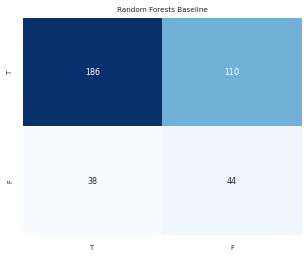

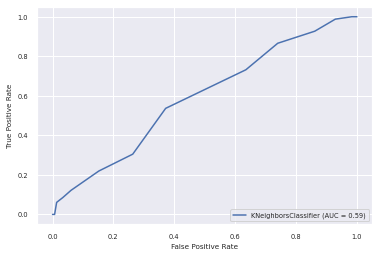

This is the starting index: 1714 of patient 4
0.4152823920265781
[([1], 1, array([0.33333333, 0.66666667])), ([1], 1, array([0.4, 0.6])), ([1], 0, array([0.73333333, 0.26666667])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 0, array([0.8, 0.2])), ([1], 0, array([0.8, 0.2])), ([1], 0, array([0.8, 0.2])), ([1], 0, array([0.73333333, 0.26666667])), ([1], 1, array([0.2, 0.8])), ([1], 0, array([0.6, 0.4])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.13333333, 0.86666667])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 0, array([0.6, 0.4])), ([1], 1, array([0.4, 0.6])), ([1], 0, array([0.6, 0.4])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 0, array([0.6, 0.4])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 1, array([0.4, 0.6])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 1, array([0.26666667,

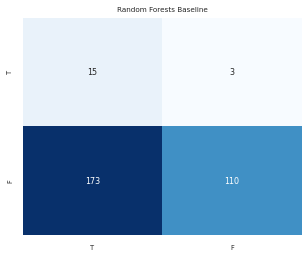

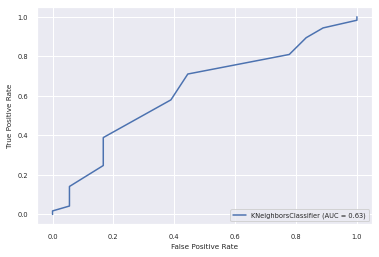

This is the starting index: 2016 of patient 5
0.4722838137472284
[([0], 0, array([0.73333333, 0.26666667])), ([0], 0, array([0.86666667, 0.13333333])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.93333333, 0.06666667])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 0, array([0.93333333, 0.06666667])), ([1], 0, array([0.8, 0.2])), ([1], 0, array([0.93333333, 0.06666667])), ([1], 0, array([0.73333333, 0.26666667])), ([1], 1, array([0.33333333, 0.66666667])), ([0], 0, array([0.53333333, 0.46666667])), ([1], 0, array([0.8, 0.2])), ([0], 0, array([0.73333333, 0.26666667])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 0, array([0.8, 0.2])), ([1], 0, array([0.66666667, 0.33333333])), ([1], 0, array([0.6, 0.4])), ([1], 0, array([0.73333333, 0.26666667])), ([1], 0, array([0.8, 0.2])), ([1], 0, array([0.8, 0.2])), ([1], 1, array([0.06666667, 0.93333333])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 0, array([0.86666667, 0.13333333])), ([1], 0, array([0.66666667, 0.33333333])), 

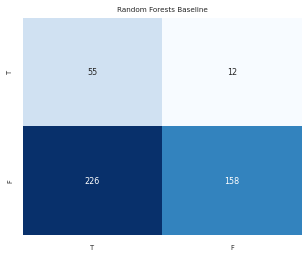

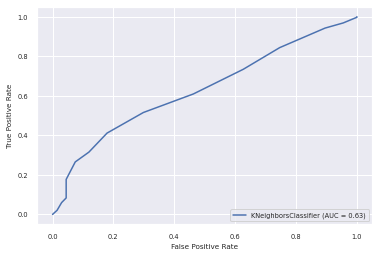

This is the starting index: 2468 of patient 6
0.5826771653543307
[([1], 0, array([0.6, 0.4])), ([1], 1, array([0.26666667, 0.73333333])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 0, array([0.8, 0.2])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.2, 0.8])), ([1], 1, array([0.26666667, 0.73333333])), ([1], 0, array([1., 0.])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 0, array([0.53333333, 0.46666667])), ([0], 0, array([0.86666667, 0.13333333])), ([1], 1, array([0.13333333, 0.86666667])), ([1], 0, array([0.73333333, 0.26666667])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 0, array([0.86666667, 0.13333333])), ([1], 1, array([0.33333333, 0.66666667])), ([1], 1, array([0.26666667, 0.73333333])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 1, array([0.2, 0.8])), ([0], 0, array([0.73333333, 0.26666667])), ([1], 1, array([0.33333333, 0.66666667])), ([1], 1, array([0.26666667, 0.73333333])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 1, array([0.4, 0.6])), ([

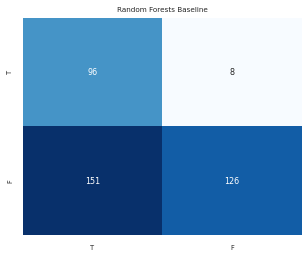

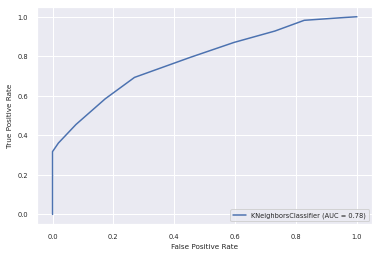

This is the starting index: 2850 of patient 7
0.7051546391752578
[([0], 1, array([0.46666667, 0.53333333])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.6, 0.4])), ([0], 1, array([0.26666667, 0.73333333])), ([0], 1, array([0.33333333, 0.66666667])), ([0], 1, array([0.4, 0.6])), ([0], 1, array([0.33333333, 0.66666667])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 0, array([0.73333333, 0.26666667])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.6, 0.4])), ([0], 1, array([0.26666667, 0.73333333])), ([0], 0, array([0.6, 0.4])), ([0], 1, array([0.4, 0.6])), ([0], 0, array([1., 0.])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([1., 0.])), ([0], 0, array([0.8, 0.2])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 0, array([0.73333333, 0.26666667])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 0, array([0.73333333, 0.26666667])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.86666667, 0.1

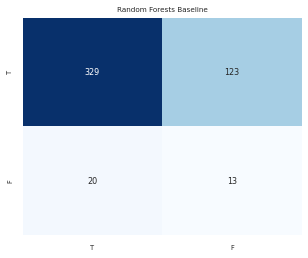

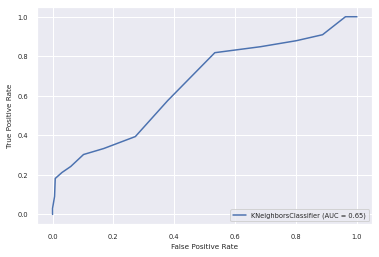

This is the starting index: 3336 of patient 8
0.6487889273356401
[([1], 0, array([0.66666667, 0.33333333])), ([1], 1, array([0.33333333, 0.66666667])), ([0], 0, array([0.73333333, 0.26666667])), ([1], 0, array([0.8, 0.2])), ([1], 1, array([0.2, 0.8])), ([1], 1, array([0.13333333, 0.86666667])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 1, array([0.33333333, 0.66666667])), ([0], 1, array([0.33333333, 0.66666667])), ([1], 1, array([0.4, 0.6])), ([0], 0, array([0.73333333, 0.26666667])), ([1], 1, array([0.2, 0.8])), ([1], 1, array([0.13333333, 0.86666667])), ([0], 0, array([0.86666667, 0.13333333])), ([0], 0, array([0.73333333, 0.26666667])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 1, array([0.13333333, 0.86666667])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 0, array([0.53333333, 0.46666667])), ([0], 0, array([0.73333333, 0.26666667])), ([1], 1, array([0.26666667, 0.73333333])), ([0], 0, array(

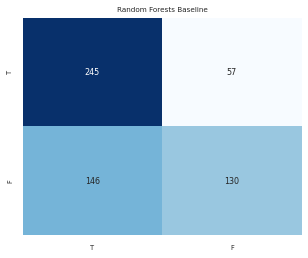

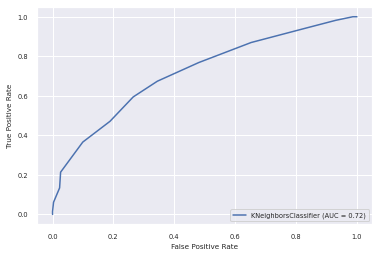

This is the starting index: 3915 of patient 9
0.4857142857142857
[([1], 0, array([0.53333333, 0.46666667])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.33333333, 0.66666667])), ([1], 1, array([0.26666667, 0.73333333])), ([1], 1, array([0.33333333, 0.66666667])), ([1], 1, array([0.46666667, 0.53333333])), ([1], 1, array([0.2, 0.8])), ([1], 0, array([0.66666667, 0.33333333])), ([1], 0, array([0.66666667, 0.33333333])), ([1], 1, array([0.2, 0.8])), ([1], 0, array([0.66666667, 0.33333333])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 0, array([0.86666667, 0.13333333])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 0, array([0.6, 0.4])), ([1], 1, array([0.26666667, 0.73333333])), ([1], 1, array([0.2, 0.8])), ([1], 0, array([0.66666667, 0.33333333])), ([1], 0, array([0.66666667, 0.33333333])), ([1], 1, array([0.33333333, 0.66666667])), ([1], 0, array([0.66666667, 0.33333333])), ([1], 1, array(

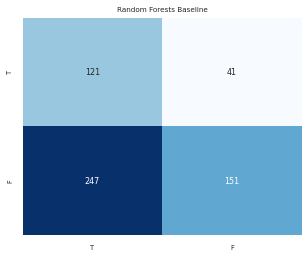

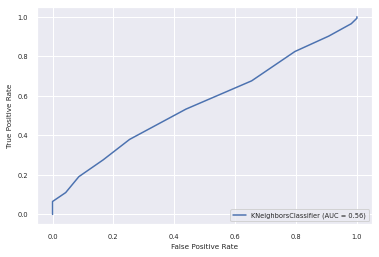

This is the starting index: 4476 of patient 10
0.7847866419294991
[([0], 1, array([0.33333333, 0.66666667])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 1, array([0.33333333, 0.66666667])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.8, 0.2])), ([0], 1, array([0.46666667, 0.53333333])), ([1], 0, array([0.53333333, 0.46666667])), ([1], 0, array([0.66666667, 0.33333333])), ([0], 1, array([0.4, 0.6])), ([0], 0, array([0.73333333, 0.26666667])), ([1], 1, array([0.33333333, 0.66666667])), ([1], 0, array([0.66666667, 0.33333333])), ([1], 0, array([0.73333333, 0.26666667])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.73333333, 0.26666667])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.86666667, 0.13333333])), ([1], 0, array([0.53333333, 0.46666667])), ([0], 1, array([0.4, 0.6])), ([1], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.86666667, 0.13333333])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array

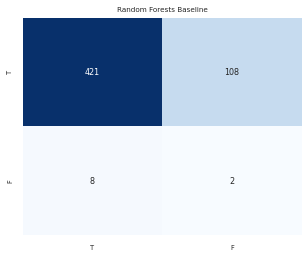

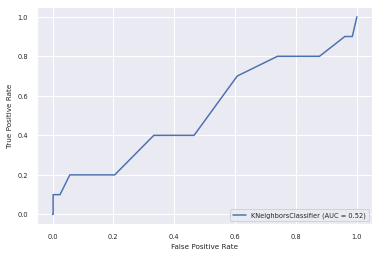

This is the starting index: 5016 of patient 11
0.7034632034632035
[([0], 0, array([0.53333333, 0.46666667])), ([0], 1, array([0.33333333, 0.66666667])), ([0], 0, array([0.86666667, 0.13333333])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 1, array([0.4, 0.6])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 0, array([0.73333333, 0.26666667])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.86666667, 0.13333333])), ([1], 0, array([0.73333333, 0.26666667])), ([0], 0, array([0.66666667, 0.33333333])), ([1], 0, array([0.8, 0.2])), ([0], 1, array([0.2, 0.8])), ([0], 0, array([0.93333333, 0.06666667])), ([0], 0, array([0.93333333, 0.06666667])), ([1], 0, array([0.93333333, 0.06666667])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.86666667, 0.13333333])), ([0], 0, array([0.93333333, 0.06666667])), ([0], 0, array([0.86666667, 

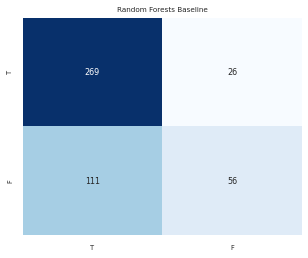

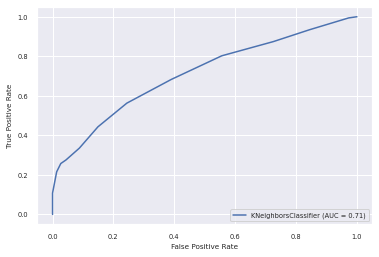

This is the starting index: 5479 of patient 12
0.40588235294117647
[([0], 1, array([0.2, 0.8])), ([0], 1, array([0.4, 0.6])), ([0], 0, array([0.6, 0.4])), ([0], 1, array([0.26666667, 0.73333333])), ([0], 1, array([0.4, 0.6])), ([0], 1, array([0.33333333, 0.66666667])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 0, array([0.66666667, 0.33333333])), ([0], 1, array([0.33333333, 0.66666667])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 1, array([0.33333333, 0.66666667])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 1, array([0.33333333, 0.66666667])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 1, array([0.4, 0.6])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 0, array([0.53333333, 0.46666667])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 1, array([0.46666667, 0.53333333])), ([0], 1, array([0.26666667, 0.73333333])), ([0], 1, array([0.13333333, 0.86666667])), ([0], 1, arra

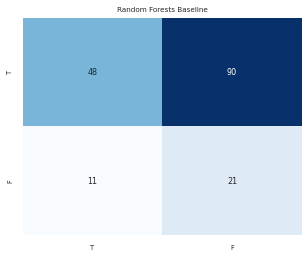

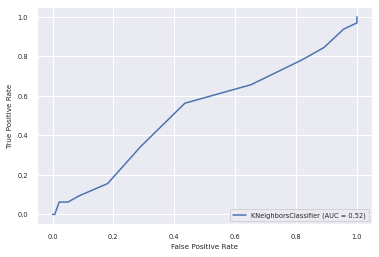

<function matplotlib.pyplot.show>

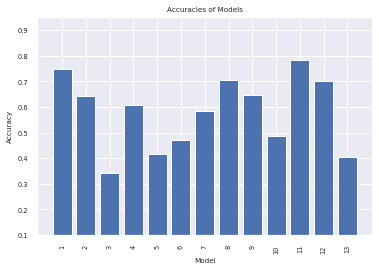

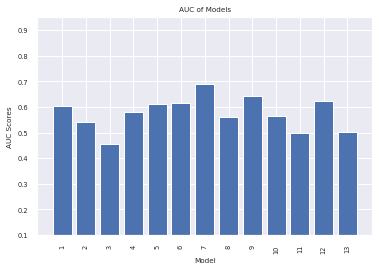

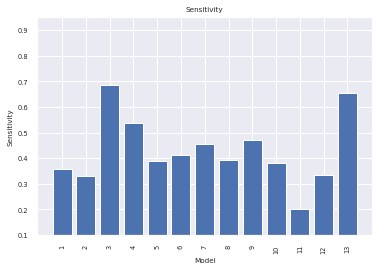

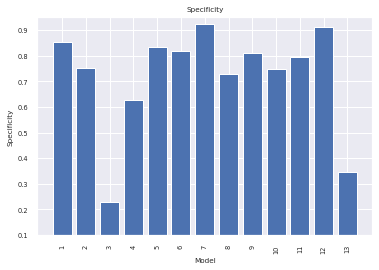

In [27]:
Accuracy = []
auc = []
specificity = []
sensitivity = []
clf = KNeighborsClassifier(n_neighbors=15)

for i in range(0,13):
    test, train, test_class, train_class = leave_one_out(df,i)
    lsvc = LinearSVC(C=0.01, penalty="l1", dual=False).fit(train, train_class.ravel())
    model = SelectFromModel(lsvc, prefit=True)
    train = model.transform(train)
    test = model.transform(test)
    clf.fit(train, train_class.ravel())

    y_predicted = clf.predict(test)
    print(metrics.accuracy_score(test_class,y_predicted))
        # print("Random Forest:\n",metrics.classification_report(test_class,y_predicted)) # Classification report
    Accuracy.append(metrics.accuracy_score(test_class,y_predicted))
    auc.append(metrics.roc_auc_score(test_class,y_predicted))
    mcm = confusion_matrix(test_class,y_predicted)
    tn = mcm[0, 0]
    tp = mcm[1, 1]
    fn = mcm[1, 0]
    fp = mcm[0, 1]
    sensitivity.append(tp / (tp + fn))
    specificity.append(tn / (tn + fp))
    pred = clf.predict_proba(test)
    result = [*zip(test_class.tolist(), y_predicted, pred)]
    print(result)
    report = metrics.classification_report(test_class.tolist(), y_predicted)
    matrix = metrics.confusion_matrix(test_class.tolist(),y_predicted)   

    fig, (ax1) = plt.subplots(1, figsize=(5, 4))


    df_cm1 = pd.DataFrame(matrix, range(2), range(2))
    sn.set(font_scale=0.6) # for label size
    sn.heatmap(df_cm1, annot=True,annot_kws={"size": 8}, fmt='g', cmap='Blues', cbar= False, xticklabels=x_axis_labels, yticklabels=y_axis_labels, ax = ax1) # font size


    ax1.set_title('Random Forests Baseline')

    plt.show()
    metrics.plot_roc_curve(clf, test, test_class.tolist())  # doctest: +SKIP
    plt.show()

Model=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13']

Index = [1,2,3,4,5,6,7,8,9,10,11,12,13]
fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,Accuracy)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Accuracy')
plt.xlabel('Model')
plt.title('Accuracies of Models')
plt.show


fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,auc)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('AUC Scores')
plt.xlabel('Model')
plt.title('AUC of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,sensitivity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Sensitivity')
plt.xlabel('Model')
plt.title('Sensitivity')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,specificity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Specificity')
plt.xlabel('Model')
plt.title('Specificity')
plt.show

#### Tree Based Feature Selection

This is the starting index: 0 of patient 0
0.8027923211169284
[([1], 0, array([0.53, 0.47])), ([1], 1, array([0.49, 0.51])), ([0], 1, array([0.48, 0.52])), ([1], 0, array([0.9, 0.1])), ([1], 1, array([0.24, 0.76])), ([0], 0, array([0.88, 0.12])), ([1], 0, array([0.75, 0.25])), ([0], 0, array([0.57, 0.43])), ([1], 1, array([0.27, 0.73])), ([0], 0, array([0.62, 0.38])), ([0], 0, array([0.55, 0.45])), ([1], 0, array([0.52, 0.48])), ([1], 0, array([0.54, 0.46])), ([0], 0, array([0.65, 0.35])), ([1], 1, array([0.37, 0.63])), ([1], 1, array([0.36, 0.64])), ([1], 0, array([0.56, 0.44])), ([1], 0, array([0.86, 0.14])), ([1], 0, array([0.66, 0.34])), ([1], 0, array([0.54, 0.46])), ([0], 0, array([0.57, 0.43])), ([1], 0, array([0.93, 0.07])), ([1], 0, array([0.61, 0.39])), ([1], 1, array([0.37, 0.63])), ([0], 0, array([0.84, 0.16])), ([0], 0, array([0.54, 0.46])), ([1], 0, array([0.77, 0.23])), ([1], 0, array([0.57, 0.43])), ([0], 0, array([0.54, 0.46])), ([0], 0, array([0.73, 0.27])), ([0], 0, 

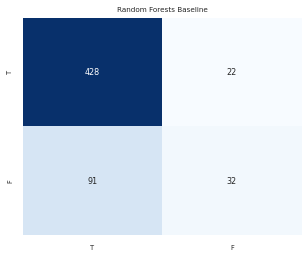

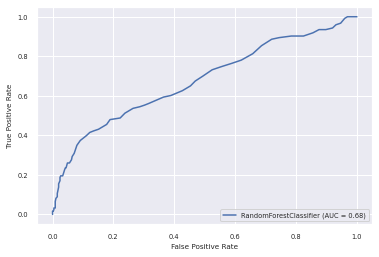

This is the starting index: 574 of patient 1
0.7296137339055794
[([0], 1, array([0.17, 0.83])), ([0], 1, array([0.31, 0.69])), ([0], 0, array([0.6, 0.4])), ([0], 1, array([0.4, 0.6])), ([0], 0, array([0.57, 0.43])), ([0], 0, array([0.6, 0.4])), ([1], 1, array([0.34, 0.66])), ([0], 0, array([0.58, 0.42])), ([0], 0, array([0.56, 0.44])), ([0], 0, array([0.65, 0.35])), ([0], 0, array([0.76, 0.24])), ([0], 0, array([0.59, 0.41])), ([1], 0, array([0.58, 0.42])), ([0], 0, array([0.51, 0.49])), ([0], 0, array([0.63, 0.37])), ([0], 0, array([0.53, 0.47])), ([0], 1, array([0.44, 0.56])), ([0], 0, array([0.66, 0.34])), ([1], 0, array([0.83, 0.17])), ([0], 0, array([0.53, 0.47])), ([1], 1, array([0.06, 0.94])), ([0], 0, array([0.78, 0.22])), ([1], 1, array([0.06, 0.94])), ([0], 0, array([0.59, 0.41])), ([1], 0, array([0.53, 0.47])), ([0], 0, array([0.87, 0.13])), ([0], 0, array([0.73, 0.27])), ([0], 0, array([0.58, 0.42])), ([0], 0, array([0.72, 0.28])), ([1], 1, array([0.11, 0.89])), ([1], 1, ar

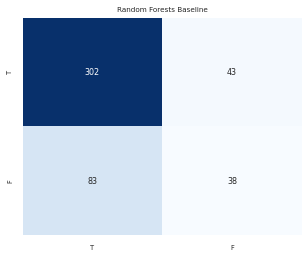

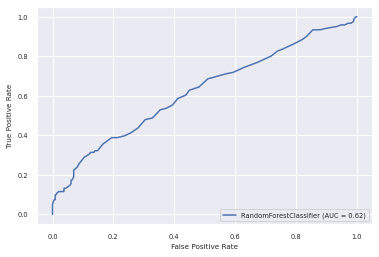

This is the starting index: 1041 of patient 2
0.29692832764505117
[([1], 1, array([0.35, 0.65])), ([0], 0, array([0.57, 0.43])), ([0], 1, array([0.44, 0.56])), ([1], 1, array([0.08, 0.92])), ([0], 0, array([0.65, 0.35])), ([0], 0, array([0.68, 0.32])), ([0], 0, array([0.63, 0.37])), ([1], 1, array([0.11, 0.89])), ([1], 0, array([0.63, 0.37])), ([1], 1, array([0.41, 0.59])), ([1], 0, array([0.52, 0.48])), ([1], 1, array([0.26, 0.74])), ([1], 1, array([0.08, 0.92])), ([0], 1, array([0.43, 0.57])), ([1], 1, array([0.47, 0.53])), ([1], 1, array([0.23, 0.77])), ([0], 1, array([0.27, 0.73])), ([0], 1, array([0.13, 0.87])), ([0], 1, array([0.32, 0.68])), ([0], 0, array([0.55, 0.45])), ([0], 1, array([0.13, 0.87])), ([0], 1, array([0.3, 0.7])), ([0], 1, array([0.31, 0.69])), ([0], 1, array([0.04, 0.96])), ([0], 1, array([0.28, 0.72])), ([0], 1, array([0.03, 0.97])), ([0], 0, array([0.53, 0.47])), ([0], 1, array([0.09, 0.91])), ([0], 1, array([0.04, 0.96])), ([0], 1, array([0.2, 0.8])), ([0], 1

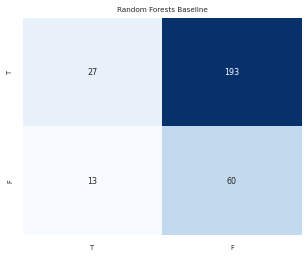

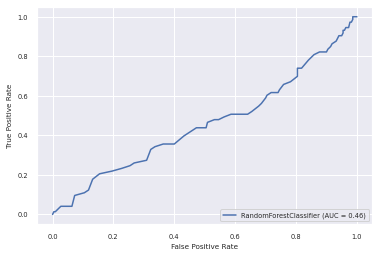

This is the starting index: 1335 of patient 3
0.6375661375661376
[([0], 1, array([0.4, 0.6])), ([1], 1, array([0.47, 0.53])), ([1], 1, array([0.13, 0.87])), ([1], 1, array([0.32, 0.68])), ([1], 1, array([0.29, 0.71])), ([1], 1, array([0.44, 0.56])), ([1], 0, array([0.51, 0.49])), ([0], 1, array([0.42, 0.58])), ([0], 0, array([0.69, 0.31])), ([0], 0, array([0.52, 0.48])), ([0], 1, array([0.43, 0.57])), ([0], 0, array([0.65, 0.35])), ([0], 0, array([0.69, 0.31])), ([1], 0, array([0.6, 0.4])), ([0], 1, array([0.41, 0.59])), ([0], 0, array([0.57, 0.43])), ([0], 0, array([0.72, 0.28])), ([0], 1, array([0.09, 0.91])), ([0], 0, array([0.55, 0.45])), ([0], 0, array([0.56, 0.44])), ([0], 0, array([0.62, 0.38])), ([0], 1, array([0.22, 0.78])), ([0], 1, array([0.44, 0.56])), ([0], 0, array([0.75, 0.25])), ([0], 0, array([0.81, 0.19])), ([0], 0, array([0.51, 0.49])), ([0], 1, array([0.38, 0.62])), ([0], 0, array([0.9, 0.1])), ([0], 1, array([0.39, 0.61])), ([1], 0, array([0.6, 0.4])), ([0], 1, arr

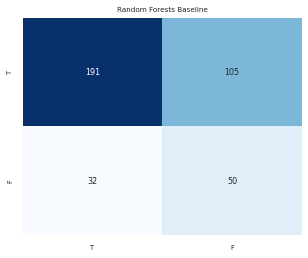

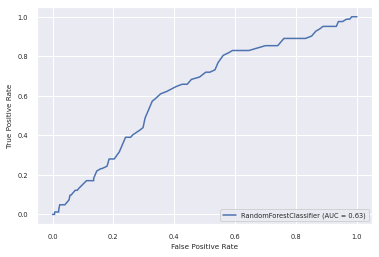

This is the starting index: 1714 of patient 4
0.5249169435215947
[([1], 1, array([0.38, 0.62])), ([1], 1, array([0.31, 0.69])), ([1], 0, array([0.76, 0.24])), ([1], 1, array([0.34, 0.66])), ([1], 1, array([0.41, 0.59])), ([1], 0, array([0.63, 0.37])), ([1], 0, array([0.6, 0.4])), ([1], 0, array([0.51, 0.49])), ([1], 0, array([0.6, 0.4])), ([1], 0, array([0.72, 0.28])), ([1], 0, array([0.51, 0.49])), ([1], 1, array([0.39, 0.61])), ([1], 1, array([0.43, 0.57])), ([1], 1, array([0.33, 0.67])), ([1], 1, array([0.35, 0.65])), ([1], 1, array([0.39, 0.61])), ([1], 1, array([0.15, 0.85])), ([1], 1, array([0.43, 0.57])), ([1], 1, array([0.31, 0.69])), ([1], 1, array([0.46, 0.54])), ([1], 1, array([0.29, 0.71])), ([1], 1, array([0.25, 0.75])), ([1], 0, array([0.56, 0.44])), ([1], 1, array([0.3, 0.7])), ([1], 1, array([0.37, 0.63])), ([1], 1, array([0.37, 0.63])), ([1], 1, array([0.26, 0.74])), ([1], 0, array([0.73, 0.27])), ([1], 0, array([0.63, 0.37])), ([1], 0, array([0.5, 0.5])), ([1], 0, arr

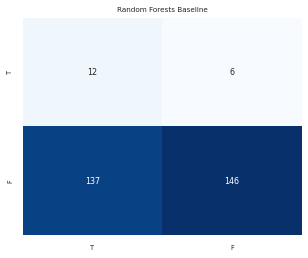

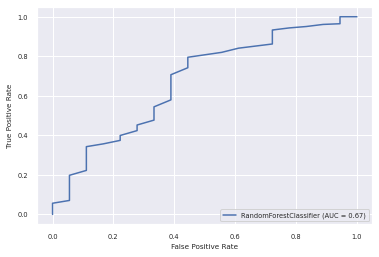

This is the starting index: 2016 of patient 5
0.4434589800443459
[([0], 0, array([0.8, 0.2])), ([0], 0, array([0.68, 0.32])), ([0], 0, array([0.82, 0.18])), ([0], 0, array([0.9, 0.1])), ([0], 0, array([0.88, 0.12])), ([0], 0, array([0.8, 0.2])), ([1], 0, array([0.81, 0.19])), ([1], 0, array([0.81, 0.19])), ([1], 0, array([0.81, 0.19])), ([1], 0, array([0.73, 0.27])), ([0], 0, array([0.71, 0.29])), ([1], 0, array([0.85, 0.15])), ([0], 0, array([0.65, 0.35])), ([1], 0, array([0.65, 0.35])), ([1], 0, array([0.75, 0.25])), ([1], 0, array([0.88, 0.12])), ([1], 0, array([0.83, 0.17])), ([1], 0, array([0.63, 0.37])), ([1], 0, array([0.74, 0.26])), ([1], 0, array([0.74, 0.26])), ([1], 1, array([0.11, 0.89])), ([1], 0, array([0.74, 0.26])), ([1], 0, array([0.83, 0.17])), ([1], 0, array([0.69, 0.31])), ([1], 0, array([0.81, 0.19])), ([1], 0, array([0.71, 0.29])), ([1], 1, array([0.2, 0.8])), ([1], 0, array([0.64, 0.36])), ([1], 0, array([0.82, 0.18])), ([1], 1, array([0.42, 0.58])), ([1], 0, arr

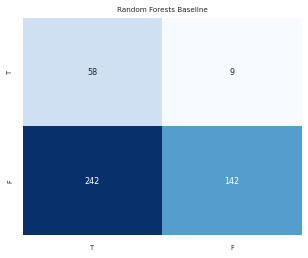

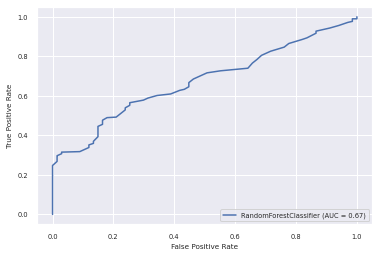

This is the starting index: 2468 of patient 6
0.5511811023622047
[([1], 0, array([0.5, 0.5])), ([1], 1, array([0.36, 0.64])), ([1], 1, array([0.31, 0.69])), ([1], 0, array([0.65, 0.35])), ([1], 0, array([0.66, 0.34])), ([1], 1, array([0.27, 0.73])), ([1], 1, array([0.36, 0.64])), ([1], 0, array([0.71, 0.29])), ([1], 0, array([0.57, 0.43])), ([1], 0, array([0.78, 0.22])), ([0], 0, array([0.87, 0.13])), ([1], 1, array([0.22, 0.78])), ([1], 0, array([0.7, 0.3])), ([1], 1, array([0.39, 0.61])), ([1], 0, array([0.63, 0.37])), ([1], 1, array([0.39, 0.61])), ([1], 1, array([0.15, 0.85])), ([1], 1, array([0.49, 0.51])), ([1], 1, array([0.27, 0.73])), ([0], 0, array([0.79, 0.21])), ([1], 0, array([0.59, 0.41])), ([1], 0, array([0.83, 0.17])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.22, 0.78])), ([1], 1, array([0.34, 0.66])), ([1], 0, array([0.55, 0.45])), ([1], 0, array([0.81, 0.19])), ([0], 1, array([0.32, 0.68])), ([0], 0, array([0.74, 0.26])), ([1], 1, array([0.36, 0.64])), ([1], 0, a

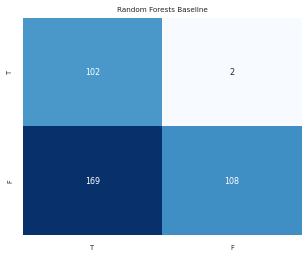

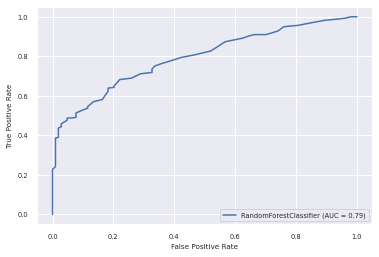

This is the starting index: 2850 of patient 7
0.8247422680412371
[([0], 0, array([0.54, 0.46])), ([0], 0, array([0.78, 0.22])), ([0], 0, array([0.78, 0.22])), ([0], 1, array([0.49, 0.51])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.73, 0.27])), ([0], 0, array([0.71, 0.29])), ([0], 0, array([0.92, 0.08])), ([0], 0, array([0.81, 0.19])), ([0], 0, array([0.79, 0.21])), ([0], 0, array([0.81, 0.19])), ([0], 0, array([0.92, 0.08])), ([0], 1, array([0.22, 0.78])), ([0], 1, array([0.28, 0.72])), ([0], 0, array([0.56, 0.44])), ([0], 0, array([0.88, 0.12])), ([0], 0, array([0.81, 0.19])), ([0], 0, array([0.81, 0.19])), ([0], 0, array([0.76, 0.24])), ([0], 0, array([0.68, 0.32])), ([0], 0, array([0.77, 0.23])), ([0], 0, array([0.88, 0.12])), ([0], 0, array([0.72, 0.28])), ([0], 0, array([0.51, 0.49])), ([0], 0, array([0.85, 0.15])), ([0], 1, array([0.47, 0.53])), ([0], 0, array([0.7, 0.3])), ([0], 0, array([0.84, 0.16])), ([0], 1, array([0.41, 0.59])), ([0], 0, array([0.67, 0.33])), ([1], 0,

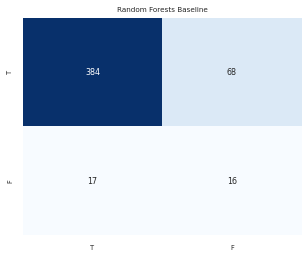

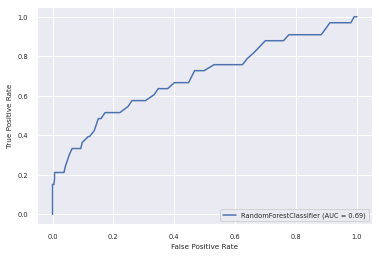

This is the starting index: 3336 of patient 8
0.7422145328719724
[([1], 0, array([0.58, 0.42])), ([1], 1, array([0.28, 0.72])), ([0], 0, array([0.68, 0.32])), ([1], 0, array([0.71, 0.29])), ([1], 1, array([0.31, 0.69])), ([1], 1, array([0.35, 0.65])), ([1], 1, array([0.45, 0.55])), ([1], 1, array([0.36, 0.64])), ([1], 1, array([0.33, 0.67])), ([1], 1, array([0.21, 0.79])), ([0], 1, array([0.37, 0.63])), ([1], 1, array([0.37, 0.63])), ([0], 0, array([0.8, 0.2])), ([1], 1, array([0.42, 0.58])), ([1], 1, array([0.37, 0.63])), ([0], 0, array([0.9, 0.1])), ([0], 0, array([0.62, 0.38])), ([1], 0, array([0.7, 0.3])), ([1], 1, array([0.1, 0.9])), ([1], 0, array([0.76, 0.24])), ([1], 1, array([0.25, 0.75])), ([0], 0, array([0.69, 0.31])), ([1], 1, array([0.2, 0.8])), ([0], 0, array([0.66, 0.34])), ([1], 1, array([0.11, 0.89])), ([0], 1, array([0.38, 0.62])), ([0], 0, array([0.59, 0.41])), ([0], 1, array([0.43, 0.57])), ([0], 0, array([0.86, 0.14])), ([1], 1, array([0.31, 0.69])), ([1], 1, array

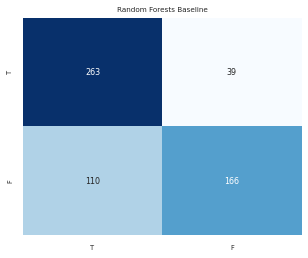

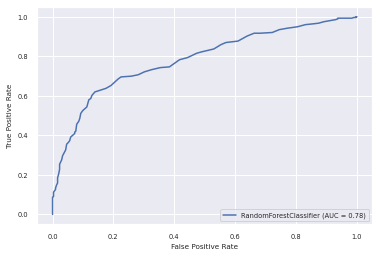

This is the starting index: 3915 of patient 9
0.5678571428571428
[([1], 1, array([0.23, 0.77])), ([1], 0, array([0.54, 0.46])), ([1], 0, array([0.5, 0.5])), ([1], 0, array([0.58, 0.42])), ([1], 1, array([0.31, 0.69])), ([1], 1, array([0.25, 0.75])), ([1], 0, array([0.77, 0.23])), ([1], 0, array([0.67, 0.33])), ([1], 0, array([0.54, 0.46])), ([1], 0, array([0.71, 0.29])), ([1], 1, array([0.32, 0.68])), ([1], 0, array([0.59, 0.41])), ([1], 1, array([0.29, 0.71])), ([1], 1, array([0.47, 0.53])), ([1], 0, array([0.65, 0.35])), ([1], 0, array([0.72, 0.28])), ([1], 1, array([0.49, 0.51])), ([1], 1, array([0.3, 0.7])), ([1], 0, array([0.51, 0.49])), ([1], 1, array([0.47, 0.53])), ([1], 1, array([0.23, 0.77])), ([1], 0, array([0.6, 0.4])), ([1], 0, array([0.57, 0.43])), ([1], 0, array([0.66, 0.34])), ([1], 0, array([0.51, 0.49])), ([0], 1, array([0.42, 0.58])), ([0], 1, array([0.49, 0.51])), ([1], 1, array([0.21, 0.79])), ([1], 0, array([0.71, 0.29])), ([1], 1, array([0.14, 0.86])), ([1], 1, a

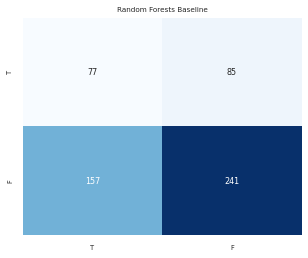

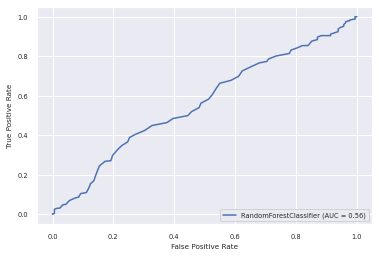

This is the starting index: 4476 of patient 10
0.8330241187384044
[([0], 0, array([0.54, 0.46])), ([0], 0, array([0.69, 0.31])), ([0], 0, array([0.61, 0.39])), ([0], 0, array([0.59, 0.41])), ([0], 0, array([0.56, 0.44])), ([0], 0, array([0.65, 0.35])), ([1], 1, array([0.49, 0.51])), ([1], 0, array([0.63, 0.37])), ([0], 0, array([0.73, 0.27])), ([0], 0, array([0.83, 0.17])), ([1], 1, array([0.38, 0.62])), ([1], 1, array([0.34, 0.66])), ([1], 0, array([0.58, 0.42])), ([0], 0, array([0.82, 0.18])), ([0], 0, array([0.62, 0.38])), ([0], 0, array([0.87, 0.13])), ([0], 0, array([0.85, 0.15])), ([0], 0, array([0.77, 0.23])), ([1], 1, array([0.37, 0.63])), ([0], 1, array([0.47, 0.53])), ([1], 0, array([0.84, 0.16])), ([0], 0, array([0.92, 0.08])), ([0], 0, array([0.79, 0.21])), ([0], 0, array([0.59, 0.41])), ([0], 0, array([0.85, 0.15])), ([1], 0, array([0.6, 0.4])), ([0], 0, array([0.59, 0.41])), ([0], 0, array([0.76, 0.24])), ([0], 0, array([0.55, 0.45])), ([0], 0, array([0.78, 0.22])), ([0],

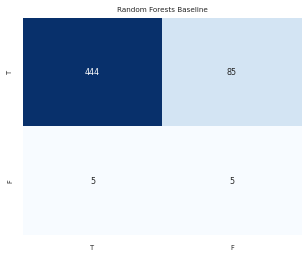

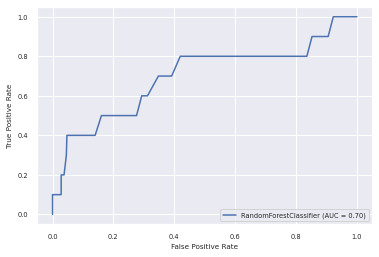

This is the starting index: 5016 of patient 11
0.7424242424242424
[([0], 1, array([0.46, 0.54])), ([0], 1, array([0.34, 0.66])), ([0], 0, array([0.72, 0.28])), ([0], 0, array([0.83, 0.17])), ([0], 1, array([0.42, 0.58])), ([0], 0, array([0.68, 0.32])), ([0], 1, array([0.49, 0.51])), ([0], 0, array([0.81, 0.19])), ([0], 0, array([0.73, 0.27])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.75, 0.25])), ([0], 0, array([0.72, 0.28])), ([0], 0, array([0.78, 0.22])), ([1], 1, array([0.48, 0.52])), ([0], 0, array([0.76, 0.24])), ([1], 0, array([0.68, 0.32])), ([0], 0, array([0.7, 0.3])), ([0], 0, array([0.72, 0.28])), ([0], 0, array([0.88, 0.12])), ([1], 0, array([0.94, 0.06])), ([0], 0, array([0.69, 0.31])), ([0], 0, array([0.91, 0.09])), ([0], 0, array([0.9, 0.1])), ([0], 0, array([0.94, 0.06])), ([1], 0, array([0.61, 0.39])), ([0], 0, array([0.75, 0.25])), ([1], 0, array([0.83, 0.17])), ([1], 1, array([0.18, 0.82])), ([0], 0, array([0.74, 0.26])), ([0], 0, array([0.76, 0.24])), ([0], 0, 

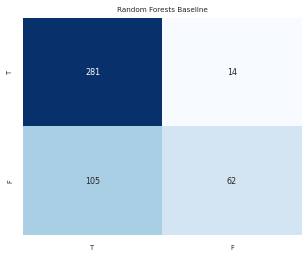

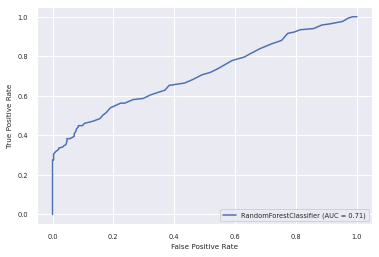

This is the starting index: 5479 of patient 12
0.3058823529411765
[([0], 1, array([0.37, 0.63])), ([0], 1, array([0.36, 0.64])), ([0], 1, array([0.26, 0.74])), ([0], 1, array([0.2, 0.8])), ([0], 0, array([0.62, 0.38])), ([0], 1, array([0.27, 0.73])), ([0], 1, array([0.27, 0.73])), ([0], 1, array([0.23, 0.77])), ([0], 1, array([0.33, 0.67])), ([0], 1, array([0.36, 0.64])), ([0], 1, array([0.31, 0.69])), ([0], 1, array([0.29, 0.71])), ([0], 0, array([0.51, 0.49])), ([0], 1, array([0.29, 0.71])), ([0], 1, array([0.26, 0.74])), ([0], 1, array([0.17, 0.83])), ([0], 0, array([0.54, 0.46])), ([0], 1, array([0.42, 0.58])), ([0], 1, array([0.36, 0.64])), ([0], 1, array([0.15, 0.85])), ([0], 1, array([0.22, 0.78])), ([0], 1, array([0.32, 0.68])), ([0], 1, array([0.26, 0.74])), ([0], 1, array([0.28, 0.72])), ([0], 1, array([0.45, 0.55])), ([0], 1, array([0.32, 0.68])), ([0], 0, array([0.53, 0.47])), ([0], 1, array([0.43, 0.57])), ([0], 1, array([0.42, 0.58])), ([0], 1, array([0.33, 0.67])), ([0],

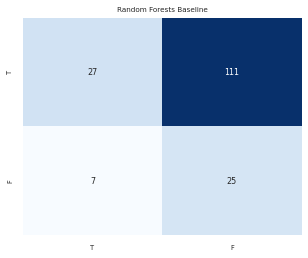

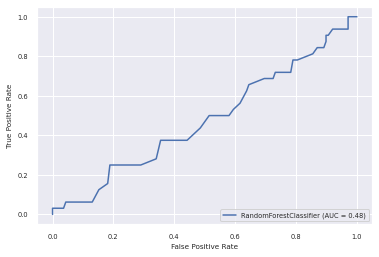

<function matplotlib.pyplot.show>

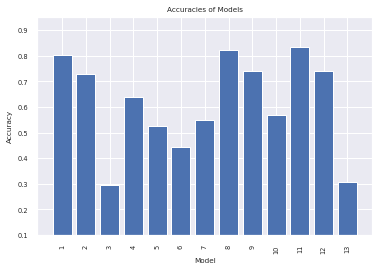

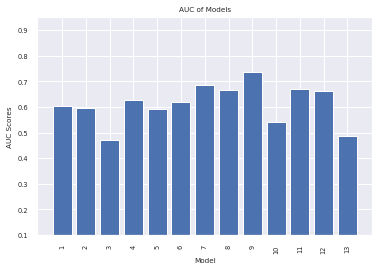

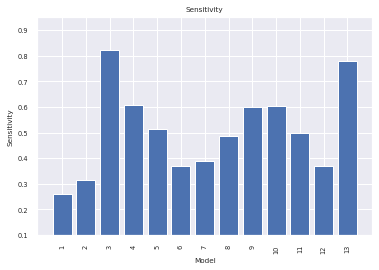

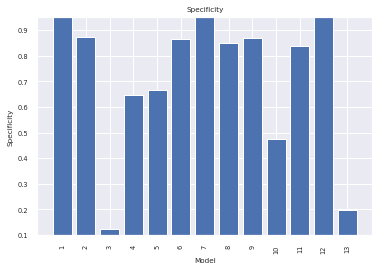

In [28]:
Accuracy = []
auc = []
sensitivity = []
specificity = []
clf = KNeighborsClassifier(n_neighbors=15)

for i in range(0,13):
    test, train, test_class, train_class = leave_one_out(df,i)
    clf = ExtraTreesClassifier(n_estimators=50)
    clf = clf.fit(train, train_class.ravel())
    model = SelectFromModel(clf, prefit=True)
    train = model.transform(train)
    # clf = ExtraTreesClassifier(n_estimators=50)
    # clf = clf.fit(test, test_class.ravel())
    # model = SelectFromModel(clf, prefit=True) 

    test = model.transform(test)
    clf = RandomForestClassifier()
    clf.fit(train, train_class.ravel())


    y_predicted = clf.predict(test)
    print(metrics.accuracy_score(test_class,y_predicted))
        # print("Random Forest:\n",metrics.classification_report(test_class,y_predicted)) # Classification report
    Accuracy.append(metrics.accuracy_score(test_class,y_predicted))
    auc.append(metrics.roc_auc_score(test_class,y_predicted))
    mcm = confusion_matrix(test_class,y_predicted)
    tn = mcm[0, 0]
    tp = mcm[1, 1]
    fn = mcm[1, 0]
    fp = mcm[0, 1]
    sensitivity.append(tp / (tp + fn))
    specificity.append(tn / (tn + fp))
    pred = clf.predict_proba(test)
    result = [*zip(test_class.tolist(), y_predicted, pred)]
    print(result)
    report = metrics.classification_report(test_class.tolist(), y_predicted)
    matrix = metrics.confusion_matrix(test_class.tolist(),y_predicted)   

    fig, (ax1) = plt.subplots(1, figsize=(5, 4))


    df_cm1 = pd.DataFrame(matrix, range(2), range(2))
    sn.set(font_scale=0.6) # for label size
    sn.heatmap(df_cm1, annot=True,annot_kws={"size": 8}, fmt='g', cmap='Blues', cbar= False, xticklabels=x_axis_labels, yticklabels=y_axis_labels, ax = ax1) # font size


    ax1.set_title('Random Forests Baseline')

    plt.show()
    metrics.plot_roc_curve(clf, test, test_class.tolist())  # doctest: +SKIP
    plt.show()

Model=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13']

Index = [1,2,3,4,5,6,7,8,9,10,11,12,13]
fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,Accuracy)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Accuracy')
plt.xlabel('Model')
plt.title('Accuracies of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,auc)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('AUC Scores')
plt.xlabel('Model')
plt.title('AUC of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,sensitivity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Sensitivity')
plt.xlabel('Model')
plt.title('Sensitivity')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,specificity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Specificity')
plt.xlabel('Model')
plt.title('Specificity')
plt.show

#### Auto Sklearn Recommendation

In [ ]:
#SVM with manual parameters
svm = Pipeline([('vect', CountVectorizer()),('tfidf', TfidfTransformer()),
                         ('svm', SGDClassifier(loss='hinge', alpha=1e-3, random_state=42)),])

SimpleClassificationPipeline({'balancing:strategy': 'weighting', 'classifier:__choice__': 'random_forest', 'data_preprocessing:categorical_transformer:categorical_encoding:__choice__': 'one_hot_encoding', 'data_preprocessing:categorical_transformer:category_coalescence:__choice__': 'minority_coalescer', 'data_preprocessing:numerical_transformer:imputation:strategy': 'most_frequent', 'data_preprocessing:numerical_transformer:rescaling:__choice__': 'normalize', 'feature_preprocessor:__choice__': 'extra_trees_preproc_for_classification', 'classifier:random_forest:bootstrap': 'False', 'classifier:random_forest:criterion': 'entropy', 'classifier:random_forest:max_depth': 'None', 'classifier:random_forest:max_features': 0.27453376891983117, 'classifier:random_forest:max_leaf_nodes': 'None', 'classifier:random_forest:min_impurity_decrease': 0.0, 'classifier:random_forest:min_samples_leaf': 13, 'classifier:random_forest:min_samples_split': 19, 'classifier:random_forest:min_weight_fraction_leaf': 0.0, 'data_preprocessing:categorical_transformer:category_coalescence:minority_coalescer:minimum_fraction': 0.2166847947584762, 'feature_preprocessor:extra_trees_preproc_for_classification:bootstrap': 'False', 'feature_preprocessor:extra_trees_preproc_for_classification:criterion': 'entropy', 'feature_preprocessor:extra_trees_preproc_for_classification:max_depth': 'None', 'feature_preprocessor:extra_trees_preproc_for_classification:max_features': 0.2819773130241576, 'feature_preprocessor:extra_trees_preproc_for_classification:max_leaf_nodes': 'None', 'feature_preprocessor:extra_trees_preproc_for_classification:min_impurity_decrease': 0.0, 'feature_preprocessor:extra_trees_preproc_for_classification:min_samples_leaf': 20, 'feature_preprocessor:extra_trees_preproc_for_classification:min_samples_split': 3, 'feature_preprocessor:extra_trees_preproc_for_classification:min_weight_fraction_leaf': 0.0, 'feature_preprocessor:extra_trees_preproc_for_classification:n_estimators': 100},
d

### AdaBoost

#### Baseline

This is the starting index: 0 of patient 0
0.7696335078534031
[([1], 0, array([0.50087682, 0.49912318])), ([1], 0, array([0.50108958, 0.49891042])), ([0], 1, array([0.48557133, 0.51442867])), ([1], 0, array([0.50230397, 0.49769603])), ([1], 1, array([0.49567391, 0.50432609])), ([0], 0, array([0.51643755, 0.48356245])), ([1], 0, array([0.50647578, 0.49352422])), ([0], 0, array([0.50011692, 0.49988308])), ([1], 1, array([0.49567391, 0.50432609])), ([0], 0, array([0.50747904, 0.49252096])), ([0], 0, array([0.50528482, 0.49471518])), ([1], 0, array([0.50536421, 0.49463579])), ([1], 0, array([0.50087682, 0.49912318])), ([0], 0, array([0.50302044, 0.49697956])), ([1], 1, array([0.49464939, 0.50535061])), ([1], 1, array([0.49816716, 0.50183284])), ([1], 0, array([0.50087682, 0.49912318])), ([1], 0, array([0.50587417, 0.49412583])), ([1], 1, array([0.49737924, 0.50262076])), ([1], 1, array([0.49538958, 0.50461042])), ([0], 0, array([0.67116787, 0.32883213])), ([1], 0, array([0.50915152, 0.4908

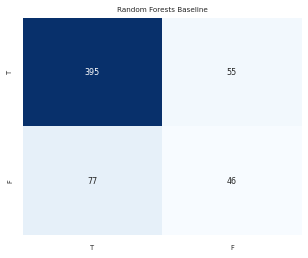

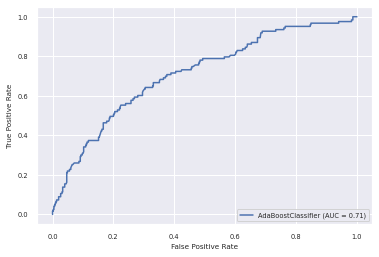

This is the starting index: 574 of patient 1
0.6845493562231759
[([0], 1, array([0.49652692, 0.50347308])), ([0], 1, array([0.49858698, 0.50141302])), ([0], 0, array([0.50905693, 0.49094307])), ([0], 0, array([0.50087918, 0.49912082])), ([0], 0, array([0.50060522, 0.49939478])), ([0], 0, array([0.50692093, 0.49307907])), ([1], 1, array([0.48375259, 0.51624741])), ([0], 1, array([0.49892628, 0.50107372])), ([0], 1, array([0.49984887, 0.50015113])), ([0], 0, array([0.50610206, 0.49389794])), ([0], 0, array([0.5057591, 0.4942409])), ([0], 1, array([0.49802382, 0.50197618])), ([1], 1, array([0.49892628, 0.50107372])), ([0], 1, array([0.49974304, 0.50025696])), ([0], 0, array([0.50168559, 0.49831441])), ([0], 0, array([0.50546003, 0.49453997])), ([0], 1, array([0.4974029, 0.5025971])), ([0], 0, array([0.50011577, 0.49988423])), ([1], 1, array([0.49969493, 0.50030507])), ([0], 0, array([0.50288005, 0.49711995])), ([1], 1, array([0.4954795, 0.5045205])), ([0], 0, array([0.50247574, 0.49752426

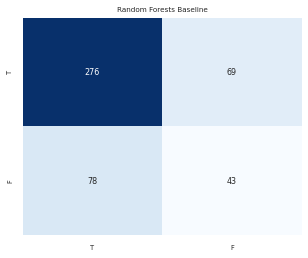

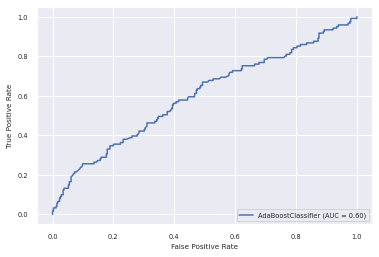

This is the starting index: 1041 of patient 2
0.2935153583617747
[([1], 1, array([0.49020803, 0.50979197])), ([0], 0, array([0.51273509, 0.48726491])), ([0], 0, array([0.50162474, 0.49837526])), ([1], 1, array([0.49072074, 0.50927926])), ([0], 1, array([0.49897, 0.50103])), ([0], 1, array([0.49350614, 0.50649386])), ([0], 0, array([0.50213841, 0.49786159])), ([1], 1, array([0.49040643, 0.50959357])), ([1], 1, array([0.49933938, 0.50066062])), ([1], 1, array([0.49116785, 0.50883215])), ([1], 1, array([0.49666207, 0.50333793])), ([1], 1, array([0.49367907, 0.50632093])), ([1], 0, array([0.50224172, 0.49775828])), ([0], 1, array([0.49454611, 0.50545389])), ([1], 1, array([0.49628012, 0.50371988])), ([1], 1, array([0.4926966, 0.5073034])), ([0], 1, array([0.49348327, 0.50651673])), ([0], 1, array([0.49875307, 0.50124693])), ([0], 1, array([0.4994503, 0.5005497])), ([0], 0, array([0.50964251, 0.49035749])), ([0], 1, array([0.48238567, 0.51761433])), ([0], 1, array([0.49776391, 0.50223609]))

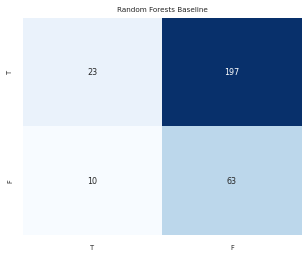

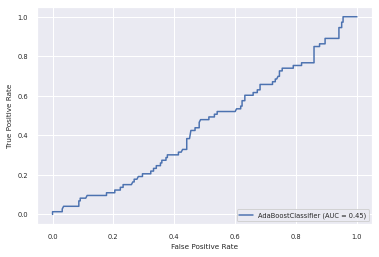

This is the starting index: 1335 of patient 3
0.6296296296296297
[([0], 1, array([0.49905832, 0.50094168])), ([1], 0, array([0.5030926, 0.4969074])), ([1], 1, array([0.49799129, 0.50200871])), ([1], 1, array([0.49815889, 0.50184111])), ([1], 1, array([0.49027531, 0.50972469])), ([1], 0, array([0.50123073, 0.49876927])), ([1], 1, array([0.49739364, 0.50260636])), ([0], 0, array([0.50115534, 0.49884466])), ([0], 0, array([0.50473385, 0.49526615])), ([0], 0, array([0.50837398, 0.49162602])), ([0], 1, array([0.49850949, 0.50149051])), ([0], 0, array([0.50472355, 0.49527645])), ([0], 1, array([0.49836704, 0.50163296])), ([1], 1, array([0.49833461, 0.50166539])), ([0], 0, array([0.52199547, 0.47800453])), ([0], 1, array([0.49953367, 0.50046633])), ([0], 1, array([0.493973, 0.506027])), ([0], 1, array([0.49418678, 0.50581322])), ([0], 1, array([0.49833461, 0.50166539])), ([0], 1, array([0.48894328, 0.51105672])), ([0], 1, array([0.49891128, 0.50108872])), ([0], 1, array([0.49579122, 0.5042087

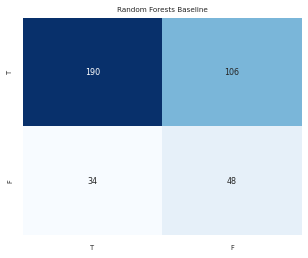

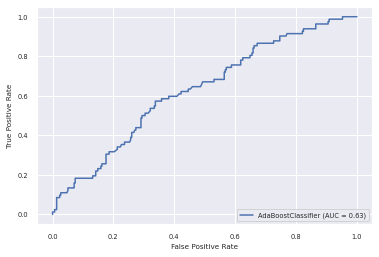

This is the starting index: 1714 of patient 4
0.6212624584717608
[([1], 1, array([0.49465804, 0.50534196])), ([1], 1, array([0.49355577, 0.50644423])), ([1], 0, array([0.50100287, 0.49899713])), ([1], 1, array([0.49791758, 0.50208242])), ([1], 1, array([0.49699733, 0.50300267])), ([1], 0, array([0.50012032, 0.49987968])), ([1], 0, array([0.50140371, 0.49859629])), ([1], 1, array([0.49548058, 0.50451942])), ([1], 0, array([0.50628222, 0.49371778])), ([1], 0, array([0.50106405, 0.49893595])), ([1], 1, array([0.49929367, 0.50070633])), ([1], 1, array([0.498547, 0.501453])), ([1], 1, array([0.4968586, 0.5031414])), ([1], 1, array([0.49830303, 0.50169697])), ([1], 1, array([0.49822735, 0.50177265])), ([1], 1, array([0.49788435, 0.50211565])), ([1], 1, array([0.49337644, 0.50662356])), ([1], 1, array([0.49699733, 0.50300267])), ([1], 1, array([0.49751336, 0.50248664])), ([1], 1, array([0.49310194, 0.50689806])), ([1], 1, array([0.49797089, 0.50202911])), ([1], 1, array([0.49544392, 0.5045560

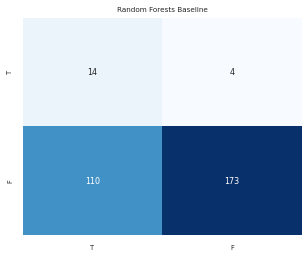

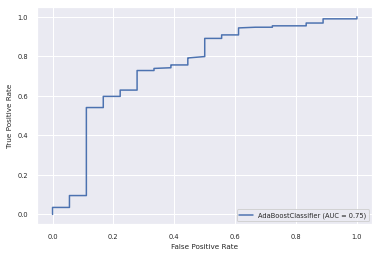

This is the starting index: 2016 of patient 5
0.44567627494456763
[([0], 0, array([0.50098097, 0.49901903])), ([0], 0, array([0.51138026, 0.48861974])), ([0], 0, array([0.50517666, 0.49482334])), ([0], 0, array([0.51310025, 0.48689975])), ([0], 0, array([0.50642435, 0.49357565])), ([0], 0, array([0.50954034, 0.49045966])), ([1], 0, array([0.50995528, 0.49004472])), ([1], 0, array([0.51450409, 0.48549591])), ([1], 0, array([0.50498759, 0.49501241])), ([1], 0, array([0.5091776, 0.4908224])), ([0], 0, array([0.50825075, 0.49174925])), ([1], 0, array([0.50803905, 0.49196095])), ([0], 0, array([0.5084244, 0.4915756])), ([1], 0, array([0.50041625, 0.49958375])), ([1], 0, array([0.5108838, 0.4891162])), ([1], 0, array([0.50669837, 0.49330163])), ([1], 1, array([0.49707718, 0.50292282])), ([1], 0, array([0.50860605, 0.49139395])), ([1], 0, array([0.50663522, 0.49336478])), ([1], 0, array([0.50837855, 0.49162145])), ([1], 1, array([0.49191853, 0.50808147])), ([1], 0, array([0.5052252, 0.4947748

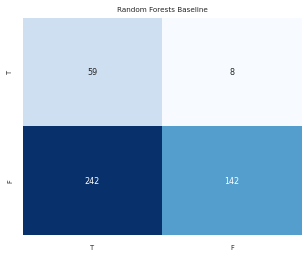

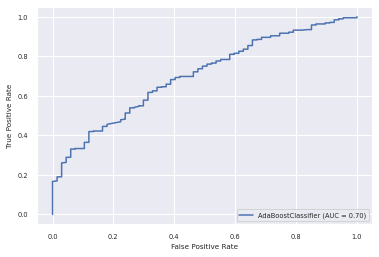

This is the starting index: 2468 of patient 6
0.5695538057742782
[([1], 1, array([0.49964788, 0.50035212])), ([1], 1, array([0.49651851, 0.50348149])), ([1], 1, array([0.49284663, 0.50715337])), ([1], 0, array([0.50400361, 0.49599639])), ([1], 0, array([0.50407067, 0.49592933])), ([1], 1, array([0.49854942, 0.50145058])), ([1], 1, array([0.4945147, 0.5054853])), ([1], 0, array([0.51221183, 0.48778817])), ([1], 1, array([0.49887365, 0.50112635])), ([1], 0, array([0.50627798, 0.49372202])), ([0], 0, array([0.51379998, 0.48620002])), ([1], 1, array([0.32643878, 0.67356122])), ([1], 0, array([0.50583929, 0.49416071])), ([1], 1, array([0.49522145, 0.50477855])), ([1], 1, array([0.49102146, 0.50897854])), ([1], 1, array([0.49412598, 0.50587402])), ([1], 1, array([0.32610697, 0.67389303])), ([1], 1, array([0.4944469, 0.5055531])), ([1], 1, array([0.49210988, 0.50789012])), ([0], 0, array([0.50343691, 0.49656309])), ([1], 0, array([0.50289375, 0.49710625])), ([1], 0, array([0.50370896, 0.49629

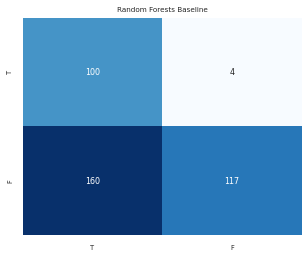

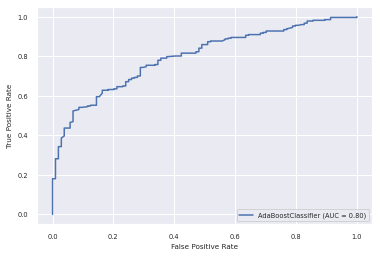

This is the starting index: 2850 of patient 7
0.822680412371134
[([0], 0, array([0.5028203, 0.4971797])), ([0], 0, array([0.5057504, 0.4942496])), ([0], 0, array([0.50583668, 0.49416332])), ([0], 0, array([0.50042268, 0.49957732])), ([0], 0, array([0.502982, 0.497018])), ([0], 0, array([0.5031327, 0.4968673])), ([0], 0, array([0.5040196, 0.4959804])), ([0], 0, array([0.50616397, 0.49383603])), ([0], 0, array([0.50323155, 0.49676845])), ([0], 0, array([0.50574776, 0.49425224])), ([0], 0, array([0.50488592, 0.49511408])), ([0], 0, array([0.50729653, 0.49270347])), ([0], 1, array([0.49450854, 0.50549146])), ([0], 1, array([0.49705723, 0.50294277])), ([0], 0, array([0.50387153, 0.49612847])), ([0], 0, array([0.50818191, 0.49181809])), ([0], 0, array([0.50560174, 0.49439826])), ([0], 0, array([0.50250977, 0.49749023])), ([0], 0, array([0.50700655, 0.49299345])), ([0], 0, array([0.50512105, 0.49487895])), ([0], 0, array([0.50440332, 0.49559668])), ([0], 0, array([0.51121181, 0.48878819])), (

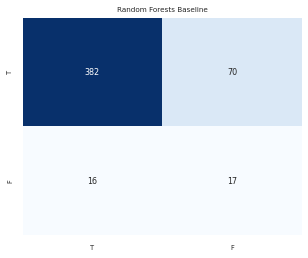

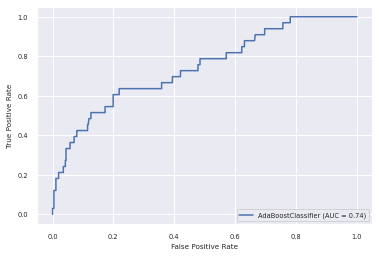

This is the starting index: 3336 of patient 8
0.6851211072664359
[([1], 0, array([0.50585203, 0.49414797])), ([1], 1, array([0.49473586, 0.50526414])), ([0], 0, array([0.50637351, 0.49362649])), ([1], 0, array([0.50389026, 0.49610974])), ([1], 1, array([0.49402913, 0.50597087])), ([1], 1, array([0.4950948, 0.5049052])), ([1], 1, array([0.49670292, 0.50329708])), ([1], 1, array([0.49223022, 0.50776978])), ([1], 1, array([0.49505722, 0.50494278])), ([1], 1, array([0.4950948, 0.5049052])), ([0], 1, array([0.49911967, 0.50088033])), ([1], 1, array([0.49751366, 0.50248634])), ([0], 0, array([0.5039397, 0.4960603])), ([1], 1, array([0.49410962, 0.50589038])), ([1], 1, array([0.49829712, 0.50170288])), ([0], 0, array([0.51242574, 0.48757426])), ([0], 0, array([0.5020322, 0.4979678])), ([1], 0, array([0.50287421, 0.49712579])), ([1], 1, array([0.48977496, 0.51022504])), ([1], 1, array([0.49819535, 0.50180465])), ([1], 1, array([0.49359773, 0.50640227])), ([0], 1, array([0.49460527, 0.50539473]

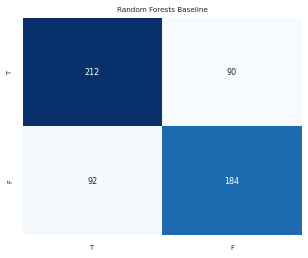

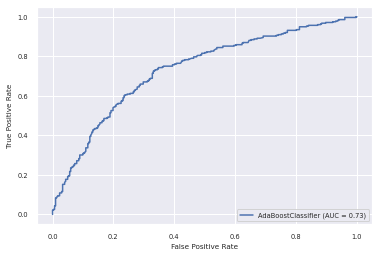

This is the starting index: 3915 of patient 9
0.6464285714285715
[([1], 1, array([0.49433383, 0.50566617])), ([1], 1, array([0.49500671, 0.50499329])), ([1], 1, array([0.49652296, 0.50347704])), ([1], 1, array([0.49652296, 0.50347704])), ([1], 1, array([0.49547885, 0.50452115])), ([1], 1, array([0.49152166, 0.50847834])), ([1], 0, array([0.5006253, 0.4993747])), ([1], 1, array([0.49905677, 0.50094323])), ([1], 1, array([0.49392316, 0.50607684])), ([1], 1, array([0.4975037, 0.5024963])), ([1], 1, array([0.49419299, 0.50580701])), ([1], 0, array([0.50086723, 0.49913277])), ([1], 1, array([0.49633471, 0.50366529])), ([1], 0, array([0.50716643, 0.49283357])), ([1], 1, array([0.49895384, 0.50104616])), ([1], 1, array([0.49874056, 0.50125944])), ([1], 1, array([0.49882899, 0.50117101])), ([1], 1, array([0.4975037, 0.5024963])), ([1], 0, array([0.50074035, 0.49925965])), ([1], 1, array([0.49652268, 0.50347732])), ([1], 0, array([0.50238403, 0.49761597])), ([1], 1, array([0.4996787, 0.5003213]

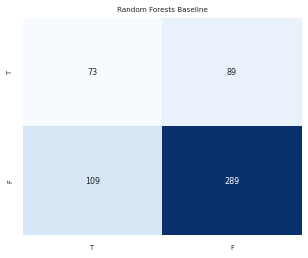

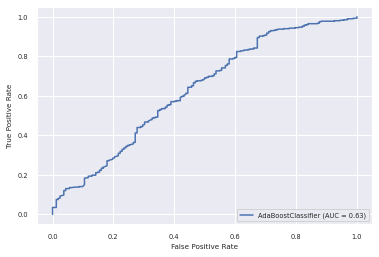

This is the starting index: 4476 of patient 10
0.8200371057513914
[([0], 0, array([0.50351858, 0.49648142])), ([0], 1, array([0.49908319, 0.50091681])), ([0], 0, array([0.50863887, 0.49136113])), ([0], 0, array([0.50473385, 0.49526615])), ([0], 0, array([0.50063487, 0.49936513])), ([0], 0, array([0.50863887, 0.49136113])), ([1], 1, array([0.49266366, 0.50733634])), ([1], 0, array([0.50894206, 0.49105794])), ([0], 0, array([0.50873145, 0.49126855])), ([0], 0, array([0.5061294, 0.4938706])), ([1], 1, array([0.49404467, 0.50595533])), ([1], 1, array([0.49901757, 0.50098243])), ([1], 0, array([0.50908882, 0.49091118])), ([0], 0, array([0.5248572, 0.4751428])), ([0], 0, array([0.50107828, 0.49892172])), ([0], 0, array([0.50396496, 0.49603504])), ([0], 0, array([0.50430715, 0.49569285])), ([0], 0, array([0.5090891, 0.4909109])), ([1], 1, array([0.49751986, 0.50248014])), ([0], 1, array([0.49954059, 0.50045941])), ([1], 0, array([0.50629096, 0.49370904])), ([0], 0, array([0.5147384, 0.4852616

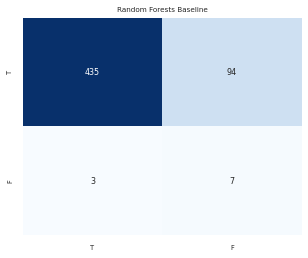

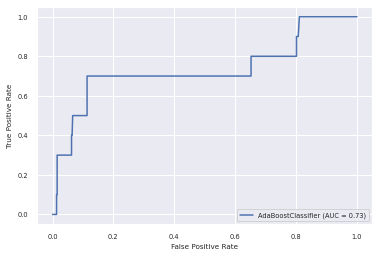

This is the starting index: 5016 of patient 11
0.7207792207792207
[([0], 0, array([0.50429334, 0.49570666])), ([0], 0, array([0.51114435, 0.48885565])), ([0], 0, array([0.51944553, 0.48055447])), ([0], 0, array([0.509212, 0.490788])), ([0], 0, array([0.5033907, 0.4966093])), ([0], 0, array([0.50826827, 0.49173173])), ([0], 0, array([0.50240864, 0.49759136])), ([0], 0, array([0.50381778, 0.49618222])), ([0], 0, array([0.50629802, 0.49370198])), ([0], 0, array([0.50565498, 0.49434502])), ([0], 0, array([0.50485969, 0.49514031])), ([0], 0, array([0.50726162, 0.49273838])), ([0], 0, array([0.50491323, 0.49508677])), ([1], 1, array([0.49860028, 0.50139972])), ([0], 0, array([0.50358499, 0.49641501])), ([1], 0, array([0.50121834, 0.49878166])), ([0], 1, array([0.49769917, 0.50230083])), ([0], 0, array([0.50890708, 0.49109292])), ([0], 0, array([0.51106455, 0.48893545])), ([1], 0, array([0.51207957, 0.48792043])), ([0], 0, array([0.50775462, 0.49224538])), ([0], 0, array([0.52222087, 0.477779

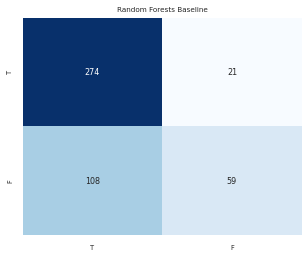

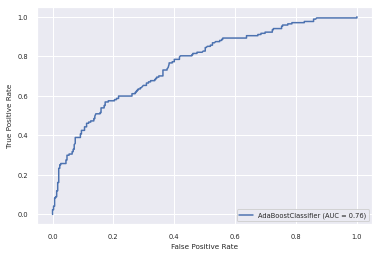

This is the starting index: 5479 of patient 12
0.32941176470588235
[([0], 1, array([0.49325492, 0.50674508])), ([0], 1, array([0.49620646, 0.50379354])), ([0], 1, array([0.49476547, 0.50523453])), ([0], 1, array([0.49435289, 0.50564711])), ([0], 0, array([0.50755431, 0.49244569])), ([0], 1, array([0.49478588, 0.50521412])), ([0], 1, array([0.49629546, 0.50370454])), ([0], 1, array([0.49222641, 0.50777359])), ([0], 1, array([0.49467541, 0.50532459])), ([0], 1, array([0.49325492, 0.50674508])), ([0], 1, array([0.49325492, 0.50674508])), ([0], 1, array([0.49469666, 0.50530334])), ([0], 1, array([0.49224601, 0.50775399])), ([0], 1, array([0.49919243, 0.50080757])), ([0], 1, array([0.4921568, 0.5078432])), ([0], 1, array([0.49334392, 0.50665608])), ([0], 1, array([0.49588392, 0.50411608])), ([0], 0, array([0.50026438, 0.49973562])), ([0], 1, array([0.49478588, 0.50521412])), ([0], 1, array([0.4922843, 0.5077157])), ([0], 0, array([0.50072361, 0.49927639])), ([0], 1, array([0.49377689, 0.506

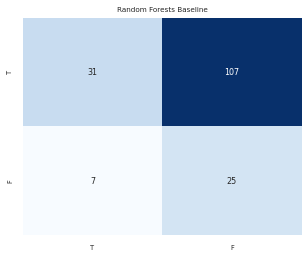

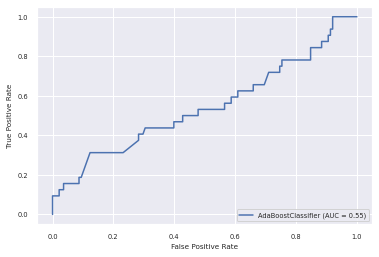

<function matplotlib.pyplot.show>

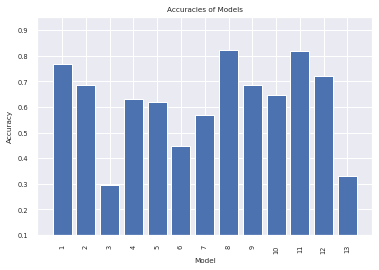

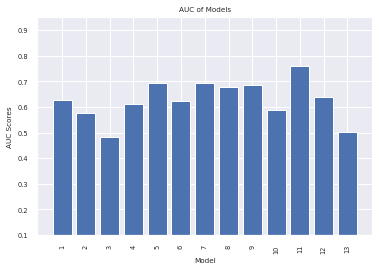

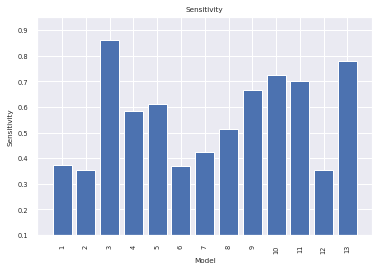

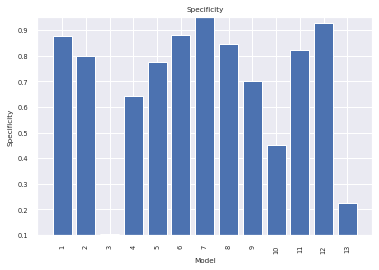

In [29]:
Accuracy = []
auc = []
sensitivity = []
specificity = []
clf = AdaBoostClassifier()

for i in range(0,13):
    test, train, test_class, train_class = leave_one_out(df,i)
    clf.fit(train, train_class.ravel())

    y_predicted = clf.predict(test)
    print(metrics.accuracy_score(test_class,y_predicted))
        # print("Random Forest:\n",metrics.classification_report(test_class,y_predicted)) # Classification report
    Accuracy.append(metrics.accuracy_score(test_class,y_predicted))
    auc.append(metrics.roc_auc_score(test_class,y_predicted))
    mcm = confusion_matrix(test_class,y_predicted)
    tn = mcm[0, 0]
    tp = mcm[1, 1]
    fn = mcm[1, 0]
    fp = mcm[0, 1]
    sensitivity.append(tp / (tp + fn))
    specificity.append(tn / (tn + fp))
    pred = clf.predict_proba(test)
    result = [*zip(test_class.tolist(), y_predicted, pred)]
    print(result) 
    report = metrics.classification_report(test_class.tolist(), y_predicted)
    matrix = metrics.confusion_matrix(test_class.tolist(),y_predicted)   

    fig, (ax1) = plt.subplots(1, figsize=(5, 4))


    df_cm1 = pd.DataFrame(matrix, range(2), range(2))
    sn.set(font_scale=0.6) # for label size
    sn.heatmap(df_cm1, annot=True,annot_kws={"size": 8}, fmt='g', cmap='Blues', cbar= False, xticklabels=x_axis_labels, yticklabels=y_axis_labels, ax = ax1) # font size


    ax1.set_title('Random Forests Baseline')

    plt.show()
    metrics.plot_roc_curve(clf, test, test_class.tolist())  # doctest: +SKIP
    plt.show()

Model=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13']

Index = [1,2,3,4,5,6,7,8,9,10,11,12,13]
fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,Accuracy)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Accuracy')
plt.xlabel('Model')
plt.title('Accuracies of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,auc)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('AUC Scores')
plt.xlabel('Model')
plt.title('AUC of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,sensitivity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Sensitivity')
plt.xlabel('Model')
plt.title('Sensitivity')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,specificity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Specificity')
plt.xlabel('Model')
plt.title('Specificity')
plt.show

#### GridSearch

In [ ]:
parameters = {
    'n_estimators'      : [50,150,250],
    'learning_rate'         : [0.4, 0.8, 1.0],
    'random_state'      : [0],
    #'max_features': ['auto'],
    #'criterion' :['gini']
}


for i in range(0,13):
    test, train, test_class, train_class = leave_one_out(df,i)
    search = GridSearchCV(AdaBoostClassifier(), parameters, cv=10, n_jobs=-1)
    search.fit(train, train_class.ravel())

    print(search.score(train, train_class.ravel()))
    print(search.best_params_)

This is the starting index: 0 of patient 0
0.7098680323025409
{'learning_rate': 0.4, 'n_estimators': 50, 'random_state': 0}
This is the starting index: 574 of patient 1
0.7183641975308642
{'learning_rate': 0.4, 'n_estimators': 50, 'random_state': 0}
This is the starting index: 1041 of patient 2
0.7578868769833862
{'learning_rate': 0.4, 'n_estimators': 150, 'random_state': 0}
This is the starting index: 1335 of patient 3
0.7196509863429439
{'learning_rate': 0.4, 'n_estimators': 50, 'random_state': 0}
This is the starting index: 1714 of patient 4
0.7199476537670593
{'learning_rate': 0.4, 'n_estimators': 50, 'random_state': 0}
This is the starting index: 2016 of patient 5
0.73821888824774
{'learning_rate': 0.4, 'n_estimators': 50, 'random_state': 0}
This is the starting index: 2468 of patient 6
0.7304991459479977
{'learning_rate': 0.4, 'n_estimators': 50, 'random_state': 0}
This is the starting index: 2850 of patient 7
0.7169409486931269
{'learning_rate': 1.0, 'n_estimators': 50, 'random_

This is the starting index: 0 of patient 0
0.7975567190226877
[([1], 0, array([0.50248898, 0.49751102])), ([1], 0, array([0.50072779, 0.49927221])), ([0], 1, array([0.490597, 0.509403])), ([1], 0, array([0.51450612, 0.48549388])), ([1], 1, array([0.48936853, 0.51063147])), ([0], 0, array([0.52703717, 0.47296283])), ([1], 0, array([0.51580585, 0.48419415])), ([0], 0, array([0.50788975, 0.49211025])), ([1], 1, array([0.48936853, 0.51063147])), ([0], 0, array([0.50994996, 0.49005004])), ([0], 0, array([0.50735272, 0.49264728])), ([1], 0, array([0.50606216, 0.49393784])), ([1], 0, array([0.5033051, 0.4966949])), ([0], 0, array([0.50576774, 0.49423226])), ([1], 1, array([0.49172337, 0.50827663])), ([1], 1, array([0.490597, 0.509403])), ([1], 0, array([0.50152316, 0.49847684])), ([1], 0, array([0.51123632, 0.48876368])), ([1], 1, array([0.49295916, 0.50704084])), ([1], 1, array([0.49876888, 0.50123112])), ([0], 0, array([0.50583403, 0.49416597])), ([1], 0, array([0.51669887, 0.48330113])), (

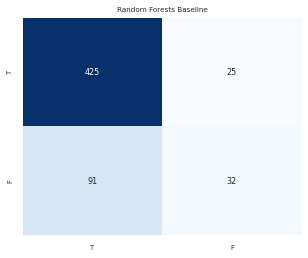

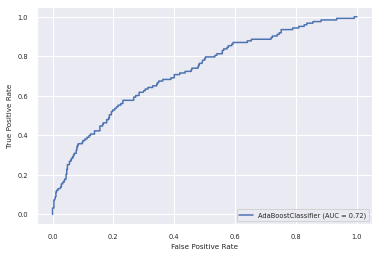

This is the starting index: 574 of patient 1
0.721030042918455
[([0], 1, array([0.49230627, 0.50769373])), ([0], 1, array([0.49858177, 0.50141823])), ([0], 0, array([0.51687505, 0.48312495])), ([0], 1, array([0.49483098, 0.50516902])), ([0], 0, array([0.50018798, 0.49981202])), ([0], 0, array([0.5140733, 0.4859267])), ([1], 1, array([0.47849388, 0.52150612])), ([0], 1, array([0.49858177, 0.50141823])), ([0], 0, array([0.5028027, 0.4971973])), ([0], 0, array([0.51595565, 0.48404435])), ([0], 0, array([0.51242824, 0.48757176])), ([0], 1, array([0.49748275, 0.50251725])), ([1], 1, array([0.49748275, 0.50251725])), ([0], 0, array([0.50246051, 0.49753949])), ([0], 0, array([0.50777034, 0.49222966])), ([0], 0, array([0.5119182, 0.4880818])), ([0], 1, array([0.49748275, 0.50251725])), ([0], 0, array([0.51092414, 0.48907586])), ([1], 0, array([0.50283301, 0.49716699])), ([0], 0, array([0.50882058, 0.49117942])), ([1], 1, array([0.48959834, 0.51040166])), ([0], 0, array([0.51595565, 0.48404435]

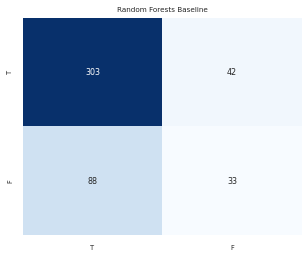

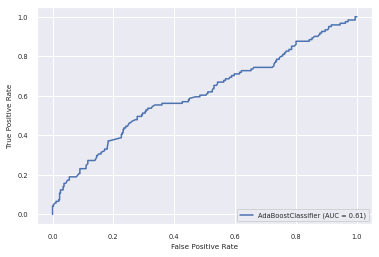

This is the starting index: 1041 of patient 2
0.28668941979522183
[([1], 1, array([0.48494951, 0.51505049])), ([0], 0, array([0.50127283, 0.49872717])), ([0], 1, array([0.48988132, 0.51011868])), ([1], 1, array([0.48614905, 0.51385095])), ([0], 1, array([0.48417745, 0.51582255])), ([0], 1, array([0.48793433, 0.51206567])), ([0], 1, array([0.48417745, 0.51582255])), ([1], 1, array([0.48417745, 0.51582255])), ([1], 1, array([0.49526979, 0.50473021])), ([1], 1, array([0.48531907, 0.51468093])), ([1], 1, array([0.49176602, 0.50823398])), ([1], 1, array([0.49145451, 0.50854549])), ([1], 1, array([0.49597459, 0.50402541])), ([0], 1, array([0.49119399, 0.50880601])), ([1], 1, array([0.49521365, 0.50478635])), ([1], 1, array([0.48358595, 0.51641405])), ([0], 1, array([0.4852937, 0.5147063])), ([0], 1, array([0.49138487, 0.50861513])), ([0], 1, array([0.48334767, 0.51665233])), ([0], 0, array([0.51129787, 0.48870213])), ([0], 1, array([0.4808146, 0.5191854])), ([0], 1, array([0.49138294, 0.5086

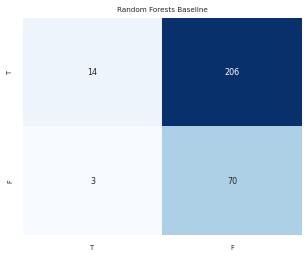

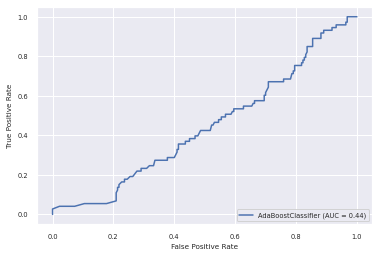

This is the starting index: 1335 of patient 3
0.656084656084656
[([0], 1, array([0.4960814, 0.5039186])), ([1], 1, array([0.49683692, 0.50316308])), ([1], 1, array([0.49376117, 0.50623883])), ([1], 1, array([0.49605152, 0.50394848])), ([1], 1, array([0.48385618, 0.51614382])), ([1], 1, array([0.49888606, 0.50111394])), ([1], 1, array([0.49372118, 0.50627882])), ([0], 0, array([0.50011198, 0.49988802])), ([0], 0, array([0.50786604, 0.49213396])), ([0], 0, array([0.50677455, 0.49322545])), ([0], 1, array([0.49653279, 0.50346721])), ([0], 0, array([0.506806, 0.493194])), ([0], 0, array([0.50561911, 0.49438089])), ([1], 1, array([0.49925048, 0.50074952])), ([0], 0, array([0.51909049, 0.48090951])), ([0], 0, array([0.50011198, 0.49988802])), ([0], 0, array([0.50330788, 0.49669212])), ([0], 1, array([0.48954877, 0.51045123])), ([0], 0, array([0.50362746, 0.49637254])), ([0], 1, array([0.49451298, 0.50548702])), ([0], 0, array([0.5016284, 0.4983716])), ([0], 1, array([0.4895701, 0.5104299])),

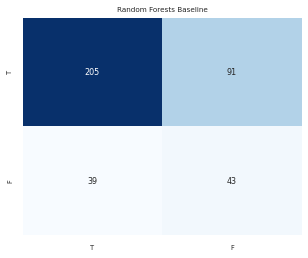

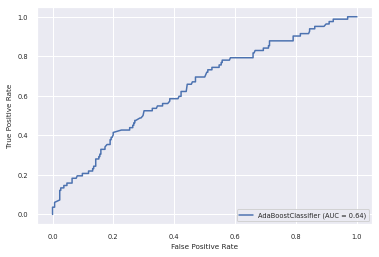

This is the starting index: 1714 of patient 4
0.5946843853820598
[([1], 1, array([0.4923644, 0.5076356])), ([1], 1, array([0.49161184, 0.50838816])), ([1], 0, array([0.5061652, 0.4938348])), ([1], 0, array([0.50023744, 0.49976256])), ([1], 1, array([0.49671652, 0.50328348])), ([1], 0, array([0.50135185, 0.49864815])), ([1], 0, array([0.50135185, 0.49864815])), ([1], 1, array([0.49417039, 0.50582961])), ([1], 0, array([0.50443154, 0.49556846])), ([1], 0, array([0.50234394, 0.49765606])), ([1], 1, array([0.49725664, 0.50274336])), ([1], 1, array([0.49840919, 0.50159081])), ([1], 1, array([0.4923644, 0.5076356])), ([1], 1, array([0.49428793, 0.50571207])), ([1], 1, array([0.49396509, 0.50603491])), ([1], 1, array([0.49690851, 0.50309149])), ([1], 1, array([0.49083131, 0.50916869])), ([1], 1, array([0.49480214, 0.50519786])), ([1], 1, array([0.49653236, 0.50346764])), ([1], 1, array([0.49223223, 0.50776777])), ([1], 1, array([0.49567481, 0.50432519])), ([1], 1, array([0.49290799, 0.5070920

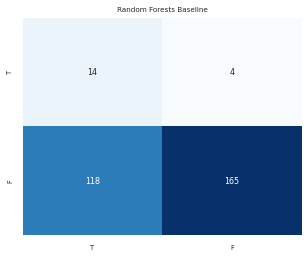

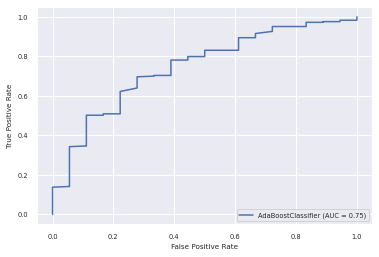

This is the starting index: 2016 of patient 5
0.43902439024390244
[([0], 0, array([0.51047133, 0.48952867])), ([0], 0, array([0.52637953, 0.47362047])), ([0], 0, array([0.51500067, 0.48499933])), ([0], 0, array([0.51959877, 0.48040123])), ([0], 0, array([0.5161836, 0.4838164])), ([0], 0, array([0.52279111, 0.47720889])), ([1], 0, array([0.51453836, 0.48546164])), ([1], 0, array([0.53342857, 0.46657143])), ([1], 0, array([0.51180342, 0.48819658])), ([1], 0, array([0.51623645, 0.48376355])), ([0], 0, array([0.51997993, 0.48002007])), ([1], 0, array([0.51447138, 0.48552862])), ([0], 0, array([0.50899887, 0.49100113])), ([1], 0, array([0.51011282, 0.48988718])), ([1], 0, array([0.51723411, 0.48276589])), ([1], 0, array([0.51796193, 0.48203807])), ([1], 0, array([0.51004384, 0.48995616])), ([1], 0, array([0.52048501, 0.47951499])), ([1], 0, array([0.51089753, 0.48910247])), ([1], 0, array([0.52038241, 0.47961759])), ([1], 1, array([0.4871215, 0.5128785])), ([1], 0, array([0.51072545, 0.4892

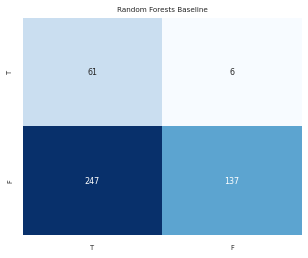

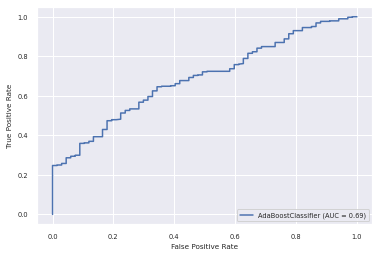

This is the starting index: 2468 of patient 6
0.5406824146981627
[([1], 1, array([0.49858315, 0.50141685])), ([1], 1, array([0.49455263, 0.50544737])), ([1], 1, array([0.48845784, 0.51154216])), ([1], 0, array([0.51918681, 0.48081319])), ([1], 0, array([0.51416252, 0.48583748])), ([1], 1, array([0.49776367, 0.50223633])), ([1], 1, array([0.48768272, 0.51231728])), ([1], 0, array([0.52511782, 0.47488218])), ([1], 0, array([0.50404585, 0.49595415])), ([1], 0, array([0.51289597, 0.48710403])), ([0], 0, array([0.52397855, 0.47602145])), ([1], 1, array([0.32424627, 0.67575373])), ([1], 0, array([0.51530624, 0.48469376])), ([1], 1, array([0.49188217, 0.50811783])), ([1], 0, array([0.50691418, 0.49308582])), ([1], 1, array([0.48909135, 0.51090865])), ([1], 1, array([0.31763059, 0.68236941])), ([1], 1, array([0.49198733, 0.50801267])), ([1], 1, array([0.48806583, 0.51193417])), ([0], 0, array([0.51966617, 0.48033383])), ([1], 1, array([0.49998663, 0.50001337])), ([1], 0, array([0.51049687, 0.4

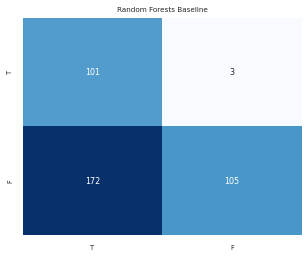

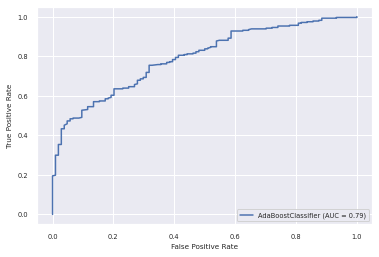

This is the starting index: 2850 of patient 7
0.8494845360824742
[([0], 0, array([0.5071728, 0.4928272])), ([0], 0, array([0.5082884, 0.4917116])), ([0], 0, array([0.51173044, 0.48826956])), ([0], 0, array([0.5064294, 0.4935706])), ([0], 0, array([0.5064294, 0.4935706])), ([0], 0, array([0.50928169, 0.49071831])), ([0], 0, array([0.51208592, 0.48791408])), ([0], 0, array([0.52221961, 0.47778039])), ([0], 0, array([0.51282392, 0.48717608])), ([0], 0, array([0.51409321, 0.48590679])), ([0], 0, array([0.51702494, 0.48297506])), ([0], 0, array([0.51554749, 0.48445251])), ([0], 1, array([0.48898056, 0.51101944])), ([0], 1, array([0.49144995, 0.50855005])), ([0], 0, array([0.5071728, 0.4928272])), ([0], 0, array([0.52390373, 0.47609627])), ([0], 0, array([0.5144534, 0.4855466])), ([0], 0, array([0.50598503, 0.49401497])), ([0], 0, array([0.51158241, 0.48841759])), ([0], 0, array([0.5162248, 0.4837752])), ([0], 0, array([0.51100589, 0.48899411])), ([0], 0, array([0.51784084, 0.48215916])), ([

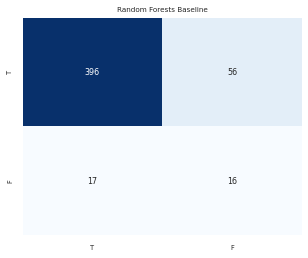

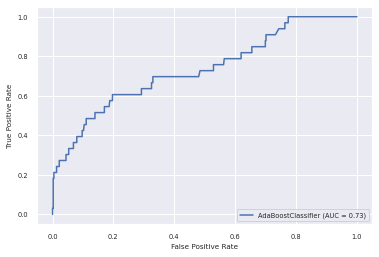

This is the starting index: 3336 of patient 8
0.6937716262975778
[([1], 0, array([0.50722735, 0.49277265])), ([1], 1, array([0.48983217, 0.51016783])), ([0], 0, array([0.51132364, 0.48867636])), ([1], 0, array([0.5093105, 0.4906895])), ([1], 1, array([0.48995802, 0.51004198])), ([1], 1, array([0.48843836, 0.51156164])), ([1], 1, array([0.49284582, 0.50715418])), ([1], 1, array([0.48821461, 0.51178539])), ([1], 1, array([0.48957029, 0.51042971])), ([1], 1, array([0.48843836, 0.51156164])), ([0], 1, array([0.49619137, 0.50380863])), ([1], 1, array([0.49153477, 0.50846523])), ([0], 0, array([0.51839338, 0.48160662])), ([1], 1, array([0.48957029, 0.51042971])), ([1], 1, array([0.48957029, 0.51042971])), ([0], 0, array([0.52425136, 0.47574864])), ([0], 0, array([0.50766146, 0.49233854])), ([1], 0, array([0.50859752, 0.49140248])), ([1], 1, array([0.48663831, 0.51336169])), ([1], 0, array([0.50375814, 0.49624186])), ([1], 1, array([0.48843836, 0.51156164])), ([0], 1, array([0.49968749, 0.500

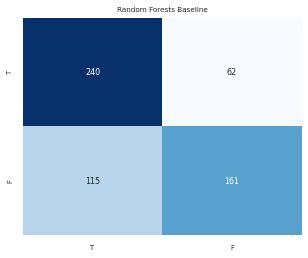

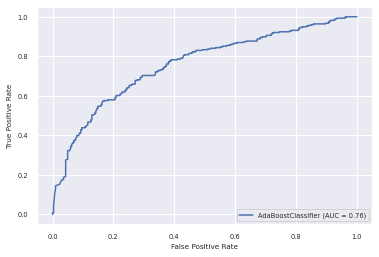

This is the starting index: 3915 of patient 9
0.6357142857142857
[([1], 1, array([0.49674462, 0.50325538])), ([1], 1, array([0.49609244, 0.50390756])), ([1], 0, array([0.50003293, 0.49996707])), ([1], 1, array([0.49798782, 0.50201218])), ([1], 1, array([0.49395919, 0.50604081])), ([1], 1, array([0.48866055, 0.51133945])), ([1], 0, array([0.50003293, 0.49996707])), ([1], 1, array([0.49860935, 0.50139065])), ([1], 1, array([0.49579069, 0.50420931])), ([1], 0, array([0.50003293, 0.49996707])), ([1], 1, array([0.49596609, 0.50403391])), ([1], 1, array([0.49916769, 0.50083231])), ([1], 1, array([0.49395919, 0.50604081])), ([1], 1, array([0.49984687, 0.50015313])), ([1], 1, array([0.49798782, 0.50201218])), ([1], 1, array([0.49548492, 0.50451508])), ([1], 1, array([0.49798782, 0.50201218])), ([1], 0, array([0.50466604, 0.49533396])), ([1], 1, array([0.49999491, 0.50000509])), ([1], 1, array([0.49589173, 0.50410827])), ([1], 1, array([0.49739209, 0.50260791])), ([1], 1, array([0.49798782, 0.5

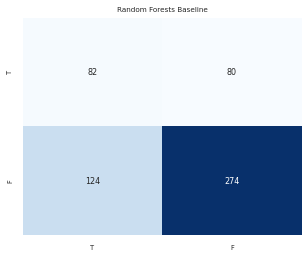

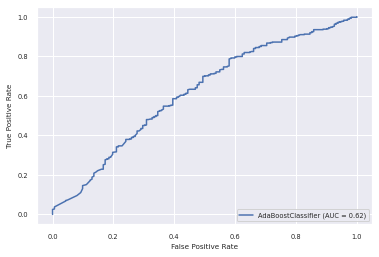

This is the starting index: 4476 of patient 10
0.8905380333951762
[([0], 0, array([0.512743, 0.487257])), ([0], 0, array([0.50893252, 0.49106748])), ([0], 0, array([0.51451973, 0.48548027])), ([0], 0, array([0.50536981, 0.49463019])), ([0], 0, array([0.5088298, 0.4911702])), ([0], 0, array([0.51451973, 0.48548027])), ([1], 1, array([0.48704386, 0.51295614])), ([1], 0, array([0.5109015, 0.4890985])), ([0], 0, array([0.52221141, 0.47778859])), ([0], 0, array([0.51568554, 0.48431446])), ([1], 1, array([0.4911141, 0.5088859])), ([1], 1, array([0.4946912, 0.5053088])), ([1], 0, array([0.51388742, 0.48611258])), ([0], 0, array([0.52143941, 0.47856059])), ([0], 0, array([0.51078962, 0.48921038])), ([0], 0, array([0.519632, 0.480368])), ([0], 0, array([0.50754659, 0.49245341])), ([0], 0, array([0.52026465, 0.47973535])), ([1], 1, array([0.4932774, 0.5067226])), ([0], 0, array([0.50580933, 0.49419067])), ([1], 0, array([0.51524252, 0.48475748])), ([0], 0, array([0.52200935, 0.47799065])), ([0],

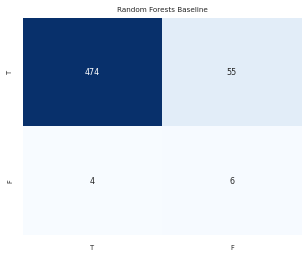

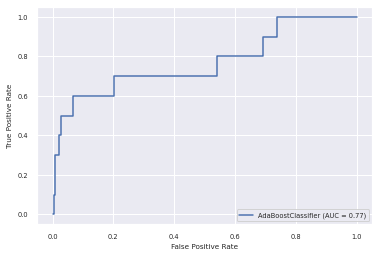

This is the starting index: 5016 of patient 11
0.7272727272727273
[([0], 0, array([0.5057749, 0.4942251])), ([0], 0, array([0.50381047, 0.49618953])), ([0], 0, array([0.53098789, 0.46901211])), ([0], 0, array([0.51873799, 0.48126201])), ([0], 1, array([0.49657027, 0.50342973])), ([0], 0, array([0.51200819, 0.48799181])), ([0], 0, array([0.50230712, 0.49769288])), ([0], 0, array([0.52226113, 0.47773887])), ([0], 0, array([0.51660894, 0.48339106])), ([0], 0, array([0.51628851, 0.48371149])), ([0], 0, array([0.50445709, 0.49554291])), ([0], 0, array([0.50968754, 0.49031246])), ([0], 0, array([0.52567337, 0.47432663])), ([1], 0, array([0.50171208, 0.49828792])), ([0], 0, array([0.51005081, 0.48994919])), ([1], 0, array([0.52036225, 0.47963775])), ([0], 0, array([0.50232797, 0.49767203])), ([0], 0, array([0.51838578, 0.48161422])), ([0], 0, array([0.5221566, 0.4778434])), ([1], 0, array([0.52308725, 0.47691275])), ([0], 0, array([0.51718693, 0.48281307])), ([0], 0, array([0.5343128, 0.46568

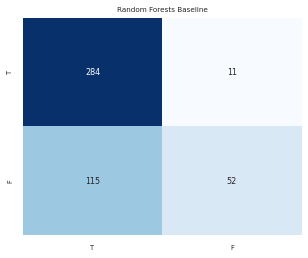

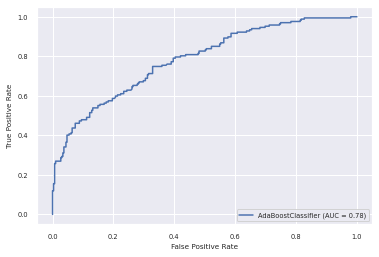

This is the starting index: 5479 of patient 12
0.2411764705882353
[([0], 1, array([0.48785589, 0.51214411])), ([0], 1, array([0.48864419, 0.51135581])), ([0], 1, array([0.4851304, 0.5148696])), ([0], 1, array([0.48679218, 0.51320782])), ([0], 0, array([0.50508184, 0.49491816])), ([0], 1, array([0.48759358, 0.51240642])), ([0], 1, array([0.48864419, 0.51135581])), ([0], 1, array([0.4851304, 0.5148696])), ([0], 1, array([0.4878427, 0.5121573])), ([0], 1, array([0.48679218, 0.51320782])), ([0], 1, array([0.4877591, 0.5122409])), ([0], 1, array([0.49031974, 0.50968026])), ([0], 1, array([0.48609714, 0.51390286])), ([0], 1, array([0.48966347, 0.51033653])), ([0], 1, array([0.48477836, 0.51522164])), ([0], 1, array([0.48609714, 0.51390286])), ([0], 1, array([0.49128695, 0.50871305])), ([0], 1, array([0.49978037, 0.50021963])), ([0], 1, array([0.49156913, 0.50843087])), ([0], 1, array([0.48609714, 0.51390286])), ([0], 1, array([0.49046508, 0.50953492])), ([0], 1, array([0.48856058, 0.51143942

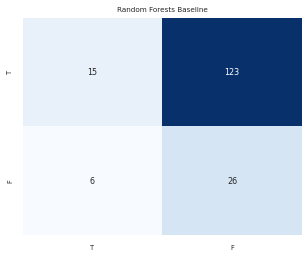

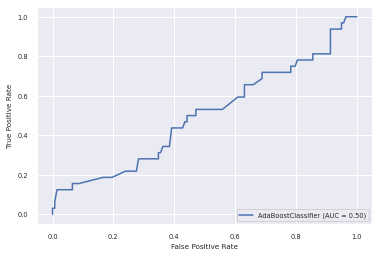

<function matplotlib.pyplot.show>

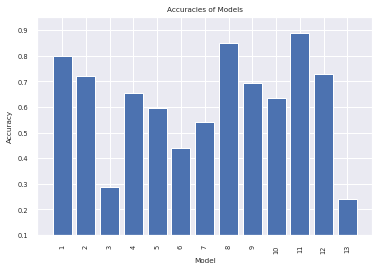

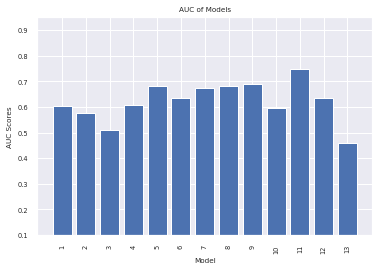

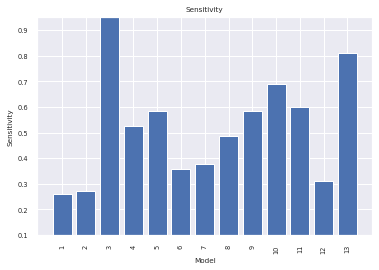

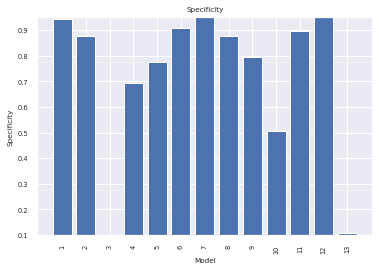

In [30]:
Accuracy = []
auc = []
sensitivity = []
specificity = []
clf = AdaBoostClassifier(learning_rate= 0.4, n_estimators= 50, random_state= 0)

for i in range(0,13):
    test, train, test_class, train_class = leave_one_out(df,i)
    clf.fit(train, train_class.ravel())

    y_predicted = clf.predict(test)
    print(metrics.accuracy_score(test_class,y_predicted))
        # print("Random Forest:\n",metrics.classification_report(test_class,y_predicted)) # Classification report
    Accuracy.append(metrics.accuracy_score(test_class,y_predicted))
    auc.append(metrics.roc_auc_score(test_class,y_predicted))
    mcm = confusion_matrix(test_class,y_predicted)
    tn = mcm[0, 0]
    tp = mcm[1, 1]
    fn = mcm[1, 0]
    fp = mcm[0, 1]
    sensitivity.append(tp / (tp + fn))
    specificity.append(tn / (tn + fp))
    pred = clf.predict_proba(test)
    result = [*zip(test_class.tolist(), y_predicted, pred)]
    print(result)
    report = metrics.classification_report(test_class.tolist(), y_predicted)
    matrix = metrics.confusion_matrix(test_class.tolist(),y_predicted)   

    fig, (ax1) = plt.subplots(1, figsize=(5, 4))


    df_cm1 = pd.DataFrame(matrix, range(2), range(2))
    sn.set(font_scale=0.6) # for label size
    sn.heatmap(df_cm1, annot=True,annot_kws={"size": 8}, fmt='g', cmap='Blues', cbar= False, xticklabels=x_axis_labels, yticklabels=y_axis_labels, ax = ax1) # font size


    ax1.set_title('Random Forests Baseline')

    plt.show()
    metrics.plot_roc_curve(clf, test, test_class.tolist())  # doctest: +SKIP
    plt.show()

Model=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13']

Index = [1,2,3,4,5,6,7,8,9,10,11,12,13]
fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,Accuracy)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Accuracy')
plt.xlabel('Model')
plt.title('Accuracies of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,auc)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('AUC Scores')
plt.xlabel('Model')
plt.title('AUC of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,sensitivity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Sensitivity')
plt.xlabel('Model')
plt.title('Sensitivity')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,specificity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Specificity')
plt.xlabel('Model')
plt.title('Specificity')
plt.show

#### Low Variance

This is the starting index: 0 of patient 0
0.7696335078534031
[([1], 0, array([0.50087682, 0.49912318])), ([1], 0, array([0.50108958, 0.49891042])), ([0], 1, array([0.48557133, 0.51442867])), ([1], 0, array([0.50230397, 0.49769603])), ([1], 1, array([0.49567391, 0.50432609])), ([0], 0, array([0.51643755, 0.48356245])), ([1], 0, array([0.50647578, 0.49352422])), ([0], 0, array([0.50011692, 0.49988308])), ([1], 1, array([0.49567391, 0.50432609])), ([0], 0, array([0.50747904, 0.49252096])), ([0], 0, array([0.50528482, 0.49471518])), ([1], 0, array([0.50536421, 0.49463579])), ([1], 0, array([0.50087682, 0.49912318])), ([0], 0, array([0.50302044, 0.49697956])), ([1], 1, array([0.49464939, 0.50535061])), ([1], 1, array([0.49816716, 0.50183284])), ([1], 0, array([0.50087682, 0.49912318])), ([1], 0, array([0.50587417, 0.49412583])), ([1], 1, array([0.49737924, 0.50262076])), ([1], 1, array([0.49538958, 0.50461042])), ([0], 0, array([0.67116787, 0.32883213])), ([1], 0, array([0.50915152, 0.4908

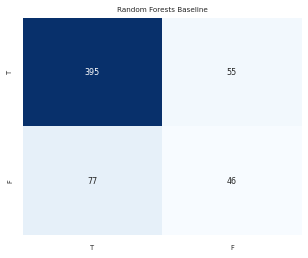

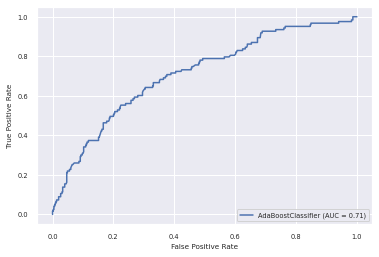

This is the starting index: 574 of patient 1
0.6845493562231759
[([0], 1, array([0.49652692, 0.50347308])), ([0], 1, array([0.49858698, 0.50141302])), ([0], 0, array([0.50905693, 0.49094307])), ([0], 0, array([0.50087918, 0.49912082])), ([0], 0, array([0.50060522, 0.49939478])), ([0], 0, array([0.50692093, 0.49307907])), ([1], 1, array([0.48375259, 0.51624741])), ([0], 1, array([0.49892628, 0.50107372])), ([0], 1, array([0.49984887, 0.50015113])), ([0], 0, array([0.50610206, 0.49389794])), ([0], 0, array([0.5057591, 0.4942409])), ([0], 1, array([0.49802382, 0.50197618])), ([1], 1, array([0.49892628, 0.50107372])), ([0], 1, array([0.49974304, 0.50025696])), ([0], 0, array([0.50168559, 0.49831441])), ([0], 0, array([0.50546003, 0.49453997])), ([0], 1, array([0.4974029, 0.5025971])), ([0], 0, array([0.50011577, 0.49988423])), ([1], 1, array([0.49969493, 0.50030507])), ([0], 0, array([0.50288005, 0.49711995])), ([1], 1, array([0.4954795, 0.5045205])), ([0], 0, array([0.50247574, 0.49752426

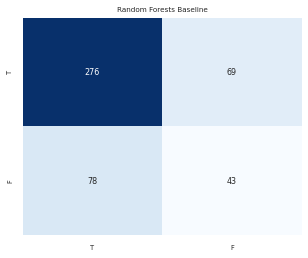

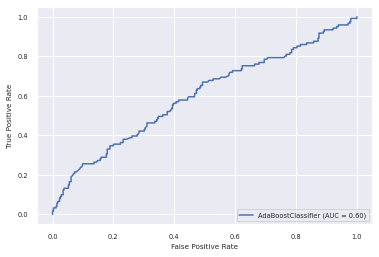

This is the starting index: 1041 of patient 2
0.2935153583617747
[([1], 1, array([0.49020803, 0.50979197])), ([0], 0, array([0.51273509, 0.48726491])), ([0], 0, array([0.50162474, 0.49837526])), ([1], 1, array([0.49072074, 0.50927926])), ([0], 1, array([0.49897, 0.50103])), ([0], 1, array([0.49350614, 0.50649386])), ([0], 0, array([0.50213841, 0.49786159])), ([1], 1, array([0.49040643, 0.50959357])), ([1], 1, array([0.49933938, 0.50066062])), ([1], 1, array([0.49116785, 0.50883215])), ([1], 1, array([0.49666207, 0.50333793])), ([1], 1, array([0.49367907, 0.50632093])), ([1], 0, array([0.50224172, 0.49775828])), ([0], 1, array([0.49454611, 0.50545389])), ([1], 1, array([0.49628012, 0.50371988])), ([1], 1, array([0.4926966, 0.5073034])), ([0], 1, array([0.49348327, 0.50651673])), ([0], 1, array([0.49875307, 0.50124693])), ([0], 1, array([0.4994503, 0.5005497])), ([0], 0, array([0.50964251, 0.49035749])), ([0], 1, array([0.48238567, 0.51761433])), ([0], 1, array([0.49776391, 0.50223609]))

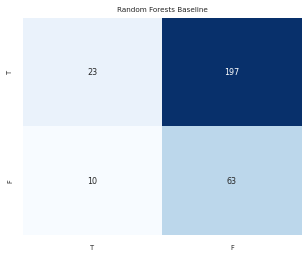

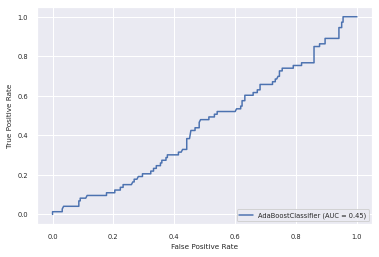

This is the starting index: 1335 of patient 3
0.6296296296296297
[([0], 1, array([0.49905832, 0.50094168])), ([1], 0, array([0.5030926, 0.4969074])), ([1], 1, array([0.49799129, 0.50200871])), ([1], 1, array([0.49815889, 0.50184111])), ([1], 1, array([0.49027531, 0.50972469])), ([1], 0, array([0.50123073, 0.49876927])), ([1], 1, array([0.49739364, 0.50260636])), ([0], 0, array([0.50115534, 0.49884466])), ([0], 0, array([0.50473385, 0.49526615])), ([0], 0, array([0.50837398, 0.49162602])), ([0], 1, array([0.49850949, 0.50149051])), ([0], 0, array([0.50472355, 0.49527645])), ([0], 1, array([0.49836704, 0.50163296])), ([1], 1, array([0.49833461, 0.50166539])), ([0], 0, array([0.52199547, 0.47800453])), ([0], 1, array([0.49953367, 0.50046633])), ([0], 1, array([0.493973, 0.506027])), ([0], 1, array([0.49418678, 0.50581322])), ([0], 1, array([0.49833461, 0.50166539])), ([0], 1, array([0.48894328, 0.51105672])), ([0], 1, array([0.49891128, 0.50108872])), ([0], 1, array([0.49579122, 0.5042087

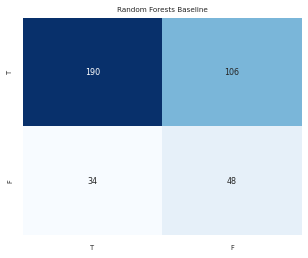

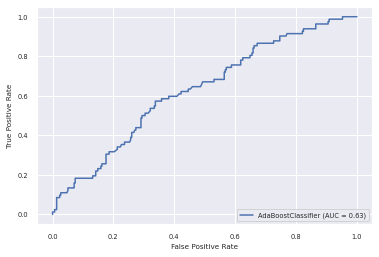

This is the starting index: 1714 of patient 4
0.6212624584717608
[([1], 1, array([0.49465804, 0.50534196])), ([1], 1, array([0.49355577, 0.50644423])), ([1], 0, array([0.50100287, 0.49899713])), ([1], 1, array([0.49791758, 0.50208242])), ([1], 1, array([0.49699733, 0.50300267])), ([1], 0, array([0.50012032, 0.49987968])), ([1], 0, array([0.50140371, 0.49859629])), ([1], 1, array([0.49548058, 0.50451942])), ([1], 0, array([0.50628222, 0.49371778])), ([1], 0, array([0.50106405, 0.49893595])), ([1], 1, array([0.49929367, 0.50070633])), ([1], 1, array([0.498547, 0.501453])), ([1], 1, array([0.4968586, 0.5031414])), ([1], 1, array([0.49830303, 0.50169697])), ([1], 1, array([0.49822735, 0.50177265])), ([1], 1, array([0.49788435, 0.50211565])), ([1], 1, array([0.49337644, 0.50662356])), ([1], 1, array([0.49699733, 0.50300267])), ([1], 1, array([0.49751336, 0.50248664])), ([1], 1, array([0.49310194, 0.50689806])), ([1], 1, array([0.49797089, 0.50202911])), ([1], 1, array([0.49544392, 0.5045560

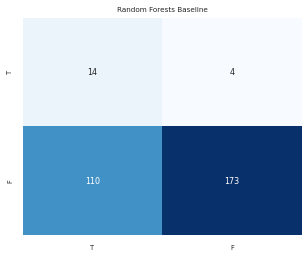

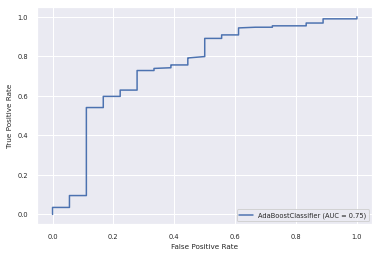

This is the starting index: 2016 of patient 5
0.44567627494456763
[([0], 0, array([0.50098097, 0.49901903])), ([0], 0, array([0.51138026, 0.48861974])), ([0], 0, array([0.50517666, 0.49482334])), ([0], 0, array([0.51310025, 0.48689975])), ([0], 0, array([0.50642435, 0.49357565])), ([0], 0, array([0.50954034, 0.49045966])), ([1], 0, array([0.50995528, 0.49004472])), ([1], 0, array([0.51450409, 0.48549591])), ([1], 0, array([0.50498759, 0.49501241])), ([1], 0, array([0.5091776, 0.4908224])), ([0], 0, array([0.50825075, 0.49174925])), ([1], 0, array([0.50803905, 0.49196095])), ([0], 0, array([0.5084244, 0.4915756])), ([1], 0, array([0.50041625, 0.49958375])), ([1], 0, array([0.5108838, 0.4891162])), ([1], 0, array([0.50669837, 0.49330163])), ([1], 1, array([0.49707718, 0.50292282])), ([1], 0, array([0.50860605, 0.49139395])), ([1], 0, array([0.50663522, 0.49336478])), ([1], 0, array([0.50837855, 0.49162145])), ([1], 1, array([0.49191853, 0.50808147])), ([1], 0, array([0.5052252, 0.4947748

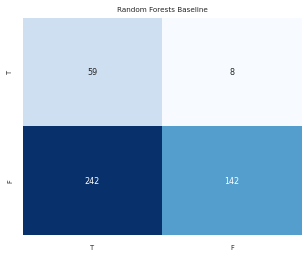

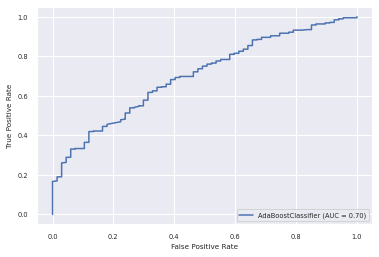

This is the starting index: 2468 of patient 6
0.5695538057742782
[([1], 1, array([0.49964788, 0.50035212])), ([1], 1, array([0.49651851, 0.50348149])), ([1], 1, array([0.49284663, 0.50715337])), ([1], 0, array([0.50400361, 0.49599639])), ([1], 0, array([0.50407067, 0.49592933])), ([1], 1, array([0.49854942, 0.50145058])), ([1], 1, array([0.4945147, 0.5054853])), ([1], 0, array([0.51221183, 0.48778817])), ([1], 1, array([0.49887365, 0.50112635])), ([1], 0, array([0.50627798, 0.49372202])), ([0], 0, array([0.51379998, 0.48620002])), ([1], 1, array([0.32643878, 0.67356122])), ([1], 0, array([0.50583929, 0.49416071])), ([1], 1, array([0.49522145, 0.50477855])), ([1], 1, array([0.49102146, 0.50897854])), ([1], 1, array([0.49412598, 0.50587402])), ([1], 1, array([0.32610697, 0.67389303])), ([1], 1, array([0.4944469, 0.5055531])), ([1], 1, array([0.49210988, 0.50789012])), ([0], 0, array([0.50343691, 0.49656309])), ([1], 0, array([0.50289375, 0.49710625])), ([1], 0, array([0.50370896, 0.49629

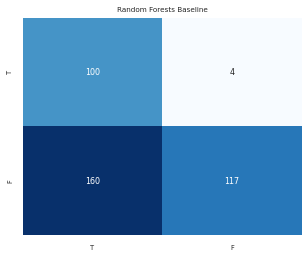

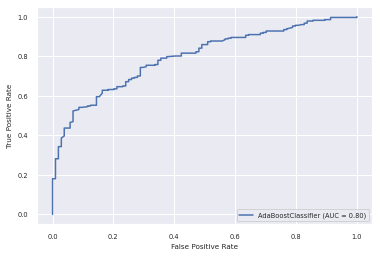

This is the starting index: 2850 of patient 7
0.822680412371134
[([0], 0, array([0.5028203, 0.4971797])), ([0], 0, array([0.5057504, 0.4942496])), ([0], 0, array([0.50583668, 0.49416332])), ([0], 0, array([0.50042268, 0.49957732])), ([0], 0, array([0.502982, 0.497018])), ([0], 0, array([0.5031327, 0.4968673])), ([0], 0, array([0.5040196, 0.4959804])), ([0], 0, array([0.50616397, 0.49383603])), ([0], 0, array([0.50323155, 0.49676845])), ([0], 0, array([0.50574776, 0.49425224])), ([0], 0, array([0.50488592, 0.49511408])), ([0], 0, array([0.50729653, 0.49270347])), ([0], 1, array([0.49450854, 0.50549146])), ([0], 1, array([0.49705723, 0.50294277])), ([0], 0, array([0.50387153, 0.49612847])), ([0], 0, array([0.50818191, 0.49181809])), ([0], 0, array([0.50560174, 0.49439826])), ([0], 0, array([0.50250977, 0.49749023])), ([0], 0, array([0.50700655, 0.49299345])), ([0], 0, array([0.50512105, 0.49487895])), ([0], 0, array([0.50440332, 0.49559668])), ([0], 0, array([0.51121181, 0.48878819])), (

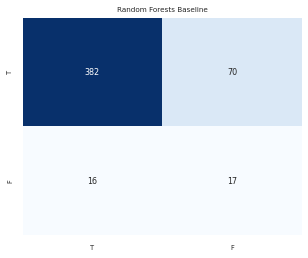

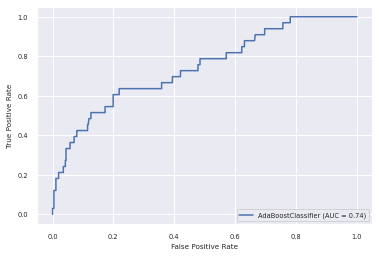

This is the starting index: 3336 of patient 8
0.6851211072664359
[([1], 0, array([0.50585203, 0.49414797])), ([1], 1, array([0.49473586, 0.50526414])), ([0], 0, array([0.50637351, 0.49362649])), ([1], 0, array([0.50389026, 0.49610974])), ([1], 1, array([0.49402913, 0.50597087])), ([1], 1, array([0.4950948, 0.5049052])), ([1], 1, array([0.49670292, 0.50329708])), ([1], 1, array([0.49223022, 0.50776978])), ([1], 1, array([0.49505722, 0.50494278])), ([1], 1, array([0.4950948, 0.5049052])), ([0], 1, array([0.49911967, 0.50088033])), ([1], 1, array([0.49751366, 0.50248634])), ([0], 0, array([0.5039397, 0.4960603])), ([1], 1, array([0.49410962, 0.50589038])), ([1], 1, array([0.49829712, 0.50170288])), ([0], 0, array([0.51242574, 0.48757426])), ([0], 0, array([0.5020322, 0.4979678])), ([1], 0, array([0.50287421, 0.49712579])), ([1], 1, array([0.48977496, 0.51022504])), ([1], 1, array([0.49819535, 0.50180465])), ([1], 1, array([0.49359773, 0.50640227])), ([0], 1, array([0.49460527, 0.50539473]

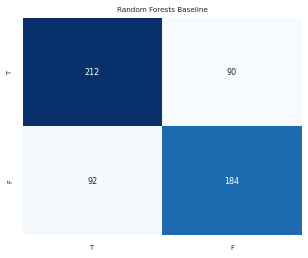

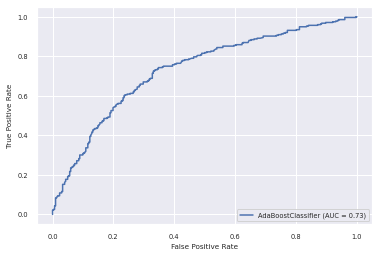

This is the starting index: 3915 of patient 9
0.6464285714285715
[([1], 1, array([0.49433383, 0.50566617])), ([1], 1, array([0.49500671, 0.50499329])), ([1], 1, array([0.49652296, 0.50347704])), ([1], 1, array([0.49652296, 0.50347704])), ([1], 1, array([0.49547885, 0.50452115])), ([1], 1, array([0.49152166, 0.50847834])), ([1], 0, array([0.5006253, 0.4993747])), ([1], 1, array([0.49905677, 0.50094323])), ([1], 1, array([0.49392316, 0.50607684])), ([1], 1, array([0.4975037, 0.5024963])), ([1], 1, array([0.49419299, 0.50580701])), ([1], 0, array([0.50086723, 0.49913277])), ([1], 1, array([0.49633471, 0.50366529])), ([1], 0, array([0.50716643, 0.49283357])), ([1], 1, array([0.49895384, 0.50104616])), ([1], 1, array([0.49874056, 0.50125944])), ([1], 1, array([0.49882899, 0.50117101])), ([1], 1, array([0.4975037, 0.5024963])), ([1], 0, array([0.50074035, 0.49925965])), ([1], 1, array([0.49652268, 0.50347732])), ([1], 0, array([0.50238403, 0.49761597])), ([1], 1, array([0.4996787, 0.5003213]

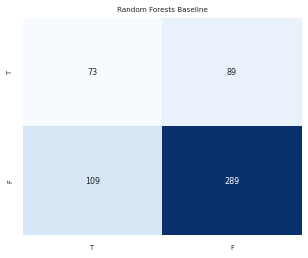

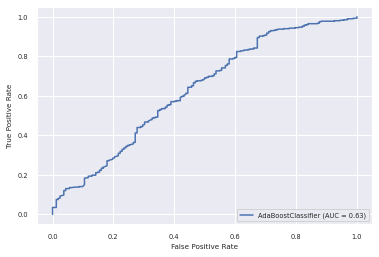

This is the starting index: 4476 of patient 10
0.8200371057513914
[([0], 0, array([0.50351858, 0.49648142])), ([0], 1, array([0.49908319, 0.50091681])), ([0], 0, array([0.50863887, 0.49136113])), ([0], 0, array([0.50473385, 0.49526615])), ([0], 0, array([0.50063487, 0.49936513])), ([0], 0, array([0.50863887, 0.49136113])), ([1], 1, array([0.49266366, 0.50733634])), ([1], 0, array([0.50894206, 0.49105794])), ([0], 0, array([0.50873145, 0.49126855])), ([0], 0, array([0.5061294, 0.4938706])), ([1], 1, array([0.49404467, 0.50595533])), ([1], 1, array([0.49901757, 0.50098243])), ([1], 0, array([0.50908882, 0.49091118])), ([0], 0, array([0.5248572, 0.4751428])), ([0], 0, array([0.50107828, 0.49892172])), ([0], 0, array([0.50396496, 0.49603504])), ([0], 0, array([0.50430715, 0.49569285])), ([0], 0, array([0.5090891, 0.4909109])), ([1], 1, array([0.49751986, 0.50248014])), ([0], 1, array([0.49954059, 0.50045941])), ([1], 0, array([0.50629096, 0.49370904])), ([0], 0, array([0.5147384, 0.4852616

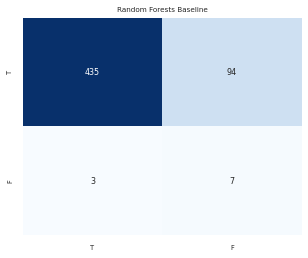

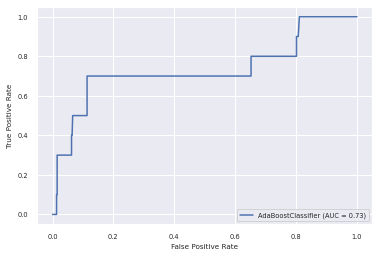

This is the starting index: 5016 of patient 11
0.7207792207792207
[([0], 0, array([0.50429334, 0.49570666])), ([0], 0, array([0.51114435, 0.48885565])), ([0], 0, array([0.51944553, 0.48055447])), ([0], 0, array([0.509212, 0.490788])), ([0], 0, array([0.5033907, 0.4966093])), ([0], 0, array([0.50826827, 0.49173173])), ([0], 0, array([0.50240864, 0.49759136])), ([0], 0, array([0.50381778, 0.49618222])), ([0], 0, array([0.50629802, 0.49370198])), ([0], 0, array([0.50565498, 0.49434502])), ([0], 0, array([0.50485969, 0.49514031])), ([0], 0, array([0.50726162, 0.49273838])), ([0], 0, array([0.50491323, 0.49508677])), ([1], 1, array([0.49860028, 0.50139972])), ([0], 0, array([0.50358499, 0.49641501])), ([1], 0, array([0.50121834, 0.49878166])), ([0], 1, array([0.49769917, 0.50230083])), ([0], 0, array([0.50890708, 0.49109292])), ([0], 0, array([0.51106455, 0.48893545])), ([1], 0, array([0.51207957, 0.48792043])), ([0], 0, array([0.50775462, 0.49224538])), ([0], 0, array([0.52222087, 0.477779

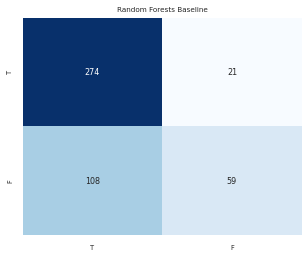

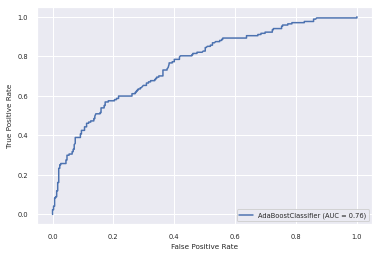

This is the starting index: 5479 of patient 12
0.32941176470588235
[([0], 1, array([0.49325492, 0.50674508])), ([0], 1, array([0.49620646, 0.50379354])), ([0], 1, array([0.49476547, 0.50523453])), ([0], 1, array([0.49435289, 0.50564711])), ([0], 0, array([0.50755431, 0.49244569])), ([0], 1, array([0.49478588, 0.50521412])), ([0], 1, array([0.49629546, 0.50370454])), ([0], 1, array([0.49222641, 0.50777359])), ([0], 1, array([0.49467541, 0.50532459])), ([0], 1, array([0.49325492, 0.50674508])), ([0], 1, array([0.49325492, 0.50674508])), ([0], 1, array([0.49469666, 0.50530334])), ([0], 1, array([0.49224601, 0.50775399])), ([0], 1, array([0.49919243, 0.50080757])), ([0], 1, array([0.4921568, 0.5078432])), ([0], 1, array([0.49334392, 0.50665608])), ([0], 1, array([0.49588392, 0.50411608])), ([0], 0, array([0.50026438, 0.49973562])), ([0], 1, array([0.49478588, 0.50521412])), ([0], 1, array([0.4922843, 0.5077157])), ([0], 0, array([0.50072361, 0.49927639])), ([0], 1, array([0.49377689, 0.506

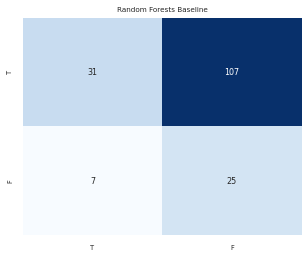

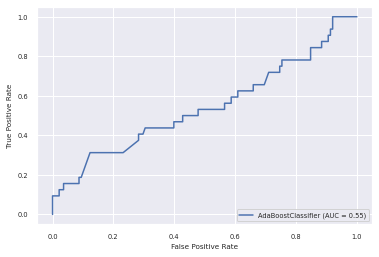

<function matplotlib.pyplot.show>

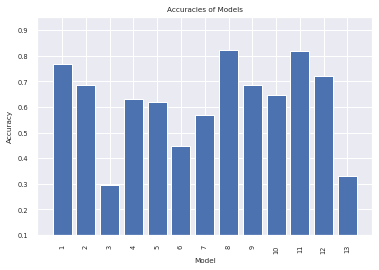

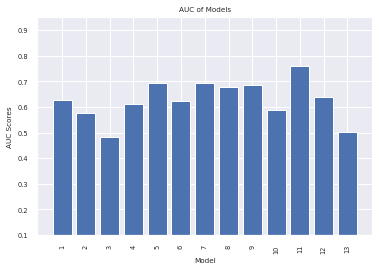

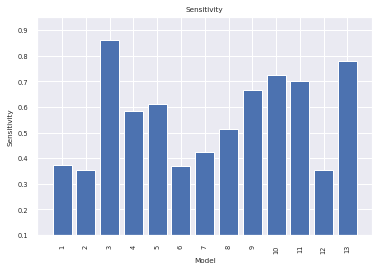

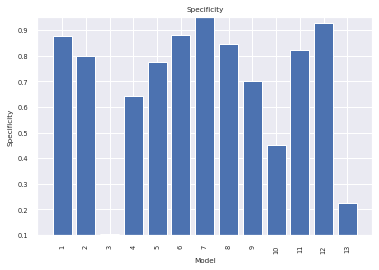

In [32]:
Accuracy = []
auc = []
sensitivity = []
specificity = []
clf = AdaBoostClassifier()
sel = VarianceThreshold(threshold=(.1 * (1 - .8)))
for i in range(0,13):
    test, train, test_class, train_class = leave_one_out(df,i)
    sel.fit_transform(train)
    sel.fit_transform(test)
    clf.fit(train, train_class.ravel())

    y_predicted = clf.predict(test)
    print(metrics.accuracy_score(test_class,y_predicted))
        # print("Random Forest:\n",metrics.classification_report(test_class,y_predicted)) # Classification report
    Accuracy.append(metrics.accuracy_score(test_class,y_predicted))
    auc.append(metrics.roc_auc_score(test_class,y_predicted))
    mcm = confusion_matrix(test_class,y_predicted)
    tn = mcm[0, 0]
    tp = mcm[1, 1]
    fn = mcm[1, 0]
    fp = mcm[0, 1]
    sensitivity.append(tp / (tp + fn))
    specificity.append(tn / (tn + fp))
    pred = clf.predict_proba(test)
    result = [*zip(test_class.tolist(), y_predicted, pred)]
    print(result)
    report = metrics.classification_report(test_class.tolist(), y_predicted)
    matrix = metrics.confusion_matrix(test_class.tolist(),y_predicted)   

    fig, (ax1) = plt.subplots(1, figsize=(5, 4))


    df_cm1 = pd.DataFrame(matrix, range(2), range(2))
    sn.set(font_scale=0.6) # for label size
    sn.heatmap(df_cm1, annot=True,annot_kws={"size": 8}, fmt='g', cmap='Blues', cbar= False, xticklabels=x_axis_labels, yticklabels=y_axis_labels, ax = ax1) # font size


    ax1.set_title('Random Forests Baseline')

    plt.show()
    metrics.plot_roc_curve(clf, test, test_class.tolist())  # doctest: +SKIP
    plt.show()

Model=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13']

Index = [1,2,3,4,5,6,7,8,9,10,11,12,13]
fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,Accuracy)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Accuracy')
plt.xlabel('Model')
plt.title('Accuracies of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,auc)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('AUC Scores')
plt.xlabel('Model')
plt.title('AUC of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,sensitivity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Sensitivity')
plt.xlabel('Model')
plt.title('Sensitivity')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,specificity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Specificity')
plt.xlabel('Model')
plt.title('Specificity')
plt.show

#### Univariate Feature Selection

This gives a weird error. The test dataset should not have any negative values because it is normalized but I have also tried to check the dataset for negative values and there seem to be none.

In [33]:
Accuracy = []
auc = []
specificity = []
sensitivity = [] 
clf = AdaBoostClassifier()

for i in range(0,13):
    test, train, test_class, train_class = leave_one_out(df,i)
    # lsvc = LinearSVC(C=0.01, penalty="l1", dual=False).fit(train, train_class.ravel())
    # model = SelectFromModel(lsvc, prefit=True)
    
    train = SelectKBest(chi2, k=20).fit_transform(train, train_class)
    test = SelectKBest(chi2, k=20).fit_transform(test, test_class)
    clf.fit(train, train_class.ravel())

    y_predicted = clf.predict(test)
    print(metrics.accuracy_score(test_class,y_predicted))
        # print("Random Forest:\n",metrics.classification_report(test_class,y_predicted)) # Classification report
    Accuracy.append(metrics.accuracy_score(test_class,y_predicted))
    auc.append(metrics.roc_auc_score(test_class,y_predicted))
    mcm = confusion_matrix(test_class,y_predicted)
    tn = mcm[0, 0]
    tp = mcm[1, 1]
    fn = mcm[1, 0]
    fp = mcm[0, 1]
    sensitivity.append(tp / (tp + fn))
    specificity.append(tn / (tn + fp))
    pred = clf.predict_proba(test)
    result = [*zip(test_class.tolist(), y_predicted, pred)]
    print(result)
    report = metrics.classification_report(test_class.tolist(), y_predicted)
    matrix = metrics.confusion_matrix(test_class.tolist(),y_predicted)   

    fig, (ax1) = plt.subplots(1, figsize=(5, 4))


    df_cm1 = pd.DataFrame(matrix, range(2), range(2))
    sn.set(font_scale=0.6) # for label size
    sn.heatmap(df_cm1, annot=True,annot_kws={"size": 8}, fmt='g', cmap='Blues', cbar= False, xticklabels=x_axis_labels, yticklabels=y_axis_labels, ax = ax1) # font size


    ax1.set_title('Random Forests Baseline')

    plt.show()
    metrics.plot_roc_curve(clf, test, test_class.tolist())  # doctest: +SKIP
    plt.show()

Model=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13']

Index = [1,2,3,4,5,6,7,8,9,10,11,12,13]
fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,Accuracy)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Accuracy')
plt.xlabel('Model')
plt.title('Accuracies of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,auc)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('AUC Scores')
plt.xlabel('Model')
plt.title('AUC of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,sensitivity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Sensitivity')
plt.xlabel('Model')
plt.title('Sensitivity')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,specificity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Specificity')
plt.xlabel('Model')
plt.title('Specificity')
plt.show

This is the starting index: 0 of patient 0


ValueError: ignored

#### L1-based feature selection

This is the starting index: 0 of patient 0
0.7591623036649214
[([1], 1, array([0.4976256, 0.5023744])), ([1], 1, array([0.49698298, 0.50301702])), ([0], 1, array([0.49839091, 0.50160909])), ([1], 0, array([0.50203091, 0.49796909])), ([1], 1, array([0.49858317, 0.50141683])), ([0], 0, array([0.51774186, 0.48225814])), ([1], 0, array([0.50870928, 0.49129072])), ([0], 0, array([0.50363106, 0.49636894])), ([1], 1, array([0.49862277, 0.50137723])), ([0], 0, array([0.50342192, 0.49657808])), ([0], 0, array([0.50330712, 0.49669288])), ([1], 1, array([0.49472235, 0.50527765])), ([1], 1, array([0.49658602, 0.50341398])), ([0], 0, array([0.50017263, 0.49982737])), ([1], 1, array([0.49839091, 0.50160909])), ([1], 1, array([0.49750522, 0.50249478])), ([1], 1, array([0.49678832, 0.50321168])), ([1], 0, array([0.50720838, 0.49279162])), ([1], 0, array([0.50097971, 0.49902029])), ([1], 1, array([0.49899046, 0.50100954])), ([0], 0, array([0.50488556, 0.49511444])), ([1], 0, array([0.50627927, 0.493720

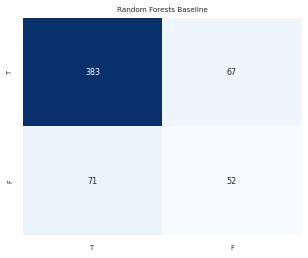

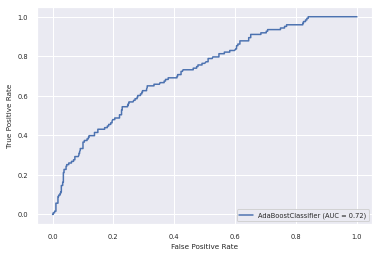

This is the starting index: 574 of patient 1
0.6802575107296137
[([0], 1, array([0.4940253, 0.5059747])), ([0], 1, array([0.49565635, 0.50434365])), ([0], 0, array([0.50253992, 0.49746008])), ([0], 1, array([0.49787187, 0.50212813])), ([0], 1, array([0.49961616, 0.50038384])), ([0], 1, array([0.49908974, 0.50091026])), ([1], 1, array([0.49395266, 0.50604734])), ([0], 0, array([0.50098193, 0.49901807])), ([0], 0, array([0.50421985, 0.49578015])), ([0], 0, array([0.5075124, 0.4924876])), ([0], 0, array([0.50135204, 0.49864796])), ([0], 1, array([0.49937362, 0.50062638])), ([1], 0, array([0.50018175, 0.49981825])), ([0], 1, array([0.49877698, 0.50122302])), ([0], 1, array([0.49898687, 0.50101313])), ([0], 1, array([0.49851493, 0.50148507])), ([0], 1, array([0.49698431, 0.50301569])), ([0], 1, array([0.49907315, 0.50092685])), ([1], 1, array([0.49946729, 0.50053271])), ([0], 0, array([0.508077, 0.491923])), ([1], 1, array([0.49723446, 0.50276554])), ([0], 0, array([0.50286591, 0.49713409])

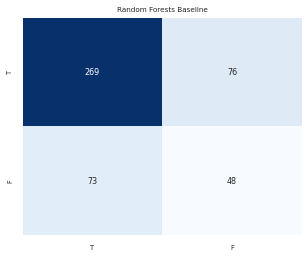

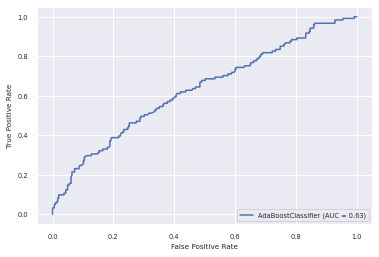

This is the starting index: 1041 of patient 2
0.32764505119453924
[([1], 1, array([0.49235889, 0.50764111])), ([0], 0, array([0.50727145, 0.49272855])), ([0], 0, array([0.50654934, 0.49345066])), ([1], 1, array([0.4885087, 0.5114913])), ([0], 0, array([0.50419164, 0.49580836])), ([0], 1, array([0.49263486, 0.50736514])), ([0], 0, array([0.5063983, 0.4936017])), ([1], 1, array([0.48734557, 0.51265443])), ([1], 1, array([0.49868457, 0.50131543])), ([1], 1, array([0.49293856, 0.50706144])), ([1], 1, array([0.49944365, 0.50055635])), ([1], 1, array([0.49763095, 0.50236905])), ([1], 1, array([0.49624097, 0.50375903])), ([0], 1, array([0.49829998, 0.50170002])), ([1], 1, array([0.49536962, 0.50463038])), ([1], 1, array([0.49426958, 0.50573042])), ([0], 1, array([0.49515344, 0.50484656])), ([0], 1, array([0.49245055, 0.50754945])), ([0], 0, array([0.50487076, 0.49512924])), ([0], 0, array([0.50914927, 0.49085073])), ([0], 1, array([0.4885087, 0.5114913])), ([0], 1, array([0.49622427, 0.503775

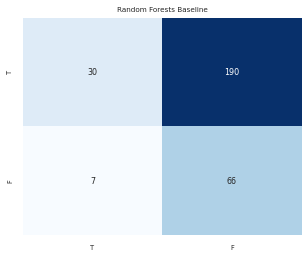

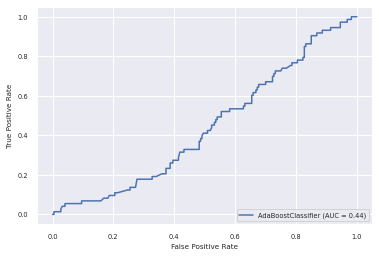

This is the starting index: 1335 of patient 3
0.5132275132275133
[([0], 1, array([0.49317971, 0.50682029])), ([1], 1, array([0.49555825, 0.50444175])), ([1], 1, array([0.49424006, 0.50575994])), ([1], 1, array([0.49736544, 0.50263456])), ([1], 1, array([0.49497729, 0.50502271])), ([1], 0, array([0.50032873, 0.49967127])), ([1], 1, array([0.4958977, 0.5041023])), ([0], 1, array([0.49742399, 0.50257601])), ([0], 1, array([0.49882608, 0.50117392])), ([0], 1, array([0.3243385, 0.6756615])), ([0], 1, array([0.49440073, 0.50559927])), ([0], 1, array([0.49670593, 0.50329407])), ([0], 0, array([0.50300366, 0.49699634])), ([1], 0, array([0.50352631, 0.49647369])), ([0], 0, array([0.50883136, 0.49116864])), ([0], 1, array([0.49747098, 0.50252902])), ([0], 1, array([0.49595746, 0.50404254])), ([0], 1, array([0.49708749, 0.50291251])), ([0], 1, array([0.49781803, 0.50218197])), ([0], 1, array([0.32699843, 0.67300157])), ([0], 1, array([0.49597946, 0.50402054])), ([0], 1, array([0.49444249, 0.50555

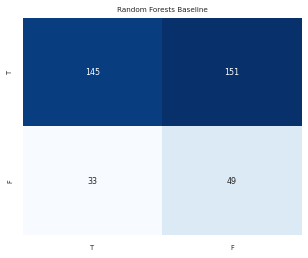

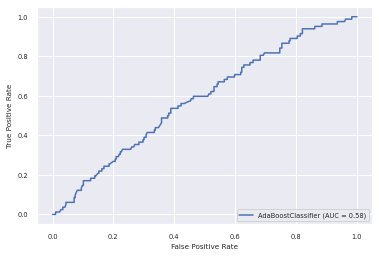

This is the starting index: 1714 of patient 4


/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


0.42524916943521596
[([1], 1, array([0.4986349, 0.5013651])), ([1], 1, array([0.49475771, 0.50524229])), ([1], 1, array([0.49995884, 0.50004116])), ([1], 1, array([0.49683641, 0.50316359])), ([1], 0, array([0.50045384, 0.49954616])), ([1], 0, array([0.50307421, 0.49692579])), ([1], 0, array([0.50140326, 0.49859674])), ([1], 1, array([0.49852721, 0.50147279])), ([1], 0, array([0.5049031, 0.4950969])), ([1], 1, array([0.49770837, 0.50229163])), ([1], 1, array([0.49765524, 0.50234476])), ([1], 0, array([0.5019539, 0.4980461])), ([1], 1, array([0.49765524, 0.50234476])), ([1], 1, array([0.49773604, 0.50226396])), ([1], 1, array([0.49745262, 0.50254738])), ([1], 0, array([0.50045384, 0.49954616])), ([1], 1, array([0.4948464, 0.5051536])), ([1], 0, array([0.50132582, 0.49867418])), ([1], 1, array([0.49748891, 0.50251109])), ([1], 0, array([0.5003659, 0.4996341])), ([1], 1, array([0.49896465, 0.50103535])), ([1], 1, array([0.49465073, 0.50534927])), ([1], 0, array([0.5013461, 0.4986539])), ([

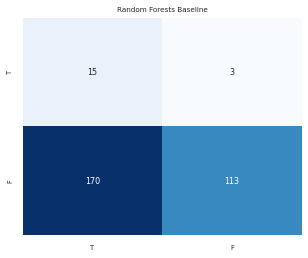

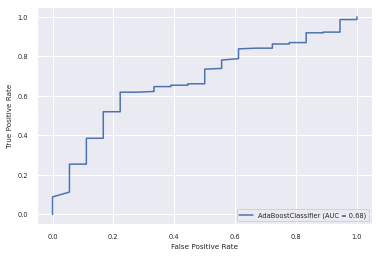

This is the starting index: 2016 of patient 5
0.49445676274944567
[([0], 0, array([0.50195152, 0.49804848])), ([0], 0, array([0.5035127, 0.4964873])), ([0], 0, array([0.51052122, 0.48947878])), ([0], 0, array([0.51020325, 0.48979675])), ([0], 0, array([0.50154754, 0.49845246])), ([0], 0, array([0.50983368, 0.49016632])), ([1], 0, array([0.50797368, 0.49202632])), ([1], 0, array([0.50764584, 0.49235416])), ([1], 0, array([0.50368176, 0.49631824])), ([1], 0, array([0.50255431, 0.49744569])), ([0], 0, array([0.50271837, 0.49728163])), ([1], 0, array([0.50484723, 0.49515277])), ([0], 1, array([0.49618793, 0.50381207])), ([1], 0, array([0.50289314, 0.49710686])), ([1], 0, array([0.50466616, 0.49533384])), ([1], 0, array([0.50341147, 0.49658853])), ([1], 0, array([0.5061549, 0.4938451])), ([1], 0, array([0.50458295, 0.49541705])), ([1], 0, array([0.50366806, 0.49633194])), ([1], 0, array([0.51173208, 0.48826792])), ([1], 1, array([0.49265711, 0.50734289])), ([1], 0, array([0.50237983, 0.4976

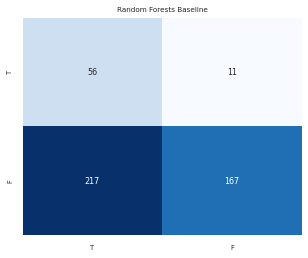

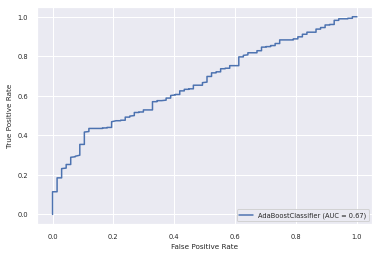

This is the starting index: 2468 of patient 6
0.5538057742782152
[([1], 1, array([0.49719781, 0.50280219])), ([1], 1, array([0.49654639, 0.50345361])), ([1], 1, array([0.49459346, 0.50540654])), ([1], 0, array([0.5062816, 0.4937184])), ([1], 0, array([0.50172158, 0.49827842])), ([1], 1, array([0.49344761, 0.50655239])), ([1], 1, array([0.49316378, 0.50683622])), ([1], 0, array([0.51500639, 0.48499361])), ([1], 0, array([0.5003508, 0.4996492])), ([1], 0, array([0.50488222, 0.49511778])), ([0], 0, array([0.5115697, 0.4884303])), ([1], 1, array([0.49844302, 0.50155698])), ([1], 0, array([0.50496112, 0.49503888])), ([1], 1, array([0.49776281, 0.50223719])), ([1], 0, array([0.50490069, 0.49509931])), ([1], 1, array([0.49474422, 0.50525578])), ([1], 1, array([0.49164673, 0.50835327])), ([1], 1, array([0.49718086, 0.50281914])), ([1], 1, array([0.49409536, 0.50590464])), ([0], 0, array([0.50824466, 0.49175534])), ([1], 1, array([0.49972031, 0.50027969])), ([1], 1, array([0.49599978, 0.5040002

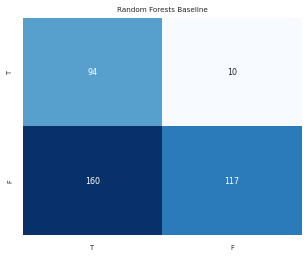

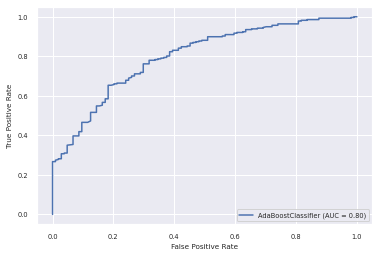

This is the starting index: 2850 of patient 7
0.7381443298969073
[([0], 1, array([0.49991401, 0.50008599])), ([0], 1, array([0.49956994, 0.50043006])), ([0], 0, array([0.5021041, 0.4978959])), ([0], 1, array([0.49865132, 0.50134868])), ([0], 1, array([0.49928662, 0.50071338])), ([0], 0, array([0.50042823, 0.49957177])), ([0], 1, array([0.49817893, 0.50182107])), ([0], 0, array([0.51102501, 0.48897499])), ([0], 0, array([0.50172908, 0.49827092])), ([0], 0, array([0.50571298, 0.49428702])), ([0], 0, array([0.50471542, 0.49528458])), ([0], 0, array([0.50232133, 0.49767867])), ([0], 1, array([0.49255583, 0.50744417])), ([0], 1, array([0.49966914, 0.50033086])), ([0], 0, array([0.50081552, 0.49918448])), ([0], 0, array([0.5060173, 0.4939827])), ([0], 0, array([0.5030785, 0.4969215])), ([0], 0, array([0.50223216, 0.49776784])), ([0], 0, array([0.50501805, 0.49498195])), ([0], 0, array([0.50381469, 0.49618531])), ([0], 0, array([0.50043778, 0.49956222])), ([0], 0, array([0.50738651, 0.4926134

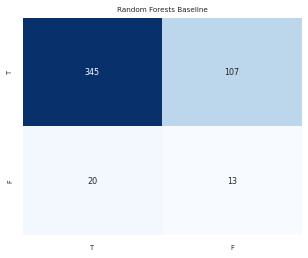

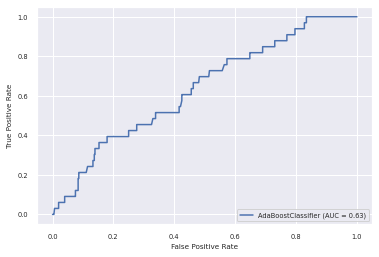

This is the starting index: 3336 of patient 8
0.6626297577854672
[([1], 0, array([0.50208211, 0.49791789])), ([1], 1, array([0.49823595, 0.50176405])), ([0], 0, array([0.50845918, 0.49154082])), ([1], 0, array([0.50646882, 0.49353118])), ([1], 1, array([0.49591491, 0.50408509])), ([1], 1, array([0.49538462, 0.50461538])), ([1], 1, array([0.49892268, 0.50107732])), ([1], 1, array([0.49304411, 0.50695589])), ([1], 1, array([0.49726046, 0.50273954])), ([1], 1, array([0.49893984, 0.50106016])), ([0], 0, array([0.50058594, 0.49941406])), ([1], 1, array([0.49825524, 0.50174476])), ([0], 0, array([0.50602539, 0.49397461])), ([1], 1, array([0.49973128, 0.50026872])), ([1], 1, array([0.49587073, 0.50412927])), ([0], 0, array([0.51994634, 0.48005366])), ([0], 0, array([0.50722503, 0.49277497])), ([1], 0, array([0.50606961, 0.49393039])), ([1], 1, array([0.49321016, 0.50678984])), ([1], 0, array([0.5050013, 0.4949987])), ([1], 1, array([0.49504167, 0.50495833])), ([0], 0, array([0.50447646, 0.495

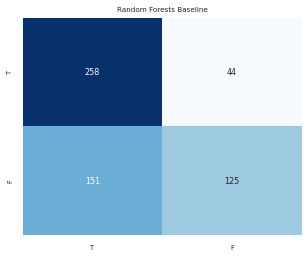

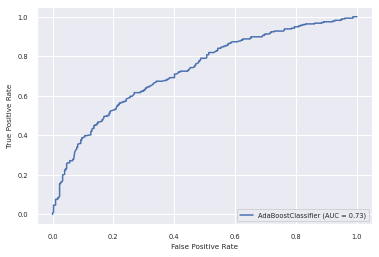

This is the starting index: 3915 of patient 9
0.45714285714285713
[([1], 1, array([0.49834729, 0.50165271])), ([1], 1, array([0.42943662, 0.57056338])), ([1], 0, array([0.50077405, 0.49922595])), ([1], 1, array([0.49834729, 0.50165271])), ([1], 0, array([0.50102906, 0.49897094])), ([1], 1, array([0.49915384, 0.50084616])), ([1], 0, array([0.50091458, 0.49908542])), ([1], 1, array([0.49968437, 0.50031563])), ([1], 1, array([0.49963994, 0.50036006])), ([1], 0, array([0.50732675, 0.49267325])), ([1], 1, array([0.49871417, 0.50128583])), ([1], 0, array([0.5001881, 0.4998119])), ([1], 0, array([0.50099989, 0.49900011])), ([1], 0, array([0.50219652, 0.49780348])), ([1], 0, array([0.50061873, 0.49938127])), ([1], 1, array([0.49966465, 0.50033535])), ([1], 1, array([0.49834729, 0.50165271])), ([1], 0, array([0.50159728, 0.49840272])), ([1], 0, array([0.500633, 0.499367])), ([1], 0, array([0.50422097, 0.49577903])), ([1], 0, array([0.50087876, 0.49912124])), ([1], 1, array([0.49834729, 0.501652

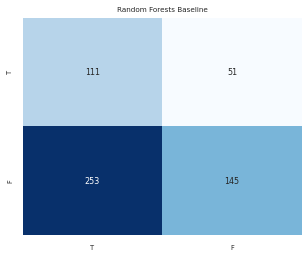

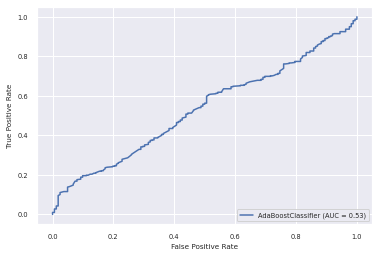

This is the starting index: 4476 of patient 10
0.8051948051948052
[([0], 0, array([0.50458235, 0.49541765])), ([0], 0, array([0.50402575, 0.49597425])), ([0], 0, array([0.50458235, 0.49541765])), ([0], 0, array([0.50555828, 0.49444172])), ([0], 0, array([0.50342468, 0.49657532])), ([0], 0, array([0.50372908, 0.49627092])), ([1], 1, array([0.49793062, 0.50206938])), ([1], 0, array([0.50369389, 0.49630611])), ([0], 0, array([0.50625938, 0.49374062])), ([0], 0, array([0.50251821, 0.49748179])), ([1], 1, array([0.49847648, 0.50152352])), ([1], 1, array([0.49878275, 0.50121725])), ([1], 0, array([0.50211142, 0.49788858])), ([0], 0, array([0.51142858, 0.48857142])), ([0], 0, array([0.5062998, 0.4937002])), ([0], 0, array([0.50661025, 0.49338975])), ([0], 0, array([0.50435799, 0.49564201])), ([0], 0, array([0.50783294, 0.49216706])), ([1], 1, array([0.49573232, 0.50426768])), ([0], 0, array([0.50192121, 0.49807879])), ([1], 0, array([0.50273612, 0.49726388])), ([0], 0, array([0.51280317, 0.48

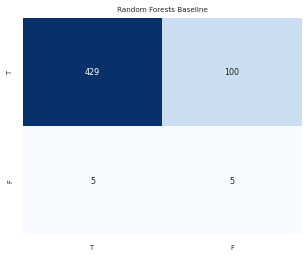

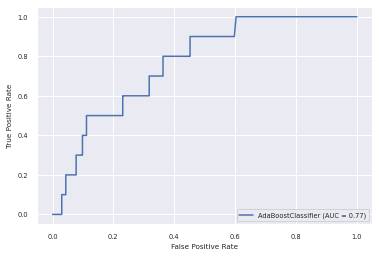

This is the starting index: 5016 of patient 11
0.7229437229437229
[([0], 0, array([0.50005731, 0.49994269])), ([0], 0, array([0.50463973, 0.49536027])), ([0], 0, array([0.51552646, 0.48447354])), ([0], 0, array([0.50707404, 0.49292596])), ([0], 1, array([0.49980938, 0.50019062])), ([0], 0, array([0.50276916, 0.49723084])), ([0], 1, array([0.49887686, 0.50112314])), ([0], 0, array([0.50759825, 0.49240175])), ([0], 0, array([0.50512835, 0.49487165])), ([0], 0, array([0.50657109, 0.49342891])), ([0], 0, array([0.50233827, 0.49766173])), ([0], 0, array([0.50358642, 0.49641358])), ([0], 0, array([0.51542209, 0.48457791])), ([1], 0, array([0.50322883, 0.49677117])), ([0], 0, array([0.50137312, 0.49862688])), ([1], 0, array([0.50579437, 0.49420563])), ([0], 0, array([0.50040799, 0.49959201])), ([0], 0, array([0.50668158, 0.49331842])), ([0], 0, array([0.50555677, 0.49444323])), ([1], 0, array([0.50993284, 0.49006716])), ([0], 0, array([0.50763384, 0.49236616])), ([0], 0, array([0.51656744, 0.

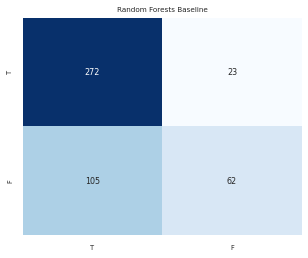

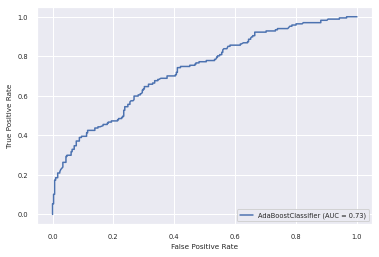

This is the starting index: 5479 of patient 12
0.32941176470588235
[([0], 1, array([0.49546664, 0.50453336])), ([0], 1, array([0.49324027, 0.50675973])), ([0], 1, array([0.49275892, 0.50724108])), ([0], 1, array([0.49385523, 0.50614477])), ([0], 0, array([0.50340193, 0.49659807])), ([0], 1, array([0.49337885, 0.50662115])), ([0], 1, array([0.4937324, 0.5062676])), ([0], 1, array([0.49239724, 0.50760276])), ([0], 1, array([0.49483302, 0.50516698])), ([0], 1, array([0.49546664, 0.50453336])), ([0], 1, array([0.49409875, 0.50590125])), ([0], 1, array([0.49409875, 0.50590125])), ([0], 1, array([0.49387384, 0.50612616])), ([0], 1, array([0.49863239, 0.50136761])), ([0], 1, array([0.49628586, 0.50371414])), ([0], 1, array([0.49285959, 0.50714041])), ([0], 1, array([0.49668612, 0.50331388])), ([0], 0, array([0.50006584, 0.49993416])), ([0], 1, array([0.49671278, 0.50328722])), ([0], 1, array([0.49293204, 0.50706796])), ([0], 0, array([0.50066968, 0.49933032])), ([0], 1, array([0.49471253, 0.5

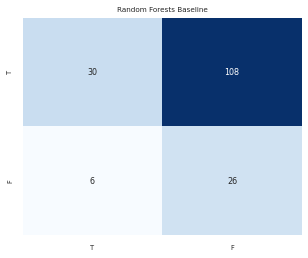

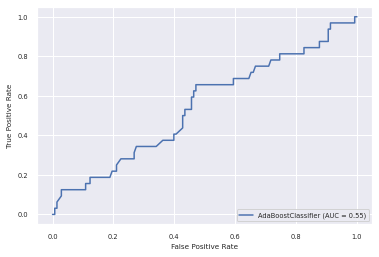

<function matplotlib.pyplot.show>

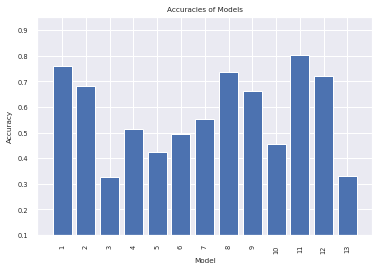

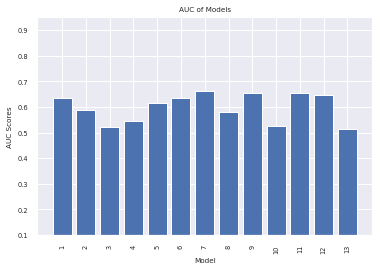

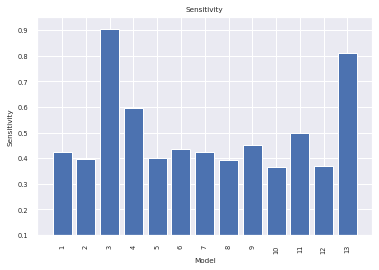

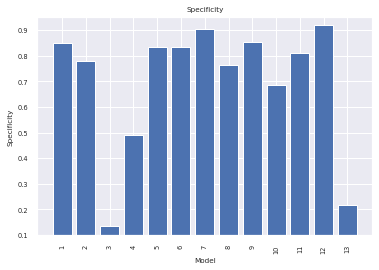

In [34]:
Accuracy = []
auc = []
sensitivity = []
specificity = []
clf = AdaBoostClassifier()

for i in range(0,13):
    test, train, test_class, train_class = leave_one_out(df,i)
    lsvc = LinearSVC(C=0.01, penalty="l1", dual=False).fit(train, train_class.ravel())
    model = SelectFromModel(lsvc, prefit=True)
    train = model.transform(train)
    test = model.transform(test)
    clf.fit(train, train_class.ravel())

    y_predicted = clf.predict(test)
    print(metrics.accuracy_score(test_class,y_predicted))
        # print("Random Forest:\n",metrics.classification_report(test_class,y_predicted)) # Classification report
    Accuracy.append(metrics.accuracy_score(test_class,y_predicted))
    auc.append(metrics.roc_auc_score(test_class,y_predicted))
    mcm = confusion_matrix(test_class,y_predicted)
    tn = mcm[0, 0]
    tp = mcm[1, 1]
    fn = mcm[1, 0]
    fp = mcm[0, 1]
    sensitivity.append(tp / (tp + fn))
    specificity.append(tn / (tn + fp))
    pred = clf.predict_proba(test)
    result = [*zip(test_class.tolist(), y_predicted, pred)]
    print(result)
    report = metrics.classification_report(test_class.tolist(), y_predicted)
    matrix = metrics.confusion_matrix(test_class.tolist(),y_predicted)   

    fig, (ax1) = plt.subplots(1, figsize=(5, 4))


    df_cm1 = pd.DataFrame(matrix, range(2), range(2))
    sn.set(font_scale=0.6) # for label size
    sn.heatmap(df_cm1, annot=True,annot_kws={"size": 8}, fmt='g', cmap='Blues', cbar= False, xticklabels=x_axis_labels, yticklabels=y_axis_labels, ax = ax1) # font size


    ax1.set_title('Random Forests Baseline')

    plt.show()
    metrics.plot_roc_curve(clf, test, test_class.tolist())  # doctest: +SKIP
    plt.show()

Model=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13']

Index = [1,2,3,4,5,6,7,8,9,10,11,12,13]
fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,Accuracy)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Accuracy')
plt.xlabel('Model')
plt.title('Accuracies of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,auc)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('AUC Scores')
plt.xlabel('Model')
plt.title('AUC of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,sensitivity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Sensitivity')
plt.xlabel('Model')
plt.title('Sensitivity')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,specificity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Specificity')
plt.xlabel('Model')
plt.title('Specificity')
plt.show

#### Tree Based Feature Selection

This is the starting index: 0 of patient 0
0.794066317626527
[([1], 0, array([0.55, 0.45])), ([1], 1, array([0.43, 0.57])), ([0], 1, array([0.39, 0.61])), ([1], 0, array([0.93, 0.07])), ([1], 1, array([0.27, 0.73])), ([0], 0, array([0.86, 0.14])), ([1], 0, array([0.84, 0.16])), ([0], 1, array([0.44, 0.56])), ([1], 1, array([0.36, 0.64])), ([0], 0, array([0.58, 0.42])), ([0], 1, array([0.49, 0.51])), ([1], 0, array([0.51, 0.49])), ([1], 0, array([0.57, 0.43])), ([0], 0, array([0.52, 0.48])), ([1], 1, array([0.33, 0.67])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.49, 0.51])), ([1], 0, array([0.69, 0.31])), ([1], 0, array([0.61, 0.39])), ([1], 1, array([0.41, 0.59])), ([0], 0, array([0.66, 0.34])), ([1], 0, array([0.89, 0.11])), ([1], 0, array([0.58, 0.42])), ([1], 1, array([0.22, 0.78])), ([0], 0, array([0.84, 0.16])), ([0], 0, array([0.66, 0.34])), ([1], 0, array([0.67, 0.33])), ([1], 1, array([0.46, 0.54])), ([0], 0, array([0.59, 0.41])), ([0], 0, array([0.87, 0.13])), ([0], 0, a

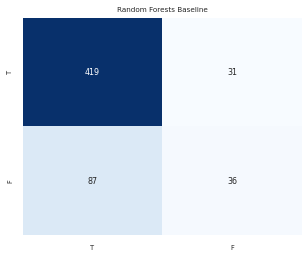

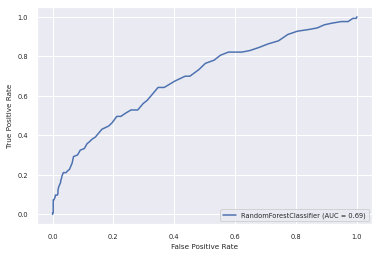

This is the starting index: 574 of patient 1
0.7296137339055794
[([0], 1, array([0.28, 0.72])), ([0], 1, array([0.33, 0.67])), ([0], 0, array([0.65, 0.35])), ([0], 1, array([0.3, 0.7])), ([0], 0, array([0.52, 0.48])), ([0], 0, array([0.73, 0.27])), ([1], 1, array([0.39, 0.61])), ([0], 0, array([0.59, 0.41])), ([0], 0, array([0.52, 0.48])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.78, 0.22])), ([0], 1, array([0.4, 0.6])), ([1], 0, array([0.5, 0.5])), ([0], 1, array([0.45, 0.55])), ([0], 0, array([0.67, 0.33])), ([0], 0, array([0.63, 0.37])), ([0], 1, array([0.47, 0.53])), ([0], 0, array([0.63, 0.37])), ([1], 0, array([0.78, 0.22])), ([0], 0, array([0.62, 0.38])), ([1], 1, array([0.07, 0.93])), ([0], 0, array([0.81, 0.19])), ([1], 1, array([0.15, 0.85])), ([0], 0, array([0.66, 0.34])), ([1], 0, array([0.52, 0.48])), ([0], 0, array([0.83, 0.17])), ([0], 0, array([0.75, 0.25])), ([0], 0, array([0.75, 0.25])), ([0], 0, array([0.75, 0.25])), ([1], 1, array([0.15, 0.85])), ([1], 1, arra

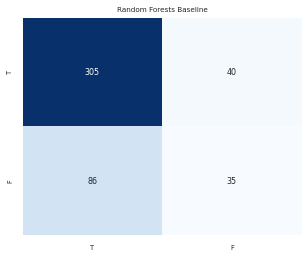

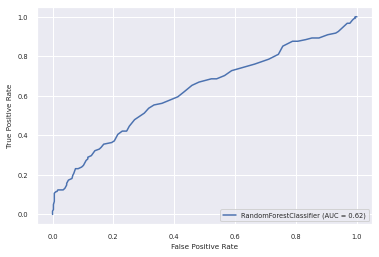

This is the starting index: 1041 of patient 2
0.31399317406143346
[([1], 1, array([0.25, 0.75])), ([0], 0, array([0.57, 0.43])), ([0], 1, array([0.43, 0.57])), ([1], 1, array([0.11, 0.89])), ([0], 0, array([0.59, 0.41])), ([0], 0, array([0.65, 0.35])), ([0], 0, array([0.63, 0.37])), ([1], 1, array([0.19, 0.81])), ([1], 0, array([0.6, 0.4])), ([1], 1, array([0.41, 0.59])), ([1], 0, array([0.59, 0.41])), ([1], 1, array([0.36, 0.64])), ([1], 1, array([0.07, 0.93])), ([0], 0, array([0.55, 0.45])), ([1], 1, array([0.45, 0.55])), ([1], 1, array([0.19, 0.81])), ([0], 1, array([0.2, 0.8])), ([0], 1, array([0.1, 0.9])), ([0], 1, array([0.34, 0.66])), ([0], 0, array([0.61, 0.39])), ([0], 1, array([0.12, 0.88])), ([0], 1, array([0.35, 0.65])), ([0], 1, array([0.23, 0.77])), ([0], 1, array([0.06, 0.94])), ([0], 1, array([0.29, 0.71])), ([0], 1, array([0.05, 0.95])), ([0], 0, array([0.52, 0.48])), ([0], 1, array([0.1, 0.9])), ([0], 1, array([0.04, 0.96])), ([0], 1, array([0.13, 0.87])), ([0], 1, ar

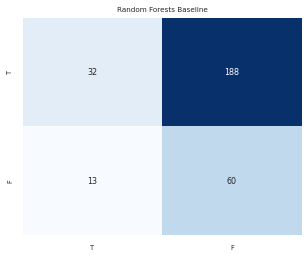

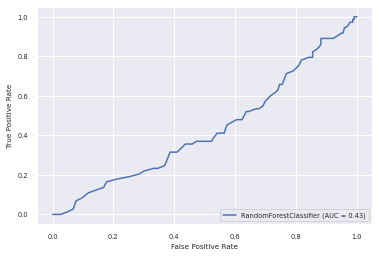

This is the starting index: 1335 of patient 3
0.6322751322751323
[([0], 0, array([0.58, 0.42])), ([1], 0, array([0.54, 0.46])), ([1], 1, array([0.17, 0.83])), ([1], 1, array([0.32, 0.68])), ([1], 1, array([0.24, 0.76])), ([1], 0, array([0.6, 0.4])), ([1], 1, array([0.43, 0.57])), ([0], 1, array([0.45, 0.55])), ([0], 0, array([0.63, 0.37])), ([0], 0, array([0.66, 0.34])), ([0], 1, array([0.38, 0.62])), ([0], 0, array([0.77, 0.23])), ([0], 0, array([0.62, 0.38])), ([1], 0, array([0.61, 0.39])), ([0], 0, array([0.53, 0.47])), ([0], 1, array([0.49, 0.51])), ([0], 0, array([0.61, 0.39])), ([0], 1, array([0.12, 0.88])), ([0], 0, array([0.66, 0.34])), ([0], 0, array([0.51, 0.49])), ([0], 0, array([0.56, 0.44])), ([0], 1, array([0.28, 0.72])), ([0], 1, array([0.39, 0.61])), ([0], 0, array([0.65, 0.35])), ([0], 0, array([0.66, 0.34])), ([0], 0, array([0.53, 0.47])), ([0], 1, array([0.42, 0.58])), ([0], 0, array([0.85, 0.15])), ([0], 1, array([0.38, 0.62])), ([1], 0, array([0.55, 0.45])), ([0], 

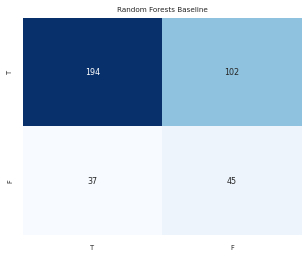

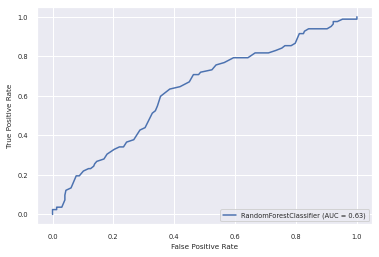

This is the starting index: 1714 of patient 4
0.521594684385382
[([1], 1, array([0.46, 0.54])), ([1], 1, array([0.33, 0.67])), ([1], 0, array([0.59, 0.41])), ([1], 1, array([0.47, 0.53])), ([1], 1, array([0.37, 0.63])), ([1], 0, array([0.67, 0.33])), ([1], 1, array([0.48, 0.52])), ([1], 0, array([0.53, 0.47])), ([1], 0, array([0.64, 0.36])), ([1], 0, array([0.63, 0.37])), ([1], 1, array([0.39, 0.61])), ([1], 1, array([0.46, 0.54])), ([1], 1, array([0.2, 0.8])), ([1], 1, array([0.26, 0.74])), ([1], 1, array([0.33, 0.67])), ([1], 1, array([0.33, 0.67])), ([1], 1, array([0.32, 0.68])), ([1], 1, array([0.44, 0.56])), ([1], 1, array([0.27, 0.73])), ([1], 1, array([0.35, 0.65])), ([1], 1, array([0.27, 0.73])), ([1], 1, array([0.33, 0.67])), ([1], 0, array([0.62, 0.38])), ([1], 1, array([0.44, 0.56])), ([1], 1, array([0.41, 0.59])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.49, 0.51])), ([1], 0, array([0.62, 0.38])), ([1], 1, array([0.42, 0.58])), ([1], 1, array([0.38, 0.62])), ([1], 0, 

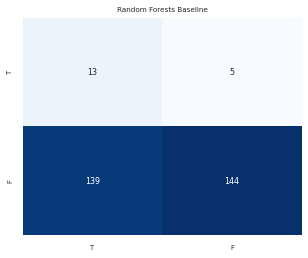

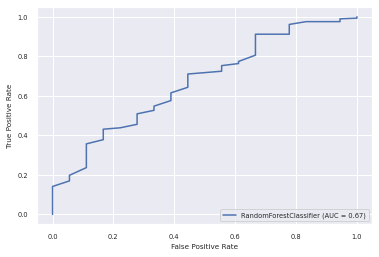

This is the starting index: 2016 of patient 5
0.45454545454545453
[([0], 0, array([0.66, 0.34])), ([0], 0, array([0.68, 0.32])), ([0], 0, array([0.68, 0.32])), ([0], 0, array([0.76, 0.24])), ([0], 0, array([0.85, 0.15])), ([0], 0, array([0.8, 0.2])), ([1], 0, array([0.88, 0.12])), ([1], 0, array([0.88, 0.12])), ([1], 0, array([0.78, 0.22])), ([1], 0, array([0.76, 0.24])), ([0], 0, array([0.69, 0.31])), ([1], 0, array([0.82, 0.18])), ([0], 0, array([0.59, 0.41])), ([1], 0, array([0.55, 0.45])), ([1], 0, array([0.75, 0.25])), ([1], 0, array([0.84, 0.16])), ([1], 0, array([0.87, 0.13])), ([1], 0, array([0.73, 0.27])), ([1], 0, array([0.7, 0.3])), ([1], 0, array([0.81, 0.19])), ([1], 1, array([0.11, 0.89])), ([1], 0, array([0.69, 0.31])), ([1], 0, array([0.81, 0.19])), ([1], 0, array([0.69, 0.31])), ([1], 0, array([0.77, 0.23])), ([1], 0, array([0.7, 0.3])), ([1], 1, array([0.12, 0.88])), ([1], 0, array([0.6, 0.4])), ([1], 0, array([0.81, 0.19])), ([1], 1, array([0.45, 0.55])), ([1], 0, ar

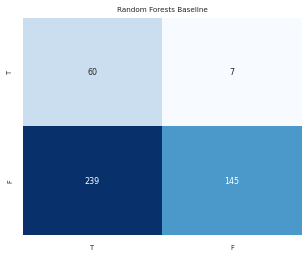

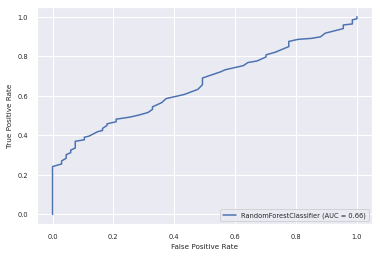

This is the starting index: 2468 of patient 6
0.5669291338582677
[([1], 1, array([0.48, 0.52])), ([1], 1, array([0.49, 0.51])), ([1], 1, array([0.3, 0.7])), ([1], 0, array([0.77, 0.23])), ([1], 0, array([0.74, 0.26])), ([1], 1, array([0.36, 0.64])), ([1], 1, array([0.34, 0.66])), ([1], 0, array([0.82, 0.18])), ([1], 0, array([0.61, 0.39])), ([1], 0, array([0.76, 0.24])), ([0], 0, array([0.78, 0.22])), ([1], 1, array([0.3, 0.7])), ([1], 0, array([0.77, 0.23])), ([1], 1, array([0.46, 0.54])), ([1], 0, array([0.66, 0.34])), ([1], 1, array([0.38, 0.62])), ([1], 1, array([0.23, 0.77])), ([1], 1, array([0.32, 0.68])), ([1], 1, array([0.38, 0.62])), ([0], 0, array([0.74, 0.26])), ([1], 0, array([0.7, 0.3])), ([1], 0, array([0.82, 0.18])), ([1], 1, array([0.47, 0.53])), ([1], 1, array([0.41, 0.59])), ([1], 1, array([0.46, 0.54])), ([1], 0, array([0.65, 0.35])), ([1], 0, array([0.94, 0.06])), ([0], 1, array([0.35, 0.65])), ([0], 0, array([0.78, 0.22])), ([1], 1, array([0.48, 0.52])), ([1], 0, a

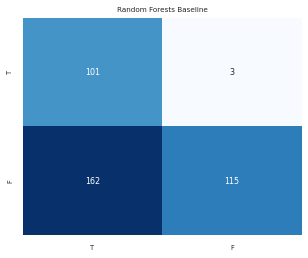

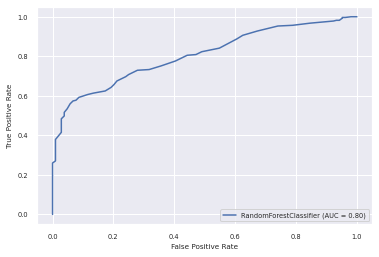

This is the starting index: 2850 of patient 7
0.8164948453608247
[([0], 0, array([0.68, 0.32])), ([0], 0, array([0.78, 0.22])), ([0], 0, array([0.74, 0.26])), ([0], 1, array([0.47, 0.53])), ([0], 0, array([0.56, 0.44])), ([0], 0, array([0.64, 0.36])), ([0], 0, array([0.77, 0.23])), ([0], 0, array([0.89, 0.11])), ([0], 0, array([0.79, 0.21])), ([0], 0, array([0.72, 0.28])), ([0], 0, array([0.78, 0.22])), ([0], 0, array([0.91, 0.09])), ([0], 1, array([0.17, 0.83])), ([0], 1, array([0.33, 0.67])), ([0], 0, array([0.56, 0.44])), ([0], 0, array([0.87, 0.13])), ([0], 0, array([0.86, 0.14])), ([0], 0, array([0.92, 0.08])), ([0], 0, array([0.79, 0.21])), ([0], 0, array([0.7, 0.3])), ([0], 0, array([0.72, 0.28])), ([0], 0, array([0.87, 0.13])), ([0], 0, array([0.66, 0.34])), ([0], 0, array([0.57, 0.43])), ([0], 0, array([0.75, 0.25])), ([0], 1, array([0.43, 0.57])), ([0], 0, array([0.76, 0.24])), ([0], 0, array([0.92, 0.08])), ([0], 1, array([0.42, 0.58])), ([0], 0, array([0.68, 0.32])), ([1], 

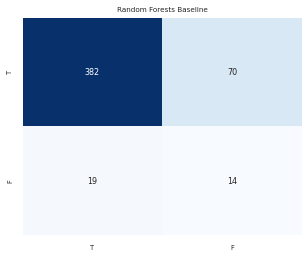

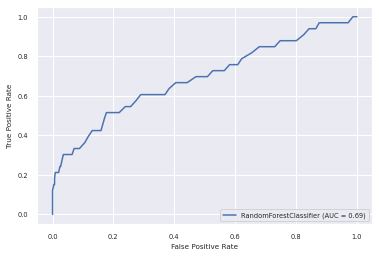

This is the starting index: 3336 of patient 8
0.7110726643598616
[([1], 0, array([0.78, 0.22])), ([1], 1, array([0.39, 0.61])), ([0], 0, array([0.71, 0.29])), ([1], 0, array([0.63, 0.37])), ([1], 1, array([0.48, 0.52])), ([1], 1, array([0.21, 0.79])), ([1], 1, array([0.45, 0.55])), ([1], 1, array([0.18, 0.82])), ([1], 1, array([0.3, 0.7])), ([1], 1, array([0.31, 0.69])), ([0], 1, array([0.41, 0.59])), ([1], 1, array([0.36, 0.64])), ([0], 0, array([0.8, 0.2])), ([1], 1, array([0.29, 0.71])), ([1], 1, array([0.37, 0.63])), ([0], 0, array([0.86, 0.14])), ([0], 0, array([0.63, 0.37])), ([1], 0, array([0.62, 0.38])), ([1], 1, array([0.11, 0.89])), ([1], 0, array([0.63, 0.37])), ([1], 1, array([0.33, 0.67])), ([0], 0, array([0.68, 0.32])), ([1], 1, array([0.3, 0.7])), ([0], 0, array([0.82, 0.18])), ([1], 1, array([0.1, 0.9])), ([0], 1, array([0.31, 0.69])), ([0], 0, array([0.64, 0.36])), ([0], 0, array([0.54, 0.46])), ([0], 0, array([0.84, 0.16])), ([1], 1, array([0.19, 0.81])), ([1], 1, arr

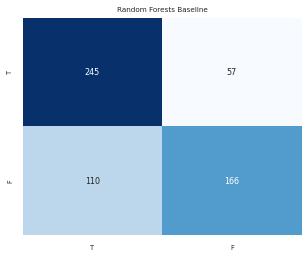

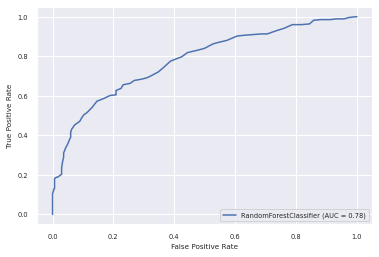

This is the starting index: 3915 of patient 9
0.5821428571428572
[([1], 1, array([0.19, 0.81])), ([1], 1, array([0.45, 0.55])), ([1], 1, array([0.47, 0.53])), ([1], 0, array([0.51, 0.49])), ([1], 1, array([0.36, 0.64])), ([1], 1, array([0.13, 0.87])), ([1], 0, array([0.75, 0.25])), ([1], 0, array([0.73, 0.27])), ([1], 0, array([0.56, 0.44])), ([1], 0, array([0.69, 0.31])), ([1], 1, array([0.1, 0.9])), ([1], 1, array([0.45, 0.55])), ([1], 1, array([0.2, 0.8])), ([1], 0, array([0.5, 0.5])), ([1], 0, array([0.73, 0.27])), ([1], 0, array([0.59, 0.41])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.38, 0.62])), ([1], 1, array([0.39, 0.61])), ([1], 1, array([0.48, 0.52])), ([1], 1, array([0.18, 0.82])), ([1], 0, array([0.61, 0.39])), ([1], 0, array([0.5, 0.5])), ([1], 0, array([0.65, 0.35])), ([1], 0, array([0.5, 0.5])), ([0], 1, array([0.3, 0.7])), ([0], 1, array([0.43, 0.57])), ([1], 1, array([0.13, 0.87])), ([1], 0, array([0.79, 0.21])), ([1], 1, array([0.16, 0.84])), ([1], 1, array([0.

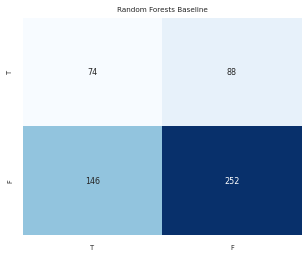

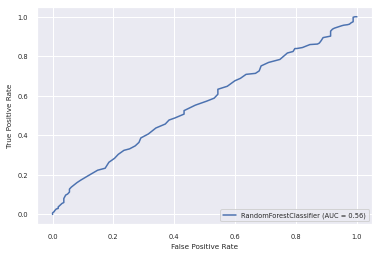

This is the starting index: 4476 of patient 10
0.8534322820037106
[([0], 1, array([0.48, 0.52])), ([0], 0, array([0.67, 0.33])), ([0], 0, array([0.59, 0.41])), ([0], 0, array([0.53, 0.47])), ([0], 0, array([0.71, 0.29])), ([0], 0, array([0.63, 0.37])), ([1], 1, array([0.41, 0.59])), ([1], 0, array([0.74, 0.26])), ([0], 0, array([0.84, 0.16])), ([0], 0, array([0.87, 0.13])), ([1], 0, array([0.52, 0.48])), ([1], 1, array([0.48, 0.52])), ([1], 0, array([0.59, 0.41])), ([0], 0, array([0.82, 0.18])), ([0], 0, array([0.69, 0.31])), ([0], 0, array([0.94, 0.06])), ([0], 0, array([0.76, 0.24])), ([0], 0, array([0.75, 0.25])), ([1], 1, array([0.35, 0.65])), ([0], 0, array([0.5, 0.5])), ([1], 0, array([0.78, 0.22])), ([0], 0, array([0.92, 0.08])), ([0], 0, array([0.68, 0.32])), ([0], 0, array([0.74, 0.26])), ([0], 0, array([0.89, 0.11])), ([1], 0, array([0.56, 0.44])), ([0], 0, array([0.64, 0.36])), ([0], 0, array([0.69, 0.31])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.78, 0.22])), ([0], 0

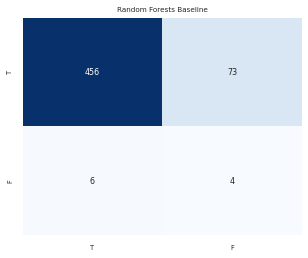

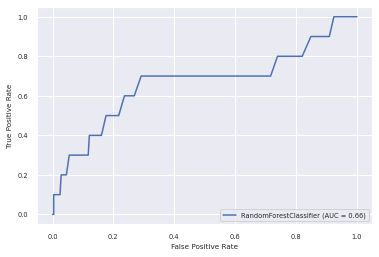

This is the starting index: 5016 of patient 11
0.7402597402597403
[([0], 0, array([0.53, 0.47])), ([0], 1, array([0.34, 0.66])), ([0], 0, array([0.84, 0.16])), ([0], 0, array([0.79, 0.21])), ([0], 1, array([0.24, 0.76])), ([0], 0, array([0.66, 0.34])), ([0], 0, array([0.57, 0.43])), ([0], 0, array([0.73, 0.27])), ([0], 0, array([0.73, 0.27])), ([0], 0, array([0.71, 0.29])), ([0], 0, array([0.77, 0.23])), ([0], 0, array([0.71, 0.29])), ([0], 0, array([0.72, 0.28])), ([1], 0, array([0.6, 0.4])), ([0], 0, array([0.68, 0.32])), ([1], 0, array([0.72, 0.28])), ([0], 0, array([0.65, 0.35])), ([0], 0, array([0.73, 0.27])), ([0], 0, array([0.81, 0.19])), ([1], 0, array([0.88, 0.12])), ([0], 0, array([0.72, 0.28])), ([0], 0, array([0.95, 0.05])), ([0], 0, array([0.9, 0.1])), ([0], 0, array([0.84, 0.16])), ([1], 0, array([0.62, 0.38])), ([0], 0, array([0.68, 0.32])), ([1], 0, array([0.7, 0.3])), ([1], 1, array([0.13, 0.87])), ([0], 0, array([0.86, 0.14])), ([0], 0, array([0.7, 0.3])), ([0], 0, ar

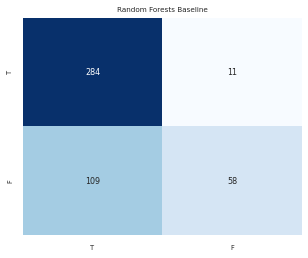

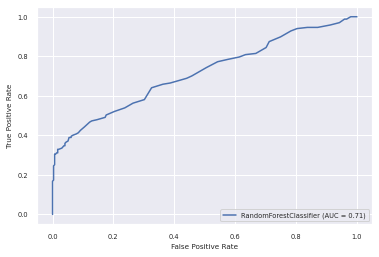

This is the starting index: 5479 of patient 12
0.3058823529411765
[([0], 1, array([0.28, 0.72])), ([0], 1, array([0.4, 0.6])), ([0], 1, array([0.16, 0.84])), ([0], 1, array([0.29, 0.71])), ([0], 0, array([0.63, 0.37])), ([0], 1, array([0.28, 0.72])), ([0], 1, array([0.33, 0.67])), ([0], 1, array([0.22, 0.78])), ([0], 1, array([0.35, 0.65])), ([0], 1, array([0.21, 0.79])), ([0], 1, array([0.2, 0.8])), ([0], 1, array([0.27, 0.73])), ([0], 1, array([0.43, 0.57])), ([0], 1, array([0.24, 0.76])), ([0], 1, array([0.24, 0.76])), ([0], 1, array([0.23, 0.77])), ([0], 0, array([0.55, 0.45])), ([0], 0, array([0.54, 0.46])), ([0], 1, array([0.49, 0.51])), ([0], 1, array([0.21, 0.79])), ([0], 1, array([0.31, 0.69])), ([0], 1, array([0.38, 0.62])), ([0], 1, array([0.19, 0.81])), ([0], 1, array([0.37, 0.63])), ([0], 0, array([0.5, 0.5])), ([0], 1, array([0.21, 0.79])), ([0], 1, array([0.39, 0.61])), ([0], 1, array([0.37, 0.63])), ([0], 1, array([0.38, 0.62])), ([0], 1, array([0.33, 0.67])), ([0], 1, 

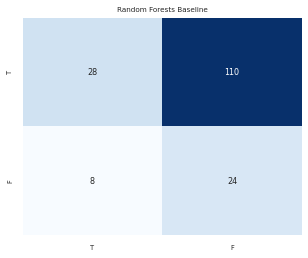

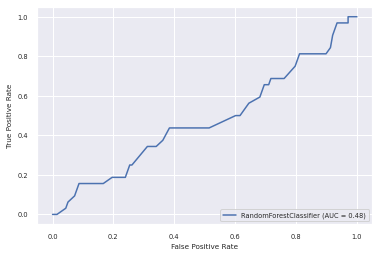

<function matplotlib.pyplot.show>

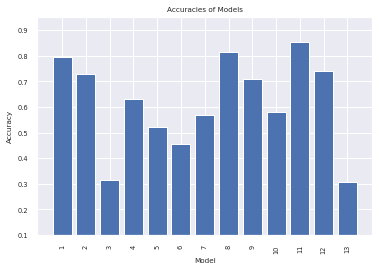

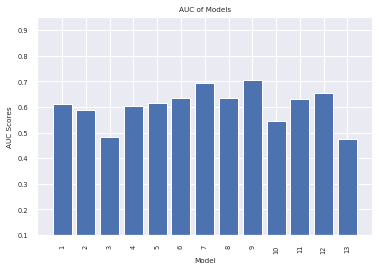

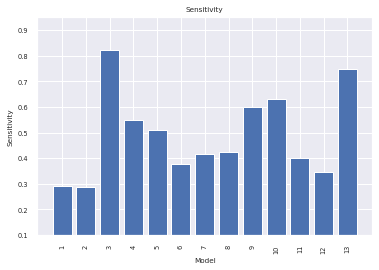

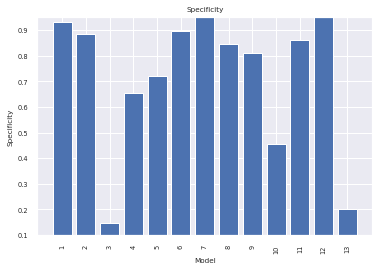

In [36]:
Accuracy = []
auc = []
sensitivity = []
specificity = []
clf = AdaBoostClassifier()

for i in range(0,13):
    test, train, test_class, train_class = leave_one_out(df,i)
    clf = ExtraTreesClassifier(n_estimators=50)
    clf = clf.fit(train, train_class.ravel())
    model = SelectFromModel(clf, prefit=True)
    train = model.transform(train)
    # clf = ExtraTreesClassifier(n_estimators=50)
    # clf = clf.fit(test, test_class.ravel())
    # model = SelectFromModel(clf, prefit=True) 

    test = model.transform(test)
    clf = RandomForestClassifier()
    clf.fit(train, train_class.ravel())


    y_predicted = clf.predict(test)
    print(metrics.accuracy_score(test_class,y_predicted))
        # print("Random Forest:\n",metrics.classification_report(test_class,y_predicted)) # Classification report
    Accuracy.append(metrics.accuracy_score(test_class,y_predicted))
    auc.append(metrics.roc_auc_score(test_class,y_predicted))
    mcm = confusion_matrix(test_class,y_predicted)
    tn = mcm[0, 0]
    tp = mcm[1, 1]
    fn = mcm[1, 0]
    fp = mcm[0, 1]
    sensitivity.append(tp / (tp + fn))
    specificity.append(tn / (tn + fp))
    pred = clf.predict_proba(test)
    result = [*zip(test_class.tolist(), y_predicted, pred)]
    print(result)
    report = metrics.classification_report(test_class.tolist(), y_predicted)
    matrix = metrics.confusion_matrix(test_class.tolist(),y_predicted)   

    fig, (ax1) = plt.subplots(1, figsize=(5, 4))


    df_cm1 = pd.DataFrame(matrix, range(2), range(2))
    sn.set(font_scale=0.6) # for label size
    sn.heatmap(df_cm1, annot=True,annot_kws={"size": 8}, fmt='g', cmap='Blues', cbar= False, xticklabels=x_axis_labels, yticklabels=y_axis_labels, ax = ax1) # font size


    ax1.set_title('Random Forests Baseline')

    plt.show()
    metrics.plot_roc_curve(clf, test, test_class.tolist())  # doctest: +SKIP
    plt.show()

Model=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13']

Index = [1,2,3,4,5,6,7,8,9,10,11,12,13]
fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,Accuracy)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Accuracy')
plt.xlabel('Model')
plt.title('Accuracies of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,auc)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('AUC Scores')
plt.xlabel('Model')
plt.title('AUC of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,sensitivity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Sensitivity')
plt.xlabel('Model')
plt.title('Sensitivity')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,specificity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Specificity')
plt.xlabel('Model')
plt.title('Specificity')
plt.show

#### Auto Sklearn Recommendation

In [ ]:
#SVM with manual parameters
svm = Pipeline([('vect', CountVectorizer()),('tfidf', TfidfTransformer()),
                         ('svm', SGDClassifier(loss='hinge', alpha=1e-3, random_state=42)),])

SimpleClassificationPipeline({'balancing:strategy': 'weighting', 'classifier:__choice__': 'random_forest', 'data_preprocessing:categorical_transformer:categorical_encoding:__choice__': 'one_hot_encoding', 'data_preprocessing:categorical_transformer:category_coalescence:__choice__': 'minority_coalescer', 'data_preprocessing:numerical_transformer:imputation:strategy': 'most_frequent', 'data_preprocessing:numerical_transformer:rescaling:__choice__': 'normalize', 'feature_preprocessor:__choice__': 'extra_trees_preproc_for_classification', 'classifier:random_forest:bootstrap': 'False', 'classifier:random_forest:criterion': 'entropy', 'classifier:random_forest:max_depth': 'None', 'classifier:random_forest:max_features': 0.27453376891983117, 'classifier:random_forest:max_leaf_nodes': 'None', 'classifier:random_forest:min_impurity_decrease': 0.0, 'classifier:random_forest:min_samples_leaf': 13, 'classifier:random_forest:min_samples_split': 19, 'classifier:random_forest:min_weight_fraction_leaf': 0.0, 'data_preprocessing:categorical_transformer:category_coalescence:minority_coalescer:minimum_fraction': 0.2166847947584762, 'feature_preprocessor:extra_trees_preproc_for_classification:bootstrap': 'False', 'feature_preprocessor:extra_trees_preproc_for_classification:criterion': 'entropy', 'feature_preprocessor:extra_trees_preproc_for_classification:max_depth': 'None', 'feature_preprocessor:extra_trees_preproc_for_classification:max_features': 0.2819773130241576, 'feature_preprocessor:extra_trees_preproc_for_classification:max_leaf_nodes': 'None', 'feature_preprocessor:extra_trees_preproc_for_classification:min_impurity_decrease': 0.0, 'feature_preprocessor:extra_trees_preproc_for_classification:min_samples_leaf': 20, 'feature_preprocessor:extra_trees_preproc_for_classification:min_samples_split': 3, 'feature_preprocessor:extra_trees_preproc_for_classification:min_weight_fraction_leaf': 0.0, 'feature_preprocessor:extra_trees_preproc_for_classification:n_estimators': 100},
d

### LDA (LinearDiscriminantAnalysis)

#### Baseline

This is the starting index: 0 of patient 0
0.7556719022687609
[([1], 1, array([0.26717886, 0.73282114])), ([1], 1, array([0.49431259, 0.50568741])), ([0], 1, array([0.47422467, 0.52577533])), ([1], 0, array([0.59139669, 0.40860331])), ([1], 1, array([0.29348308, 0.70651692])), ([0], 0, array([0.55958998, 0.44041002])), ([1], 0, array([0.84955929, 0.15044071])), ([0], 0, array([0.57704178, 0.42295822])), ([1], 1, array([0.29047493, 0.70952507])), ([0], 1, array([0.26547639, 0.73452361])), ([0], 0, array([0.54909413, 0.45090587])), ([1], 1, array([0.36204666, 0.63795334])), ([1], 1, array([0.37010988, 0.62989012])), ([0], 0, array([0.70296924, 0.29703076])), ([1], 0, array([0.52043048, 0.47956952])), ([1], 1, array([0.39080759, 0.60919241])), ([1], 1, array([0.35410808, 0.64589192])), ([1], 0, array([0.53118463, 0.46881537])), ([1], 1, array([0.44913334, 0.55086666])), ([1], 1, array([0.44540851, 0.55459149])), ([0], 0, array([0.60337966, 0.39662034])), ([1], 1, array([0.4270111, 0.57298

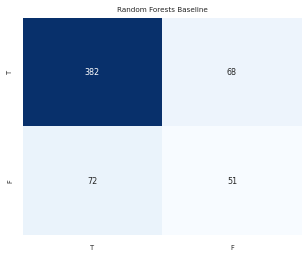

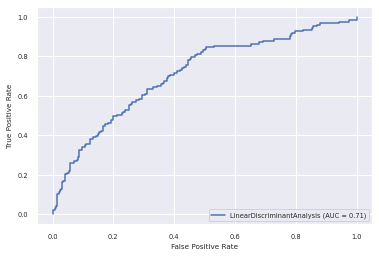

This is the starting index: 574 of patient 1
0.721030042918455
[([0], 0, array([0.5334334, 0.4665666])), ([0], 1, array([0.42523619, 0.57476381])), ([0], 0, array([0.6754194, 0.3245806])), ([0], 1, array([0.30107062, 0.69892938])), ([0], 0, array([0.50517406, 0.49482594])), ([0], 0, array([0.55148286, 0.44851714])), ([1], 1, array([0.29905145, 0.70094855])), ([0], 0, array([0.5248116, 0.4751884])), ([0], 0, array([0.61776789, 0.38223211])), ([0], 1, array([0.30230069, 0.69769931])), ([0], 1, array([0.49995787, 0.50004213])), ([0], 1, array([0.39556114, 0.60443886])), ([1], 1, array([0.36711126, 0.63288874])), ([0], 0, array([0.54129362, 0.45870638])), ([0], 0, array([0.61888789, 0.38111211])), ([0], 0, array([0.72296181, 0.27703819])), ([0], 0, array([0.50828018, 0.49171982])), ([0], 0, array([0.77798204, 0.22201796])), ([1], 0, array([0.50021563, 0.49978437])), ([0], 0, array([0.69302532, 0.30697468])), ([1], 1, array([0.16817056, 0.83182944])), ([0], 0, array([0.7168914, 0.2831086]))

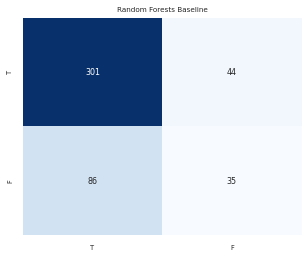

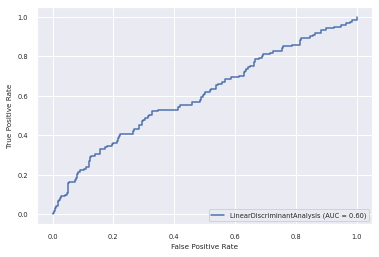

This is the starting index: 1041 of patient 2
0.3515358361774744
[([1], 1, array([0.38245219, 0.61754781])), ([0], 1, array([0.23552344, 0.76447656])), ([0], 1, array([0.16412465, 0.83587535])), ([1], 1, array([0.11336473, 0.88663527])), ([0], 1, array([0.13710505, 0.86289495])), ([0], 1, array([0.24201347, 0.75798653])), ([0], 1, array([0.07568805, 0.92431195])), ([1], 1, array([0.13264496, 0.86735504])), ([1], 1, array([0.22800325, 0.77199675])), ([1], 1, array([0.34214652, 0.65785348])), ([1], 1, array([0.14665716, 0.85334284])), ([1], 1, array([0.28917643, 0.71082357])), ([1], 1, array([0.26270918, 0.73729082])), ([0], 1, array([0.32599176, 0.67400824])), ([1], 1, array([0.37493725, 0.62506275])), ([1], 0, array([0.51651838, 0.48348162])), ([0], 1, array([0.32275461, 0.67724539])), ([0], 1, array([0.21011537, 0.78988463])), ([0], 1, array([0.16391378, 0.83608622])), ([0], 0, array([0.60722058, 0.39277942])), ([0], 1, array([0.06149001, 0.93850999])), ([0], 1, array([0.44885708, 0.5

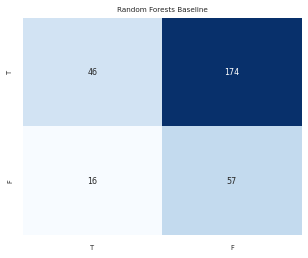

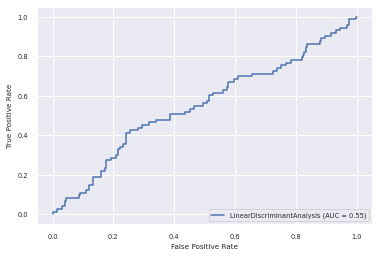

This is the starting index: 1335 of patient 3
0.6243386243386243
[([0], 0, array([0.52697108, 0.47302892])), ([1], 1, array([0.32644783, 0.67355217])), ([1], 1, array([0.44792263, 0.55207737])), ([1], 1, array([0.44618681, 0.55381319])), ([1], 1, array([0.17474521, 0.82525479])), ([1], 0, array([0.54344333, 0.45655667])), ([1], 0, array([0.57095542, 0.42904458])), ([0], 1, array([0.42328099, 0.57671901])), ([0], 0, array([0.53891838, 0.46108162])), ([0], 0, array([0.5939079, 0.4060921])), ([0], 1, array([0.40336959, 0.59663041])), ([0], 1, array([0.3833297, 0.6166703])), ([0], 0, array([0.62841095, 0.37158905])), ([1], 1, array([0.43345274, 0.56654726])), ([0], 0, array([0.55888478, 0.44111522])), ([0], 1, array([0.46495453, 0.53504547])), ([0], 0, array([0.54367154, 0.45632846])), ([0], 1, array([0.26101655, 0.73898345])), ([0], 1, array([0.46534232, 0.53465768])), ([0], 0, array([0.74280714, 0.25719286])), ([0], 0, array([0.57784618, 0.42215382])), ([0], 1, array([0.39554813, 0.60445

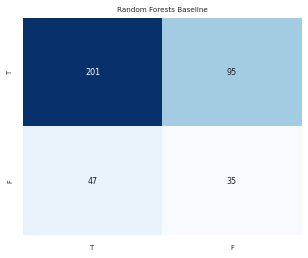

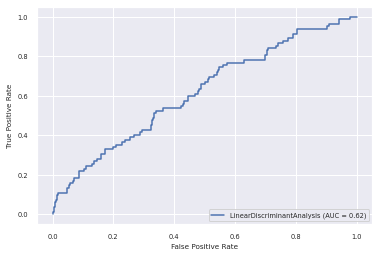

This is the starting index: 1714 of patient 4
0.18604651162790697
[([1], 1, array([0.4888835, 0.5111165])), ([1], 0, array([0.63321885, 0.36678115])), ([1], 0, array([0.65405819, 0.34594181])), ([1], 1, array([0.44704728, 0.55295272])), ([1], 1, array([0.49244738, 0.50755262])), ([1], 0, array([0.57727062, 0.42272938])), ([1], 0, array([0.57675007, 0.42324993])), ([1], 0, array([0.60096489, 0.39903511])), ([1], 0, array([0.75405737, 0.24594263])), ([1], 1, array([0.37295265, 0.62704735])), ([1], 0, array([0.63909493, 0.36090507])), ([1], 0, array([0.64472388, 0.35527612])), ([1], 1, array([0.49962064, 0.50037936])), ([1], 1, array([0.45616976, 0.54383024])), ([1], 0, array([0.53252734, 0.46747266])), ([1], 0, array([0.58035553, 0.41964447])), ([1], 0, array([0.65431451, 0.34568549])), ([1], 0, array([0.56626451, 0.43373549])), ([1], 0, array([0.58292073, 0.41707927])), ([1], 0, array([0.58356917, 0.41643083])), ([1], 0, array([0.61387981, 0.38612019])), ([1], 0, array([0.64247436, 0.35

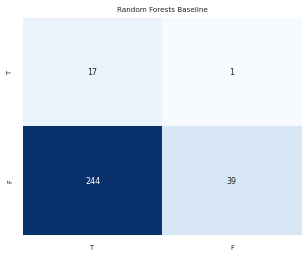

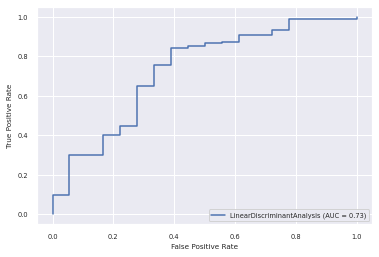

This is the starting index: 2016 of patient 5
0.3325942350332594
[([0], 0, array([0.63494522, 0.36505478])), ([0], 0, array([0.80124731, 0.19875269])), ([0], 0, array([0.63399292, 0.36600708])), ([0], 0, array([0.81617333, 0.18382667])), ([0], 0, array([0.80033507, 0.19966493])), ([0], 0, array([0.79040702, 0.20959298])), ([1], 0, array([0.69462117, 0.30537883])), ([1], 0, array([0.82977344, 0.17022656])), ([1], 0, array([0.71904443, 0.28095557])), ([1], 0, array([0.67835598, 0.32164402])), ([0], 0, array([0.75075848, 0.24924152])), ([1], 0, array([0.80086516, 0.19913484])), ([0], 0, array([0.7230839, 0.2769161])), ([1], 0, array([0.69643623, 0.30356377])), ([1], 0, array([0.82973222, 0.17026778])), ([1], 0, array([0.50898664, 0.49101336])), ([1], 0, array([0.56457566, 0.43542434])), ([1], 0, array([0.68491243, 0.31508757])), ([1], 0, array([0.7317202, 0.2682798])), ([1], 0, array([0.73886633, 0.26113367])), ([1], 1, array([0.39338546, 0.60661454])), ([1], 0, array([0.70655965, 0.29344

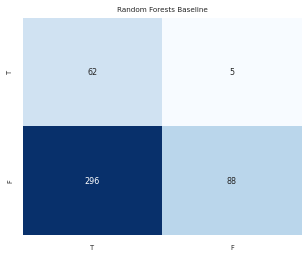

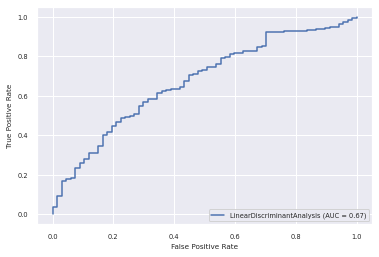

This is the starting index: 2468 of patient 6
0.47506561679790027
[([1], 1, array([0.39388456, 0.60611544])), ([1], 1, array([0.427215, 0.572785])), ([1], 1, array([0.46840947, 0.53159053])), ([1], 0, array([0.62329526, 0.37670474])), ([1], 0, array([0.58395023, 0.41604977])), ([1], 0, array([0.67387612, 0.32612388])), ([1], 1, array([0.37991445, 0.62008555])), ([1], 0, array([0.84517863, 0.15482137])), ([1], 0, array([0.50112835, 0.49887165])), ([1], 0, array([0.64613346, 0.35386654])), ([0], 0, array([0.78943774, 0.21056226])), ([1], 1, array([0.16288689, 0.83711311])), ([1], 0, array([0.71356522, 0.28643478])), ([1], 1, array([0.19332468, 0.80667532])), ([1], 1, array([0.49146972, 0.50853028])), ([1], 1, array([0.32184383, 0.67815617])), ([1], 1, array([0.06658334, 0.93341666])), ([1], 1, array([0.44860372, 0.55139628])), ([1], 0, array([0.52518574, 0.47481426])), ([0], 0, array([0.94786495, 0.05213505])), ([1], 0, array([0.68773218, 0.31226782])), ([1], 0, array([0.54940567, 0.4505

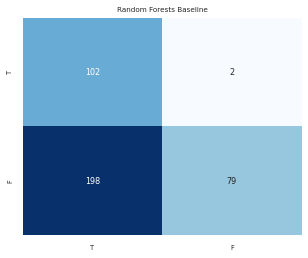

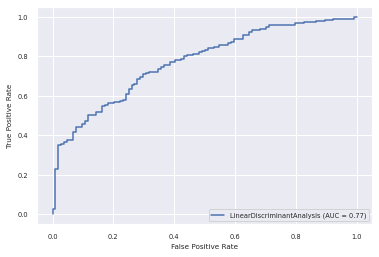

This is the starting index: 2850 of patient 7
0.7938144329896907
[([0], 1, array([0.47381237, 0.52618763])), ([0], 0, array([0.52996426, 0.47003574])), ([0], 0, array([0.60034725, 0.39965275])), ([0], 0, array([0.59435944, 0.40564056])), ([0], 1, array([0.4810889, 0.5189111])), ([0], 0, array([0.60764007, 0.39235993])), ([0], 1, array([0.40213308, 0.59786692])), ([0], 0, array([0.79776232, 0.20223768])), ([0], 0, array([0.53812456, 0.46187544])), ([0], 0, array([0.63323767, 0.36676233])), ([0], 0, array([0.75801368, 0.24198632])), ([0], 1, array([0.35439202, 0.64560798])), ([0], 1, array([0.22023401, 0.77976599])), ([0], 1, array([0.32874286, 0.67125714])), ([0], 0, array([0.55774854, 0.44225146])), ([0], 0, array([0.85215826, 0.14784174])), ([0], 0, array([0.68817364, 0.31182636])), ([0], 0, array([0.52572908, 0.47427092])), ([0], 0, array([0.58813721, 0.41186279])), ([0], 0, array([0.76658604, 0.23341396])), ([0], 0, array([0.51881066, 0.48118934])), ([0], 0, array([0.6931552, 0.3068

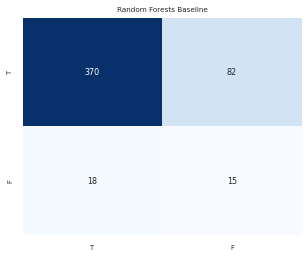

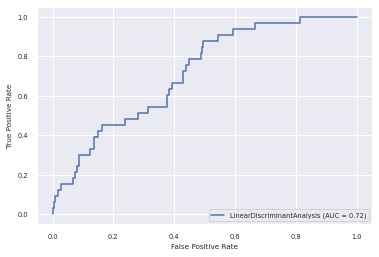

This is the starting index: 3336 of patient 8
0.5899653979238755
[([1], 0, array([0.66131979, 0.33868021])), ([1], 0, array([0.57459365, 0.42540635])), ([0], 0, array([0.79016325, 0.20983675])), ([1], 0, array([0.82583973, 0.17416027])), ([1], 0, array([0.67318965, 0.32681035])), ([1], 1, array([0.34060064, 0.65939936])), ([1], 0, array([0.50764335, 0.49235665])), ([1], 0, array([0.54171038, 0.45828962])), ([1], 0, array([0.57655228, 0.42344772])), ([1], 1, array([0.36045567, 0.63954433])), ([0], 0, array([0.71619524, 0.28380476])), ([1], 0, array([0.6393993, 0.3606007])), ([0], 0, array([0.74261988, 0.25738012])), ([1], 0, array([0.5436201, 0.4563799])), ([1], 1, array([0.28249655, 0.71750345])), ([0], 0, array([0.84325601, 0.15674399])), ([0], 0, array([0.52439069, 0.47560931])), ([1], 0, array([0.81449706, 0.18550294])), ([1], 1, array([0.47155172, 0.52844828])), ([1], 0, array([0.67780842, 0.32219158])), ([1], 1, array([0.32023414, 0.67976586])), ([0], 1, array([0.30406746, 0.69593

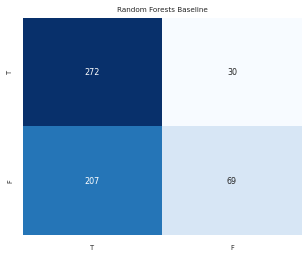

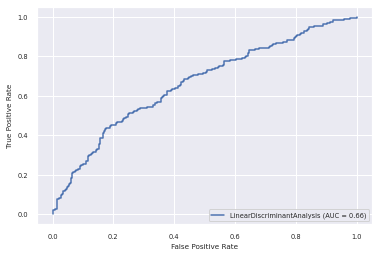

This is the starting index: 3915 of patient 9
0.5339285714285714
[([1], 1, array([0.30362034, 0.69637966])), ([1], 1, array([0.43685302, 0.56314698])), ([1], 1, array([0.27386096, 0.72613904])), ([1], 1, array([0.41856642, 0.58143358])), ([1], 1, array([0.35124762, 0.64875238])), ([1], 1, array([0.40426076, 0.59573924])), ([1], 1, array([0.49089191, 0.50910809])), ([1], 1, array([0.45037316, 0.54962684])), ([1], 1, array([0.40132405, 0.59867595])), ([1], 1, array([0.3131308, 0.6868692])), ([1], 0, array([0.53503575, 0.46496425])), ([1], 1, array([0.3639517, 0.6360483])), ([1], 1, array([0.49235378, 0.50764622])), ([1], 1, array([0.35249901, 0.64750099])), ([1], 1, array([0.37248744, 0.62751256])), ([1], 0, array([0.57343993, 0.42656007])), ([1], 1, array([0.39735753, 0.60264247])), ([1], 1, array([0.33459059, 0.66540941])), ([1], 1, array([0.32258717, 0.67741283])), ([1], 0, array([0.55806866, 0.44193134])), ([1], 1, array([0.39082685, 0.60917315])), ([1], 1, array([0.47939556, 0.52060

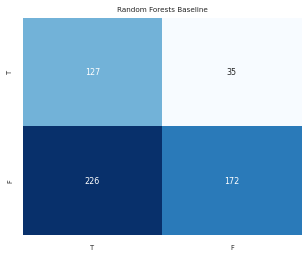

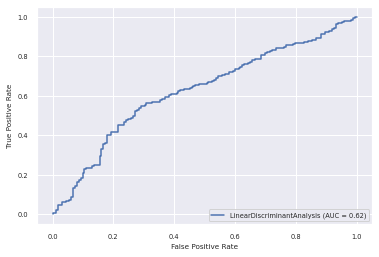

This is the starting index: 4476 of patient 10
0.8385899814471243
[([0], 0, array([0.53949456, 0.46050544])), ([0], 0, array([0.55449858, 0.44550142])), ([0], 0, array([0.58830102, 0.41169898])), ([0], 0, array([0.55936511, 0.44063489])), ([0], 0, array([0.6219275, 0.3780725])), ([0], 0, array([0.53443892, 0.46556108])), ([1], 0, array([0.56071549, 0.43928451])), ([1], 0, array([0.58859278, 0.41140722])), ([0], 0, array([0.66578384, 0.33421616])), ([0], 0, array([0.62686756, 0.37313244])), ([1], 0, array([0.50607832, 0.49392168])), ([1], 0, array([0.63978787, 0.36021213])), ([1], 0, array([0.80867479, 0.19132521])), ([0], 0, array([0.66335537, 0.33664463])), ([0], 0, array([0.74704657, 0.25295343])), ([0], 0, array([0.7888, 0.2112])), ([0], 0, array([0.66189937, 0.33810063])), ([0], 0, array([0.65222041, 0.34777959])), ([1], 0, array([0.54862314, 0.45137686])), ([0], 0, array([0.65492141, 0.34507859])), ([1], 0, array([0.85639798, 0.14360202])), ([0], 1, array([0.45833531, 0.54166469])

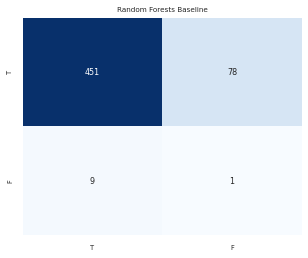

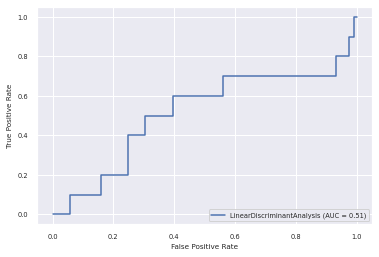

This is the starting index: 5016 of patient 11
0.696969696969697
[([0], 1, array([0.40835854, 0.59164146])), ([0], 0, array([0.5762674, 0.4237326])), ([0], 0, array([0.52482715, 0.47517285])), ([0], 1, array([0.46007257, 0.53992743])), ([0], 1, array([0.37296356, 0.62703644])), ([0], 1, array([0.46074254, 0.53925746])), ([0], 1, array([0.34081469, 0.65918531])), ([0], 1, array([0.41302323, 0.58697677])), ([0], 0, array([0.55292502, 0.44707498])), ([0], 0, array([0.77039049, 0.22960951])), ([0], 0, array([0.62514749, 0.37485251])), ([0], 0, array([0.62748749, 0.37251251])), ([0], 0, array([0.66159304, 0.33840696])), ([1], 0, array([0.64988741, 0.35011259])), ([0], 0, array([0.58907798, 0.41092202])), ([1], 0, array([0.7330704, 0.2669296])), ([0], 0, array([0.77547353, 0.22452647])), ([0], 0, array([0.58514827, 0.41485173])), ([0], 0, array([0.60201537, 0.39798463])), ([1], 0, array([0.64561269, 0.35438731])), ([0], 0, array([0.66080863, 0.33919137])), ([0], 0, array([0.66913329, 0.33086

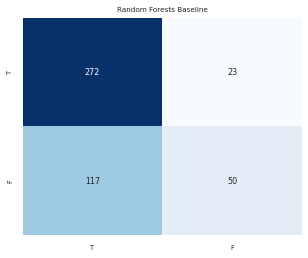

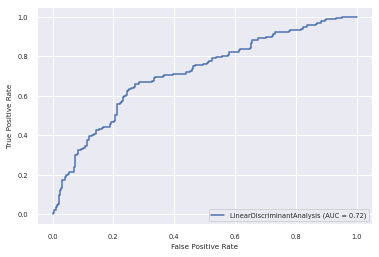

This is the starting index: 5479 of patient 12
0.6705882352941176
[([0], 0, array([0.56747425, 0.43252575])), ([0], 0, array([0.5446633, 0.4553367])), ([0], 1, array([0.48716889, 0.51283111])), ([0], 1, array([0.48871545, 0.51128455])), ([0], 0, array([0.57315442, 0.42684558])), ([0], 1, array([0.49700037, 0.50299963])), ([0], 0, array([0.55153477, 0.44846523])), ([0], 0, array([0.52937397, 0.47062603])), ([0], 1, array([0.44238847, 0.55761153])), ([0], 0, array([0.54152059, 0.45847941])), ([0], 0, array([0.51303257, 0.48696743])), ([0], 0, array([0.587056, 0.412944])), ([0], 0, array([0.58367046, 0.41632954])), ([0], 0, array([0.52709491, 0.47290509])), ([0], 0, array([0.51716928, 0.48283072])), ([0], 0, array([0.52697649, 0.47302351])), ([0], 0, array([0.51902167, 0.48097833])), ([0], 0, array([0.67883861, 0.32116139])), ([0], 0, array([0.58095476, 0.41904524])), ([0], 0, array([0.5625526, 0.4374474])), ([0], 0, array([0.70305371, 0.29694629])), ([0], 0, array([0.53767138, 0.46232862

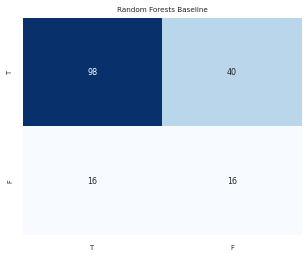

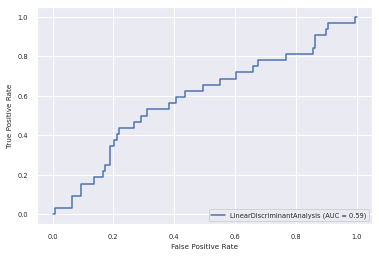

<function matplotlib.pyplot.show>

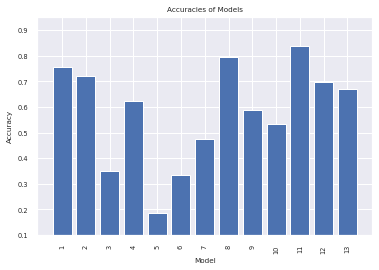

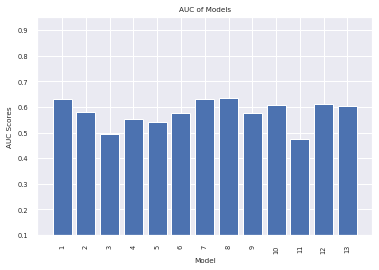

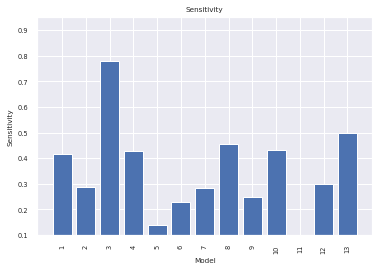

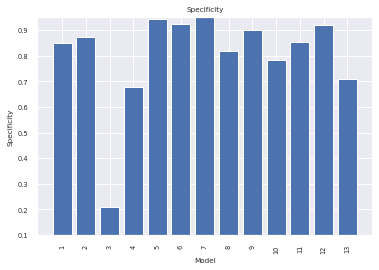

In [37]:
Accuracy = []
auc = []
sensitivity = []
specificity = []


clf = LinearDiscriminantAnalysis()

for i in range(0,13):
    test, train, test_class, train_class = leave_one_out(df,i)
    clf.fit(train, train_class.ravel())

    y_predicted = clf.predict(test)
    print(metrics.accuracy_score(test_class,y_predicted))
        # print("Random Forest:\n",metrics.classification_report(test_class,y_predicted)) # Classification report
    Accuracy.append(metrics.accuracy_score(test_class,y_predicted))
    auc.append(metrics.roc_auc_score(test_class,y_predicted))
    mcm = confusion_matrix(test_class,y_predicted)
    tn = mcm[0, 0]
    tp = mcm[1, 1]
    fn = mcm[1, 0]
    fp = mcm[0, 1]
    sensitivity.append(tp / (tp + fn))
    specificity.append(tn / (tn + fp))
    pred = clf.predict_proba(test)
    result = [*zip(test_class.tolist(), y_predicted, pred)]
    print(result) 
    report = metrics.classification_report(test_class.tolist(), y_predicted)
    matrix = metrics.confusion_matrix(test_class.tolist(),y_predicted)   

    fig, (ax1) = plt.subplots(1, figsize=(5, 4))


    df_cm1 = pd.DataFrame(matrix, range(2), range(2))
    sn.set(font_scale=0.6) # for label size
    sn.heatmap(df_cm1, annot=True,annot_kws={"size": 8}, fmt='g', cmap='Blues', cbar= False, xticklabels=x_axis_labels, yticklabels=y_axis_labels, ax = ax1) # font size


    ax1.set_title('Random Forests Baseline')

    plt.show()
    metrics.plot_roc_curve(clf, test, test_class.tolist())  # doctest: +SKIP
    plt.show()

Model=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13']

Index = [1,2,3,4,5,6,7,8,9,10,11,12,13]
fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,Accuracy)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Accuracy')
plt.xlabel('Model')
plt.title('Accuracies of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,auc)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('AUC Scores')
plt.xlabel('Model')
plt.title('AUC of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,sensitivity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Sensitivity')
plt.xlabel('Model')
plt.title('Sensitivity')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,specificity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Specificity')
plt.xlabel('Model')
plt.title('Specificity')
plt.show

#### GridSearch

In [ ]:
parameters = {
    'solver'      : ['svd', 'lsqr', 'eigen'],
    'shrinkage'         : ['auto'],
    # 'random_state'      : [0],
    #'max_features': ['auto'],
    #'criterion' :['gini']
}


for i in range(0,13):
    test, train, test_class, train_class = leave_one_out(df,i)
    search = GridSearchCV(LinearDiscriminantAnalysis(), parameters, cv=10, n_jobs=-1)
    search.fit(train, train_class.ravel())

    print(search.score(train, train_class.ravel()))
    print(search.best_params_)

This is the starting index: 0 of patient 0
0.6428993500098483
{'shrinkage': 'auto', 'solver': 'lsqr'}
This is the starting index: 574 of patient 1
0.6500771604938271
{'shrinkage': 'auto', 'solver': 'lsqr'}
This is the starting index: 1041 of patient 2
0.6725779354116109
{'shrinkage': 'auto', 'solver': 'lsqr'}
This is the starting index: 1335 of patient 3
0.6544006069802731
{'shrinkage': 'auto', 'solver': 'lsqr'}
This is the starting index: 1714 of patient 4
0.6778837165825388
{'shrinkage': 'auto', 'solver': 'lsqr'}
This is the starting index: 2016 of patient 5
0.682823619926909
{'shrinkage': 'auto', 'solver': 'lsqr'}
This is the starting index: 2468 of patient 6
0.666540140444107
{'shrinkage': 'auto', 'solver': 'lsqr'}
This is the starting index: 2850 of patient 7
0.6383349467570184
{'shrinkage': 'auto', 'solver': 'lsqr'}
This is the starting index: 3336 of patient 8
0.6571372239747634
{'shrinkage': 'auto', 'solver': 'lsqr'}
This is the starting index: 3915 of patient 9
0.6656188605108

This is the starting index: 0 of patient 0
0.7591623036649214
[([1], 1, array([0.28724432, 0.71275568])), ([1], 0, array([0.52793866, 0.47206134])), ([0], 1, array([0.47729481, 0.52270519])), ([1], 0, array([0.58606507, 0.41393493])), ([1], 1, array([0.28105903, 0.71894097])), ([0], 0, array([0.54899241, 0.45100759])), ([1], 0, array([0.83048311, 0.16951689])), ([0], 0, array([0.58447045, 0.41552955])), ([1], 1, array([0.29994374, 0.70005626])), ([0], 1, array([0.25482794, 0.74517206])), ([0], 0, array([0.53910338, 0.46089662])), ([1], 1, array([0.35788715, 0.64211285])), ([1], 1, array([0.37010416, 0.62989584])), ([0], 0, array([0.68482296, 0.31517704])), ([1], 0, array([0.51826464, 0.48173536])), ([1], 1, array([0.39316513, 0.60683487])), ([1], 1, array([0.34169112, 0.65830888])), ([1], 0, array([0.50167629, 0.49832371])), ([1], 1, array([0.4476423, 0.5523577])), ([1], 1, array([0.45081179, 0.54918821])), ([0], 0, array([0.59701038, 0.40298962])), ([1], 1, array([0.42577541, 0.574224

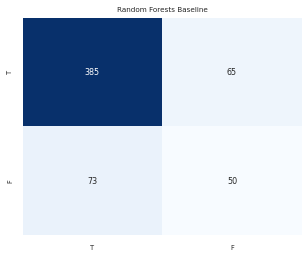

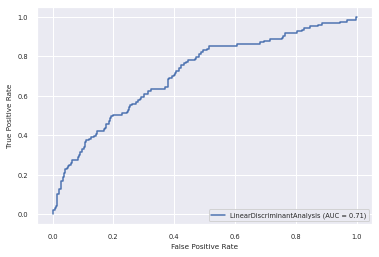

This is the starting index: 574 of patient 1
0.7081545064377682
[([0], 0, array([0.53973127, 0.46026873])), ([0], 1, array([0.43431795, 0.56568205])), ([0], 0, array([0.67192824, 0.32807176])), ([0], 1, array([0.32418618, 0.67581382])), ([0], 1, array([0.49868078, 0.50131922])), ([0], 0, array([0.56119259, 0.43880741])), ([1], 1, array([0.29835046, 0.70164954])), ([0], 0, array([0.53461798, 0.46538202])), ([0], 0, array([0.62089123, 0.37910877])), ([0], 1, array([0.29515194, 0.70484806])), ([0], 1, array([0.49555517, 0.50444483])), ([0], 1, array([0.39944155, 0.60055845])), ([1], 1, array([0.3793303, 0.6206697])), ([0], 0, array([0.54368794, 0.45631206])), ([0], 0, array([0.63724166, 0.36275834])), ([0], 0, array([0.73103222, 0.26896778])), ([0], 0, array([0.5177896, 0.4822104])), ([0], 0, array([0.76845882, 0.23154118])), ([1], 0, array([0.50622413, 0.49377587])), ([0], 0, array([0.69303723, 0.30696277])), ([1], 1, array([0.17113987, 0.82886013])), ([0], 0, array([0.71254574, 0.287454

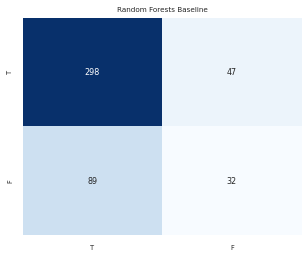

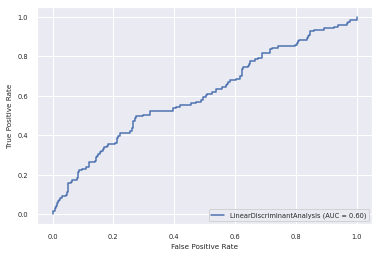

This is the starting index: 1041 of patient 2
0.35494880546075086
[([1], 1, array([0.40433807, 0.59566193])), ([0], 1, array([0.22703113, 0.77296887])), ([0], 1, array([0.15868578, 0.84131422])), ([1], 1, array([0.12584993, 0.87415007])), ([0], 1, array([0.1314954, 0.8685046])), ([0], 1, array([0.23236204, 0.76763796])), ([0], 1, array([0.07421786, 0.92578214])), ([1], 1, array([0.12923265, 0.87076735])), ([1], 1, array([0.21806123, 0.78193877])), ([1], 1, array([0.3498872, 0.6501128])), ([1], 1, array([0.16847285, 0.83152715])), ([1], 1, array([0.29652082, 0.70347918])), ([1], 1, array([0.27040517, 0.72959483])), ([0], 1, array([0.33427675, 0.66572325])), ([1], 1, array([0.38796472, 0.61203528])), ([1], 0, array([0.52389653, 0.47610347])), ([0], 1, array([0.31919424, 0.68080576])), ([0], 1, array([0.21062389, 0.78937611])), ([0], 1, array([0.19319397, 0.80680603])), ([0], 0, array([0.6071931, 0.3928069])), ([0], 1, array([0.06435298, 0.93564702])), ([0], 1, array([0.43423653, 0.565763

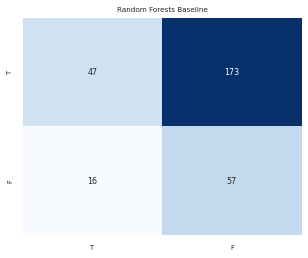

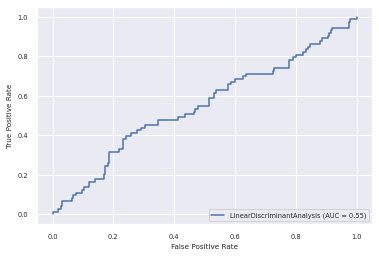

This is the starting index: 1335 of patient 3
0.6402116402116402
[([0], 0, array([0.53745276, 0.46254724])), ([1], 1, array([0.33777581, 0.66222419])), ([1], 1, array([0.47189869, 0.52810131])), ([1], 1, array([0.43430965, 0.56569035])), ([1], 1, array([0.17924077, 0.82075923])), ([1], 0, array([0.56927113, 0.43072887])), ([1], 0, array([0.56958262, 0.43041738])), ([0], 1, array([0.44408204, 0.55591796])), ([0], 0, array([0.55586988, 0.44413012])), ([0], 0, array([0.58917364, 0.41082636])), ([0], 1, array([0.41061786, 0.58938214])), ([0], 1, array([0.38385392, 0.61614608])), ([0], 0, array([0.65394688, 0.34605312])), ([1], 1, array([0.45872792, 0.54127208])), ([0], 0, array([0.57836113, 0.42163887])), ([0], 1, array([0.46318115, 0.53681885])), ([0], 0, array([0.55580282, 0.44419718])), ([0], 1, array([0.23805336, 0.76194664])), ([0], 1, array([0.46811313, 0.53188687])), ([0], 0, array([0.77613549, 0.22386451])), ([0], 0, array([0.59369019, 0.40630981])), ([0], 1, array([0.4084274, 0.59

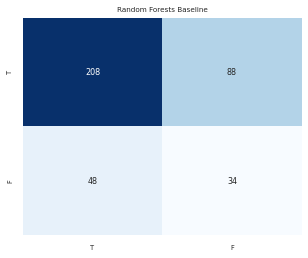

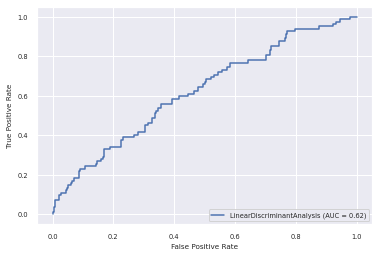

This is the starting index: 1714 of patient 4
0.1760797342192691
[([1], 0, array([0.52145974, 0.47854026])), ([1], 0, array([0.62512286, 0.37487714])), ([1], 0, array([0.65560799, 0.34439201])), ([1], 1, array([0.46948206, 0.53051794])), ([1], 0, array([0.51149988, 0.48850012])), ([1], 0, array([0.5745478, 0.4254522])), ([1], 0, array([0.57048265, 0.42951735])), ([1], 0, array([0.59869616, 0.40130384])), ([1], 0, array([0.7569312, 0.2430688])), ([1], 1, array([0.38912325, 0.61087675])), ([1], 0, array([0.65812232, 0.34187768])), ([1], 0, array([0.65861123, 0.34138877])), ([1], 0, array([0.51007121, 0.48992879])), ([1], 1, array([0.44818711, 0.55181289])), ([1], 0, array([0.54542731, 0.45457269])), ([1], 0, array([0.57371766, 0.42628234])), ([1], 0, array([0.66528055, 0.33471945])), ([1], 0, array([0.57524185, 0.42475815])), ([1], 0, array([0.60301107, 0.39698893])), ([1], 0, array([0.59083342, 0.40916658])), ([1], 0, array([0.60988164, 0.39011836])), ([1], 0, array([0.63528457, 0.36471

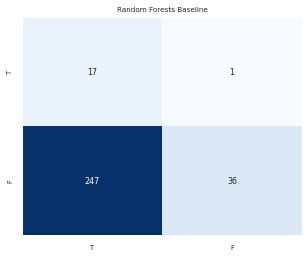

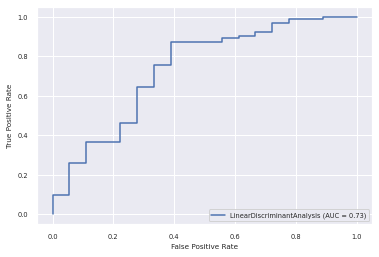

This is the starting index: 2016 of patient 5
0.328159645232816
[([0], 0, array([0.63477862, 0.36522138])), ([0], 0, array([0.79163689, 0.20836311])), ([0], 0, array([0.64589827, 0.35410173])), ([0], 0, array([0.81424517, 0.18575483])), ([0], 0, array([0.81272514, 0.18727486])), ([0], 0, array([0.7855189, 0.2144811])), ([1], 0, array([0.70168708, 0.29831292])), ([1], 0, array([0.82633952, 0.17366048])), ([1], 0, array([0.72707937, 0.27292063])), ([1], 0, array([0.6823452, 0.3176548])), ([0], 0, array([0.73484311, 0.26515689])), ([1], 0, array([0.7981897, 0.2018103])), ([0], 0, array([0.73481316, 0.26518684])), ([1], 0, array([0.70560862, 0.29439138])), ([1], 0, array([0.83087329, 0.16912671])), ([1], 0, array([0.52596116, 0.47403884])), ([1], 0, array([0.57207192, 0.42792808])), ([1], 0, array([0.69400721, 0.30599279])), ([1], 0, array([0.73086036, 0.26913964])), ([1], 0, array([0.73848878, 0.26151122])), ([1], 1, array([0.40289042, 0.59710958])), ([1], 0, array([0.70604849, 0.29395151

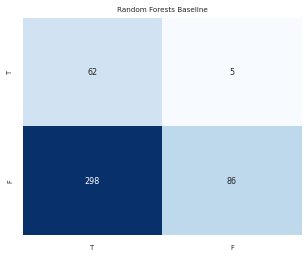

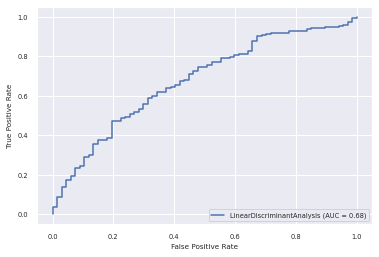

This is the starting index: 2468 of patient 6
0.46981627296587924
[([1], 1, array([0.42734272, 0.57265728])), ([1], 1, array([0.43345804, 0.56654196])), ([1], 1, array([0.45755506, 0.54244494])), ([1], 0, array([0.62166908, 0.37833092])), ([1], 0, array([0.56268404, 0.43731596])), ([1], 0, array([0.67454903, 0.32545097])), ([1], 1, array([0.39153842, 0.60846158])), ([1], 0, array([0.84080292, 0.15919708])), ([1], 0, array([0.51219059, 0.48780941])), ([1], 0, array([0.64221226, 0.35778774])), ([0], 0, array([0.7867524, 0.2132476])), ([1], 1, array([0.17004838, 0.82995162])), ([1], 0, array([0.70701818, 0.29298182])), ([1], 1, array([0.21082548, 0.78917452])), ([1], 0, array([0.50706483, 0.49293517])), ([1], 1, array([0.32346664, 0.67653336])), ([1], 1, array([0.07357393, 0.92642607])), ([1], 1, array([0.46945852, 0.53054148])), ([1], 0, array([0.53659936, 0.46340064])), ([0], 0, array([0.95535005, 0.04464995])), ([1], 0, array([0.6927705, 0.3072295])), ([1], 0, array([0.54914179, 0.4508

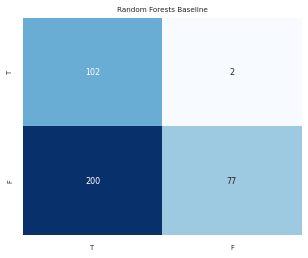

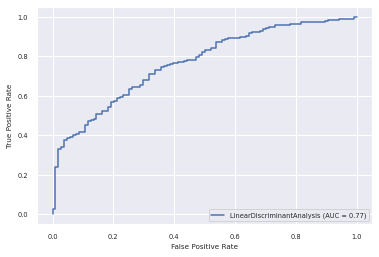

This is the starting index: 2850 of patient 7
0.7835051546391752
[([0], 1, array([0.46537178, 0.53462822])), ([0], 0, array([0.53226715, 0.46773285])), ([0], 0, array([0.59077108, 0.40922892])), ([0], 0, array([0.59408669, 0.40591331])), ([0], 1, array([0.46686459, 0.53313541])), ([0], 0, array([0.59177055, 0.40822945])), ([0], 1, array([0.3904021, 0.6095979])), ([0], 0, array([0.79180992, 0.20819008])), ([0], 0, array([0.52583621, 0.47416379])), ([0], 0, array([0.6162673, 0.3837327])), ([0], 0, array([0.75240476, 0.24759524])), ([0], 1, array([0.35771467, 0.64228533])), ([0], 1, array([0.23160865, 0.76839135])), ([0], 1, array([0.33168206, 0.66831794])), ([0], 0, array([0.54574922, 0.45425078])), ([0], 0, array([0.8338715, 0.1661285])), ([0], 0, array([0.67615488, 0.32384512])), ([0], 0, array([0.55521523, 0.44478477])), ([0], 0, array([0.59030101, 0.40969899])), ([0], 0, array([0.76858035, 0.23141965])), ([0], 0, array([0.50611143, 0.49388857])), ([0], 0, array([0.6954282, 0.3045718]

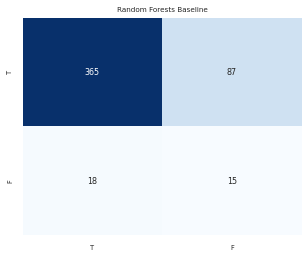

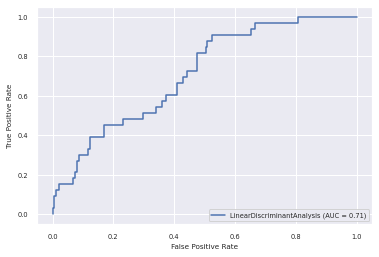

This is the starting index: 3336 of patient 8
0.5951557093425606
[([1], 0, array([0.67061642, 0.32938358])), ([1], 0, array([0.56708085, 0.43291915])), ([0], 0, array([0.7884211, 0.2115789])), ([1], 0, array([0.81356709, 0.18643291])), ([1], 0, array([0.66453917, 0.33546083])), ([1], 1, array([0.34607255, 0.65392745])), ([1], 0, array([0.52056196, 0.47943804])), ([1], 0, array([0.54117842, 0.45882158])), ([1], 0, array([0.58438004, 0.41561996])), ([1], 1, array([0.36579956, 0.63420044])), ([0], 0, array([0.70644229, 0.29355771])), ([1], 0, array([0.6249299, 0.3750701])), ([0], 0, array([0.73578397, 0.26421603])), ([1], 0, array([0.56367064, 0.43632936])), ([1], 1, array([0.29993179, 0.70006821])), ([0], 0, array([0.82843298, 0.17156702])), ([0], 0, array([0.52123345, 0.47876655])), ([1], 0, array([0.83431266, 0.16568734])), ([1], 1, array([0.44992669, 0.55007331])), ([1], 0, array([0.69943149, 0.30056851])), ([1], 1, array([0.33989201, 0.66010799])), ([0], 1, array([0.32501808, 0.67498

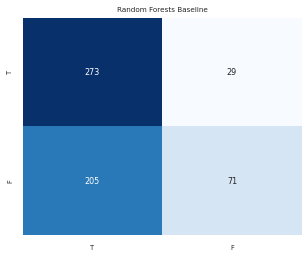

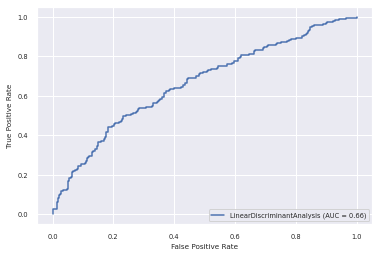

This is the starting index: 3915 of patient 9
0.5339285714285714
[([1], 1, array([0.30827779, 0.69172221])), ([1], 1, array([0.45219494, 0.54780506])), ([1], 1, array([0.29218959, 0.70781041])), ([1], 1, array([0.41865814, 0.58134186])), ([1], 1, array([0.35491895, 0.64508105])), ([1], 1, array([0.42260577, 0.57739423])), ([1], 1, array([0.47894136, 0.52105864])), ([1], 1, array([0.46011713, 0.53988287])), ([1], 1, array([0.41800517, 0.58199483])), ([1], 1, array([0.34736715, 0.65263285])), ([1], 0, array([0.52200318, 0.47799682])), ([1], 1, array([0.37205662, 0.62794338])), ([1], 1, array([0.49947486, 0.50052514])), ([1], 1, array([0.35215867, 0.64784133])), ([1], 1, array([0.40496252, 0.59503748])), ([1], 0, array([0.56041001, 0.43958999])), ([1], 1, array([0.3793716, 0.6206284])), ([1], 1, array([0.37712529, 0.62287471])), ([1], 1, array([0.34463827, 0.65536173])), ([1], 0, array([0.56055469, 0.43944531])), ([1], 1, array([0.40443354, 0.59556646])), ([1], 1, array([0.47131359, 0.528

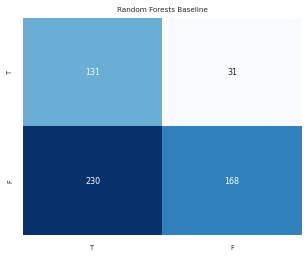

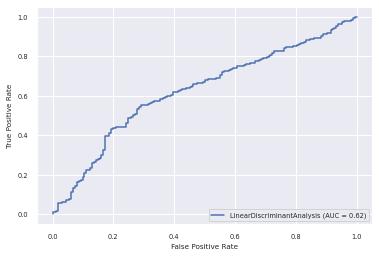

This is the starting index: 4476 of patient 10
0.8552875695732839
[([0], 0, array([0.53088411, 0.46911589])), ([0], 0, array([0.5540835, 0.4459165])), ([0], 0, array([0.57239824, 0.42760176])), ([0], 0, array([0.55181376, 0.44818624])), ([0], 0, array([0.61613802, 0.38386198])), ([0], 0, array([0.52306325, 0.47693675])), ([1], 0, array([0.5647269, 0.4352731])), ([1], 0, array([0.58959457, 0.41040543])), ([0], 0, array([0.63208462, 0.36791538])), ([0], 0, array([0.60055593, 0.39944407])), ([1], 0, array([0.50327165, 0.49672835])), ([1], 0, array([0.63392972, 0.36607028])), ([1], 0, array([0.79925233, 0.20074767])), ([0], 0, array([0.66811819, 0.33188181])), ([0], 0, array([0.73945225, 0.26054775])), ([0], 0, array([0.7614308, 0.2385692])), ([0], 0, array([0.67971443, 0.32028557])), ([0], 0, array([0.63137469, 0.36862531])), ([1], 0, array([0.54381403, 0.45618597])), ([0], 0, array([0.65719094, 0.34280906])), ([1], 0, array([0.86104128, 0.13895872])), ([0], 1, array([0.45730945, 0.542690

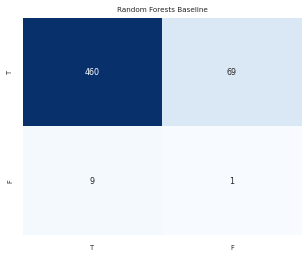

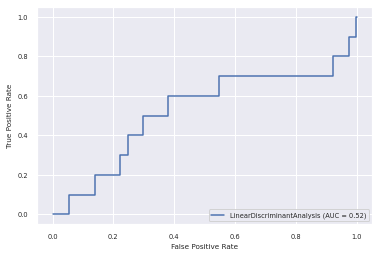

This is the starting index: 5016 of patient 11
0.6883116883116883
[([0], 1, array([0.41501239, 0.58498761])), ([0], 0, array([0.55673583, 0.44326417])), ([0], 0, array([0.52586379, 0.47413621])), ([0], 1, array([0.47521678, 0.52478322])), ([0], 1, array([0.36721876, 0.63278124])), ([0], 1, array([0.46827631, 0.53172369])), ([0], 1, array([0.32543249, 0.67456751])), ([0], 1, array([0.418771, 0.581229])), ([0], 0, array([0.57767761, 0.42232239])), ([0], 0, array([0.75695668, 0.24304332])), ([0], 0, array([0.66641291, 0.33358709])), ([0], 0, array([0.62632695, 0.37367305])), ([0], 0, array([0.65821654, 0.34178346])), ([1], 0, array([0.66504183, 0.33495817])), ([0], 0, array([0.57645088, 0.42354912])), ([1], 0, array([0.71172961, 0.28827039])), ([0], 0, array([0.7654082, 0.2345918])), ([0], 0, array([0.5760094, 0.4239906])), ([0], 0, array([0.59960704, 0.40039296])), ([1], 0, array([0.64376282, 0.35623718])), ([0], 0, array([0.6605947, 0.3394053])), ([0], 0, array([0.68086304, 0.31913696])

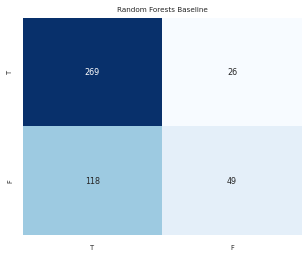

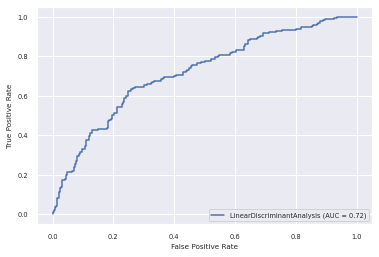

This is the starting index: 5479 of patient 12
0.6705882352941176
[([0], 0, array([0.55576154, 0.44423846])), ([0], 0, array([0.53706689, 0.46293311])), ([0], 1, array([0.48468843, 0.51531157])), ([0], 1, array([0.48658625, 0.51341375])), ([0], 0, array([0.57567059, 0.42432941])), ([0], 0, array([0.50681214, 0.49318786])), ([0], 0, array([0.55762204, 0.44237796])), ([0], 0, array([0.52316778, 0.47683222])), ([0], 1, array([0.44597259, 0.55402741])), ([0], 0, array([0.54173333, 0.45826667])), ([0], 0, array([0.50335695, 0.49664305])), ([0], 0, array([0.57996508, 0.42003492])), ([0], 0, array([0.58202205, 0.41797795])), ([0], 0, array([0.54149167, 0.45850833])), ([0], 0, array([0.51282783, 0.48717217])), ([0], 0, array([0.52179732, 0.47820268])), ([0], 0, array([0.5204948, 0.4795052])), ([0], 0, array([0.66801853, 0.33198147])), ([0], 0, array([0.56484198, 0.43515802])), ([0], 0, array([0.5682822, 0.4317178])), ([0], 0, array([0.69658654, 0.30341346])), ([0], 0, array([0.5405793, 0.45942

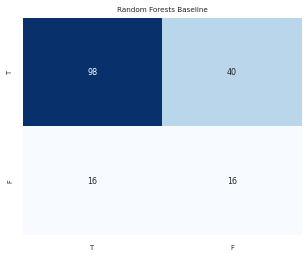

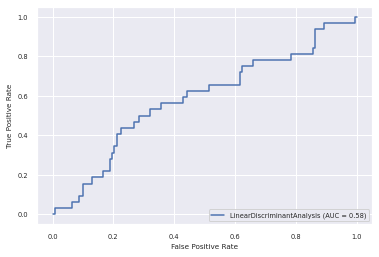

<function matplotlib.pyplot.show>

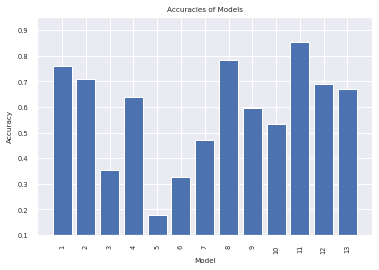

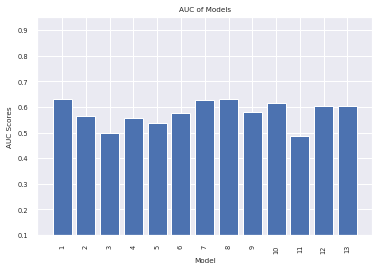

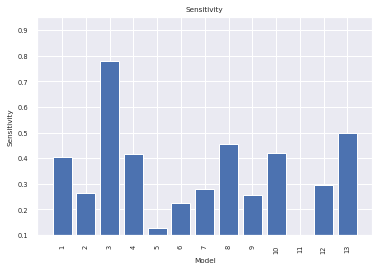

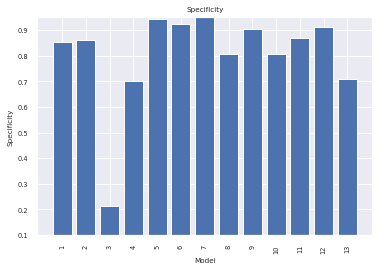

In [38]:
Accuracy = []
auc =[]
sensitivity = []
specificity = []
clf = LinearDiscriminantAnalysis(shrinkage= 'auto', solver= 'lsqr')

for i in range(0,13):
    test, train, test_class, train_class = leave_one_out(df,i)
    clf.fit(train, train_class.ravel())

    y_predicted = clf.predict(test)
    print(metrics.accuracy_score(test_class,y_predicted))
        # print("Random Forest:\n",metrics.classification_report(test_class,y_predicted)) # Classification report
    Accuracy.append(metrics.accuracy_score(test_class,y_predicted))
    auc.append(metrics.roc_auc_score(test_class,y_predicted))
    mcm = confusion_matrix(test_class,y_predicted)
    tn = mcm[0, 0]
    tp = mcm[1, 1]
    fn = mcm[1, 0]
    fp = mcm[0, 1]
    sensitivity.append(tp / (tp + fn))
    specificity.append(tn / (tn + fp))
    pred = clf.predict_proba(test)
    result = [*zip(test_class.tolist(), y_predicted, pred)]
    print(result)
    report = metrics.classification_report(test_class.tolist(), y_predicted)
    matrix = metrics.confusion_matrix(test_class.tolist(),y_predicted)   

    fig, (ax1) = plt.subplots(1, figsize=(5, 4))


    df_cm1 = pd.DataFrame(matrix, range(2), range(2))
    sn.set(font_scale=0.6) # for label size
    sn.heatmap(df_cm1, annot=True,annot_kws={"size": 8}, fmt='g', cmap='Blues', cbar= False, xticklabels=x_axis_labels, yticklabels=y_axis_labels, ax = ax1) # font size


    ax1.set_title('Random Forests Baseline')

    plt.show()
    metrics.plot_roc_curve(clf, test, test_class.tolist())  # doctest: +SKIP
    plt.show()

Model=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13']

Index = [1,2,3,4,5,6,7,8,9,10,11,12,13]
fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,Accuracy)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Accuracy')
plt.xlabel('Model')
plt.title('Accuracies of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,auc)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('AUC Scores')
plt.xlabel('Model')
plt.title('AUC of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,sensitivity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Sensitivity')
plt.xlabel('Model')
plt.title('Sensitivity')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,specificity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Specificity')
plt.xlabel('Model')
plt.title('Specificity')
plt.show

#### Low Variance

This is the starting index: 0 of patient 0
0.7556719022687609
[([1], 1, array([0.26717886, 0.73282114])), ([1], 1, array([0.49431259, 0.50568741])), ([0], 1, array([0.47422467, 0.52577533])), ([1], 0, array([0.59139669, 0.40860331])), ([1], 1, array([0.29348308, 0.70651692])), ([0], 0, array([0.55958998, 0.44041002])), ([1], 0, array([0.84955929, 0.15044071])), ([0], 0, array([0.57704178, 0.42295822])), ([1], 1, array([0.29047493, 0.70952507])), ([0], 1, array([0.26547639, 0.73452361])), ([0], 0, array([0.54909413, 0.45090587])), ([1], 1, array([0.36204666, 0.63795334])), ([1], 1, array([0.37010988, 0.62989012])), ([0], 0, array([0.70296924, 0.29703076])), ([1], 0, array([0.52043048, 0.47956952])), ([1], 1, array([0.39080759, 0.60919241])), ([1], 1, array([0.35410808, 0.64589192])), ([1], 0, array([0.53118463, 0.46881537])), ([1], 1, array([0.44913334, 0.55086666])), ([1], 1, array([0.44540851, 0.55459149])), ([0], 0, array([0.60337966, 0.39662034])), ([1], 1, array([0.4270111, 0.57298

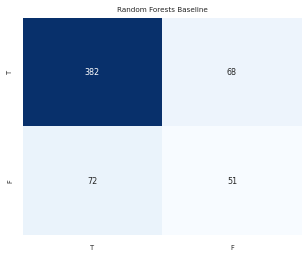

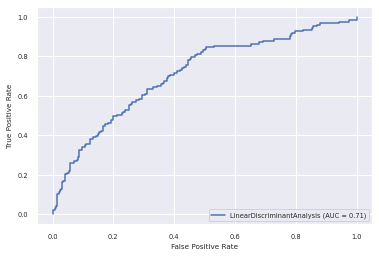

This is the starting index: 574 of patient 1
0.721030042918455
[([0], 0, array([0.5334334, 0.4665666])), ([0], 1, array([0.42523619, 0.57476381])), ([0], 0, array([0.6754194, 0.3245806])), ([0], 1, array([0.30107062, 0.69892938])), ([0], 0, array([0.50517406, 0.49482594])), ([0], 0, array([0.55148286, 0.44851714])), ([1], 1, array([0.29905145, 0.70094855])), ([0], 0, array([0.5248116, 0.4751884])), ([0], 0, array([0.61776789, 0.38223211])), ([0], 1, array([0.30230069, 0.69769931])), ([0], 1, array([0.49995787, 0.50004213])), ([0], 1, array([0.39556114, 0.60443886])), ([1], 1, array([0.36711126, 0.63288874])), ([0], 0, array([0.54129362, 0.45870638])), ([0], 0, array([0.61888789, 0.38111211])), ([0], 0, array([0.72296181, 0.27703819])), ([0], 0, array([0.50828018, 0.49171982])), ([0], 0, array([0.77798204, 0.22201796])), ([1], 0, array([0.50021563, 0.49978437])), ([0], 0, array([0.69302532, 0.30697468])), ([1], 1, array([0.16817056, 0.83182944])), ([0], 0, array([0.7168914, 0.2831086]))

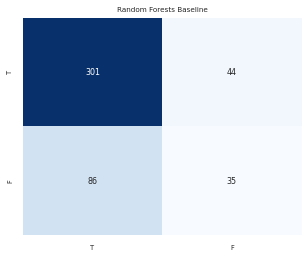

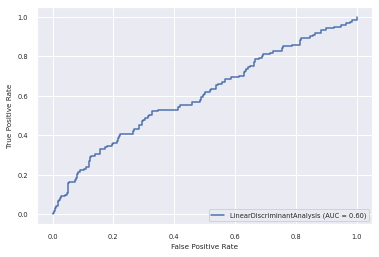

This is the starting index: 1041 of patient 2
0.3515358361774744
[([1], 1, array([0.38245219, 0.61754781])), ([0], 1, array([0.23552344, 0.76447656])), ([0], 1, array([0.16412465, 0.83587535])), ([1], 1, array([0.11336473, 0.88663527])), ([0], 1, array([0.13710505, 0.86289495])), ([0], 1, array([0.24201347, 0.75798653])), ([0], 1, array([0.07568805, 0.92431195])), ([1], 1, array([0.13264496, 0.86735504])), ([1], 1, array([0.22800325, 0.77199675])), ([1], 1, array([0.34214652, 0.65785348])), ([1], 1, array([0.14665716, 0.85334284])), ([1], 1, array([0.28917643, 0.71082357])), ([1], 1, array([0.26270918, 0.73729082])), ([0], 1, array([0.32599176, 0.67400824])), ([1], 1, array([0.37493725, 0.62506275])), ([1], 0, array([0.51651838, 0.48348162])), ([0], 1, array([0.32275461, 0.67724539])), ([0], 1, array([0.21011537, 0.78988463])), ([0], 1, array([0.16391378, 0.83608622])), ([0], 0, array([0.60722058, 0.39277942])), ([0], 1, array([0.06149001, 0.93850999])), ([0], 1, array([0.44885708, 0.5

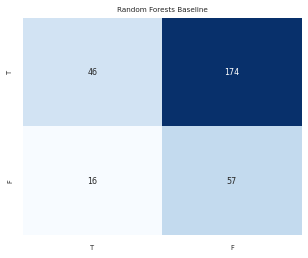

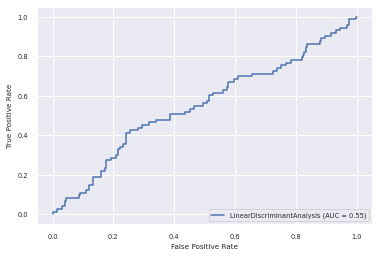

This is the starting index: 1335 of patient 3
0.6243386243386243
[([0], 0, array([0.52697108, 0.47302892])), ([1], 1, array([0.32644783, 0.67355217])), ([1], 1, array([0.44792263, 0.55207737])), ([1], 1, array([0.44618681, 0.55381319])), ([1], 1, array([0.17474521, 0.82525479])), ([1], 0, array([0.54344333, 0.45655667])), ([1], 0, array([0.57095542, 0.42904458])), ([0], 1, array([0.42328099, 0.57671901])), ([0], 0, array([0.53891838, 0.46108162])), ([0], 0, array([0.5939079, 0.4060921])), ([0], 1, array([0.40336959, 0.59663041])), ([0], 1, array([0.3833297, 0.6166703])), ([0], 0, array([0.62841095, 0.37158905])), ([1], 1, array([0.43345274, 0.56654726])), ([0], 0, array([0.55888478, 0.44111522])), ([0], 1, array([0.46495453, 0.53504547])), ([0], 0, array([0.54367154, 0.45632846])), ([0], 1, array([0.26101655, 0.73898345])), ([0], 1, array([0.46534232, 0.53465768])), ([0], 0, array([0.74280714, 0.25719286])), ([0], 0, array([0.57784618, 0.42215382])), ([0], 1, array([0.39554813, 0.60445

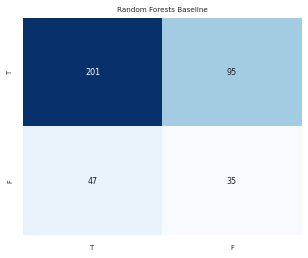

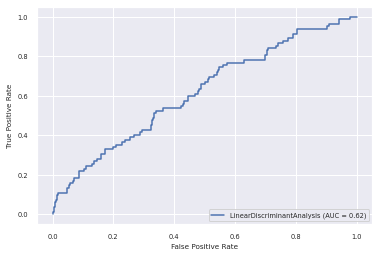

This is the starting index: 1714 of patient 4
0.18604651162790697
[([1], 1, array([0.4888835, 0.5111165])), ([1], 0, array([0.63321885, 0.36678115])), ([1], 0, array([0.65405819, 0.34594181])), ([1], 1, array([0.44704728, 0.55295272])), ([1], 1, array([0.49244738, 0.50755262])), ([1], 0, array([0.57727062, 0.42272938])), ([1], 0, array([0.57675007, 0.42324993])), ([1], 0, array([0.60096489, 0.39903511])), ([1], 0, array([0.75405737, 0.24594263])), ([1], 1, array([0.37295265, 0.62704735])), ([1], 0, array([0.63909493, 0.36090507])), ([1], 0, array([0.64472388, 0.35527612])), ([1], 1, array([0.49962064, 0.50037936])), ([1], 1, array([0.45616976, 0.54383024])), ([1], 0, array([0.53252734, 0.46747266])), ([1], 0, array([0.58035553, 0.41964447])), ([1], 0, array([0.65431451, 0.34568549])), ([1], 0, array([0.56626451, 0.43373549])), ([1], 0, array([0.58292073, 0.41707927])), ([1], 0, array([0.58356917, 0.41643083])), ([1], 0, array([0.61387981, 0.38612019])), ([1], 0, array([0.64247436, 0.35

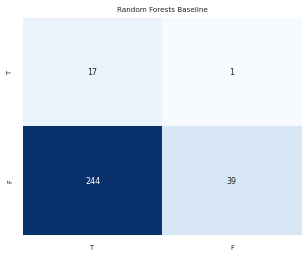

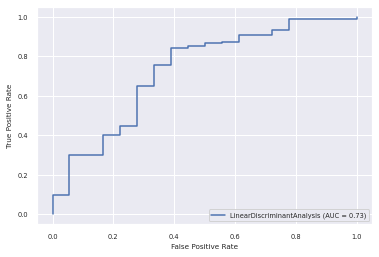

This is the starting index: 2016 of patient 5
0.3325942350332594
[([0], 0, array([0.63494522, 0.36505478])), ([0], 0, array([0.80124731, 0.19875269])), ([0], 0, array([0.63399292, 0.36600708])), ([0], 0, array([0.81617333, 0.18382667])), ([0], 0, array([0.80033507, 0.19966493])), ([0], 0, array([0.79040702, 0.20959298])), ([1], 0, array([0.69462117, 0.30537883])), ([1], 0, array([0.82977344, 0.17022656])), ([1], 0, array([0.71904443, 0.28095557])), ([1], 0, array([0.67835598, 0.32164402])), ([0], 0, array([0.75075848, 0.24924152])), ([1], 0, array([0.80086516, 0.19913484])), ([0], 0, array([0.7230839, 0.2769161])), ([1], 0, array([0.69643623, 0.30356377])), ([1], 0, array([0.82973222, 0.17026778])), ([1], 0, array([0.50898664, 0.49101336])), ([1], 0, array([0.56457566, 0.43542434])), ([1], 0, array([0.68491243, 0.31508757])), ([1], 0, array([0.7317202, 0.2682798])), ([1], 0, array([0.73886633, 0.26113367])), ([1], 1, array([0.39338546, 0.60661454])), ([1], 0, array([0.70655965, 0.29344

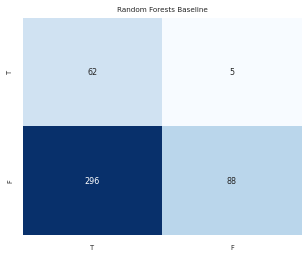

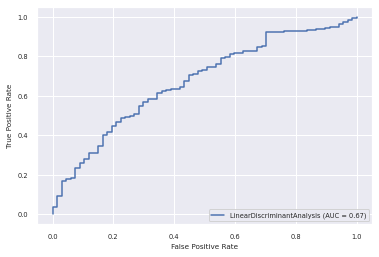

This is the starting index: 2468 of patient 6
0.47506561679790027
[([1], 1, array([0.39388456, 0.60611544])), ([1], 1, array([0.427215, 0.572785])), ([1], 1, array([0.46840947, 0.53159053])), ([1], 0, array([0.62329526, 0.37670474])), ([1], 0, array([0.58395023, 0.41604977])), ([1], 0, array([0.67387612, 0.32612388])), ([1], 1, array([0.37991445, 0.62008555])), ([1], 0, array([0.84517863, 0.15482137])), ([1], 0, array([0.50112835, 0.49887165])), ([1], 0, array([0.64613346, 0.35386654])), ([0], 0, array([0.78943774, 0.21056226])), ([1], 1, array([0.16288689, 0.83711311])), ([1], 0, array([0.71356522, 0.28643478])), ([1], 1, array([0.19332468, 0.80667532])), ([1], 1, array([0.49146972, 0.50853028])), ([1], 1, array([0.32184383, 0.67815617])), ([1], 1, array([0.06658334, 0.93341666])), ([1], 1, array([0.44860372, 0.55139628])), ([1], 0, array([0.52518574, 0.47481426])), ([0], 0, array([0.94786495, 0.05213505])), ([1], 0, array([0.68773218, 0.31226782])), ([1], 0, array([0.54940567, 0.4505

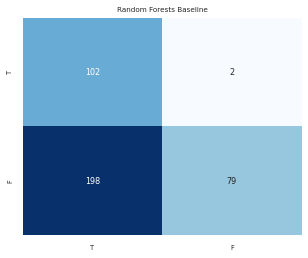

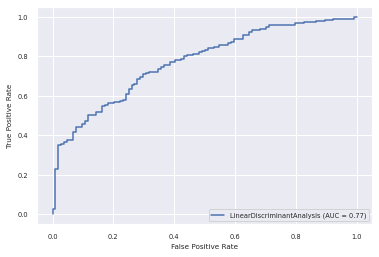

This is the starting index: 2850 of patient 7
0.7938144329896907
[([0], 1, array([0.47381237, 0.52618763])), ([0], 0, array([0.52996426, 0.47003574])), ([0], 0, array([0.60034725, 0.39965275])), ([0], 0, array([0.59435944, 0.40564056])), ([0], 1, array([0.4810889, 0.5189111])), ([0], 0, array([0.60764007, 0.39235993])), ([0], 1, array([0.40213308, 0.59786692])), ([0], 0, array([0.79776232, 0.20223768])), ([0], 0, array([0.53812456, 0.46187544])), ([0], 0, array([0.63323767, 0.36676233])), ([0], 0, array([0.75801368, 0.24198632])), ([0], 1, array([0.35439202, 0.64560798])), ([0], 1, array([0.22023401, 0.77976599])), ([0], 1, array([0.32874286, 0.67125714])), ([0], 0, array([0.55774854, 0.44225146])), ([0], 0, array([0.85215826, 0.14784174])), ([0], 0, array([0.68817364, 0.31182636])), ([0], 0, array([0.52572908, 0.47427092])), ([0], 0, array([0.58813721, 0.41186279])), ([0], 0, array([0.76658604, 0.23341396])), ([0], 0, array([0.51881066, 0.48118934])), ([0], 0, array([0.6931552, 0.3068

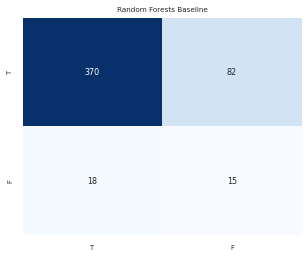

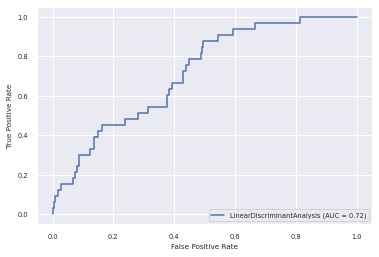

This is the starting index: 3336 of patient 8
0.5899653979238755
[([1], 0, array([0.66131979, 0.33868021])), ([1], 0, array([0.57459365, 0.42540635])), ([0], 0, array([0.79016325, 0.20983675])), ([1], 0, array([0.82583973, 0.17416027])), ([1], 0, array([0.67318965, 0.32681035])), ([1], 1, array([0.34060064, 0.65939936])), ([1], 0, array([0.50764335, 0.49235665])), ([1], 0, array([0.54171038, 0.45828962])), ([1], 0, array([0.57655228, 0.42344772])), ([1], 1, array([0.36045567, 0.63954433])), ([0], 0, array([0.71619524, 0.28380476])), ([1], 0, array([0.6393993, 0.3606007])), ([0], 0, array([0.74261988, 0.25738012])), ([1], 0, array([0.5436201, 0.4563799])), ([1], 1, array([0.28249655, 0.71750345])), ([0], 0, array([0.84325601, 0.15674399])), ([0], 0, array([0.52439069, 0.47560931])), ([1], 0, array([0.81449706, 0.18550294])), ([1], 1, array([0.47155172, 0.52844828])), ([1], 0, array([0.67780842, 0.32219158])), ([1], 1, array([0.32023414, 0.67976586])), ([0], 1, array([0.30406746, 0.69593

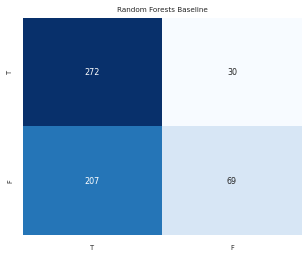

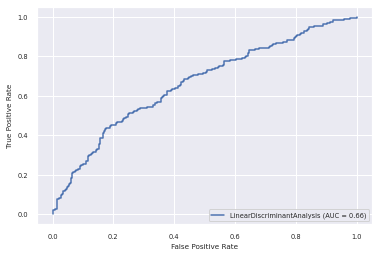

This is the starting index: 3915 of patient 9
0.5339285714285714
[([1], 1, array([0.30362034, 0.69637966])), ([1], 1, array([0.43685302, 0.56314698])), ([1], 1, array([0.27386096, 0.72613904])), ([1], 1, array([0.41856642, 0.58143358])), ([1], 1, array([0.35124762, 0.64875238])), ([1], 1, array([0.40426076, 0.59573924])), ([1], 1, array([0.49089191, 0.50910809])), ([1], 1, array([0.45037316, 0.54962684])), ([1], 1, array([0.40132405, 0.59867595])), ([1], 1, array([0.3131308, 0.6868692])), ([1], 0, array([0.53503575, 0.46496425])), ([1], 1, array([0.3639517, 0.6360483])), ([1], 1, array([0.49235378, 0.50764622])), ([1], 1, array([0.35249901, 0.64750099])), ([1], 1, array([0.37248744, 0.62751256])), ([1], 0, array([0.57343993, 0.42656007])), ([1], 1, array([0.39735753, 0.60264247])), ([1], 1, array([0.33459059, 0.66540941])), ([1], 1, array([0.32258717, 0.67741283])), ([1], 0, array([0.55806866, 0.44193134])), ([1], 1, array([0.39082685, 0.60917315])), ([1], 1, array([0.47939556, 0.52060

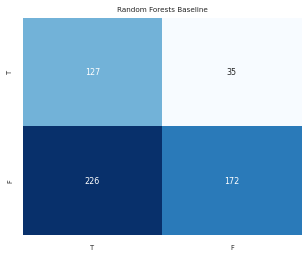

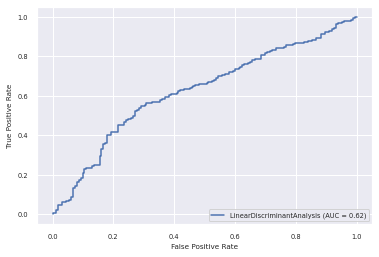

This is the starting index: 4476 of patient 10
0.8385899814471243
[([0], 0, array([0.53949456, 0.46050544])), ([0], 0, array([0.55449858, 0.44550142])), ([0], 0, array([0.58830102, 0.41169898])), ([0], 0, array([0.55936511, 0.44063489])), ([0], 0, array([0.6219275, 0.3780725])), ([0], 0, array([0.53443892, 0.46556108])), ([1], 0, array([0.56071549, 0.43928451])), ([1], 0, array([0.58859278, 0.41140722])), ([0], 0, array([0.66578384, 0.33421616])), ([0], 0, array([0.62686756, 0.37313244])), ([1], 0, array([0.50607832, 0.49392168])), ([1], 0, array([0.63978787, 0.36021213])), ([1], 0, array([0.80867479, 0.19132521])), ([0], 0, array([0.66335537, 0.33664463])), ([0], 0, array([0.74704657, 0.25295343])), ([0], 0, array([0.7888, 0.2112])), ([0], 0, array([0.66189937, 0.33810063])), ([0], 0, array([0.65222041, 0.34777959])), ([1], 0, array([0.54862314, 0.45137686])), ([0], 0, array([0.65492141, 0.34507859])), ([1], 0, array([0.85639798, 0.14360202])), ([0], 1, array([0.45833531, 0.54166469])

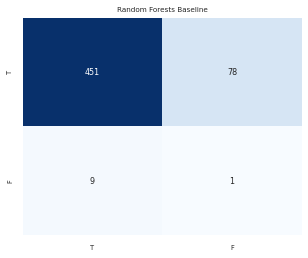

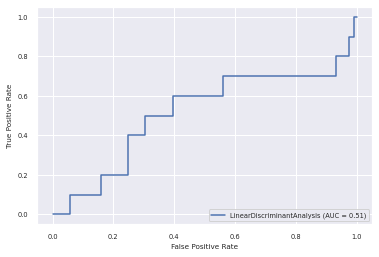

This is the starting index: 5016 of patient 11
0.696969696969697
[([0], 1, array([0.40835854, 0.59164146])), ([0], 0, array([0.5762674, 0.4237326])), ([0], 0, array([0.52482715, 0.47517285])), ([0], 1, array([0.46007257, 0.53992743])), ([0], 1, array([0.37296356, 0.62703644])), ([0], 1, array([0.46074254, 0.53925746])), ([0], 1, array([0.34081469, 0.65918531])), ([0], 1, array([0.41302323, 0.58697677])), ([0], 0, array([0.55292502, 0.44707498])), ([0], 0, array([0.77039049, 0.22960951])), ([0], 0, array([0.62514749, 0.37485251])), ([0], 0, array([0.62748749, 0.37251251])), ([0], 0, array([0.66159304, 0.33840696])), ([1], 0, array([0.64988741, 0.35011259])), ([0], 0, array([0.58907798, 0.41092202])), ([1], 0, array([0.7330704, 0.2669296])), ([0], 0, array([0.77547353, 0.22452647])), ([0], 0, array([0.58514827, 0.41485173])), ([0], 0, array([0.60201537, 0.39798463])), ([1], 0, array([0.64561269, 0.35438731])), ([0], 0, array([0.66080863, 0.33919137])), ([0], 0, array([0.66913329, 0.33086

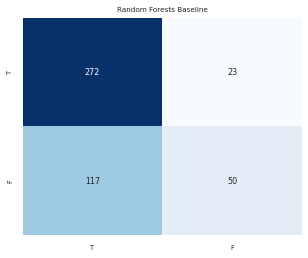

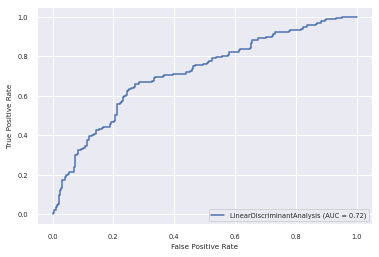

This is the starting index: 5479 of patient 12
0.6705882352941176
[([0], 0, array([0.56747425, 0.43252575])), ([0], 0, array([0.5446633, 0.4553367])), ([0], 1, array([0.48716889, 0.51283111])), ([0], 1, array([0.48871545, 0.51128455])), ([0], 0, array([0.57315442, 0.42684558])), ([0], 1, array([0.49700037, 0.50299963])), ([0], 0, array([0.55153477, 0.44846523])), ([0], 0, array([0.52937397, 0.47062603])), ([0], 1, array([0.44238847, 0.55761153])), ([0], 0, array([0.54152059, 0.45847941])), ([0], 0, array([0.51303257, 0.48696743])), ([0], 0, array([0.587056, 0.412944])), ([0], 0, array([0.58367046, 0.41632954])), ([0], 0, array([0.52709491, 0.47290509])), ([0], 0, array([0.51716928, 0.48283072])), ([0], 0, array([0.52697649, 0.47302351])), ([0], 0, array([0.51902167, 0.48097833])), ([0], 0, array([0.67883861, 0.32116139])), ([0], 0, array([0.58095476, 0.41904524])), ([0], 0, array([0.5625526, 0.4374474])), ([0], 0, array([0.70305371, 0.29694629])), ([0], 0, array([0.53767138, 0.46232862

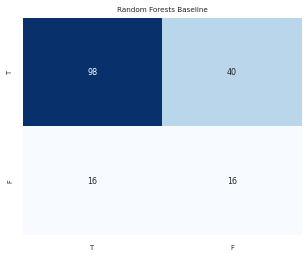

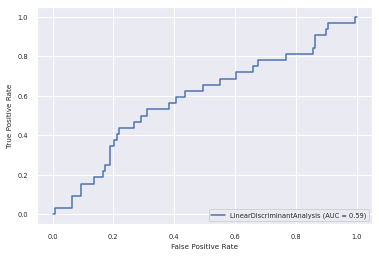

<function matplotlib.pyplot.show>

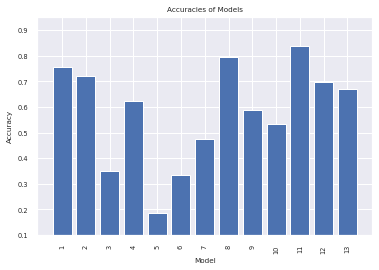

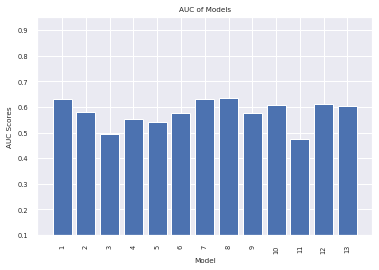

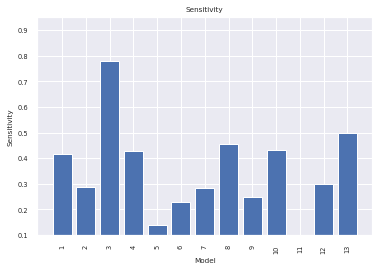

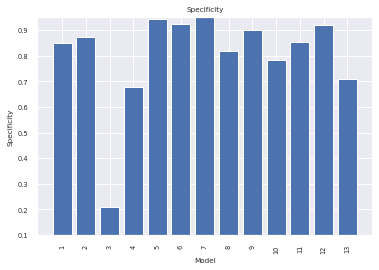

In [39]:
Accuracy = []
auc = []
sensitivity = []
specificity = []
clf = LinearDiscriminantAnalysis()
sel = VarianceThreshold(threshold=(.1 * (1 - .8)))
for i in range(0,13):
    test, train, test_class, train_class = leave_one_out(df,i)
    sel.fit_transform(train)
    sel.fit_transform(test)
    clf.fit(train, train_class.ravel())

    y_predicted = clf.predict(test)
    print(metrics.accuracy_score(test_class,y_predicted))
        # print("Random Forest:\n",metrics.classification_report(test_class,y_predicted)) # Classification report
    Accuracy.append(metrics.accuracy_score(test_class,y_predicted))
    auc.append(metrics.roc_auc_score(test_class,y_predicted))
    mcm = confusion_matrix(test_class,y_predicted)
    tn = mcm[0, 0]
    tp = mcm[1, 1]
    fn = mcm[1, 0]
    fp = mcm[0, 1]
    sensitivity.append(tp / (tp + fn))
    specificity.append(tn / (tn + fp))
    pred = clf.predict_proba(test)
    result = [*zip(test_class.tolist(), y_predicted, pred)]
    print(result)
    report = metrics.classification_report(test_class.tolist(), y_predicted)
    matrix = metrics.confusion_matrix(test_class.tolist(),y_predicted)   

    fig, (ax1) = plt.subplots(1, figsize=(5, 4))


    df_cm1 = pd.DataFrame(matrix, range(2), range(2))
    sn.set(font_scale=0.6) # for label size
    sn.heatmap(df_cm1, annot=True,annot_kws={"size": 8}, fmt='g', cmap='Blues', cbar= False, xticklabels=x_axis_labels, yticklabels=y_axis_labels, ax = ax1) # font size


    ax1.set_title('Random Forests Baseline')

    plt.show()
    metrics.plot_roc_curve(clf, test, test_class.tolist())  # doctest: +SKIP
    plt.show()

Model=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13']

Index = [1,2,3,4,5,6,7,8,9,10,11,12,13]
fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,Accuracy)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Accuracy')
plt.xlabel('Model')
plt.title('Accuracies of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,auc)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('AUC Scores')
plt.xlabel('Model')
plt.title('AUC of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,sensitivity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Sensitivity')
plt.xlabel('Model')
plt.title('Sensitivity')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,specificity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Specificity')
plt.xlabel('Model')
plt.title('Specificity')
plt.show

#### Univariate Feature Selection

#### L1-based feature selection

This is the starting index: 0 of patient 0
0.7417102966841187
[([1], 1, array([0.35981535, 0.64018465])), ([1], 0, array([0.52544443, 0.47455557])), ([0], 1, array([0.47567165, 0.52432835])), ([1], 0, array([0.52039402, 0.47960598])), ([1], 1, array([0.28815058, 0.71184942])), ([0], 0, array([0.548816, 0.451184])), ([1], 0, array([0.68125544, 0.31874456])), ([0], 0, array([0.71007474, 0.28992526])), ([1], 1, array([0.34522767, 0.65477233])), ([0], 1, array([0.2909611, 0.7090389])), ([0], 1, array([0.45638708, 0.54361292])), ([1], 1, array([0.37248337, 0.62751663])), ([1], 1, array([0.40203726, 0.59796274])), ([0], 0, array([0.6787352, 0.3212648])), ([1], 1, array([0.47990698, 0.52009302])), ([1], 1, array([0.41752189, 0.58247811])), ([1], 1, array([0.35546751, 0.64453249])), ([1], 1, array([0.47619916, 0.52380084])), ([1], 1, array([0.40932028, 0.59067972])), ([1], 0, array([0.51344027, 0.48655973])), ([0], 0, array([0.57614799, 0.42385201])), ([1], 1, array([0.42568595, 0.57431405])),

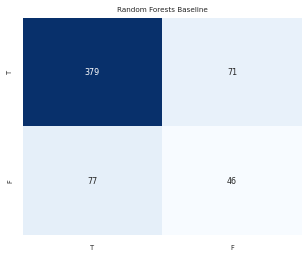

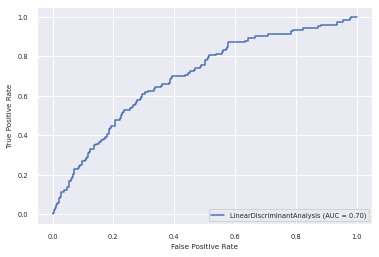

This is the starting index: 574 of patient 1
0.7124463519313304
[([0], 0, array([0.59299681, 0.40700319])), ([0], 0, array([0.51532015, 0.48467985])), ([0], 0, array([0.57635706, 0.42364294])), ([0], 1, array([0.40137197, 0.59862803])), ([0], 1, array([0.45941311, 0.54058689])), ([0], 0, array([0.65807882, 0.34192118])), ([1], 1, array([0.41710858, 0.58289142])), ([0], 0, array([0.54027843, 0.45972157])), ([0], 0, array([0.68526161, 0.31473839])), ([0], 1, array([0.35572842, 0.64427158])), ([0], 0, array([0.53050451, 0.46949549])), ([0], 0, array([0.51735435, 0.48264565])), ([1], 1, array([0.47616076, 0.52383924])), ([0], 0, array([0.59378029, 0.40621971])), ([0], 0, array([0.6401427, 0.3598573])), ([0], 0, array([0.59636815, 0.40363185])), ([0], 0, array([0.58744244, 0.41255756])), ([0], 0, array([0.70807503, 0.29192497])), ([1], 0, array([0.55665714, 0.44334286])), ([0], 0, array([0.76588086, 0.23411914])), ([1], 1, array([0.2812508, 0.7187492])), ([0], 0, array([0.59663667, 0.403363

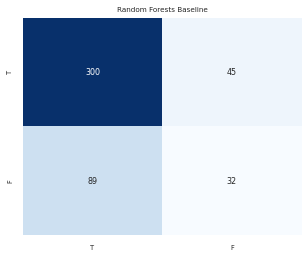

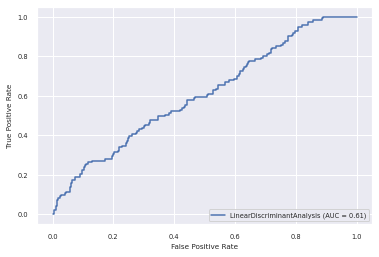

This is the starting index: 1041 of patient 2
0.43686006825938567
[([1], 0, array([0.58700803, 0.41299197])), ([0], 1, array([0.17864567, 0.82135433])), ([0], 1, array([0.18652675, 0.81347325])), ([1], 1, array([0.17480642, 0.82519358])), ([0], 1, array([0.13073518, 0.86926482])), ([0], 1, array([0.20277156, 0.79722844])), ([0], 1, array([0.09180599, 0.90819401])), ([1], 1, array([0.18645221, 0.81354779])), ([1], 1, array([0.1880813, 0.8119187])), ([1], 1, array([0.37295486, 0.62704514])), ([1], 1, array([0.31269494, 0.68730506])), ([1], 1, array([0.32791667, 0.67208333])), ([1], 1, array([0.17820216, 0.82179784])), ([0], 1, array([0.47439584, 0.52560416])), ([1], 1, array([0.42802333, 0.57197667])), ([1], 0, array([0.51126378, 0.48873622])), ([0], 1, array([0.35309988, 0.64690012])), ([0], 1, array([0.17414753, 0.82585247])), ([0], 1, array([0.33741014, 0.66258986])), ([0], 0, array([0.62809347, 0.37190653])), ([0], 1, array([0.18189385, 0.81810615])), ([0], 1, array([0.32005129, 0.67

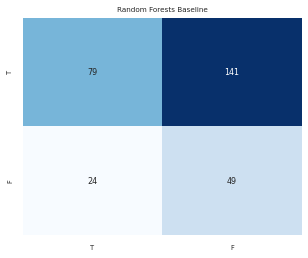

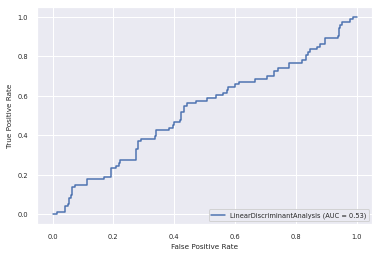

This is the starting index: 1335 of patient 3
0.6587301587301587
[([0], 0, array([0.63944759, 0.36055241])), ([1], 1, array([0.45325758, 0.54674242])), ([1], 0, array([0.53713295, 0.46286705])), ([1], 1, array([0.43260361, 0.56739639])), ([1], 1, array([0.25723631, 0.74276369])), ([1], 0, array([0.68527644, 0.31472356])), ([1], 0, array([0.55720565, 0.44279435])), ([0], 0, array([0.59562094, 0.40437906])), ([0], 0, array([0.60704633, 0.39295367])), ([0], 1, array([0.39983458, 0.60016542])), ([0], 1, array([0.4427783, 0.5572217])), ([0], 1, array([0.46584961, 0.53415039])), ([0], 1, array([0.47312758, 0.52687242])), ([1], 0, array([0.59680261, 0.40319739])), ([0], 1, array([0.45526138, 0.54473862])), ([0], 1, array([0.48404057, 0.51595943])), ([0], 0, array([0.58225352, 0.41774648])), ([0], 1, array([0.18503077, 0.81496923])), ([0], 0, array([0.55698197, 0.44301803])), ([0], 0, array([0.52026562, 0.47973438])), ([0], 0, array([0.71476797, 0.28523203])), ([0], 0, array([0.50212839, 0.497

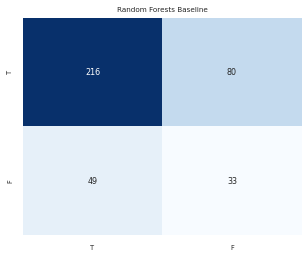

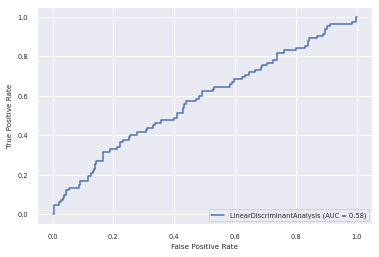

This is the starting index: 1714 of patient 4
0.1461794019933555
[([1], 0, array([0.66795786, 0.33204214])), ([1], 0, array([0.61646756, 0.38353244])), ([1], 0, array([0.70287824, 0.29712176])), ([1], 0, array([0.58217767, 0.41782233])), ([1], 0, array([0.56826882, 0.43173118])), ([1], 0, array([0.60430401, 0.39569599])), ([1], 0, array([0.59898212, 0.40101788])), ([1], 0, array([0.66031306, 0.33968694])), ([1], 0, array([0.63360881, 0.36639119])), ([1], 1, array([0.45278521, 0.54721479])), ([1], 0, array([0.67370928, 0.32629072])), ([1], 0, array([0.7373341, 0.2626659])), ([1], 0, array([0.55152725, 0.44847275])), ([1], 1, array([0.27024731, 0.72975269])), ([1], 0, array([0.57533566, 0.42466434])), ([1], 0, array([0.58783553, 0.41216447])), ([1], 0, array([0.66051361, 0.33948639])), ([1], 0, array([0.70100816, 0.29899184])), ([1], 0, array([0.69259355, 0.30740645])), ([1], 0, array([0.66101555, 0.33898445])), ([1], 0, array([0.69701941, 0.30298059])), ([1], 0, array([0.56353268, 0.436

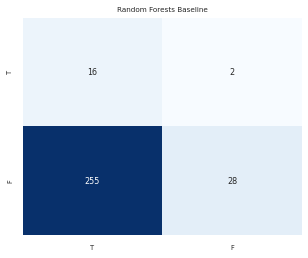

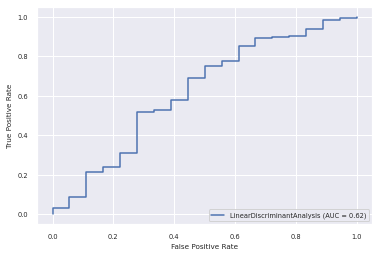

This is the starting index: 2016 of patient 5
0.3215077605321508
[([0], 0, array([0.64926517, 0.35073483])), ([0], 0, array([0.75859915, 0.24140085])), ([0], 0, array([0.70826254, 0.29173746])), ([0], 0, array([0.79017466, 0.20982534])), ([0], 0, array([0.77965846, 0.22034154])), ([0], 0, array([0.75279787, 0.24720213])), ([1], 0, array([0.67119397, 0.32880603])), ([1], 0, array([0.82630998, 0.17369002])), ([1], 0, array([0.75475479, 0.24524521])), ([1], 0, array([0.70451714, 0.29548286])), ([0], 0, array([0.72067014, 0.27932986])), ([1], 0, array([0.80876501, 0.19123499])), ([0], 0, array([0.73701393, 0.26298607])), ([1], 0, array([0.8044037, 0.1955963])), ([1], 0, array([0.76626502, 0.23373498])), ([1], 0, array([0.57844314, 0.42155686])), ([1], 0, array([0.67256856, 0.32743144])), ([1], 0, array([0.66874142, 0.33125858])), ([1], 0, array([0.73889143, 0.26110857])), ([1], 0, array([0.7160526, 0.2839474])), ([1], 1, array([0.46436132, 0.53563868])), ([1], 0, array([0.7334616, 0.266538

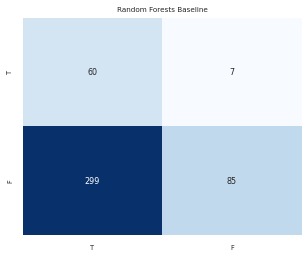

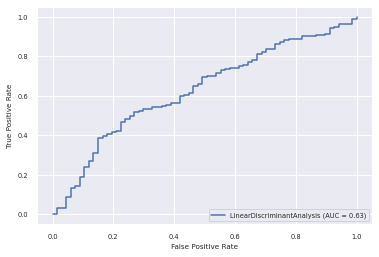

This is the starting index: 2468 of patient 6
0.4068241469816273
[([1], 0, array([0.54555758, 0.45444242])), ([1], 0, array([0.50758219, 0.49241781])), ([1], 1, array([0.39835348, 0.60164652])), ([1], 0, array([0.60657874, 0.39342126])), ([1], 0, array([0.58051952, 0.41948048])), ([1], 0, array([0.62827114, 0.37172886])), ([1], 1, array([0.48642508, 0.51357492])), ([1], 0, array([0.81430086, 0.18569914])), ([1], 0, array([0.63752468, 0.36247532])), ([1], 0, array([0.6694313, 0.3305687])), ([0], 0, array([0.75139905, 0.24860095])), ([1], 0, array([0.56689033, 0.43310967])), ([1], 0, array([0.74519459, 0.25480541])), ([1], 1, array([0.32091817, 0.67908183])), ([1], 0, array([0.75434783, 0.24565217])), ([1], 1, array([0.26221741, 0.73778259])), ([1], 1, array([0.44553452, 0.55446548])), ([1], 0, array([0.60638123, 0.39361877])), ([1], 0, array([0.54025307, 0.45974693])), ([0], 0, array([0.79133385, 0.20866615])), ([1], 0, array([0.69633392, 0.30366608])), ([1], 0, array([0.60178706, 0.398

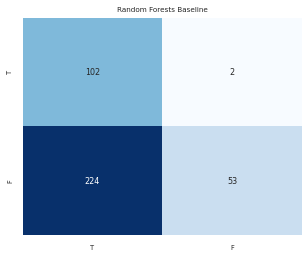

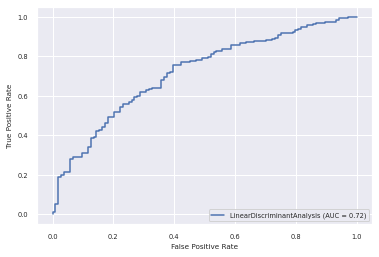

This is the starting index: 2850 of patient 7
0.756701030927835
[([0], 1, array([0.35320077, 0.64679923])), ([0], 1, array([0.47530241, 0.52469759])), ([0], 0, array([0.51745267, 0.48254733])), ([0], 0, array([0.55841654, 0.44158346])), ([0], 1, array([0.41944282, 0.58055718])), ([0], 0, array([0.60128792, 0.39871208])), ([0], 1, array([0.4822216, 0.5177784])), ([0], 0, array([0.79916606, 0.20083394])), ([0], 0, array([0.51003361, 0.48996639])), ([0], 0, array([0.55657917, 0.44342083])), ([0], 0, array([0.7102299, 0.2897701])), ([0], 1, array([0.36106299, 0.63893701])), ([0], 1, array([0.32323626, 0.67676374])), ([0], 1, array([0.30313343, 0.69686657])), ([0], 1, array([0.45202034, 0.54797966])), ([0], 0, array([0.79325213, 0.20674787])), ([0], 0, array([0.65800796, 0.34199204])), ([0], 0, array([0.66561295, 0.33438705])), ([0], 0, array([0.53253184, 0.46746816])), ([0], 0, array([0.69633361, 0.30366639])), ([0], 1, array([0.46802371, 0.53197629])), ([0], 0, array([0.7125416, 0.2874584

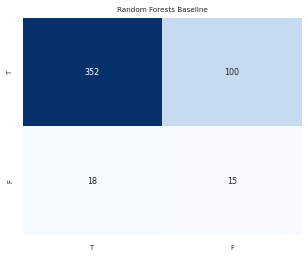

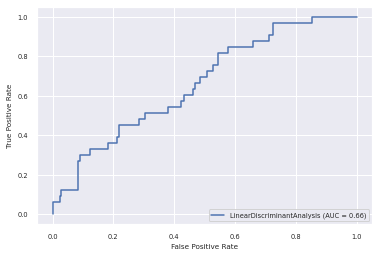

This is the starting index: 3336 of patient 8
0.6020761245674741
[([1], 0, array([0.67968724, 0.32031276])), ([1], 0, array([0.52379418, 0.47620582])), ([0], 0, array([0.74246436, 0.25753564])), ([1], 0, array([0.72658745, 0.27341255])), ([1], 0, array([0.59228961, 0.40771039])), ([1], 1, array([0.39852656, 0.60147344])), ([1], 0, array([0.59531458, 0.40468542])), ([1], 0, array([0.60710104, 0.39289896])), ([1], 0, array([0.54331147, 0.45668853])), ([1], 1, array([0.43921574, 0.56078426])), ([0], 0, array([0.63466271, 0.36533729])), ([1], 0, array([0.64587613, 0.35412387])), ([0], 0, array([0.75413027, 0.24586973])), ([1], 0, array([0.66263964, 0.33736036])), ([1], 1, array([0.40368014, 0.59631986])), ([0], 0, array([0.7894694, 0.2105306])), ([0], 1, array([0.49437692, 0.50562308])), ([1], 0, array([0.7960101, 0.2039899])), ([1], 1, array([0.48617835, 0.51382165])), ([1], 0, array([0.78793414, 0.21206586])), ([1], 1, array([0.35602904, 0.64397096])), ([0], 1, array([0.43216068, 0.56783

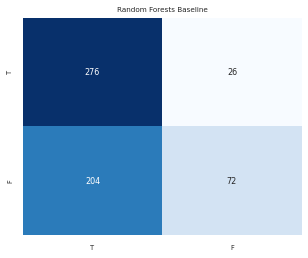

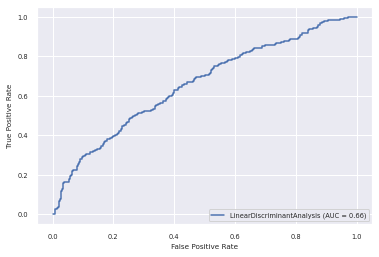

This is the starting index: 3915 of patient 9
0.42142857142857143
[([1], 1, array([0.38814027, 0.61185973])), ([1], 0, array([0.52302658, 0.47697342])), ([1], 1, array([0.34179155, 0.65820845])), ([1], 1, array([0.37336879, 0.62663121])), ([1], 0, array([0.60221169, 0.39778831])), ([1], 0, array([0.52550067, 0.47449933])), ([1], 1, array([0.45537666, 0.54462334])), ([1], 1, array([0.49552277, 0.50447723])), ([1], 1, array([0.48914184, 0.51085816])), ([1], 0, array([0.52746534, 0.47253466])), ([1], 1, array([0.47959386, 0.52040614])), ([1], 1, array([0.40662005, 0.59337995])), ([1], 0, array([0.5255453, 0.4744547])), ([1], 1, array([0.4477399, 0.5522601])), ([1], 0, array([0.54693094, 0.45306906])), ([1], 0, array([0.57634135, 0.42365865])), ([1], 1, array([0.37872646, 0.62127354])), ([1], 0, array([0.53000808, 0.46999192])), ([1], 1, array([0.42544713, 0.57455287])), ([1], 0, array([0.61708577, 0.38291423])), ([1], 0, array([0.52119854, 0.47880146])), ([1], 1, array([0.40459195, 0.5954

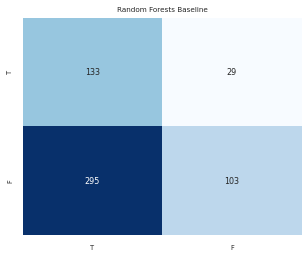

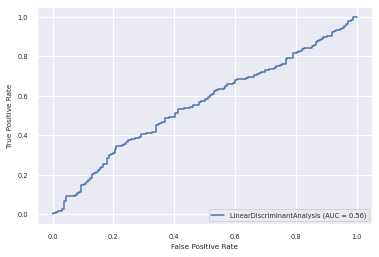

This is the starting index: 4476 of patient 10
0.8701298701298701
[([0], 0, array([0.58534084, 0.41465916])), ([0], 0, array([0.55623716, 0.44376284])), ([0], 0, array([0.55643497, 0.44356503])), ([0], 0, array([0.53800455, 0.46199545])), ([0], 0, array([0.56563123, 0.43436877])), ([0], 0, array([0.53529789, 0.46470211])), ([1], 0, array([0.51521491, 0.48478509])), ([1], 0, array([0.64196046, 0.35803954])), ([0], 0, array([0.5937487, 0.4062513])), ([0], 0, array([0.52870501, 0.47129499])), ([1], 0, array([0.54156331, 0.45843669])), ([1], 0, array([0.63121215, 0.36878785])), ([1], 0, array([0.7080279, 0.2919721])), ([0], 0, array([0.64012433, 0.35987567])), ([0], 0, array([0.71820041, 0.28179959])), ([0], 0, array([0.68227899, 0.31772101])), ([0], 0, array([0.70835268, 0.29164732])), ([0], 0, array([0.50477517, 0.49522483])), ([1], 0, array([0.57401805, 0.42598195])), ([0], 0, array([0.61722438, 0.38277562])), ([1], 0, array([0.73848626, 0.26151374])), ([0], 1, array([0.45619035, 0.5438

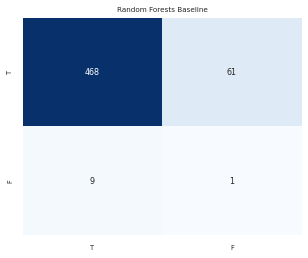

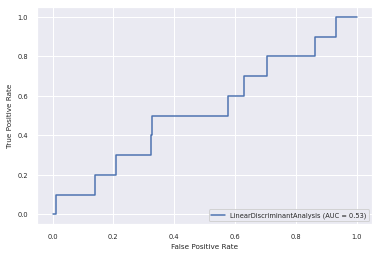

This is the starting index: 5016 of patient 11
0.6536796536796536
[([0], 1, array([0.38353222, 0.61646778])), ([0], 1, array([0.2813436, 0.7186564])), ([0], 0, array([0.528536, 0.471464])), ([0], 0, array([0.55765718, 0.44234282])), ([0], 1, array([0.28133149, 0.71866851])), ([0], 0, array([0.52347754, 0.47652246])), ([0], 1, array([0.26882507, 0.73117493])), ([0], 0, array([0.5718102, 0.4281898])), ([0], 0, array([0.6320715, 0.3679285])), ([0], 0, array([0.71662956, 0.28337044])), ([0], 0, array([0.53884184, 0.46115816])), ([0], 0, array([0.5672072, 0.4327928])), ([0], 0, array([0.58889692, 0.41110308])), ([1], 0, array([0.66644621, 0.33355379])), ([0], 0, array([0.595458, 0.404542])), ([1], 0, array([0.69999812, 0.30000188])), ([0], 0, array([0.7228601, 0.2771399])), ([0], 0, array([0.68062535, 0.31937465])), ([0], 0, array([0.65003189, 0.34996811])), ([1], 0, array([0.68868228, 0.31131772])), ([0], 0, array([0.65764002, 0.34235998])), ([0], 0, array([0.64908174, 0.35091826])), ([0],

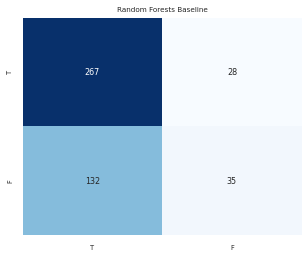

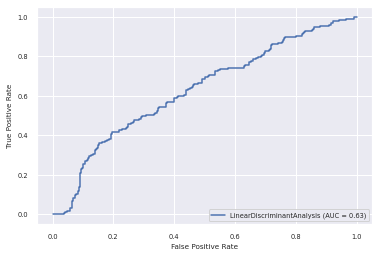

This is the starting index: 5479 of patient 12
0.6235294117647059
[([0], 0, array([0.53308288, 0.46691712])), ([0], 0, array([0.54134241, 0.45865759])), ([0], 1, array([0.45061694, 0.54938306])), ([0], 0, array([0.50369199, 0.49630801])), ([0], 0, array([0.66241655, 0.33758345])), ([0], 0, array([0.58637767, 0.41362233])), ([0], 0, array([0.52706708, 0.47293292])), ([0], 0, array([0.51320386, 0.48679614])), ([0], 0, array([0.50917009, 0.49082991])), ([0], 0, array([0.61944425, 0.38055575])), ([0], 0, array([0.55208787, 0.44791213])), ([0], 0, array([0.54639853, 0.45360147])), ([0], 0, array([0.56463997, 0.43536003])), ([0], 0, array([0.566704, 0.433296])), ([0], 0, array([0.54325344, 0.45674656])), ([0], 1, array([0.44330198, 0.55669802])), ([0], 0, array([0.53312156, 0.46687844])), ([0], 0, array([0.64871875, 0.35128125])), ([0], 0, array([0.54694121, 0.45305879])), ([0], 0, array([0.53370107, 0.46629893])), ([0], 0, array([0.61714992, 0.38285008])), ([0], 0, array([0.5329079, 0.46709

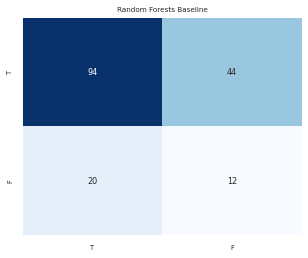

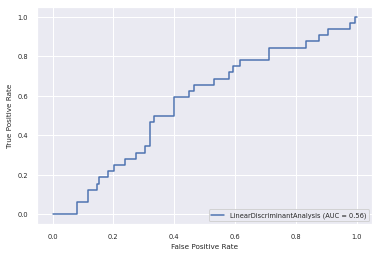

<function matplotlib.pyplot.show>

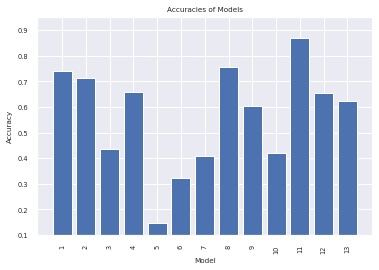

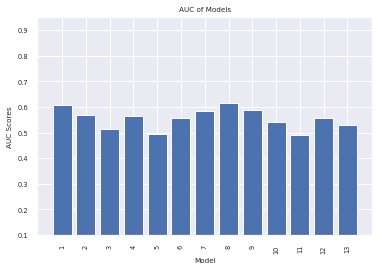

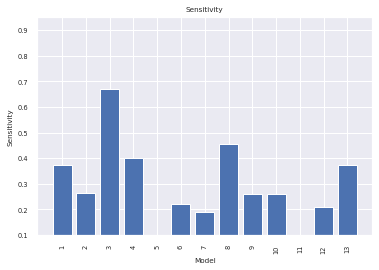

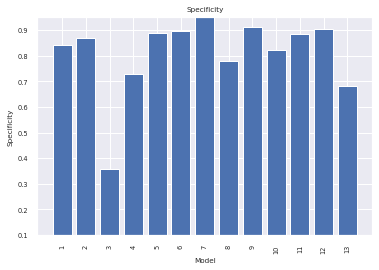

In [40]:
Accuracy = []
auc = []
sensitivity = []
specificity = []
clf = LinearDiscriminantAnalysis()

for i in range(0,13):
    test, train, test_class, train_class = leave_one_out(df,i)
    lsvc = LinearSVC(C=0.01, penalty="l1", dual=False).fit(train, train_class.ravel())
    model = SelectFromModel(lsvc, prefit=True)
    train = model.transform(train)
    test = model.transform(test)
    clf.fit(train, train_class.ravel())

    y_predicted = clf.predict(test)
    print(metrics.accuracy_score(test_class,y_predicted))
        # print("Random Forest:\n",metrics.classification_report(test_class,y_predicted)) # Classification report
    Accuracy.append(metrics.accuracy_score(test_class,y_predicted))
    auc.append(metrics.roc_auc_score(test_class,y_predicted))
    mcm = confusion_matrix(test_class,y_predicted)
    tn = mcm[0, 0]
    tp = mcm[1, 1]
    fn = mcm[1, 0]
    fp = mcm[0, 1]
    sensitivity.append(tp / (tp + fn))
    specificity.append(tn / (tn + fp))
    pred = clf.predict_proba(test)
    result = [*zip(test_class.tolist(), y_predicted, pred)]
    print(result)
    report = metrics.classification_report(test_class.tolist(), y_predicted)
    matrix = metrics.confusion_matrix(test_class.tolist(),y_predicted)   

    fig, (ax1) = plt.subplots(1, figsize=(5, 4))


    df_cm1 = pd.DataFrame(matrix, range(2), range(2))
    sn.set(font_scale=0.6) # for label size
    sn.heatmap(df_cm1, annot=True,annot_kws={"size": 8}, fmt='g', cmap='Blues', cbar= False, xticklabels=x_axis_labels, yticklabels=y_axis_labels, ax = ax1) # font size


    ax1.set_title('Random Forests Baseline')

    plt.show()
    metrics.plot_roc_curve(clf, test, test_class.tolist())  # doctest: +SKIP
    plt.show()

Model=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13']

Index = [1,2,3,4,5,6,7,8,9,10,11,12,13]
fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,Accuracy)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Accuracy')
plt.xlabel('Model')
plt.title('Accuracies of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,auc)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('AUC Scores')
plt.xlabel('Model')
plt.title('AUC of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,sensitivity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Sensitivity')
plt.xlabel('Model')
plt.title('Sensitivity')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,specificity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Specificity')
plt.xlabel('Model')
plt.title('Specificity')
plt.show

#### Tree Based Feature Selection

This is the starting index: 0 of patient 0
0.8027923211169284
[([1], 0, array([0.53, 0.47])), ([1], 1, array([0.36, 0.64])), ([0], 1, array([0.31, 0.69])), ([1], 0, array([0.8, 0.2])), ([1], 1, array([0.19, 0.81])), ([0], 0, array([0.78, 0.22])), ([1], 0, array([0.7, 0.3])), ([0], 0, array([0.52, 0.48])), ([1], 1, array([0.19, 0.81])), ([0], 0, array([0.67, 0.33])), ([0], 0, array([0.5, 0.5])), ([1], 1, array([0.46, 0.54])), ([1], 0, array([0.57, 0.43])), ([0], 0, array([0.52, 0.48])), ([1], 1, array([0.26, 0.74])), ([1], 1, array([0.33, 0.67])), ([1], 0, array([0.5, 0.5])), ([1], 0, array([0.78, 0.22])), ([1], 0, array([0.57, 0.43])), ([1], 0, array([0.5, 0.5])), ([0], 0, array([0.53, 0.47])), ([1], 0, array([0.91, 0.09])), ([1], 0, array([0.57, 0.43])), ([1], 1, array([0.35, 0.65])), ([0], 0, array([0.85, 0.15])), ([0], 0, array([0.61, 0.39])), ([1], 0, array([0.77, 0.23])), ([1], 0, array([0.51, 0.49])), ([0], 0, array([0.55, 0.45])), ([0], 0, array([0.72, 0.28])), ([0], 0, array([0

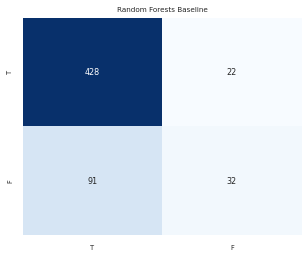

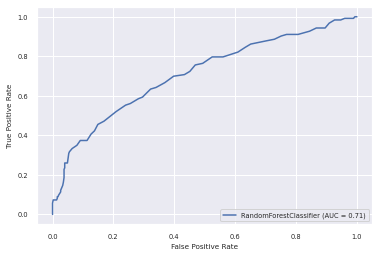

This is the starting index: 574 of patient 1
0.7167381974248928
[([0], 1, array([0.29, 0.71])), ([0], 1, array([0.24, 0.76])), ([0], 0, array([0.6, 0.4])), ([0], 1, array([0.34, 0.66])), ([0], 0, array([0.54, 0.46])), ([0], 0, array([0.6, 0.4])), ([1], 1, array([0.33, 0.67])), ([0], 0, array([0.64, 0.36])), ([0], 0, array([0.52, 0.48])), ([0], 0, array([0.74, 0.26])), ([0], 0, array([0.67, 0.33])), ([0], 1, array([0.43, 0.57])), ([1], 0, array([0.58, 0.42])), ([0], 1, array([0.42, 0.58])), ([0], 0, array([0.71, 0.29])), ([0], 0, array([0.57, 0.43])), ([0], 1, array([0.41, 0.59])), ([0], 0, array([0.56, 0.44])), ([1], 0, array([0.83, 0.17])), ([0], 0, array([0.6, 0.4])), ([1], 1, array([0.05, 0.95])), ([0], 0, array([0.81, 0.19])), ([1], 1, array([0.17, 0.83])), ([0], 0, array([0.67, 0.33])), ([1], 0, array([0.55, 0.45])), ([0], 0, array([0.86, 0.14])), ([0], 0, array([0.73, 0.27])), ([0], 0, array([0.61, 0.39])), ([0], 0, array([0.78, 0.22])), ([1], 1, array([0.12, 0.88])), ([1], 1, ar

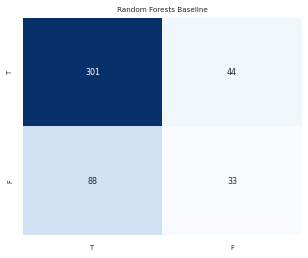

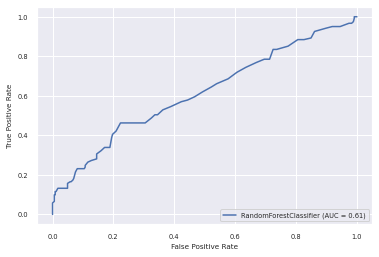

This is the starting index: 1041 of patient 2
0.2832764505119454
[([1], 1, array([0.18, 0.82])), ([0], 0, array([0.6, 0.4])), ([0], 1, array([0.38, 0.62])), ([1], 1, array([0.2, 0.8])), ([0], 0, array([0.65, 0.35])), ([0], 0, array([0.77, 0.23])), ([0], 0, array([0.66, 0.34])), ([1], 1, array([0.16, 0.84])), ([1], 1, array([0.45, 0.55])), ([1], 1, array([0.25, 0.75])), ([1], 0, array([0.6, 0.4])), ([1], 1, array([0.3, 0.7])), ([1], 1, array([0.08, 0.92])), ([0], 1, array([0.48, 0.52])), ([1], 0, array([0.53, 0.47])), ([1], 1, array([0.33, 0.67])), ([0], 1, array([0.15, 0.85])), ([0], 1, array([0.08, 0.92])), ([0], 1, array([0.29, 0.71])), ([0], 0, array([0.53, 0.47])), ([0], 1, array([0.11, 0.89])), ([0], 1, array([0.39, 0.61])), ([0], 1, array([0.33, 0.67])), ([0], 1, array([0.04, 0.96])), ([0], 1, array([0.36, 0.64])), ([0], 1, array([0.01, 0.99])), ([0], 1, array([0.49, 0.51])), ([0], 1, array([0.15, 0.85])), ([0], 1, array([0.05, 0.95])), ([0], 1, array([0.06, 0.94])), ([0], 1, arr

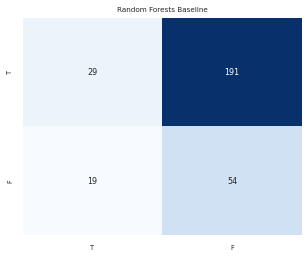

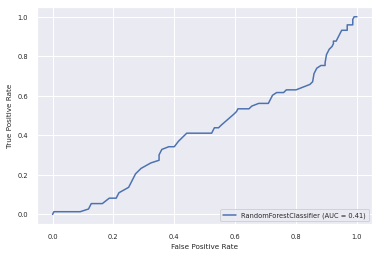

This is the starting index: 1335 of patient 3
0.6058201058201058
[([0], 1, array([0.43, 0.57])), ([1], 0, array([0.54, 0.46])), ([1], 1, array([0.13, 0.87])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.31, 0.69])), ([1], 1, array([0.46, 0.54])), ([1], 1, array([0.29, 0.71])), ([0], 1, array([0.38, 0.62])), ([0], 0, array([0.66, 0.34])), ([0], 1, array([0.48, 0.52])), ([0], 0, array([0.51, 0.49])), ([0], 0, array([0.79, 0.21])), ([0], 0, array([0.6, 0.4])), ([1], 1, array([0.47, 0.53])), ([0], 1, array([0.43, 0.57])), ([0], 0, array([0.56, 0.44])), ([0], 0, array([0.66, 0.34])), ([0], 1, array([0.04, 0.96])), ([0], 0, array([0.65, 0.35])), ([0], 0, array([0.52, 0.48])), ([0], 0, array([0.58, 0.42])), ([0], 1, array([0.31, 0.69])), ([0], 1, array([0.43, 0.57])), ([0], 0, array([0.71, 0.29])), ([0], 0, array([0.73, 0.27])), ([0], 0, array([0.53, 0.47])), ([0], 1, array([0.3, 0.7])), ([0], 0, array([0.86, 0.14])), ([0], 1, array([0.42, 0.58])), ([1], 0, array([0.5, 0.5])), ([0], 1, arr

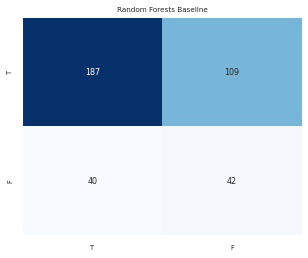

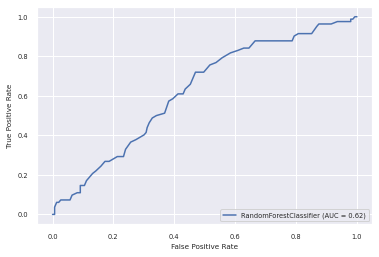

This is the starting index: 1714 of patient 4
0.5514950166112956
[([1], 0, array([0.52, 0.48])), ([1], 1, array([0.43, 0.57])), ([1], 0, array([0.59, 0.41])), ([1], 0, array([0.51, 0.49])), ([1], 1, array([0.37, 0.63])), ([1], 0, array([0.51, 0.49])), ([1], 0, array([0.52, 0.48])), ([1], 1, array([0.37, 0.63])), ([1], 0, array([0.51, 0.49])), ([1], 0, array([0.57, 0.43])), ([1], 1, array([0.35, 0.65])), ([1], 1, array([0.47, 0.53])), ([1], 1, array([0.27, 0.73])), ([1], 1, array([0.29, 0.71])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.37, 0.63])), ([1], 1, array([0.31, 0.69])), ([1], 1, array([0.47, 0.53])), ([1], 1, array([0.36, 0.64])), ([1], 1, array([0.47, 0.53])), ([1], 1, array([0.33, 0.67])), ([1], 1, array([0.36, 0.64])), ([1], 0, array([0.52, 0.48])), ([1], 1, array([0.38, 0.62])), ([1], 1, array([0.47, 0.53])), ([1], 1, array([0.34, 0.66])), ([1], 1, array([0.2, 0.8])), ([1], 0, array([0.65, 0.35])), ([1], 1, array([0.48, 0.52])), ([1], 0, array([0.5, 0.5])), ([1], 0, a

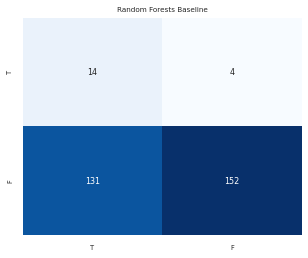

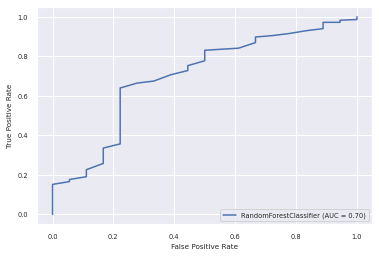

This is the starting index: 2016 of patient 5
0.4611973392461197
[([0], 0, array([0.74, 0.26])), ([0], 0, array([0.69, 0.31])), ([0], 0, array([0.67, 0.33])), ([0], 0, array([0.72, 0.28])), ([0], 0, array([0.87, 0.13])), ([0], 0, array([0.82, 0.18])), ([1], 0, array([0.85, 0.15])), ([1], 0, array([0.85, 0.15])), ([1], 0, array([0.73, 0.27])), ([1], 0, array([0.84, 0.16])), ([0], 0, array([0.75, 0.25])), ([1], 0, array([0.8, 0.2])), ([0], 0, array([0.6, 0.4])), ([1], 0, array([0.6, 0.4])), ([1], 0, array([0.75, 0.25])), ([1], 0, array([0.78, 0.22])), ([1], 0, array([0.87, 0.13])), ([1], 0, array([0.7, 0.3])), ([1], 0, array([0.64, 0.36])), ([1], 0, array([0.85, 0.15])), ([1], 1, array([0.12, 0.88])), ([1], 0, array([0.72, 0.28])), ([1], 0, array([0.79, 0.21])), ([1], 0, array([0.59, 0.41])), ([1], 0, array([0.81, 0.19])), ([1], 0, array([0.76, 0.24])), ([1], 1, array([0.17, 0.83])), ([1], 0, array([0.56, 0.44])), ([1], 0, array([0.85, 0.15])), ([1], 1, array([0.32, 0.68])), ([1], 0, arr

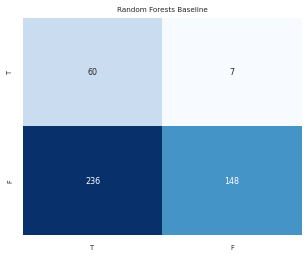

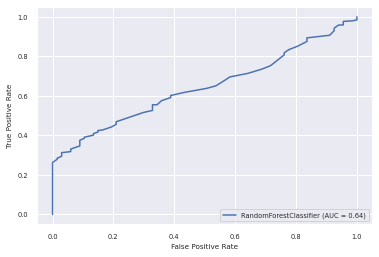

This is the starting index: 2468 of patient 6
0.5695538057742782
[([1], 1, array([0.44, 0.56])), ([1], 1, array([0.46, 0.54])), ([1], 1, array([0.22, 0.78])), ([1], 0, array([0.77, 0.23])), ([1], 0, array([0.64, 0.36])), ([1], 1, array([0.29, 0.71])), ([1], 1, array([0.27, 0.73])), ([1], 0, array([0.81, 0.19])), ([1], 0, array([0.63, 0.37])), ([1], 0, array([0.76, 0.24])), ([0], 0, array([0.8, 0.2])), ([1], 1, array([0.21, 0.79])), ([1], 0, array([0.8, 0.2])), ([1], 1, array([0.49, 0.51])), ([1], 0, array([0.7, 0.3])), ([1], 1, array([0.39, 0.61])), ([1], 1, array([0.18, 0.82])), ([1], 1, array([0.37, 0.63])), ([1], 1, array([0.3, 0.7])), ([0], 0, array([0.7, 0.3])), ([1], 0, array([0.65, 0.35])), ([1], 0, array([0.94, 0.06])), ([1], 1, array([0.33, 0.67])), ([1], 1, array([0.39, 0.61])), ([1], 0, array([0.54, 0.46])), ([1], 0, array([0.54, 0.46])), ([1], 0, array([0.75, 0.25])), ([0], 1, array([0.26, 0.74])), ([0], 0, array([0.71, 0.29])), ([1], 1, array([0.43, 0.57])), ([1], 0, array

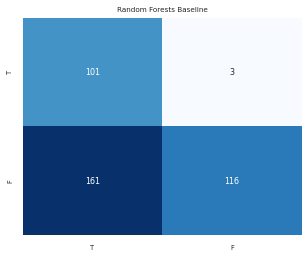

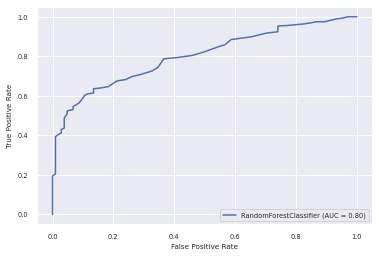

This is the starting index: 2850 of patient 7
0.8288659793814434
[([0], 0, array([0.59, 0.41])), ([0], 0, array([0.82, 0.18])), ([0], 0, array([0.72, 0.28])), ([0], 1, array([0.44, 0.56])), ([0], 0, array([0.63, 0.37])), ([0], 0, array([0.77, 0.23])), ([0], 0, array([0.74, 0.26])), ([0], 0, array([0.87, 0.13])), ([0], 0, array([0.78, 0.22])), ([0], 0, array([0.78, 0.22])), ([0], 0, array([0.76, 0.24])), ([0], 0, array([0.89, 0.11])), ([0], 1, array([0.11, 0.89])), ([0], 1, array([0.23, 0.77])), ([0], 0, array([0.59, 0.41])), ([0], 0, array([0.89, 0.11])), ([0], 0, array([0.82, 0.18])), ([0], 0, array([0.84, 0.16])), ([0], 0, array([0.72, 0.28])), ([0], 0, array([0.71, 0.29])), ([0], 0, array([0.71, 0.29])), ([0], 0, array([0.94, 0.06])), ([0], 0, array([0.64, 0.36])), ([0], 1, array([0.48, 0.52])), ([0], 0, array([0.77, 0.23])), ([0], 0, array([0.51, 0.49])), ([0], 0, array([0.67, 0.33])), ([0], 0, array([0.87, 0.13])), ([0], 1, array([0.42, 0.58])), ([0], 0, array([0.7, 0.3])), ([1], 

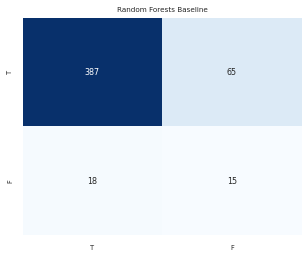

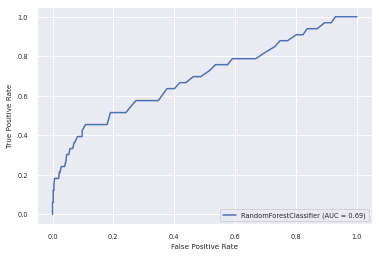

This is the starting index: 3336 of patient 8
0.7214532871972318
[([1], 0, array([0.7, 0.3])), ([1], 1, array([0.36, 0.64])), ([0], 0, array([0.71, 0.29])), ([1], 0, array([0.66, 0.34])), ([1], 1, array([0.34, 0.66])), ([1], 1, array([0.25, 0.75])), ([1], 0, array([0.51, 0.49])), ([1], 1, array([0.29, 0.71])), ([1], 1, array([0.39, 0.61])), ([1], 1, array([0.11, 0.89])), ([0], 1, array([0.33, 0.67])), ([1], 1, array([0.43, 0.57])), ([0], 0, array([0.81, 0.19])), ([1], 1, array([0.26, 0.74])), ([1], 1, array([0.42, 0.58])), ([0], 0, array([0.83, 0.17])), ([0], 0, array([0.6, 0.4])), ([1], 0, array([0.68, 0.32])), ([1], 1, array([0.14, 0.86])), ([1], 0, array([0.81, 0.19])), ([1], 1, array([0.34, 0.66])), ([0], 0, array([0.61, 0.39])), ([1], 1, array([0.24, 0.76])), ([0], 0, array([0.83, 0.17])), ([1], 1, array([0.06, 0.94])), ([0], 1, array([0.26, 0.74])), ([0], 0, array([0.63, 0.37])), ([0], 0, array([0.55, 0.45])), ([0], 0, array([0.78, 0.22])), ([1], 1, array([0.3, 0.7])), ([1], 1, a

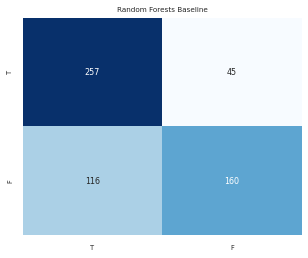

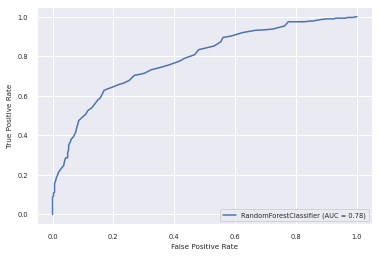

This is the starting index: 3915 of patient 9
0.5910714285714286
[([1], 1, array([0.16, 0.84])), ([1], 0, array([0.51, 0.49])), ([1], 1, array([0.4, 0.6])), ([1], 0, array([0.5, 0.5])), ([1], 1, array([0.42, 0.58])), ([1], 1, array([0.22, 0.78])), ([1], 0, array([0.7, 0.3])), ([1], 0, array([0.7, 0.3])), ([1], 0, array([0.54, 0.46])), ([1], 0, array([0.71, 0.29])), ([1], 1, array([0.18, 0.82])), ([1], 1, array([0.48, 0.52])), ([1], 1, array([0.31, 0.69])), ([1], 1, array([0.48, 0.52])), ([1], 0, array([0.63, 0.37])), ([1], 0, array([0.57, 0.43])), ([1], 1, array([0.39, 0.61])), ([1], 1, array([0.35, 0.65])), ([1], 1, array([0.41, 0.59])), ([1], 1, array([0.35, 0.65])), ([1], 1, array([0.26, 0.74])), ([1], 0, array([0.55, 0.45])), ([1], 0, array([0.6, 0.4])), ([1], 0, array([0.63, 0.37])), ([1], 1, array([0.44, 0.56])), ([0], 1, array([0.35, 0.65])), ([0], 1, array([0.39, 0.61])), ([1], 1, array([0.21, 0.79])), ([1], 0, array([0.63, 0.37])), ([1], 1, array([0.18, 0.82])), ([1], 1, array

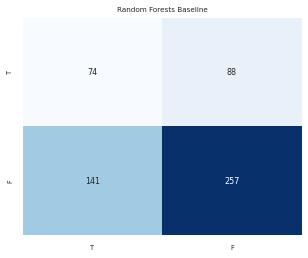

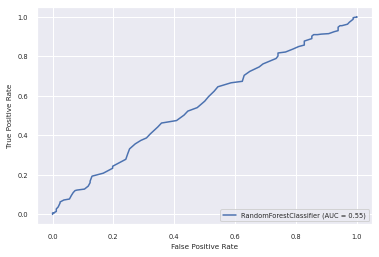

This is the starting index: 4476 of patient 10
0.8293135435992579
[([0], 1, array([0.44, 0.56])), ([0], 0, array([0.59, 0.41])), ([0], 0, array([0.51, 0.49])), ([0], 0, array([0.59, 0.41])), ([0], 0, array([0.63, 0.37])), ([0], 0, array([0.56, 0.44])), ([1], 1, array([0.32, 0.68])), ([1], 0, array([0.55, 0.45])), ([0], 0, array([0.79, 0.21])), ([0], 0, array([0.84, 0.16])), ([1], 1, array([0.35, 0.65])), ([1], 1, array([0.45, 0.55])), ([1], 0, array([0.58, 0.42])), ([0], 0, array([0.86, 0.14])), ([0], 0, array([0.75, 0.25])), ([0], 0, array([0.89, 0.11])), ([0], 0, array([0.82, 0.18])), ([0], 0, array([0.8, 0.2])), ([1], 1, array([0.3, 0.7])), ([0], 1, array([0.41, 0.59])), ([1], 0, array([0.81, 0.19])), ([0], 0, array([0.86, 0.14])), ([0], 0, array([0.78, 0.22])), ([0], 0, array([0.62, 0.38])), ([0], 0, array([0.78, 0.22])), ([1], 0, array([0.63, 0.37])), ([0], 0, array([0.64, 0.36])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.7, 0.3])), ([0], 0, array([0.69, 0.31])), ([0], 0, ar

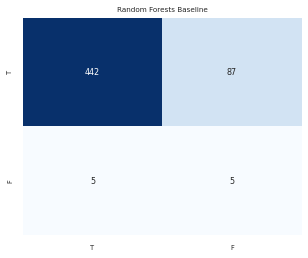

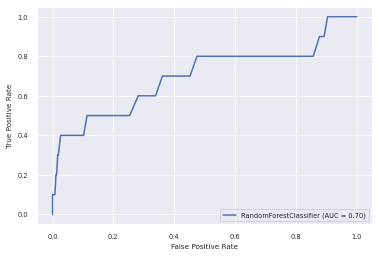

This is the starting index: 5016 of patient 11
0.7359307359307359
[([0], 0, array([0.52, 0.48])), ([0], 1, array([0.33, 0.67])), ([0], 0, array([0.79, 0.21])), ([0], 0, array([0.83, 0.17])), ([0], 1, array([0.25, 0.75])), ([0], 0, array([0.72, 0.28])), ([0], 0, array([0.55, 0.45])), ([0], 0, array([0.76, 0.24])), ([0], 0, array([0.62, 0.38])), ([0], 0, array([0.75, 0.25])), ([0], 0, array([0.77, 0.23])), ([0], 0, array([0.75, 0.25])), ([0], 0, array([0.78, 0.22])), ([1], 0, array([0.59, 0.41])), ([0], 0, array([0.69, 0.31])), ([1], 0, array([0.73, 0.27])), ([0], 0, array([0.58, 0.42])), ([0], 0, array([0.62, 0.38])), ([0], 0, array([0.89, 0.11])), ([1], 0, array([0.93, 0.07])), ([0], 0, array([0.73, 0.27])), ([0], 0, array([0.87, 0.13])), ([0], 0, array([0.93, 0.07])), ([0], 0, array([0.84, 0.16])), ([1], 0, array([0.64, 0.36])), ([0], 0, array([0.77, 0.23])), ([1], 0, array([0.82, 0.18])), ([1], 1, array([0.15, 0.85])), ([0], 0, array([0.73, 0.27])), ([0], 0, array([0.75, 0.25])), ([0

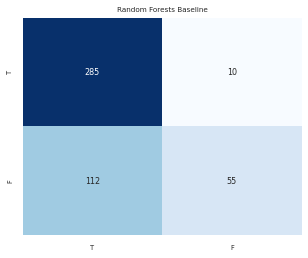

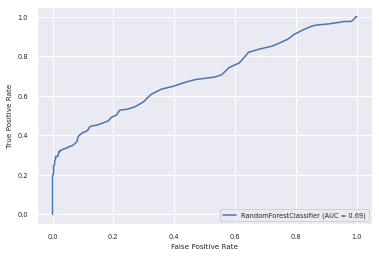

This is the starting index: 5479 of patient 12
0.4
[([0], 1, array([0.43, 0.57])), ([0], 1, array([0.35, 0.65])), ([0], 1, array([0.32, 0.68])), ([0], 1, array([0.28, 0.72])), ([0], 0, array([0.5, 0.5])), ([0], 1, array([0.26, 0.74])), ([0], 1, array([0.41, 0.59])), ([0], 0, array([0.58, 0.42])), ([0], 0, array([0.52, 0.48])), ([0], 1, array([0.48, 0.52])), ([0], 1, array([0.4, 0.6])), ([0], 1, array([0.29, 0.71])), ([0], 0, array([0.58, 0.42])), ([0], 1, array([0.37, 0.63])), ([0], 1, array([0.16, 0.84])), ([0], 1, array([0.18, 0.82])), ([0], 1, array([0.42, 0.58])), ([0], 1, array([0.4, 0.6])), ([0], 1, array([0.44, 0.56])), ([0], 1, array([0.33, 0.67])), ([0], 1, array([0.45, 0.55])), ([0], 1, array([0.4, 0.6])), ([0], 1, array([0.24, 0.76])), ([0], 1, array([0.2, 0.8])), ([0], 0, array([0.53, 0.47])), ([0], 1, array([0.45, 0.55])), ([0], 1, array([0.41, 0.59])), ([0], 0, array([0.5, 0.5])), ([0], 0, array([0.51, 0.49])), ([0], 0, array([0.53, 0.47])), ([0], 1, array([0.47, 0.53])),

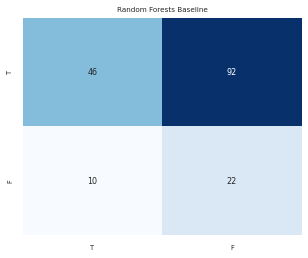

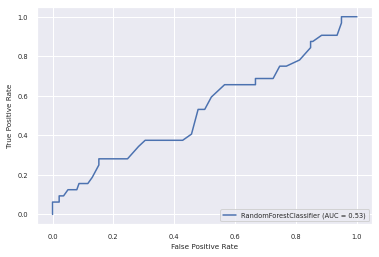

<function matplotlib.pyplot.show>

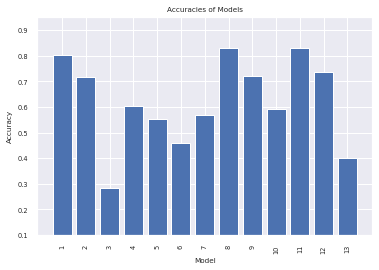

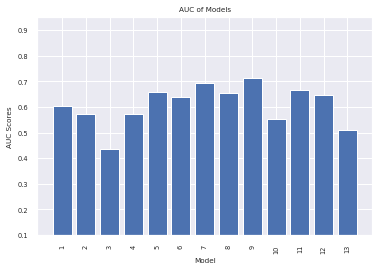

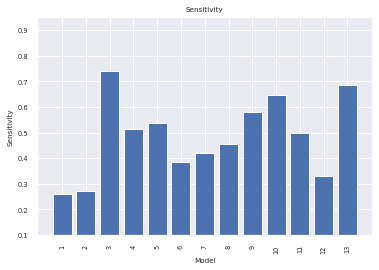

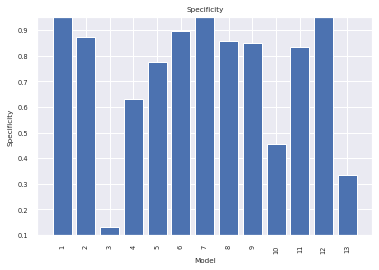

In [41]:
Accuracy = []
auc = []
sensitivity = []
specificity = []
clf = LinearDiscriminantAnalysis()

for i in range(0,13):
    test, train, test_class, train_class = leave_one_out(df,i)
    clf = ExtraTreesClassifier(n_estimators=50)
    clf = clf.fit(train, train_class.ravel())
    model = SelectFromModel(clf, prefit=True)
    train = model.transform(train)
    # clf = ExtraTreesClassifier(n_estimators=50)
    # clf = clf.fit(test, test_class.ravel())
    # model = SelectFromModel(clf, prefit=True) 

    test = model.transform(test)
    clf = RandomForestClassifier()
    clf.fit(train, train_class.ravel())


    y_predicted = clf.predict(test)
    print(metrics.accuracy_score(test_class,y_predicted))
        # print("Random Forest:\n",metrics.classification_report(test_class,y_predicted)) # Classification report
    Accuracy.append(metrics.accuracy_score(test_class,y_predicted))
    auc.append(metrics.roc_auc_score(test_class,y_predicted))
    mcm = confusion_matrix(test_class,y_predicted)
    tn = mcm[0, 0]
    tp = mcm[1, 1]
    fn = mcm[1, 0]
    fp = mcm[0, 1]
    sensitivity.append(tp / (tp + fn))
    specificity.append(tn / (tn + fp))
    pred = clf.predict_proba(test)
    result = [*zip(test_class.tolist(), y_predicted, pred)]
    print(result)
    report = metrics.classification_report(test_class.tolist(), y_predicted)
    matrix = metrics.confusion_matrix(test_class.tolist(),y_predicted)   

    fig, (ax1) = plt.subplots(1, figsize=(5, 4))


    df_cm1 = pd.DataFrame(matrix, range(2), range(2))
    sn.set(font_scale=0.6) # for label size
    sn.heatmap(df_cm1, annot=True,annot_kws={"size": 8}, fmt='g', cmap='Blues', cbar= False, xticklabels=x_axis_labels, yticklabels=y_axis_labels, ax = ax1) # font size


    ax1.set_title('Random Forests Baseline')

    plt.show()
    metrics.plot_roc_curve(clf, test, test_class.tolist())  # doctest: +SKIP
    plt.show()

Model=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13']

Index = [1,2,3,4,5,6,7,8,9,10,11,12,13]
fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,Accuracy)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Accuracy')
plt.xlabel('Model')
plt.title('Accuracies of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,auc)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('AUC Scores')
plt.xlabel('Model')
plt.title('AUC of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,sensitivity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Sensitivity')
plt.xlabel('Model')
plt.title('Sensitivity')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,specificity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Specificity')
plt.xlabel('Model')
plt.title('Specificity')
plt.show

#### Auto Sklearn Recommendation

In [ ]:
#SVM with manual parameters
svm = Pipeline([('vect', CountVectorizer()),('tfidf', TfidfTransformer()),
                         ('svm', SGDClassifier(loss='hinge', alpha=1e-3, random_state=42)),])

SimpleClassificationPipeline({'balancing:strategy': 'weighting', 'classifier:__choice__': 'random_forest', 'data_preprocessing:categorical_transformer:categorical_encoding:__choice__': 'one_hot_encoding', 'data_preprocessing:categorical_transformer:category_coalescence:__choice__': 'minority_coalescer', 'data_preprocessing:numerical_transformer:imputation:strategy': 'most_frequent', 'data_preprocessing:numerical_transformer:rescaling:__choice__': 'normalize', 'feature_preprocessor:__choice__': 'extra_trees_preproc_for_classification', 'classifier:random_forest:bootstrap': 'False', 'classifier:random_forest:criterion': 'entropy', 'classifier:random_forest:max_depth': 'None', 'classifier:random_forest:max_features': 0.27453376891983117, 'classifier:random_forest:max_leaf_nodes': 'None', 'classifier:random_forest:min_impurity_decrease': 0.0, 'classifier:random_forest:min_samples_leaf': 13, 'classifier:random_forest:min_samples_split': 19, 'classifier:random_forest:min_weight_fraction_leaf': 0.0, 'data_preprocessing:categorical_transformer:category_coalescence:minority_coalescer:minimum_fraction': 0.2166847947584762, 'feature_preprocessor:extra_trees_preproc_for_classification:bootstrap': 'False', 'feature_preprocessor:extra_trees_preproc_for_classification:criterion': 'entropy', 'feature_preprocessor:extra_trees_preproc_for_classification:max_depth': 'None', 'feature_preprocessor:extra_trees_preproc_for_classification:max_features': 0.2819773130241576, 'feature_preprocessor:extra_trees_preproc_for_classification:max_leaf_nodes': 'None', 'feature_preprocessor:extra_trees_preproc_for_classification:min_impurity_decrease': 0.0, 'feature_preprocessor:extra_trees_preproc_for_classification:min_samples_leaf': 20, 'feature_preprocessor:extra_trees_preproc_for_classification:min_samples_split': 3, 'feature_preprocessor:extra_trees_preproc_for_classification:min_weight_fraction_leaf': 0.0, 'feature_preprocessor:extra_trees_preproc_for_classification:n_estimators': 100},
d

### SVM(Support Vector Machine)

#### Baseline

This is the starting index: 0 of patient 0
0.7539267015706806
[([1], 1, 1), ([1], 0, 0), ([0], 1, 1), ([1], 0, 0), ([1], 1, 1), ([0], 0, 0), ([1], 0, 0), ([0], 0, 0), ([1], 1, 1), ([0], 1, 1), ([0], 0, 0), ([1], 1, 1), ([1], 1, 1), ([0], 0, 0), ([1], 0, 0), ([1], 1, 1), ([1], 1, 1), ([1], 0, 0), ([1], 1, 1), ([1], 1, 1), ([0], 0, 0), ([1], 1, 1), ([1], 1, 1), ([1], 1, 1), ([0], 1, 1), ([0], 1, 1), ([1], 1, 1), ([1], 1, 1), ([0], 1, 1), ([0], 0, 0), ([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([1], 1, 1), ([0], 0, 0), ([1], 0, 0), ([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([1], 0, 0), ([0], 0, 0), ([0], 1, 1), ([1], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([1], 0, 0), ([1], 0, 0), ([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), (

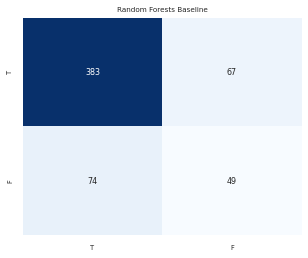

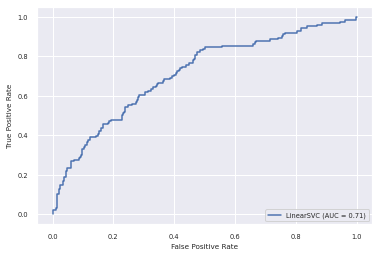

This is the starting index: 574 of patient 1
0.7145922746781116
[([0], 0, 0), ([0], 1, 1), ([0], 0, 0), ([0], 1, 1), ([0], 1, 1), ([0], 0, 0), ([1], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 1, 1), ([0], 0, 0), ([0], 1, 1), ([1], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([1], 0, 0), ([0], 0, 0), ([1], 1, 1), ([0], 0, 0), ([1], 1, 1), ([0], 0, 0), ([1], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([1], 1, 1), ([1], 1, 1), ([0], 1, 1), ([1], 0, 0), ([1], 1, 1), ([0], 0, 0), ([0], 0, 0), ([1], 1, 1), ([1], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 1, 1), ([1], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([1], 1, 1), ([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([1], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 1, 1), ([1], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([1], 0, 0), ([1], 1, 1), ([0], 0, 0), ([0], 0, 0),

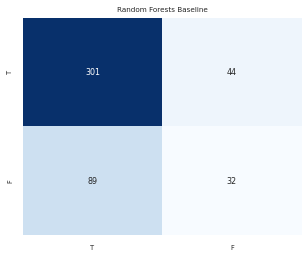

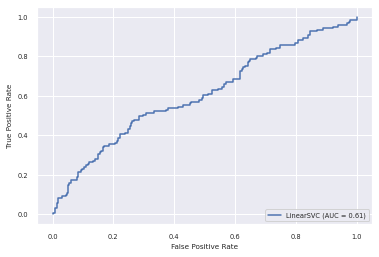

This is the starting index: 1041 of patient 2
0.36177474402730375
[([1], 1, 1), ([0], 1, 1), ([0], 1, 1), ([1], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([1], 1, 1), ([1], 1, 1), ([1], 1, 1), ([1], 1, 1), ([1], 1, 1), ([1], 1, 1), ([0], 1, 1), ([1], 1, 1), ([1], 0, 0), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 0, 0), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 0, 0), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 0, 0), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1

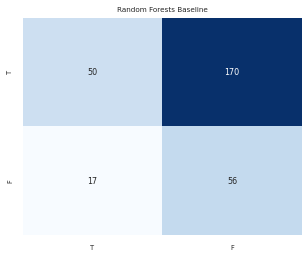

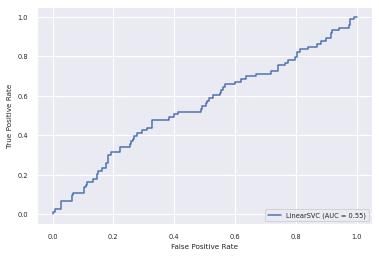

This is the starting index: 1335 of patient 3
0.6349206349206349
[([0], 0, 0), ([1], 1, 1), ([1], 1, 1), ([1], 1, 1), ([1], 1, 1), ([1], 0, 0), ([1], 0, 0), ([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 1, 1), ([0], 1, 1), ([0], 0, 0), ([1], 1, 1), ([0], 0, 0), ([0], 1, 1), ([0], 0, 0), ([0], 1, 1), ([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 0, 0), ([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([1], 0, 0), ([0], 1, 1), ([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 1, 1), ([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([1], 1, 1), ([0], 0, 0), ([0], 1, 1), ([0], 0, 0), ([0], 1, 1), ([0], 0, 0), ([0], 1, 1), ([0], 0, 0), ([0], 1, 1), ([0], 1, 1), ([1], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 1, 1), ([1], 0, 0), ([1], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 1, 1), ([0], 1, 1), ([0], 0, 0), ([0], 1, 1), ([0], 0, 0), ([0], 0, 0)

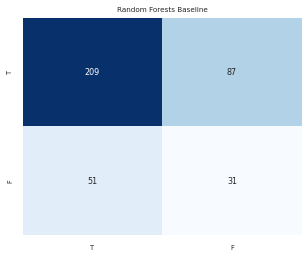

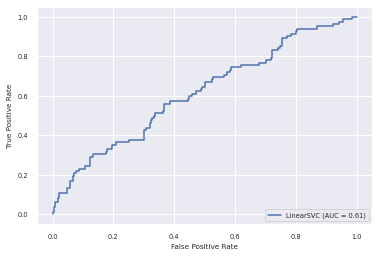

This is the starting index: 1714 of patient 4
0.16611295681063123
[([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 1, 1), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 1, 1), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 1, 1), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 1, 1), ([1], 0, 0), ([1], 0, 0), ([0], 0, 0), ([1], 0, 0), ([1], 1, 1), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([0], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 1, 1), ([1], 0, 0), ([1], 0, 0), ([1], 1, 1), ([1], 0, 0), ([1], 1, 1), ([1], 0, 0), ([1], 0, 0), ([1], 1, 1), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 1, 1), ([1], 1, 1), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([0], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0

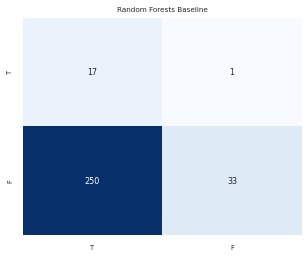

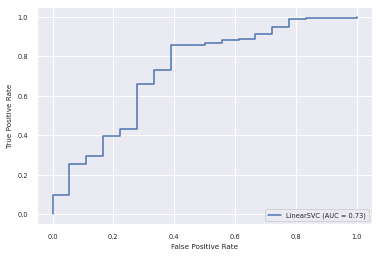

This is the starting index: 2016 of patient 5
0.3170731707317073
[([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([0], 0, 0), ([1], 0, 0), ([0], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 1, 1), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([0], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 1, 1), ([1], 0, 0), ([1], 1, 1), ([1], 1, 1), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 1, 1), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 1, 1), ([1], 1, 1), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([0], 0, 0), ([0], 1, 1), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0)

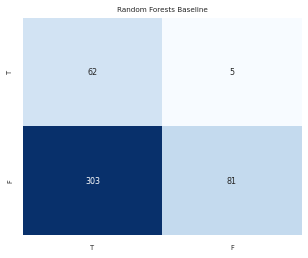

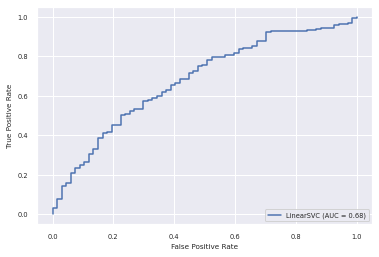

This is the starting index: 2468 of patient 6
0.46981627296587924
[([1], 1, 1), ([1], 1, 1), ([1], 1, 1), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 1, 1), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([0], 0, 0), ([1], 1, 1), ([1], 0, 0), ([1], 1, 1), ([1], 0, 0), ([1], 1, 1), ([1], 1, 1), ([1], 1, 1), ([1], 0, 0), ([0], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 1, 1), ([1], 0, 0), ([1], 0, 0), ([0], 0, 0), ([0], 0, 0), ([1], 1, 1), ([1], 0, 0), ([1], 1, 1), ([0], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([0], 0, 0), ([0], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([0], 0, 0), ([1], 0, 0), ([1], 1, 1), ([0], 0, 0), ([1], 0, 0), ([0], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([0], 0, 0), ([1], 0, 0), ([1], 0, 0), ([0], 0, 0), ([0], 0, 0), ([1], 0, 0), ([1], 1, 1), ([0], 0, 0), ([1], 1, 1), ([1], 0, 0), ([1], 1, 1), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0

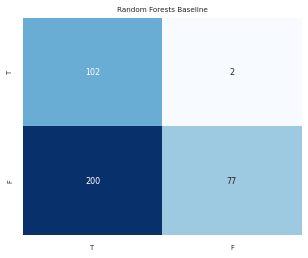

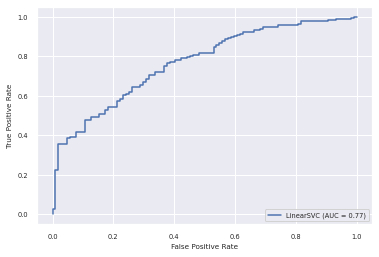

This is the starting index: 2850 of patient 7
0.7896907216494845
[([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 1, 1), ([0], 0, 0), ([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 1, 1), ([0], 0, 0), ([0], 1, 1), ([0], 1, 1), ([0], 0, 0), ([0], 1, 1), ([0], 1, 1), ([1], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 1, 1), ([0], 0, 0), ([1], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([1], 1, 1), ([0], 0, 0), ([1], 1, 1), ([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([1], 1, 1), ([0], 0, 0)

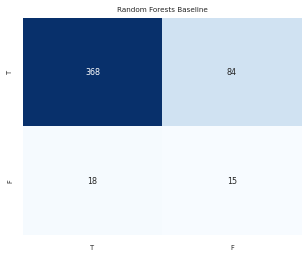

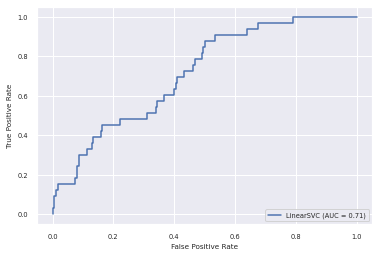

This is the starting index: 3336 of patient 8
0.5986159169550173
[([1], 0, 0), ([1], 0, 0), ([0], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 1, 1), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 1, 1), ([0], 0, 0), ([1], 0, 0), ([0], 0, 0), ([1], 0, 0), ([1], 1, 1), ([0], 0, 0), ([0], 0, 0), ([1], 0, 0), ([1], 1, 1), ([1], 0, 0), ([1], 1, 1), ([0], 1, 1), ([1], 0, 0), ([0], 0, 0), ([1], 1, 1), ([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([1], 0, 0), ([1], 1, 1), ([1], 1, 1), ([1], 1, 1), ([1], 0, 0), ([1], 0, 0), ([0], 1, 1), ([1], 1, 1), ([1], 1, 1), ([1], 1, 1), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([0], 0, 0), ([1], 0, 0), ([0], 0, 0), ([0], 0, 0), ([1], 1, 1), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([1], 0, 0), ([1], 1, 1), ([1], 0, 0), ([0], 0, 0), ([0], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 1, 1), ([0], 0, 0), ([0], 1, 1), ([1], 0, 0), ([1], 0, 0)

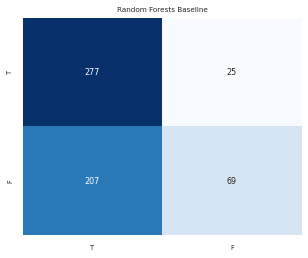

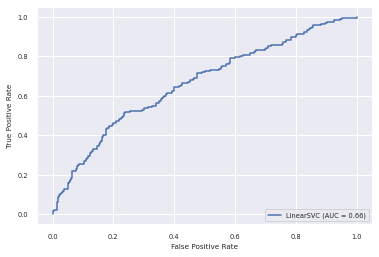

This is the starting index: 3915 of patient 9
0.525
[([1], 1, 1), ([1], 1, 1), ([1], 1, 1), ([1], 1, 1), ([1], 1, 1), ([1], 1, 1), ([1], 1, 1), ([1], 1, 1), ([1], 1, 1), ([1], 1, 1), ([1], 0, 0), ([1], 1, 1), ([1], 1, 1), ([1], 1, 1), ([1], 1, 1), ([1], 0, 0), ([1], 1, 1), ([1], 1, 1), ([1], 1, 1), ([1], 0, 0), ([1], 1, 1), ([1], 1, 1), ([1], 1, 1), ([1], 1, 1), ([1], 1, 1), ([0], 0, 0), ([0], 0, 0), ([1], 1, 1), ([1], 1, 1), ([1], 1, 1), ([1], 0, 0), ([1], 0, 0), ([1], 1, 1), ([0], 1, 1), ([1], 0, 0), ([1], 0, 0), ([1], 1, 1), ([1], 1, 1), ([1], 0, 0), ([1], 0, 0), ([1], 1, 1), ([1], 1, 1), ([1], 1, 1), ([1], 1, 1), ([1], 0, 0), ([1], 1, 1), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 1, 1), ([1], 1, 1), ([1], 1, 1), ([1], 1, 1), ([1], 0, 0), ([1], 1, 1), ([1], 0, 0), ([1], 1, 1), ([1], 1, 1), ([1], 0, 0), ([1], 0, 0), ([1], 1, 1), ([1], 1, 1), ([1], 0, 0), ([1], 0, 0), ([0], 1, 1), ([1], 0, 0), ([1], 1, 1), ([1], 1, 1), ([1], 1, 1), ([1], 0, 0), ([1], 0, 0), ([1], 1, 1), ([1], 1, 1)

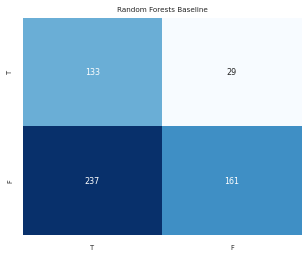

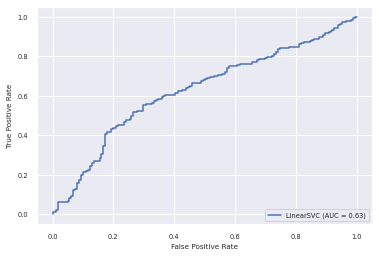

This is the starting index: 4476 of patient 10
0.8534322820037106
[([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([1], 0, 0), ([1], 0, 0), ([0], 0, 0), ([0], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([1], 0, 0), ([0], 0, 0), ([1], 0, 0), ([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([1], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([1], 0, 0), ([0], 1, 1), ([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0

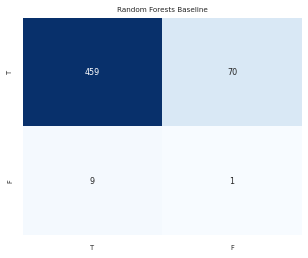

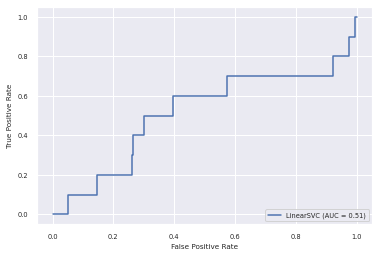

This is the starting index: 5016 of patient 11
0.6861471861471862
[([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([1], 0, 0), ([0], 0, 0), ([1], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([1], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([1], 0, 0), ([0], 0, 0), ([1], 0, 0), ([1], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([0], 0, 0), ([1], 0, 0), ([1], 1, 1), ([0], 0, 0), ([1], 1, 1), ([1], 0, 0), ([1], 0, 0), ([0], 0, 0), ([1], 1, 1), ([1], 0, 0), ([1], 0, 0), ([0], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 0, 0), ([0], 0, 0), ([1], 0, 0), ([0], 0, 0), ([1], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([1], 0, 0), ([0], 0, 0), ([1], 0, 0), ([1], 0, 0), ([1], 1, 1), ([0], 0, 0), ([0], 0, 0), ([1], 1, 1), ([1], 0, 0), ([0], 1, 1), ([1], 0, 0), ([1], 1, 1), ([0], 0, 0), ([1], 0, 0), ([1], 1, 1

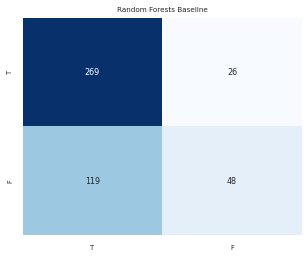

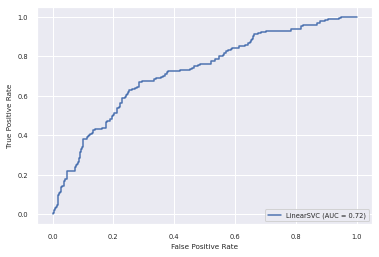

This is the starting index: 5479 of patient 12
0.6647058823529411
[([0], 0, 0), ([0], 0, 0), ([0], 1, 1), ([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 1, 1), ([0], 0, 0), ([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 1, 1), ([0], 0, 0), ([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 1, 1), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([0], 0, 0), ([1], 0, 0), ([0], 0, 0), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([1], 0, 0), ([0], 0, 0), ([1], 1, 1), ([0], 1, 1), ([0], 0, 0), ([0], 1, 1), ([0], 1, 1), ([0], 1, 1), ([1], 1, 1), ([1], 0, 0

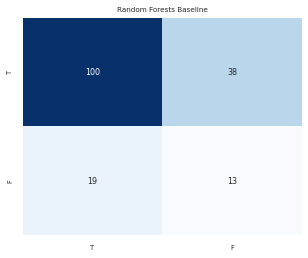

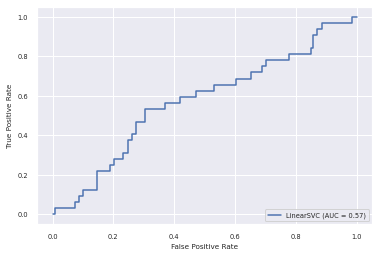

<function matplotlib.pyplot.show>

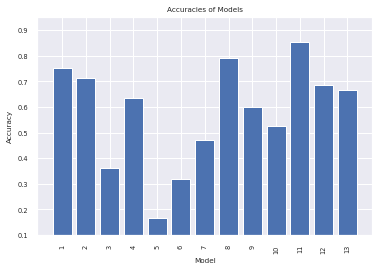

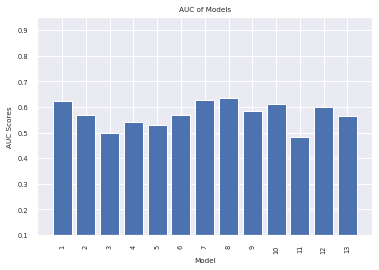

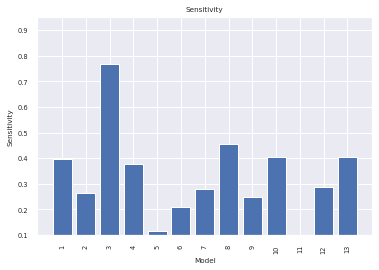

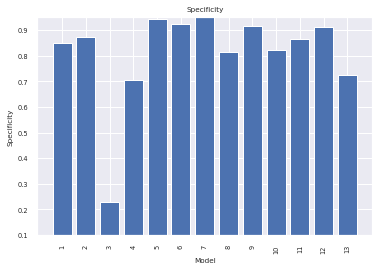

In [42]:
Accuracy = []
auc = []
sensitivity = []
specificity = []
clf = LinearSVC()

for i in range(0,13):
    test, train, test_class, train_class = leave_one_out(df,i)
    clf.fit(train, train_class.ravel())

    y_predicted = clf.predict(test)
    print(metrics.accuracy_score(test_class,y_predicted))
        # print("Random Forest:\n",metrics.classification_report(test_class,y_predicted)) # Classification report
    Accuracy.append(metrics.accuracy_score(test_class,y_predicted))
    auc.append(metrics.roc_auc_score(test_class,y_predicted))
    mcm = confusion_matrix(test_class,y_predicted)
    tn = mcm[0, 0]
    tp = mcm[1, 1]
    fn = mcm[1, 0]
    fp = mcm[0, 1]
    sensitivity.append(tp / (tp + fn))
    specificity.append(tn / (tn + fp))
    pred = clf.predict(test)
    result = [*zip(test_class.tolist(), y_predicted, pred)]
    print(result) 
    report = metrics.classification_report(test_class.tolist(), y_predicted)
    matrix = metrics.confusion_matrix(test_class.tolist(),y_predicted)   

    fig, (ax1) = plt.subplots(1, figsize=(5, 4))


    df_cm1 = pd.DataFrame(matrix, range(2), range(2))
    sn.set(font_scale=0.6) # for label size
    sn.heatmap(df_cm1, annot=True,annot_kws={"size": 8}, fmt='g', cmap='Blues', cbar= False, xticklabels=x_axis_labels, yticklabels=y_axis_labels, ax = ax1) # font size


    ax1.set_title('Random Forests Baseline')

    plt.show()
    metrics.plot_roc_curve(clf, test, test_class.tolist())  # doctest: +SKIP
    plt.show()

Model=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13']

Index = [1,2,3,4,5,6,7,8,9,10,11,12,13]
fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,Accuracy)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Accuracy')
plt.xlabel('Model')
plt.title('Accuracies of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,auc)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('AUC Scores')
plt.xlabel('Model')
plt.title('AUC of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,sensitivity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Sensitivity')
plt.xlabel('Model')
plt.title('Sensitivity')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,specificity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Specificity')
plt.xlabel('Model')
plt.title('Specificity')
plt.show

#### GridSearch

In [ ]:
parameters = {
    'solver'      : ['svd', 'lsqr', 'eigen'],
    'shrinkage'         : ['auto'],
    # 'random_state'      : [0],
    #'max_features': ['auto'],
    #'criterion' :['gini']
}


for i in range(0,13):
    test, train, test_class, train_class = leave_one_out(df,i)
    search = GridSearchCV(LinearDiscriminantAnalysis(), parameters, cv=10, n_jobs=-1)
    search.fit(train, train_class.ravel())

    print(search.score(train, train_class.ravel()))
    print(search.best_params_)

This is the starting index: 0 of patient 0
0.6428993500098483
{'shrinkage': 'auto', 'solver': 'lsqr'}
This is the starting index: 574 of patient 1
0.6500771604938271
{'shrinkage': 'auto', 'solver': 'lsqr'}
This is the starting index: 1041 of patient 2
0.6725779354116109
{'shrinkage': 'auto', 'solver': 'lsqr'}
This is the starting index: 1335 of patient 3
0.6544006069802731
{'shrinkage': 'auto', 'solver': 'lsqr'}
This is the starting index: 1714 of patient 4
0.6778837165825388
{'shrinkage': 'auto', 'solver': 'lsqr'}
This is the starting index: 2016 of patient 5
0.682823619926909
{'shrinkage': 'auto', 'solver': 'lsqr'}
This is the starting index: 2468 of patient 6
0.666540140444107
{'shrinkage': 'auto', 'solver': 'lsqr'}
This is the starting index: 2850 of patient 7
0.6383349467570184
{'shrinkage': 'auto', 'solver': 'lsqr'}
This is the starting index: 3336 of patient 8
0.6571372239747634
{'shrinkage': 'auto', 'solver': 'lsqr'}
This is the starting index: 3915 of patient 9
0.6656188605108

This is the starting index: 0 of patient 0
0.7591623036649214
[([1], 1, array([0.28724432, 0.71275568])), ([1], 0, array([0.52793866, 0.47206134])), ([0], 1, array([0.47729481, 0.52270519])), ([1], 0, array([0.58606507, 0.41393493])), ([1], 1, array([0.28105903, 0.71894097])), ([0], 0, array([0.54899241, 0.45100759])), ([1], 0, array([0.83048311, 0.16951689])), ([0], 0, array([0.58447045, 0.41552955])), ([1], 1, array([0.29994374, 0.70005626])), ([0], 1, array([0.25482794, 0.74517206])), ([0], 0, array([0.53910338, 0.46089662])), ([1], 1, array([0.35788715, 0.64211285])), ([1], 1, array([0.37010416, 0.62989584])), ([0], 0, array([0.68482296, 0.31517704])), ([1], 0, array([0.51826464, 0.48173536])), ([1], 1, array([0.39316513, 0.60683487])), ([1], 1, array([0.34169112, 0.65830888])), ([1], 0, array([0.50167629, 0.49832371])), ([1], 1, array([0.4476423, 0.5523577])), ([1], 1, array([0.45081179, 0.54918821])), ([0], 0, array([0.59701038, 0.40298962])), ([1], 1, array([0.42577541, 0.574224

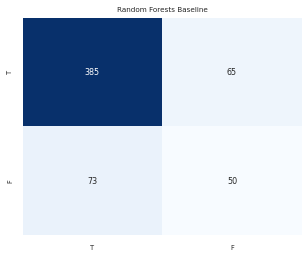

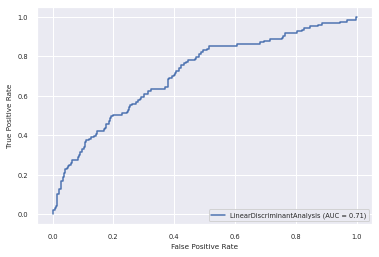

This is the starting index: 574 of patient 1
0.7081545064377682
[([0], 0, array([0.53973127, 0.46026873])), ([0], 1, array([0.43431795, 0.56568205])), ([0], 0, array([0.67192824, 0.32807176])), ([0], 1, array([0.32418618, 0.67581382])), ([0], 1, array([0.49868078, 0.50131922])), ([0], 0, array([0.56119259, 0.43880741])), ([1], 1, array([0.29835046, 0.70164954])), ([0], 0, array([0.53461798, 0.46538202])), ([0], 0, array([0.62089123, 0.37910877])), ([0], 1, array([0.29515194, 0.70484806])), ([0], 1, array([0.49555517, 0.50444483])), ([0], 1, array([0.39944155, 0.60055845])), ([1], 1, array([0.3793303, 0.6206697])), ([0], 0, array([0.54368794, 0.45631206])), ([0], 0, array([0.63724166, 0.36275834])), ([0], 0, array([0.73103222, 0.26896778])), ([0], 0, array([0.5177896, 0.4822104])), ([0], 0, array([0.76845882, 0.23154118])), ([1], 0, array([0.50622413, 0.49377587])), ([0], 0, array([0.69303723, 0.30696277])), ([1], 1, array([0.17113987, 0.82886013])), ([0], 0, array([0.71254574, 0.287454

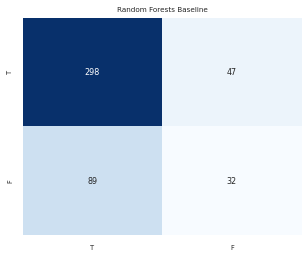

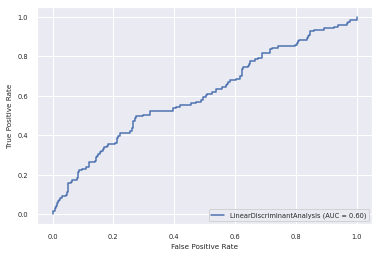

This is the starting index: 1041 of patient 2
0.35494880546075086
[([1], 1, array([0.40433807, 0.59566193])), ([0], 1, array([0.22703113, 0.77296887])), ([0], 1, array([0.15868578, 0.84131422])), ([1], 1, array([0.12584993, 0.87415007])), ([0], 1, array([0.1314954, 0.8685046])), ([0], 1, array([0.23236204, 0.76763796])), ([0], 1, array([0.07421786, 0.92578214])), ([1], 1, array([0.12923265, 0.87076735])), ([1], 1, array([0.21806123, 0.78193877])), ([1], 1, array([0.3498872, 0.6501128])), ([1], 1, array([0.16847285, 0.83152715])), ([1], 1, array([0.29652082, 0.70347918])), ([1], 1, array([0.27040517, 0.72959483])), ([0], 1, array([0.33427675, 0.66572325])), ([1], 1, array([0.38796472, 0.61203528])), ([1], 0, array([0.52389653, 0.47610347])), ([0], 1, array([0.31919424, 0.68080576])), ([0], 1, array([0.21062389, 0.78937611])), ([0], 1, array([0.19319397, 0.80680603])), ([0], 0, array([0.6071931, 0.3928069])), ([0], 1, array([0.06435298, 0.93564702])), ([0], 1, array([0.43423653, 0.565763

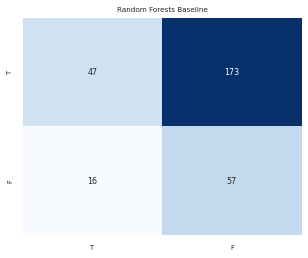

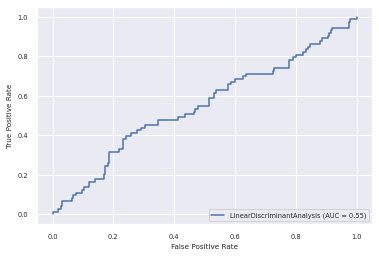

This is the starting index: 1335 of patient 3
0.6402116402116402
[([0], 0, array([0.53745276, 0.46254724])), ([1], 1, array([0.33777581, 0.66222419])), ([1], 1, array([0.47189869, 0.52810131])), ([1], 1, array([0.43430965, 0.56569035])), ([1], 1, array([0.17924077, 0.82075923])), ([1], 0, array([0.56927113, 0.43072887])), ([1], 0, array([0.56958262, 0.43041738])), ([0], 1, array([0.44408204, 0.55591796])), ([0], 0, array([0.55586988, 0.44413012])), ([0], 0, array([0.58917364, 0.41082636])), ([0], 1, array([0.41061786, 0.58938214])), ([0], 1, array([0.38385392, 0.61614608])), ([0], 0, array([0.65394688, 0.34605312])), ([1], 1, array([0.45872792, 0.54127208])), ([0], 0, array([0.57836113, 0.42163887])), ([0], 1, array([0.46318115, 0.53681885])), ([0], 0, array([0.55580282, 0.44419718])), ([0], 1, array([0.23805336, 0.76194664])), ([0], 1, array([0.46811313, 0.53188687])), ([0], 0, array([0.77613549, 0.22386451])), ([0], 0, array([0.59369019, 0.40630981])), ([0], 1, array([0.4084274, 0.59

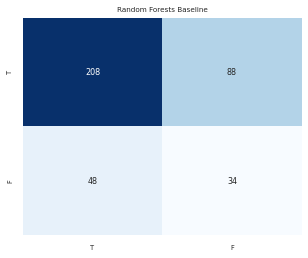

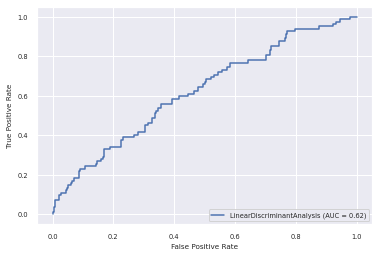

This is the starting index: 1714 of patient 4
0.1760797342192691
[([1], 0, array([0.52145974, 0.47854026])), ([1], 0, array([0.62512286, 0.37487714])), ([1], 0, array([0.65560799, 0.34439201])), ([1], 1, array([0.46948206, 0.53051794])), ([1], 0, array([0.51149988, 0.48850012])), ([1], 0, array([0.5745478, 0.4254522])), ([1], 0, array([0.57048265, 0.42951735])), ([1], 0, array([0.59869616, 0.40130384])), ([1], 0, array([0.7569312, 0.2430688])), ([1], 1, array([0.38912325, 0.61087675])), ([1], 0, array([0.65812232, 0.34187768])), ([1], 0, array([0.65861123, 0.34138877])), ([1], 0, array([0.51007121, 0.48992879])), ([1], 1, array([0.44818711, 0.55181289])), ([1], 0, array([0.54542731, 0.45457269])), ([1], 0, array([0.57371766, 0.42628234])), ([1], 0, array([0.66528055, 0.33471945])), ([1], 0, array([0.57524185, 0.42475815])), ([1], 0, array([0.60301107, 0.39698893])), ([1], 0, array([0.59083342, 0.40916658])), ([1], 0, array([0.60988164, 0.39011836])), ([1], 0, array([0.63528457, 0.36471

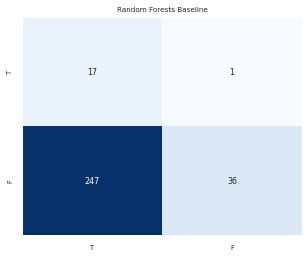

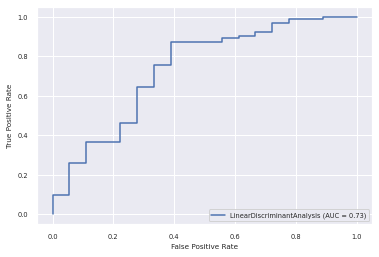

This is the starting index: 2016 of patient 5
0.328159645232816
[([0], 0, array([0.63477862, 0.36522138])), ([0], 0, array([0.79163689, 0.20836311])), ([0], 0, array([0.64589827, 0.35410173])), ([0], 0, array([0.81424517, 0.18575483])), ([0], 0, array([0.81272514, 0.18727486])), ([0], 0, array([0.7855189, 0.2144811])), ([1], 0, array([0.70168708, 0.29831292])), ([1], 0, array([0.82633952, 0.17366048])), ([1], 0, array([0.72707937, 0.27292063])), ([1], 0, array([0.6823452, 0.3176548])), ([0], 0, array([0.73484311, 0.26515689])), ([1], 0, array([0.7981897, 0.2018103])), ([0], 0, array([0.73481316, 0.26518684])), ([1], 0, array([0.70560862, 0.29439138])), ([1], 0, array([0.83087329, 0.16912671])), ([1], 0, array([0.52596116, 0.47403884])), ([1], 0, array([0.57207192, 0.42792808])), ([1], 0, array([0.69400721, 0.30599279])), ([1], 0, array([0.73086036, 0.26913964])), ([1], 0, array([0.73848878, 0.26151122])), ([1], 1, array([0.40289042, 0.59710958])), ([1], 0, array([0.70604849, 0.29395151

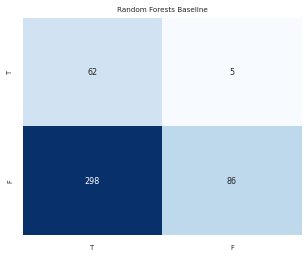

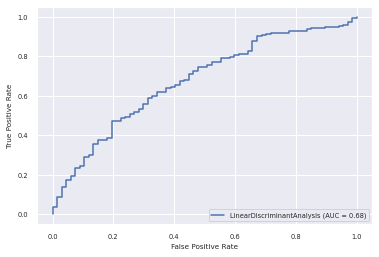

This is the starting index: 2468 of patient 6
0.46981627296587924
[([1], 1, array([0.42734272, 0.57265728])), ([1], 1, array([0.43345804, 0.56654196])), ([1], 1, array([0.45755506, 0.54244494])), ([1], 0, array([0.62166908, 0.37833092])), ([1], 0, array([0.56268404, 0.43731596])), ([1], 0, array([0.67454903, 0.32545097])), ([1], 1, array([0.39153842, 0.60846158])), ([1], 0, array([0.84080292, 0.15919708])), ([1], 0, array([0.51219059, 0.48780941])), ([1], 0, array([0.64221226, 0.35778774])), ([0], 0, array([0.7867524, 0.2132476])), ([1], 1, array([0.17004838, 0.82995162])), ([1], 0, array([0.70701818, 0.29298182])), ([1], 1, array([0.21082548, 0.78917452])), ([1], 0, array([0.50706483, 0.49293517])), ([1], 1, array([0.32346664, 0.67653336])), ([1], 1, array([0.07357393, 0.92642607])), ([1], 1, array([0.46945852, 0.53054148])), ([1], 0, array([0.53659936, 0.46340064])), ([0], 0, array([0.95535005, 0.04464995])), ([1], 0, array([0.6927705, 0.3072295])), ([1], 0, array([0.54914179, 0.4508

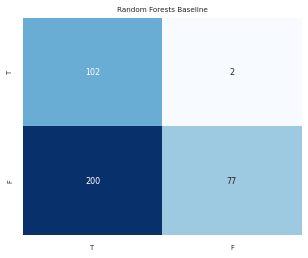

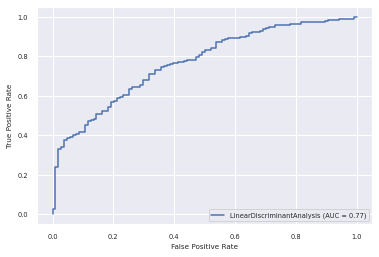

This is the starting index: 2850 of patient 7
0.7835051546391752
[([0], 1, array([0.46537178, 0.53462822])), ([0], 0, array([0.53226715, 0.46773285])), ([0], 0, array([0.59077108, 0.40922892])), ([0], 0, array([0.59408669, 0.40591331])), ([0], 1, array([0.46686459, 0.53313541])), ([0], 0, array([0.59177055, 0.40822945])), ([0], 1, array([0.3904021, 0.6095979])), ([0], 0, array([0.79180992, 0.20819008])), ([0], 0, array([0.52583621, 0.47416379])), ([0], 0, array([0.6162673, 0.3837327])), ([0], 0, array([0.75240476, 0.24759524])), ([0], 1, array([0.35771467, 0.64228533])), ([0], 1, array([0.23160865, 0.76839135])), ([0], 1, array([0.33168206, 0.66831794])), ([0], 0, array([0.54574922, 0.45425078])), ([0], 0, array([0.8338715, 0.1661285])), ([0], 0, array([0.67615488, 0.32384512])), ([0], 0, array([0.55521523, 0.44478477])), ([0], 0, array([0.59030101, 0.40969899])), ([0], 0, array([0.76858035, 0.23141965])), ([0], 0, array([0.50611143, 0.49388857])), ([0], 0, array([0.6954282, 0.3045718]

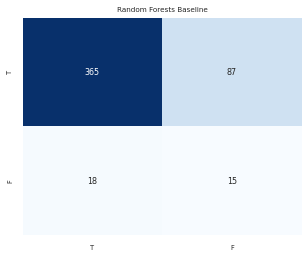

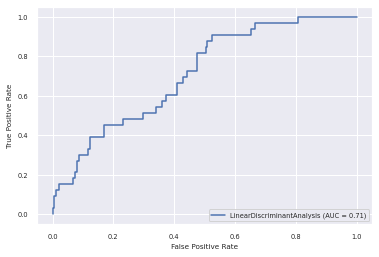

This is the starting index: 3336 of patient 8
0.5951557093425606
[([1], 0, array([0.67061642, 0.32938358])), ([1], 0, array([0.56708085, 0.43291915])), ([0], 0, array([0.7884211, 0.2115789])), ([1], 0, array([0.81356709, 0.18643291])), ([1], 0, array([0.66453917, 0.33546083])), ([1], 1, array([0.34607255, 0.65392745])), ([1], 0, array([0.52056196, 0.47943804])), ([1], 0, array([0.54117842, 0.45882158])), ([1], 0, array([0.58438004, 0.41561996])), ([1], 1, array([0.36579956, 0.63420044])), ([0], 0, array([0.70644229, 0.29355771])), ([1], 0, array([0.6249299, 0.3750701])), ([0], 0, array([0.73578397, 0.26421603])), ([1], 0, array([0.56367064, 0.43632936])), ([1], 1, array([0.29993179, 0.70006821])), ([0], 0, array([0.82843298, 0.17156702])), ([0], 0, array([0.52123345, 0.47876655])), ([1], 0, array([0.83431266, 0.16568734])), ([1], 1, array([0.44992669, 0.55007331])), ([1], 0, array([0.69943149, 0.30056851])), ([1], 1, array([0.33989201, 0.66010799])), ([0], 1, array([0.32501808, 0.67498

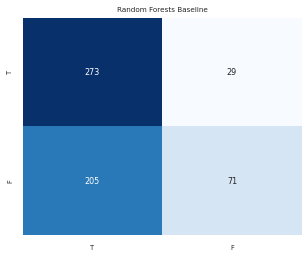

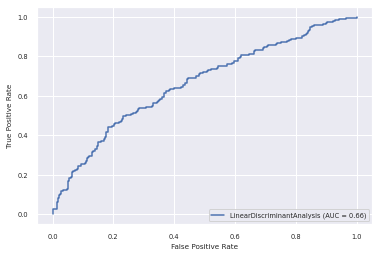

This is the starting index: 3915 of patient 9
0.5339285714285714
[([1], 1, array([0.30827779, 0.69172221])), ([1], 1, array([0.45219494, 0.54780506])), ([1], 1, array([0.29218959, 0.70781041])), ([1], 1, array([0.41865814, 0.58134186])), ([1], 1, array([0.35491895, 0.64508105])), ([1], 1, array([0.42260577, 0.57739423])), ([1], 1, array([0.47894136, 0.52105864])), ([1], 1, array([0.46011713, 0.53988287])), ([1], 1, array([0.41800517, 0.58199483])), ([1], 1, array([0.34736715, 0.65263285])), ([1], 0, array([0.52200318, 0.47799682])), ([1], 1, array([0.37205662, 0.62794338])), ([1], 1, array([0.49947486, 0.50052514])), ([1], 1, array([0.35215867, 0.64784133])), ([1], 1, array([0.40496252, 0.59503748])), ([1], 0, array([0.56041001, 0.43958999])), ([1], 1, array([0.3793716, 0.6206284])), ([1], 1, array([0.37712529, 0.62287471])), ([1], 1, array([0.34463827, 0.65536173])), ([1], 0, array([0.56055469, 0.43944531])), ([1], 1, array([0.40443354, 0.59556646])), ([1], 1, array([0.47131359, 0.528

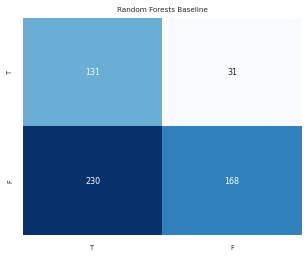

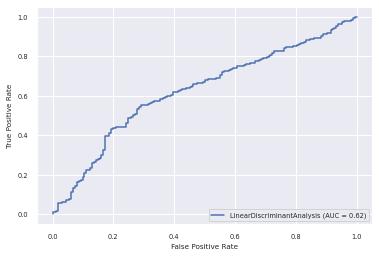

This is the starting index: 4476 of patient 10
0.8552875695732839
[([0], 0, array([0.53088411, 0.46911589])), ([0], 0, array([0.5540835, 0.4459165])), ([0], 0, array([0.57239824, 0.42760176])), ([0], 0, array([0.55181376, 0.44818624])), ([0], 0, array([0.61613802, 0.38386198])), ([0], 0, array([0.52306325, 0.47693675])), ([1], 0, array([0.5647269, 0.4352731])), ([1], 0, array([0.58959457, 0.41040543])), ([0], 0, array([0.63208462, 0.36791538])), ([0], 0, array([0.60055593, 0.39944407])), ([1], 0, array([0.50327165, 0.49672835])), ([1], 0, array([0.63392972, 0.36607028])), ([1], 0, array([0.79925233, 0.20074767])), ([0], 0, array([0.66811819, 0.33188181])), ([0], 0, array([0.73945225, 0.26054775])), ([0], 0, array([0.7614308, 0.2385692])), ([0], 0, array([0.67971443, 0.32028557])), ([0], 0, array([0.63137469, 0.36862531])), ([1], 0, array([0.54381403, 0.45618597])), ([0], 0, array([0.65719094, 0.34280906])), ([1], 0, array([0.86104128, 0.13895872])), ([0], 1, array([0.45730945, 0.542690

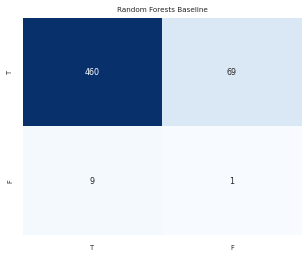

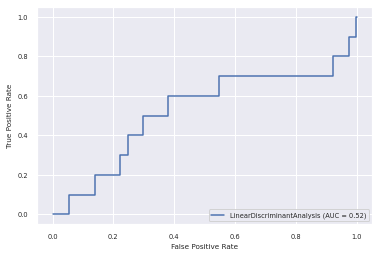

This is the starting index: 5016 of patient 11
0.6883116883116883
[([0], 1, array([0.41501239, 0.58498761])), ([0], 0, array([0.55673583, 0.44326417])), ([0], 0, array([0.52586379, 0.47413621])), ([0], 1, array([0.47521678, 0.52478322])), ([0], 1, array([0.36721876, 0.63278124])), ([0], 1, array([0.46827631, 0.53172369])), ([0], 1, array([0.32543249, 0.67456751])), ([0], 1, array([0.418771, 0.581229])), ([0], 0, array([0.57767761, 0.42232239])), ([0], 0, array([0.75695668, 0.24304332])), ([0], 0, array([0.66641291, 0.33358709])), ([0], 0, array([0.62632695, 0.37367305])), ([0], 0, array([0.65821654, 0.34178346])), ([1], 0, array([0.66504183, 0.33495817])), ([0], 0, array([0.57645088, 0.42354912])), ([1], 0, array([0.71172961, 0.28827039])), ([0], 0, array([0.7654082, 0.2345918])), ([0], 0, array([0.5760094, 0.4239906])), ([0], 0, array([0.59960704, 0.40039296])), ([1], 0, array([0.64376282, 0.35623718])), ([0], 0, array([0.6605947, 0.3394053])), ([0], 0, array([0.68086304, 0.31913696])

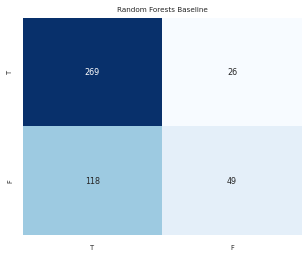

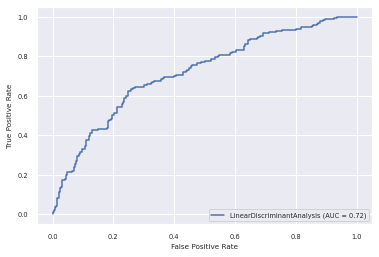

This is the starting index: 5479 of patient 12
0.6705882352941176
[([0], 0, array([0.55576154, 0.44423846])), ([0], 0, array([0.53706689, 0.46293311])), ([0], 1, array([0.48468843, 0.51531157])), ([0], 1, array([0.48658625, 0.51341375])), ([0], 0, array([0.57567059, 0.42432941])), ([0], 0, array([0.50681214, 0.49318786])), ([0], 0, array([0.55762204, 0.44237796])), ([0], 0, array([0.52316778, 0.47683222])), ([0], 1, array([0.44597259, 0.55402741])), ([0], 0, array([0.54173333, 0.45826667])), ([0], 0, array([0.50335695, 0.49664305])), ([0], 0, array([0.57996508, 0.42003492])), ([0], 0, array([0.58202205, 0.41797795])), ([0], 0, array([0.54149167, 0.45850833])), ([0], 0, array([0.51282783, 0.48717217])), ([0], 0, array([0.52179732, 0.47820268])), ([0], 0, array([0.5204948, 0.4795052])), ([0], 0, array([0.66801853, 0.33198147])), ([0], 0, array([0.56484198, 0.43515802])), ([0], 0, array([0.5682822, 0.4317178])), ([0], 0, array([0.69658654, 0.30341346])), ([0], 0, array([0.5405793, 0.45942

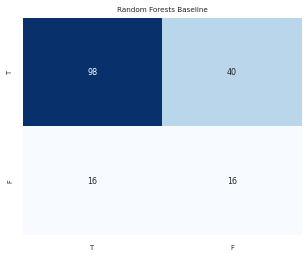

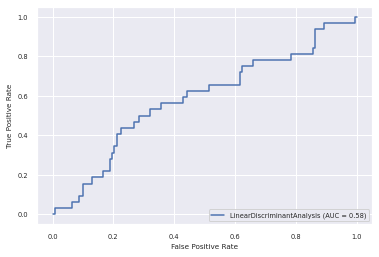

<function matplotlib.pyplot.show>

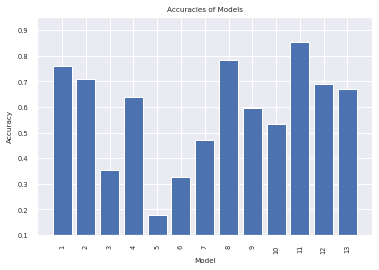

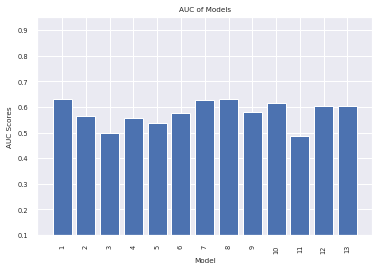

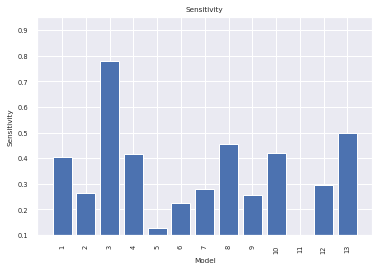

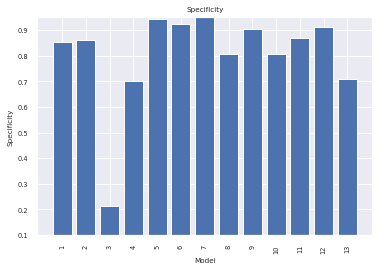

In [43]:
Accuracy = []
auc = []
sensitivity = []
specificity = []
clf = LinearDiscriminantAnalysis(shrinkage= 'auto', solver= 'lsqr')

for i in range(0,13):
    test, train, test_class, train_class = leave_one_out(df,i)
    clf.fit(train, train_class.ravel())

    y_predicted = clf.predict(test)
    print(metrics.accuracy_score(test_class,y_predicted))
        # print("Random Forest:\n",metrics.classification_report(test_class,y_predicted)) # Classification report
    Accuracy.append(metrics.accuracy_score(test_class,y_predicted))
    auc.append(metrics.roc_auc_score(test_class,y_predicted))
    pred = clf.predict_proba(test)
    result = [*zip(test_class.tolist(), y_predicted, pred)]
    print(result)
    report = metrics.classification_report(test_class.tolist(), y_predicted)
    matrix = metrics.confusion_matrix(test_class.tolist(),y_predicted)   

    mcm = confusion_matrix(test_class,y_predicted)
    tn = mcm[0, 0]
    tp = mcm[1, 1]
    fn = mcm[1, 0]
    fp = mcm[0, 1]
    sensitivity.append(tp / (tp + fn))
    specificity.append(tn / (tn + fp))
    fig, (ax1) = plt.subplots(1, figsize=(5, 4))


    df_cm1 = pd.DataFrame(matrix, range(2), range(2))
    sn.set(font_scale=0.6) # for label size
    sn.heatmap(df_cm1, annot=True,annot_kws={"size": 8}, fmt='g', cmap='Blues', cbar= False, xticklabels=x_axis_labels, yticklabels=y_axis_labels, ax = ax1) # font size


    ax1.set_title('Random Forests Baseline')

    plt.show()
    metrics.plot_roc_curve(clf, test, test_class.tolist())  # doctest: +SKIP
    plt.show()

Model=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13']

Index = [1,2,3,4,5,6,7,8,9,10,11,12,13]
fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,Accuracy)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Accuracy')
plt.xlabel('Model')
plt.title('Accuracies of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,auc)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('AUC Scores')
plt.xlabel('Model')
plt.title('AUC of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,sensitivity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Sensitivity')
plt.xlabel('Model')
plt.title('Sensitivity')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,specificity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Specificity')
plt.xlabel('Model')
plt.title('Specificity')
plt.show

#### Low Variance

This is the starting index: 0 of patient 0
0.7556719022687609
[([1], 1, array([0.26717886, 0.73282114])), ([1], 1, array([0.49431259, 0.50568741])), ([0], 1, array([0.47422467, 0.52577533])), ([1], 0, array([0.59139669, 0.40860331])), ([1], 1, array([0.29348308, 0.70651692])), ([0], 0, array([0.55958998, 0.44041002])), ([1], 0, array([0.84955929, 0.15044071])), ([0], 0, array([0.57704178, 0.42295822])), ([1], 1, array([0.29047493, 0.70952507])), ([0], 1, array([0.26547639, 0.73452361])), ([0], 0, array([0.54909413, 0.45090587])), ([1], 1, array([0.36204666, 0.63795334])), ([1], 1, array([0.37010988, 0.62989012])), ([0], 0, array([0.70296924, 0.29703076])), ([1], 0, array([0.52043048, 0.47956952])), ([1], 1, array([0.39080759, 0.60919241])), ([1], 1, array([0.35410808, 0.64589192])), ([1], 0, array([0.53118463, 0.46881537])), ([1], 1, array([0.44913334, 0.55086666])), ([1], 1, array([0.44540851, 0.55459149])), ([0], 0, array([0.60337966, 0.39662034])), ([1], 1, array([0.4270111, 0.57298

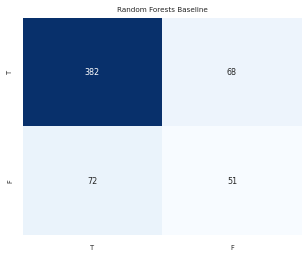

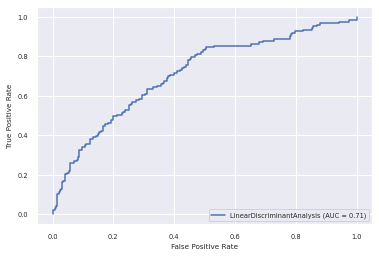

This is the starting index: 574 of patient 1
0.721030042918455
[([0], 0, array([0.5334334, 0.4665666])), ([0], 1, array([0.42523619, 0.57476381])), ([0], 0, array([0.6754194, 0.3245806])), ([0], 1, array([0.30107062, 0.69892938])), ([0], 0, array([0.50517406, 0.49482594])), ([0], 0, array([0.55148286, 0.44851714])), ([1], 1, array([0.29905145, 0.70094855])), ([0], 0, array([0.5248116, 0.4751884])), ([0], 0, array([0.61776789, 0.38223211])), ([0], 1, array([0.30230069, 0.69769931])), ([0], 1, array([0.49995787, 0.50004213])), ([0], 1, array([0.39556114, 0.60443886])), ([1], 1, array([0.36711126, 0.63288874])), ([0], 0, array([0.54129362, 0.45870638])), ([0], 0, array([0.61888789, 0.38111211])), ([0], 0, array([0.72296181, 0.27703819])), ([0], 0, array([0.50828018, 0.49171982])), ([0], 0, array([0.77798204, 0.22201796])), ([1], 0, array([0.50021563, 0.49978437])), ([0], 0, array([0.69302532, 0.30697468])), ([1], 1, array([0.16817056, 0.83182944])), ([0], 0, array([0.7168914, 0.2831086]))

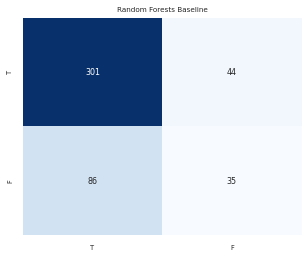

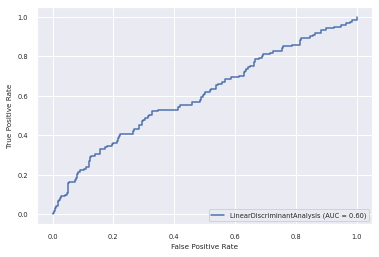

This is the starting index: 1041 of patient 2
0.3515358361774744
[([1], 1, array([0.38245219, 0.61754781])), ([0], 1, array([0.23552344, 0.76447656])), ([0], 1, array([0.16412465, 0.83587535])), ([1], 1, array([0.11336473, 0.88663527])), ([0], 1, array([0.13710505, 0.86289495])), ([0], 1, array([0.24201347, 0.75798653])), ([0], 1, array([0.07568805, 0.92431195])), ([1], 1, array([0.13264496, 0.86735504])), ([1], 1, array([0.22800325, 0.77199675])), ([1], 1, array([0.34214652, 0.65785348])), ([1], 1, array([0.14665716, 0.85334284])), ([1], 1, array([0.28917643, 0.71082357])), ([1], 1, array([0.26270918, 0.73729082])), ([0], 1, array([0.32599176, 0.67400824])), ([1], 1, array([0.37493725, 0.62506275])), ([1], 0, array([0.51651838, 0.48348162])), ([0], 1, array([0.32275461, 0.67724539])), ([0], 1, array([0.21011537, 0.78988463])), ([0], 1, array([0.16391378, 0.83608622])), ([0], 0, array([0.60722058, 0.39277942])), ([0], 1, array([0.06149001, 0.93850999])), ([0], 1, array([0.44885708, 0.5

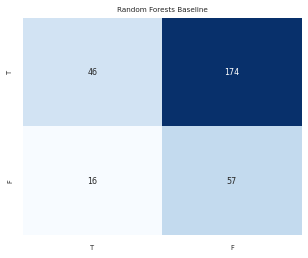

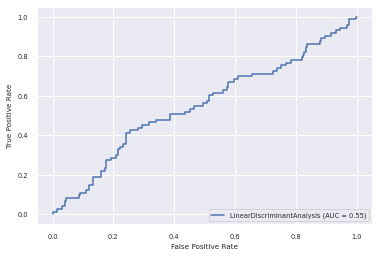

This is the starting index: 1335 of patient 3
0.6243386243386243
[([0], 0, array([0.52697108, 0.47302892])), ([1], 1, array([0.32644783, 0.67355217])), ([1], 1, array([0.44792263, 0.55207737])), ([1], 1, array([0.44618681, 0.55381319])), ([1], 1, array([0.17474521, 0.82525479])), ([1], 0, array([0.54344333, 0.45655667])), ([1], 0, array([0.57095542, 0.42904458])), ([0], 1, array([0.42328099, 0.57671901])), ([0], 0, array([0.53891838, 0.46108162])), ([0], 0, array([0.5939079, 0.4060921])), ([0], 1, array([0.40336959, 0.59663041])), ([0], 1, array([0.3833297, 0.6166703])), ([0], 0, array([0.62841095, 0.37158905])), ([1], 1, array([0.43345274, 0.56654726])), ([0], 0, array([0.55888478, 0.44111522])), ([0], 1, array([0.46495453, 0.53504547])), ([0], 0, array([0.54367154, 0.45632846])), ([0], 1, array([0.26101655, 0.73898345])), ([0], 1, array([0.46534232, 0.53465768])), ([0], 0, array([0.74280714, 0.25719286])), ([0], 0, array([0.57784618, 0.42215382])), ([0], 1, array([0.39554813, 0.60445

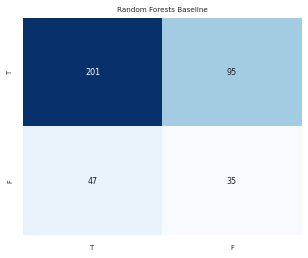

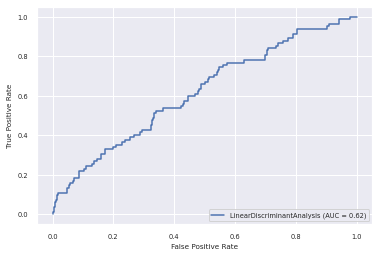

This is the starting index: 1714 of patient 4
0.18604651162790697
[([1], 1, array([0.4888835, 0.5111165])), ([1], 0, array([0.63321885, 0.36678115])), ([1], 0, array([0.65405819, 0.34594181])), ([1], 1, array([0.44704728, 0.55295272])), ([1], 1, array([0.49244738, 0.50755262])), ([1], 0, array([0.57727062, 0.42272938])), ([1], 0, array([0.57675007, 0.42324993])), ([1], 0, array([0.60096489, 0.39903511])), ([1], 0, array([0.75405737, 0.24594263])), ([1], 1, array([0.37295265, 0.62704735])), ([1], 0, array([0.63909493, 0.36090507])), ([1], 0, array([0.64472388, 0.35527612])), ([1], 1, array([0.49962064, 0.50037936])), ([1], 1, array([0.45616976, 0.54383024])), ([1], 0, array([0.53252734, 0.46747266])), ([1], 0, array([0.58035553, 0.41964447])), ([1], 0, array([0.65431451, 0.34568549])), ([1], 0, array([0.56626451, 0.43373549])), ([1], 0, array([0.58292073, 0.41707927])), ([1], 0, array([0.58356917, 0.41643083])), ([1], 0, array([0.61387981, 0.38612019])), ([1], 0, array([0.64247436, 0.35

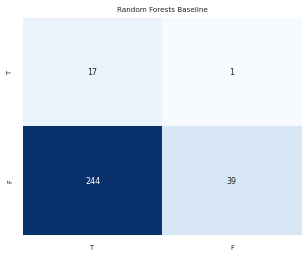

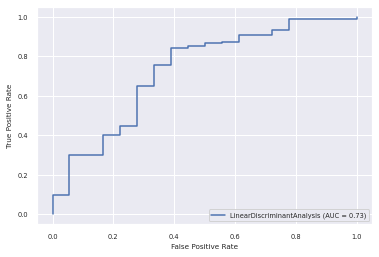

This is the starting index: 2016 of patient 5
0.3325942350332594
[([0], 0, array([0.63494522, 0.36505478])), ([0], 0, array([0.80124731, 0.19875269])), ([0], 0, array([0.63399292, 0.36600708])), ([0], 0, array([0.81617333, 0.18382667])), ([0], 0, array([0.80033507, 0.19966493])), ([0], 0, array([0.79040702, 0.20959298])), ([1], 0, array([0.69462117, 0.30537883])), ([1], 0, array([0.82977344, 0.17022656])), ([1], 0, array([0.71904443, 0.28095557])), ([1], 0, array([0.67835598, 0.32164402])), ([0], 0, array([0.75075848, 0.24924152])), ([1], 0, array([0.80086516, 0.19913484])), ([0], 0, array([0.7230839, 0.2769161])), ([1], 0, array([0.69643623, 0.30356377])), ([1], 0, array([0.82973222, 0.17026778])), ([1], 0, array([0.50898664, 0.49101336])), ([1], 0, array([0.56457566, 0.43542434])), ([1], 0, array([0.68491243, 0.31508757])), ([1], 0, array([0.7317202, 0.2682798])), ([1], 0, array([0.73886633, 0.26113367])), ([1], 1, array([0.39338546, 0.60661454])), ([1], 0, array([0.70655965, 0.29344

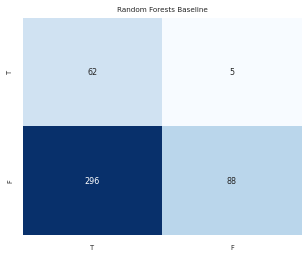

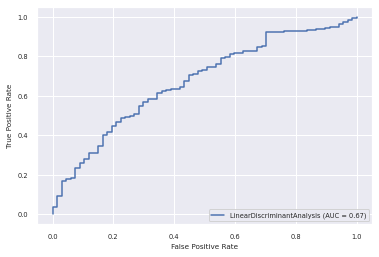

This is the starting index: 2468 of patient 6
0.47506561679790027
[([1], 1, array([0.39388456, 0.60611544])), ([1], 1, array([0.427215, 0.572785])), ([1], 1, array([0.46840947, 0.53159053])), ([1], 0, array([0.62329526, 0.37670474])), ([1], 0, array([0.58395023, 0.41604977])), ([1], 0, array([0.67387612, 0.32612388])), ([1], 1, array([0.37991445, 0.62008555])), ([1], 0, array([0.84517863, 0.15482137])), ([1], 0, array([0.50112835, 0.49887165])), ([1], 0, array([0.64613346, 0.35386654])), ([0], 0, array([0.78943774, 0.21056226])), ([1], 1, array([0.16288689, 0.83711311])), ([1], 0, array([0.71356522, 0.28643478])), ([1], 1, array([0.19332468, 0.80667532])), ([1], 1, array([0.49146972, 0.50853028])), ([1], 1, array([0.32184383, 0.67815617])), ([1], 1, array([0.06658334, 0.93341666])), ([1], 1, array([0.44860372, 0.55139628])), ([1], 0, array([0.52518574, 0.47481426])), ([0], 0, array([0.94786495, 0.05213505])), ([1], 0, array([0.68773218, 0.31226782])), ([1], 0, array([0.54940567, 0.4505

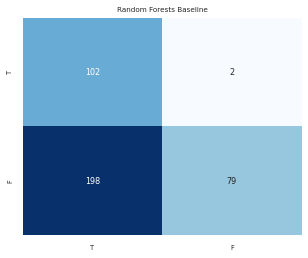

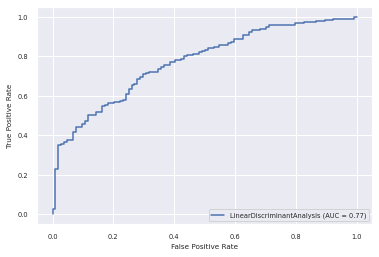

This is the starting index: 2850 of patient 7
0.7938144329896907
[([0], 1, array([0.47381237, 0.52618763])), ([0], 0, array([0.52996426, 0.47003574])), ([0], 0, array([0.60034725, 0.39965275])), ([0], 0, array([0.59435944, 0.40564056])), ([0], 1, array([0.4810889, 0.5189111])), ([0], 0, array([0.60764007, 0.39235993])), ([0], 1, array([0.40213308, 0.59786692])), ([0], 0, array([0.79776232, 0.20223768])), ([0], 0, array([0.53812456, 0.46187544])), ([0], 0, array([0.63323767, 0.36676233])), ([0], 0, array([0.75801368, 0.24198632])), ([0], 1, array([0.35439202, 0.64560798])), ([0], 1, array([0.22023401, 0.77976599])), ([0], 1, array([0.32874286, 0.67125714])), ([0], 0, array([0.55774854, 0.44225146])), ([0], 0, array([0.85215826, 0.14784174])), ([0], 0, array([0.68817364, 0.31182636])), ([0], 0, array([0.52572908, 0.47427092])), ([0], 0, array([0.58813721, 0.41186279])), ([0], 0, array([0.76658604, 0.23341396])), ([0], 0, array([0.51881066, 0.48118934])), ([0], 0, array([0.6931552, 0.3068

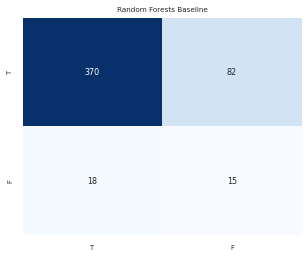

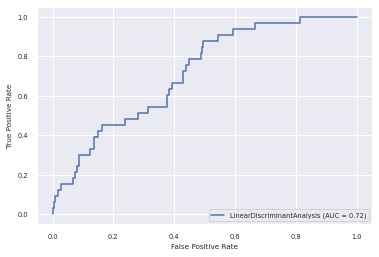

This is the starting index: 3336 of patient 8
0.5899653979238755
[([1], 0, array([0.66131979, 0.33868021])), ([1], 0, array([0.57459365, 0.42540635])), ([0], 0, array([0.79016325, 0.20983675])), ([1], 0, array([0.82583973, 0.17416027])), ([1], 0, array([0.67318965, 0.32681035])), ([1], 1, array([0.34060064, 0.65939936])), ([1], 0, array([0.50764335, 0.49235665])), ([1], 0, array([0.54171038, 0.45828962])), ([1], 0, array([0.57655228, 0.42344772])), ([1], 1, array([0.36045567, 0.63954433])), ([0], 0, array([0.71619524, 0.28380476])), ([1], 0, array([0.6393993, 0.3606007])), ([0], 0, array([0.74261988, 0.25738012])), ([1], 0, array([0.5436201, 0.4563799])), ([1], 1, array([0.28249655, 0.71750345])), ([0], 0, array([0.84325601, 0.15674399])), ([0], 0, array([0.52439069, 0.47560931])), ([1], 0, array([0.81449706, 0.18550294])), ([1], 1, array([0.47155172, 0.52844828])), ([1], 0, array([0.67780842, 0.32219158])), ([1], 1, array([0.32023414, 0.67976586])), ([0], 1, array([0.30406746, 0.69593

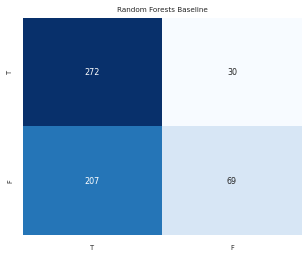

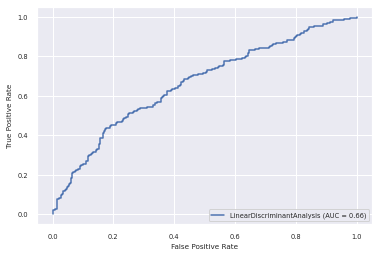

This is the starting index: 3915 of patient 9
0.5339285714285714
[([1], 1, array([0.30362034, 0.69637966])), ([1], 1, array([0.43685302, 0.56314698])), ([1], 1, array([0.27386096, 0.72613904])), ([1], 1, array([0.41856642, 0.58143358])), ([1], 1, array([0.35124762, 0.64875238])), ([1], 1, array([0.40426076, 0.59573924])), ([1], 1, array([0.49089191, 0.50910809])), ([1], 1, array([0.45037316, 0.54962684])), ([1], 1, array([0.40132405, 0.59867595])), ([1], 1, array([0.3131308, 0.6868692])), ([1], 0, array([0.53503575, 0.46496425])), ([1], 1, array([0.3639517, 0.6360483])), ([1], 1, array([0.49235378, 0.50764622])), ([1], 1, array([0.35249901, 0.64750099])), ([1], 1, array([0.37248744, 0.62751256])), ([1], 0, array([0.57343993, 0.42656007])), ([1], 1, array([0.39735753, 0.60264247])), ([1], 1, array([0.33459059, 0.66540941])), ([1], 1, array([0.32258717, 0.67741283])), ([1], 0, array([0.55806866, 0.44193134])), ([1], 1, array([0.39082685, 0.60917315])), ([1], 1, array([0.47939556, 0.52060

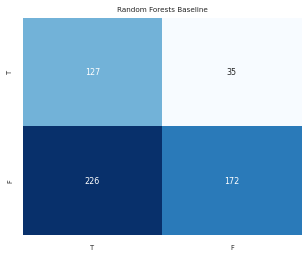

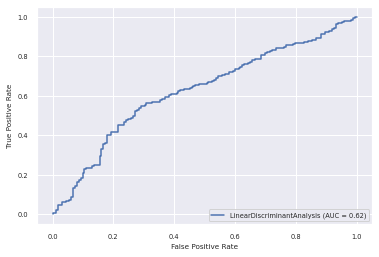

This is the starting index: 4476 of patient 10
0.8385899814471243
[([0], 0, array([0.53949456, 0.46050544])), ([0], 0, array([0.55449858, 0.44550142])), ([0], 0, array([0.58830102, 0.41169898])), ([0], 0, array([0.55936511, 0.44063489])), ([0], 0, array([0.6219275, 0.3780725])), ([0], 0, array([0.53443892, 0.46556108])), ([1], 0, array([0.56071549, 0.43928451])), ([1], 0, array([0.58859278, 0.41140722])), ([0], 0, array([0.66578384, 0.33421616])), ([0], 0, array([0.62686756, 0.37313244])), ([1], 0, array([0.50607832, 0.49392168])), ([1], 0, array([0.63978787, 0.36021213])), ([1], 0, array([0.80867479, 0.19132521])), ([0], 0, array([0.66335537, 0.33664463])), ([0], 0, array([0.74704657, 0.25295343])), ([0], 0, array([0.7888, 0.2112])), ([0], 0, array([0.66189937, 0.33810063])), ([0], 0, array([0.65222041, 0.34777959])), ([1], 0, array([0.54862314, 0.45137686])), ([0], 0, array([0.65492141, 0.34507859])), ([1], 0, array([0.85639798, 0.14360202])), ([0], 1, array([0.45833531, 0.54166469])

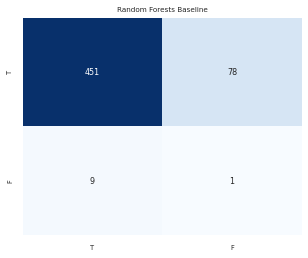

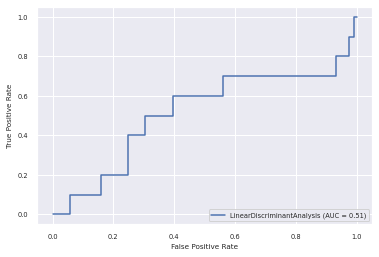

This is the starting index: 5016 of patient 11
0.696969696969697
[([0], 1, array([0.40835854, 0.59164146])), ([0], 0, array([0.5762674, 0.4237326])), ([0], 0, array([0.52482715, 0.47517285])), ([0], 1, array([0.46007257, 0.53992743])), ([0], 1, array([0.37296356, 0.62703644])), ([0], 1, array([0.46074254, 0.53925746])), ([0], 1, array([0.34081469, 0.65918531])), ([0], 1, array([0.41302323, 0.58697677])), ([0], 0, array([0.55292502, 0.44707498])), ([0], 0, array([0.77039049, 0.22960951])), ([0], 0, array([0.62514749, 0.37485251])), ([0], 0, array([0.62748749, 0.37251251])), ([0], 0, array([0.66159304, 0.33840696])), ([1], 0, array([0.64988741, 0.35011259])), ([0], 0, array([0.58907798, 0.41092202])), ([1], 0, array([0.7330704, 0.2669296])), ([0], 0, array([0.77547353, 0.22452647])), ([0], 0, array([0.58514827, 0.41485173])), ([0], 0, array([0.60201537, 0.39798463])), ([1], 0, array([0.64561269, 0.35438731])), ([0], 0, array([0.66080863, 0.33919137])), ([0], 0, array([0.66913329, 0.33086

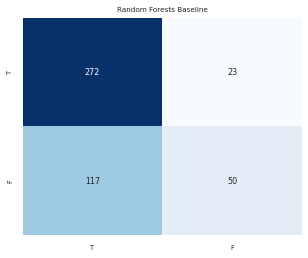

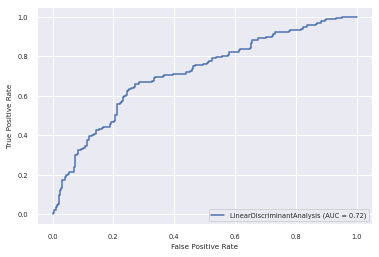

This is the starting index: 5479 of patient 12
0.6705882352941176
[([0], 0, array([0.56747425, 0.43252575])), ([0], 0, array([0.5446633, 0.4553367])), ([0], 1, array([0.48716889, 0.51283111])), ([0], 1, array([0.48871545, 0.51128455])), ([0], 0, array([0.57315442, 0.42684558])), ([0], 1, array([0.49700037, 0.50299963])), ([0], 0, array([0.55153477, 0.44846523])), ([0], 0, array([0.52937397, 0.47062603])), ([0], 1, array([0.44238847, 0.55761153])), ([0], 0, array([0.54152059, 0.45847941])), ([0], 0, array([0.51303257, 0.48696743])), ([0], 0, array([0.587056, 0.412944])), ([0], 0, array([0.58367046, 0.41632954])), ([0], 0, array([0.52709491, 0.47290509])), ([0], 0, array([0.51716928, 0.48283072])), ([0], 0, array([0.52697649, 0.47302351])), ([0], 0, array([0.51902167, 0.48097833])), ([0], 0, array([0.67883861, 0.32116139])), ([0], 0, array([0.58095476, 0.41904524])), ([0], 0, array([0.5625526, 0.4374474])), ([0], 0, array([0.70305371, 0.29694629])), ([0], 0, array([0.53767138, 0.46232862

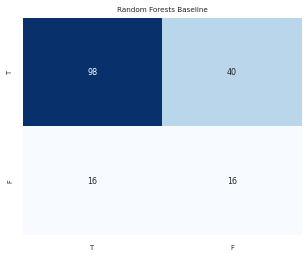

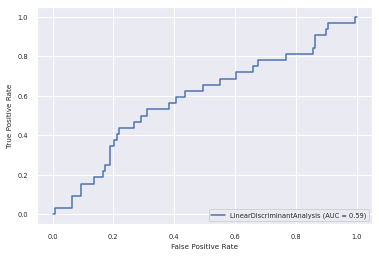

<function matplotlib.pyplot.show>

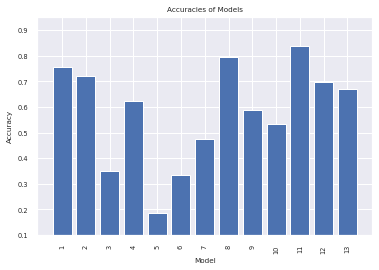

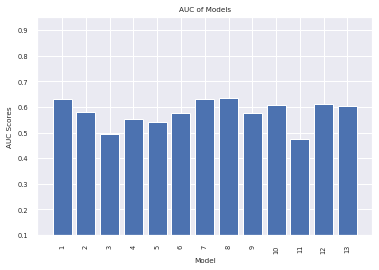

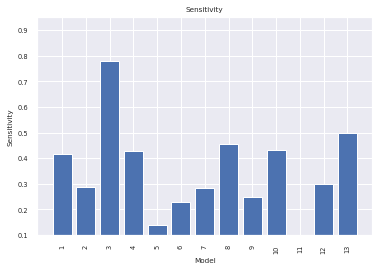

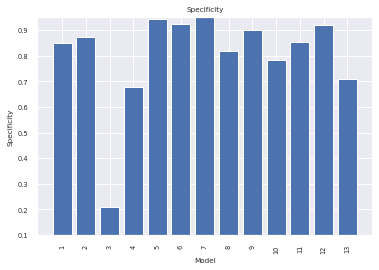

In [44]:
Accuracy = []
auc = []
sensitivity = []
specificity = []

clf = LinearDiscriminantAnalysis()
sel = VarianceThreshold(threshold=(.1 * (1 - .8)))
for i in range(0,13):
    test, train, test_class, train_class = leave_one_out(df,i)
    sel.fit_transform(train)
    sel.fit_transform(test)
    clf.fit(train, train_class.ravel())

    y_predicted = clf.predict(test)
    print(metrics.accuracy_score(test_class,y_predicted))
        # print("Random Forest:\n",metrics.classification_report(test_class,y_predicted)) # Classification report
    Accuracy.append(metrics.accuracy_score(test_class,y_predicted))
    auc.append(metrics.roc_auc_score(test_class,y_predicted))
    mcm = confusion_matrix(test_class,y_predicted)
    tn = mcm[0, 0]
    tp = mcm[1, 1]
    fn = mcm[1, 0]
    fp = mcm[0, 1]
    sensitivity.append(tp / (tp + fn))
    specificity.append(tn / (tn + fp))
    pred = clf.predict_proba(test)
    result = [*zip(test_class.tolist(), y_predicted, pred)]
    print(result)
    report = metrics.classification_report(test_class.tolist(), y_predicted)
    matrix = metrics.confusion_matrix(test_class.tolist(),y_predicted)   

    fig, (ax1) = plt.subplots(1, figsize=(5, 4))


    df_cm1 = pd.DataFrame(matrix, range(2), range(2))
    sn.set(font_scale=0.6) # for label size
    sn.heatmap(df_cm1, annot=True,annot_kws={"size": 8}, fmt='g', cmap='Blues', cbar= False, xticklabels=x_axis_labels, yticklabels=y_axis_labels, ax = ax1) # font size


    ax1.set_title('Random Forests Baseline')

    plt.show()
    metrics.plot_roc_curve(clf, test, test_class.tolist())  # doctest: +SKIP
    plt.show()

Model=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13']

Index = [1,2,3,4,5,6,7,8,9,10,11,12,13]
fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,Accuracy)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Accuracy')
plt.xlabel('Model')
plt.title('Accuracies of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,auc)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('AUC Scores')
plt.xlabel('Model')
plt.title('AUC of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,sensitivity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Sensitivity')
plt.xlabel('Model')
plt.title('Sensitivity')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,specificity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Specificity')
plt.xlabel('Model')
plt.title('Specificity')
plt.show

#### Univariate Feature Selection

#### L1-based feature selection

This is the starting index: 0 of patient 0
0.7417102966841187
[([1], 1, array([0.35981535, 0.64018465])), ([1], 0, array([0.52544443, 0.47455557])), ([0], 1, array([0.47567165, 0.52432835])), ([1], 0, array([0.52039402, 0.47960598])), ([1], 1, array([0.28815058, 0.71184942])), ([0], 0, array([0.548816, 0.451184])), ([1], 0, array([0.68125544, 0.31874456])), ([0], 0, array([0.71007474, 0.28992526])), ([1], 1, array([0.34522767, 0.65477233])), ([0], 1, array([0.2909611, 0.7090389])), ([0], 1, array([0.45638708, 0.54361292])), ([1], 1, array([0.37248337, 0.62751663])), ([1], 1, array([0.40203726, 0.59796274])), ([0], 0, array([0.6787352, 0.3212648])), ([1], 1, array([0.47990698, 0.52009302])), ([1], 1, array([0.41752189, 0.58247811])), ([1], 1, array([0.35546751, 0.64453249])), ([1], 1, array([0.47619916, 0.52380084])), ([1], 1, array([0.40932028, 0.59067972])), ([1], 0, array([0.51344027, 0.48655973])), ([0], 0, array([0.57614799, 0.42385201])), ([1], 1, array([0.42568595, 0.57431405])),

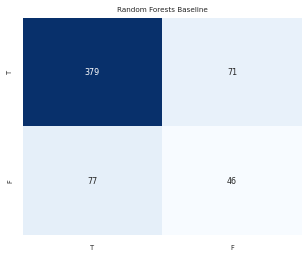

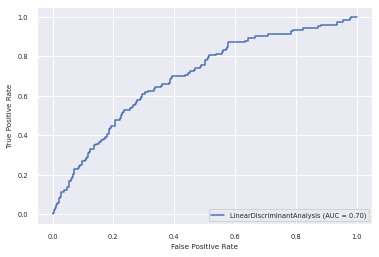

This is the starting index: 574 of patient 1
0.7124463519313304
[([0], 0, array([0.59299681, 0.40700319])), ([0], 0, array([0.51532015, 0.48467985])), ([0], 0, array([0.57635706, 0.42364294])), ([0], 1, array([0.40137197, 0.59862803])), ([0], 1, array([0.45941311, 0.54058689])), ([0], 0, array([0.65807882, 0.34192118])), ([1], 1, array([0.41710858, 0.58289142])), ([0], 0, array([0.54027843, 0.45972157])), ([0], 0, array([0.68526161, 0.31473839])), ([0], 1, array([0.35572842, 0.64427158])), ([0], 0, array([0.53050451, 0.46949549])), ([0], 0, array([0.51735435, 0.48264565])), ([1], 1, array([0.47616076, 0.52383924])), ([0], 0, array([0.59378029, 0.40621971])), ([0], 0, array([0.6401427, 0.3598573])), ([0], 0, array([0.59636815, 0.40363185])), ([0], 0, array([0.58744244, 0.41255756])), ([0], 0, array([0.70807503, 0.29192497])), ([1], 0, array([0.55665714, 0.44334286])), ([0], 0, array([0.76588086, 0.23411914])), ([1], 1, array([0.2812508, 0.7187492])), ([0], 0, array([0.59663667, 0.403363

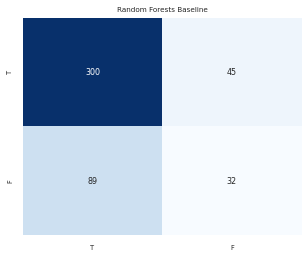

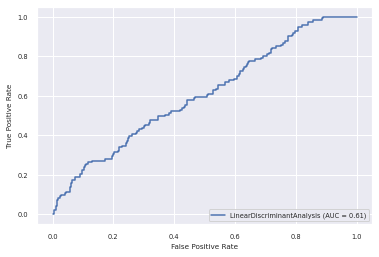

This is the starting index: 1041 of patient 2
0.43686006825938567
[([1], 0, array([0.58700803, 0.41299197])), ([0], 1, array([0.17864567, 0.82135433])), ([0], 1, array([0.18652675, 0.81347325])), ([1], 1, array([0.17480642, 0.82519358])), ([0], 1, array([0.13073518, 0.86926482])), ([0], 1, array([0.20277156, 0.79722844])), ([0], 1, array([0.09180599, 0.90819401])), ([1], 1, array([0.18645221, 0.81354779])), ([1], 1, array([0.1880813, 0.8119187])), ([1], 1, array([0.37295486, 0.62704514])), ([1], 1, array([0.31269494, 0.68730506])), ([1], 1, array([0.32791667, 0.67208333])), ([1], 1, array([0.17820216, 0.82179784])), ([0], 1, array([0.47439584, 0.52560416])), ([1], 1, array([0.42802333, 0.57197667])), ([1], 0, array([0.51126378, 0.48873622])), ([0], 1, array([0.35309988, 0.64690012])), ([0], 1, array([0.17414753, 0.82585247])), ([0], 1, array([0.33741014, 0.66258986])), ([0], 0, array([0.62809347, 0.37190653])), ([0], 1, array([0.18189385, 0.81810615])), ([0], 1, array([0.32005129, 0.67

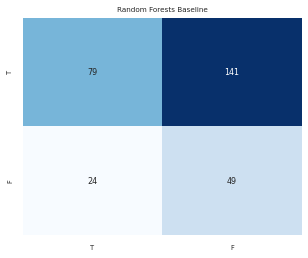

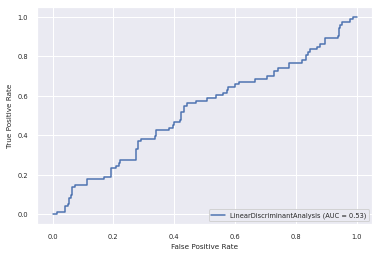

This is the starting index: 1335 of patient 3
0.6587301587301587
[([0], 0, array([0.63944759, 0.36055241])), ([1], 1, array([0.45325758, 0.54674242])), ([1], 0, array([0.53713295, 0.46286705])), ([1], 1, array([0.43260361, 0.56739639])), ([1], 1, array([0.25723631, 0.74276369])), ([1], 0, array([0.68527644, 0.31472356])), ([1], 0, array([0.55720565, 0.44279435])), ([0], 0, array([0.59562094, 0.40437906])), ([0], 0, array([0.60704633, 0.39295367])), ([0], 1, array([0.39983458, 0.60016542])), ([0], 1, array([0.4427783, 0.5572217])), ([0], 1, array([0.46584961, 0.53415039])), ([0], 1, array([0.47312758, 0.52687242])), ([1], 0, array([0.59680261, 0.40319739])), ([0], 1, array([0.45526138, 0.54473862])), ([0], 1, array([0.48404057, 0.51595943])), ([0], 0, array([0.58225352, 0.41774648])), ([0], 1, array([0.18503077, 0.81496923])), ([0], 0, array([0.55698197, 0.44301803])), ([0], 0, array([0.52026562, 0.47973438])), ([0], 0, array([0.71476797, 0.28523203])), ([0], 0, array([0.50212839, 0.497

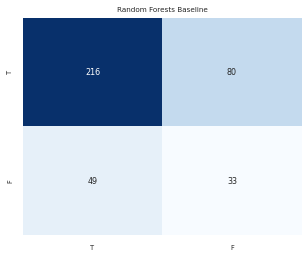

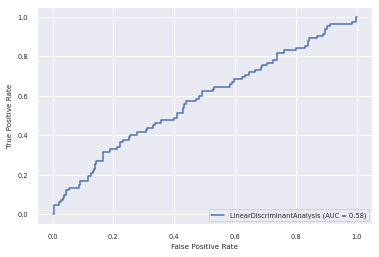

This is the starting index: 1714 of patient 4
0.1461794019933555
[([1], 0, array([0.66795786, 0.33204214])), ([1], 0, array([0.61646756, 0.38353244])), ([1], 0, array([0.70287824, 0.29712176])), ([1], 0, array([0.58217767, 0.41782233])), ([1], 0, array([0.56826882, 0.43173118])), ([1], 0, array([0.60430401, 0.39569599])), ([1], 0, array([0.59898212, 0.40101788])), ([1], 0, array([0.66031306, 0.33968694])), ([1], 0, array([0.63360881, 0.36639119])), ([1], 1, array([0.45278521, 0.54721479])), ([1], 0, array([0.67370928, 0.32629072])), ([1], 0, array([0.7373341, 0.2626659])), ([1], 0, array([0.55152725, 0.44847275])), ([1], 1, array([0.27024731, 0.72975269])), ([1], 0, array([0.57533566, 0.42466434])), ([1], 0, array([0.58783553, 0.41216447])), ([1], 0, array([0.66051361, 0.33948639])), ([1], 0, array([0.70100816, 0.29899184])), ([1], 0, array([0.69259355, 0.30740645])), ([1], 0, array([0.66101555, 0.33898445])), ([1], 0, array([0.69701941, 0.30298059])), ([1], 0, array([0.56353268, 0.436

/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


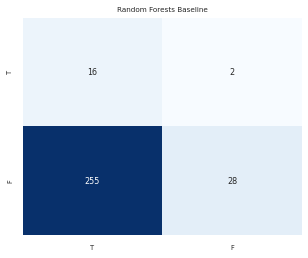

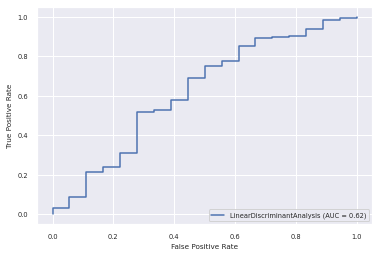

This is the starting index: 2016 of patient 5
0.3215077605321508
[([0], 0, array([0.64926517, 0.35073483])), ([0], 0, array([0.75859915, 0.24140085])), ([0], 0, array([0.70826254, 0.29173746])), ([0], 0, array([0.79017466, 0.20982534])), ([0], 0, array([0.77965846, 0.22034154])), ([0], 0, array([0.75279787, 0.24720213])), ([1], 0, array([0.67119397, 0.32880603])), ([1], 0, array([0.82630998, 0.17369002])), ([1], 0, array([0.75475479, 0.24524521])), ([1], 0, array([0.70451714, 0.29548286])), ([0], 0, array([0.72067014, 0.27932986])), ([1], 0, array([0.80876501, 0.19123499])), ([0], 0, array([0.73701393, 0.26298607])), ([1], 0, array([0.8044037, 0.1955963])), ([1], 0, array([0.76626502, 0.23373498])), ([1], 0, array([0.57844314, 0.42155686])), ([1], 0, array([0.67256856, 0.32743144])), ([1], 0, array([0.66874142, 0.33125858])), ([1], 0, array([0.73889143, 0.26110857])), ([1], 0, array([0.7160526, 0.2839474])), ([1], 1, array([0.46436132, 0.53563868])), ([1], 0, array([0.7334616, 0.266538

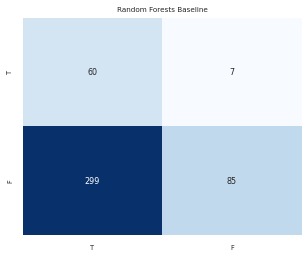

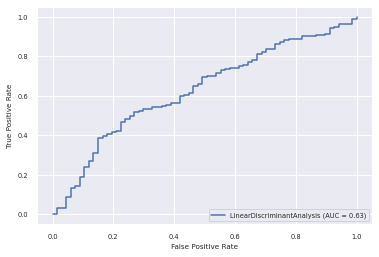

This is the starting index: 2468 of patient 6
0.4068241469816273
[([1], 0, array([0.54555758, 0.45444242])), ([1], 0, array([0.50758219, 0.49241781])), ([1], 1, array([0.39835348, 0.60164652])), ([1], 0, array([0.60657874, 0.39342126])), ([1], 0, array([0.58051952, 0.41948048])), ([1], 0, array([0.62827114, 0.37172886])), ([1], 1, array([0.48642508, 0.51357492])), ([1], 0, array([0.81430086, 0.18569914])), ([1], 0, array([0.63752468, 0.36247532])), ([1], 0, array([0.6694313, 0.3305687])), ([0], 0, array([0.75139905, 0.24860095])), ([1], 0, array([0.56689033, 0.43310967])), ([1], 0, array([0.74519459, 0.25480541])), ([1], 1, array([0.32091817, 0.67908183])), ([1], 0, array([0.75434783, 0.24565217])), ([1], 1, array([0.26221741, 0.73778259])), ([1], 1, array([0.44553452, 0.55446548])), ([1], 0, array([0.60638123, 0.39361877])), ([1], 0, array([0.54025307, 0.45974693])), ([0], 0, array([0.79133385, 0.20866615])), ([1], 0, array([0.69633392, 0.30366608])), ([1], 0, array([0.60178706, 0.398

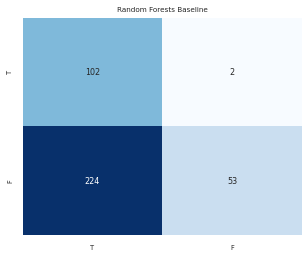

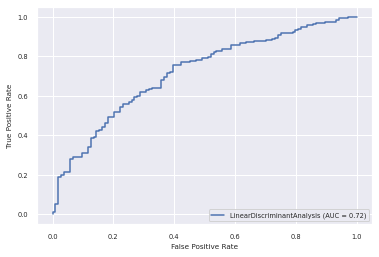

This is the starting index: 2850 of patient 7
0.756701030927835
[([0], 1, array([0.35320077, 0.64679923])), ([0], 1, array([0.47530241, 0.52469759])), ([0], 0, array([0.51745267, 0.48254733])), ([0], 0, array([0.55841654, 0.44158346])), ([0], 1, array([0.41944282, 0.58055718])), ([0], 0, array([0.60128792, 0.39871208])), ([0], 1, array([0.4822216, 0.5177784])), ([0], 0, array([0.79916606, 0.20083394])), ([0], 0, array([0.51003361, 0.48996639])), ([0], 0, array([0.55657917, 0.44342083])), ([0], 0, array([0.7102299, 0.2897701])), ([0], 1, array([0.36106299, 0.63893701])), ([0], 1, array([0.32323626, 0.67676374])), ([0], 1, array([0.30313343, 0.69686657])), ([0], 1, array([0.45202034, 0.54797966])), ([0], 0, array([0.79325213, 0.20674787])), ([0], 0, array([0.65800796, 0.34199204])), ([0], 0, array([0.66561295, 0.33438705])), ([0], 0, array([0.53253184, 0.46746816])), ([0], 0, array([0.69633361, 0.30366639])), ([0], 1, array([0.46802371, 0.53197629])), ([0], 0, array([0.7125416, 0.2874584

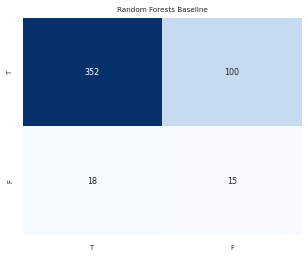

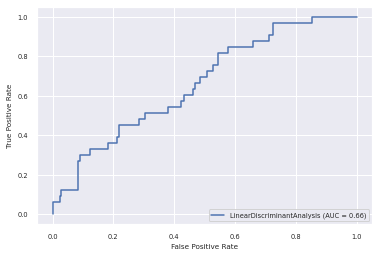

This is the starting index: 3336 of patient 8
0.6020761245674741
[([1], 0, array([0.67968724, 0.32031276])), ([1], 0, array([0.52379418, 0.47620582])), ([0], 0, array([0.74246436, 0.25753564])), ([1], 0, array([0.72658745, 0.27341255])), ([1], 0, array([0.59228961, 0.40771039])), ([1], 1, array([0.39852656, 0.60147344])), ([1], 0, array([0.59531458, 0.40468542])), ([1], 0, array([0.60710104, 0.39289896])), ([1], 0, array([0.54331147, 0.45668853])), ([1], 1, array([0.43921574, 0.56078426])), ([0], 0, array([0.63466271, 0.36533729])), ([1], 0, array([0.64587613, 0.35412387])), ([0], 0, array([0.75413027, 0.24586973])), ([1], 0, array([0.66263964, 0.33736036])), ([1], 1, array([0.40368014, 0.59631986])), ([0], 0, array([0.7894694, 0.2105306])), ([0], 1, array([0.49437692, 0.50562308])), ([1], 0, array([0.7960101, 0.2039899])), ([1], 1, array([0.48617835, 0.51382165])), ([1], 0, array([0.78793414, 0.21206586])), ([1], 1, array([0.35602904, 0.64397096])), ([0], 1, array([0.43216068, 0.56783

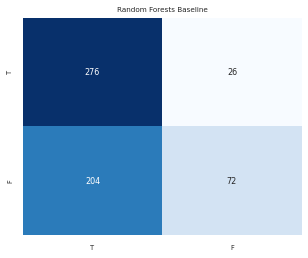

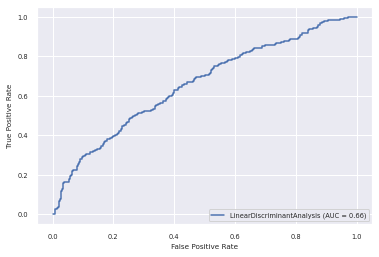

This is the starting index: 3915 of patient 9
0.42142857142857143
[([1], 1, array([0.38814027, 0.61185973])), ([1], 0, array([0.52302658, 0.47697342])), ([1], 1, array([0.34179155, 0.65820845])), ([1], 1, array([0.37336879, 0.62663121])), ([1], 0, array([0.60221169, 0.39778831])), ([1], 0, array([0.52550067, 0.47449933])), ([1], 1, array([0.45537666, 0.54462334])), ([1], 1, array([0.49552277, 0.50447723])), ([1], 1, array([0.48914184, 0.51085816])), ([1], 0, array([0.52746534, 0.47253466])), ([1], 1, array([0.47959386, 0.52040614])), ([1], 1, array([0.40662005, 0.59337995])), ([1], 0, array([0.5255453, 0.4744547])), ([1], 1, array([0.4477399, 0.5522601])), ([1], 0, array([0.54693094, 0.45306906])), ([1], 0, array([0.57634135, 0.42365865])), ([1], 1, array([0.37872646, 0.62127354])), ([1], 0, array([0.53000808, 0.46999192])), ([1], 1, array([0.42544713, 0.57455287])), ([1], 0, array([0.61708577, 0.38291423])), ([1], 0, array([0.52119854, 0.47880146])), ([1], 1, array([0.40459195, 0.5954

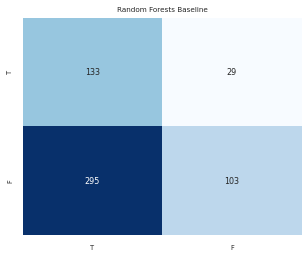

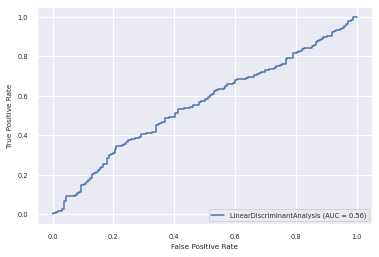

This is the starting index: 4476 of patient 10
0.8701298701298701
[([0], 0, array([0.58534084, 0.41465916])), ([0], 0, array([0.55623716, 0.44376284])), ([0], 0, array([0.55643497, 0.44356503])), ([0], 0, array([0.53800455, 0.46199545])), ([0], 0, array([0.56563123, 0.43436877])), ([0], 0, array([0.53529789, 0.46470211])), ([1], 0, array([0.51521491, 0.48478509])), ([1], 0, array([0.64196046, 0.35803954])), ([0], 0, array([0.5937487, 0.4062513])), ([0], 0, array([0.52870501, 0.47129499])), ([1], 0, array([0.54156331, 0.45843669])), ([1], 0, array([0.63121215, 0.36878785])), ([1], 0, array([0.7080279, 0.2919721])), ([0], 0, array([0.64012433, 0.35987567])), ([0], 0, array([0.71820041, 0.28179959])), ([0], 0, array([0.68227899, 0.31772101])), ([0], 0, array([0.70835268, 0.29164732])), ([0], 0, array([0.50477517, 0.49522483])), ([1], 0, array([0.57401805, 0.42598195])), ([0], 0, array([0.61722438, 0.38277562])), ([1], 0, array([0.73848626, 0.26151374])), ([0], 1, array([0.45619035, 0.5438

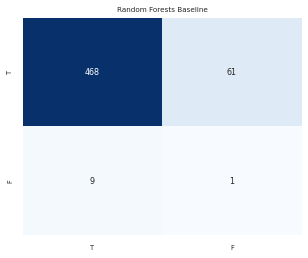

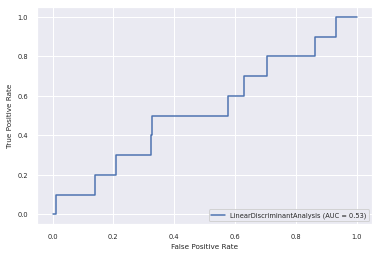

This is the starting index: 5016 of patient 11
0.6536796536796536
[([0], 1, array([0.38353222, 0.61646778])), ([0], 1, array([0.2813436, 0.7186564])), ([0], 0, array([0.528536, 0.471464])), ([0], 0, array([0.55765718, 0.44234282])), ([0], 1, array([0.28133149, 0.71866851])), ([0], 0, array([0.52347754, 0.47652246])), ([0], 1, array([0.26882507, 0.73117493])), ([0], 0, array([0.5718102, 0.4281898])), ([0], 0, array([0.6320715, 0.3679285])), ([0], 0, array([0.71662956, 0.28337044])), ([0], 0, array([0.53884184, 0.46115816])), ([0], 0, array([0.5672072, 0.4327928])), ([0], 0, array([0.58889692, 0.41110308])), ([1], 0, array([0.66644621, 0.33355379])), ([0], 0, array([0.595458, 0.404542])), ([1], 0, array([0.69999812, 0.30000188])), ([0], 0, array([0.7228601, 0.2771399])), ([0], 0, array([0.68062535, 0.31937465])), ([0], 0, array([0.65003189, 0.34996811])), ([1], 0, array([0.68868228, 0.31131772])), ([0], 0, array([0.65764002, 0.34235998])), ([0], 0, array([0.64908174, 0.35091826])), ([0],

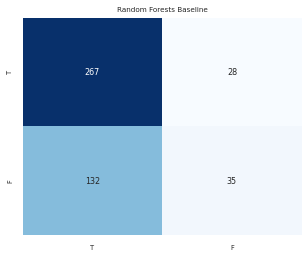

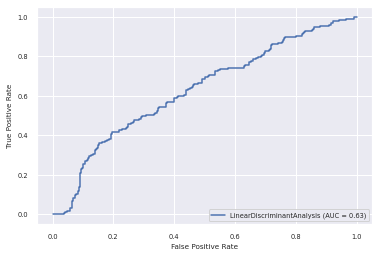

This is the starting index: 5479 of patient 12
0.6235294117647059
[([0], 0, array([0.53308288, 0.46691712])), ([0], 0, array([0.54134241, 0.45865759])), ([0], 1, array([0.45061694, 0.54938306])), ([0], 0, array([0.50369199, 0.49630801])), ([0], 0, array([0.66241655, 0.33758345])), ([0], 0, array([0.58637767, 0.41362233])), ([0], 0, array([0.52706708, 0.47293292])), ([0], 0, array([0.51320386, 0.48679614])), ([0], 0, array([0.50917009, 0.49082991])), ([0], 0, array([0.61944425, 0.38055575])), ([0], 0, array([0.55208787, 0.44791213])), ([0], 0, array([0.54639853, 0.45360147])), ([0], 0, array([0.56463997, 0.43536003])), ([0], 0, array([0.566704, 0.433296])), ([0], 0, array([0.54325344, 0.45674656])), ([0], 1, array([0.44330198, 0.55669802])), ([0], 0, array([0.53312156, 0.46687844])), ([0], 0, array([0.64871875, 0.35128125])), ([0], 0, array([0.54694121, 0.45305879])), ([0], 0, array([0.53370107, 0.46629893])), ([0], 0, array([0.61714992, 0.38285008])), ([0], 0, array([0.5329079, 0.46709

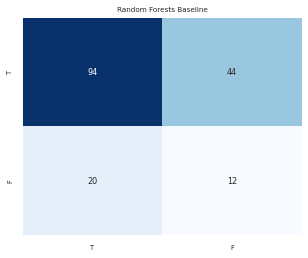

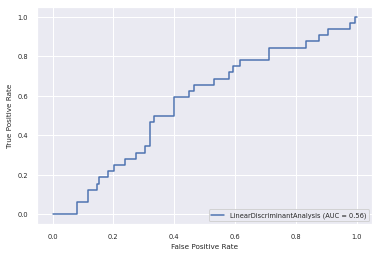

<function matplotlib.pyplot.show>

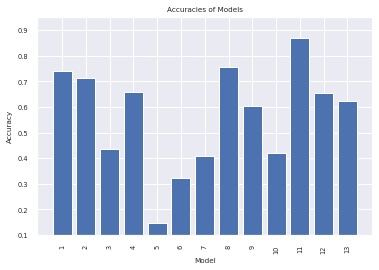

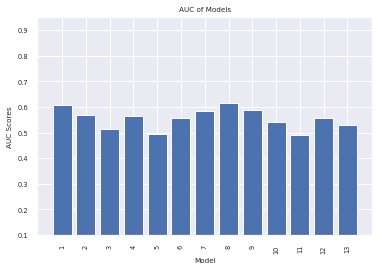

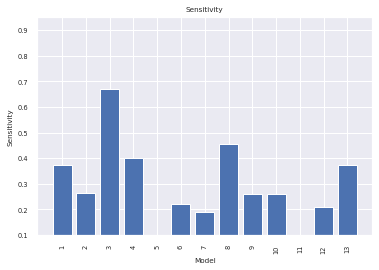

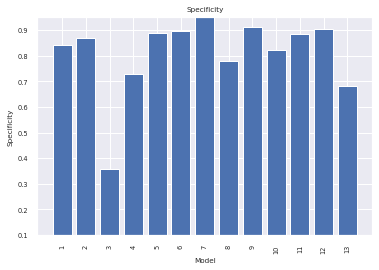

In [45]:
Accuracy = []
auc = []
sensitivity = []
specificity = []

clf = LinearDiscriminantAnalysis()

for i in range(0,13):
    test, train, test_class, train_class = leave_one_out(df,i)
    lsvc = LinearSVC(C=0.01, penalty="l1", dual=False).fit(train, train_class.ravel())
    model = SelectFromModel(lsvc, prefit=True)
    train = model.transform(train)
    test = model.transform(test)
    clf.fit(train, train_class.ravel())

    y_predicted = clf.predict(test)
    print(metrics.accuracy_score(test_class,y_predicted))
        # print("Random Forest:\n",metrics.classification_report(test_class,y_predicted)) # Classification report
    Accuracy.append(metrics.accuracy_score(test_class,y_predicted))
    auc.append(metrics.roc_auc_score(test_class,y_predicted))
    mcm = confusion_matrix(test_class,y_predicted)
    tn = mcm[0, 0]
    tp = mcm[1, 1]
    fn = mcm[1, 0]
    fp = mcm[0, 1]
    sensitivity.append(tp / (tp + fn))
    specificity.append(tn / (tn + fp))
    pred = clf.predict_proba(test)
    result = [*zip(test_class.tolist(), y_predicted, pred)]
    print(result)
    report = metrics.classification_report(test_class.tolist(), y_predicted)
    matrix = metrics.confusion_matrix(test_class.tolist(),y_predicted)   

    fig, (ax1) = plt.subplots(1, figsize=(5, 4))


    df_cm1 = pd.DataFrame(matrix, range(2), range(2))
    sn.set(font_scale=0.6) # for label size
    sn.heatmap(df_cm1, annot=True,annot_kws={"size": 8}, fmt='g', cmap='Blues', cbar= False, xticklabels=x_axis_labels, yticklabels=y_axis_labels, ax = ax1) # font size


    ax1.set_title('Random Forests Baseline')

    plt.show()
    metrics.plot_roc_curve(clf, test, test_class.tolist())  # doctest: +SKIP
    plt.show()

Model=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13']

Index = [1,2,3,4,5,6,7,8,9,10,11,12,13]
fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,Accuracy)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Accuracy')
plt.xlabel('Model')
plt.title('Accuracies of Models')
plt.show


fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,auc)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('AUC Scores')
plt.xlabel('Model')
plt.title('AUC of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,sensitivity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Sensitivity')
plt.xlabel('Model')
plt.title('Sensitivity')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,specificity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Specificity')
plt.xlabel('Model')
plt.title('Specificity')
plt.show

#### Tree Based Feature Selection

This is the starting index: 0 of patient 0
0.7905759162303665
[([1], 0, array([0.56, 0.44])), ([1], 1, array([0.41, 0.59])), ([0], 1, array([0.29, 0.71])), ([1], 0, array([0.9, 0.1])), ([1], 1, array([0.16, 0.84])), ([0], 0, array([0.85, 0.15])), ([1], 0, array([0.73, 0.27])), ([0], 0, array([0.59, 0.41])), ([1], 1, array([0.14, 0.86])), ([0], 0, array([0.61, 0.39])), ([0], 0, array([0.57, 0.43])), ([1], 0, array([0.58, 0.42])), ([1], 0, array([0.53, 0.47])), ([0], 1, array([0.39, 0.61])), ([1], 1, array([0.21, 0.79])), ([1], 1, array([0.33, 0.67])), ([1], 1, array([0.44, 0.56])), ([1], 0, array([0.76, 0.24])), ([1], 0, array([0.5, 0.5])), ([1], 0, array([0.5, 0.5])), ([0], 0, array([0.59, 0.41])), ([1], 0, array([0.84, 0.16])), ([1], 0, array([0.58, 0.42])), ([1], 1, array([0.21, 0.79])), ([0], 0, array([0.83, 0.17])), ([0], 0, array([0.61, 0.39])), ([1], 0, array([0.59, 0.41])), ([1], 0, array([0.54, 0.46])), ([0], 0, array([0.55, 0.45])), ([0], 0, array([0.74, 0.26])), ([0], 0, arra

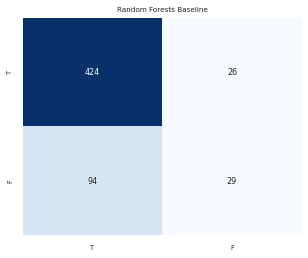

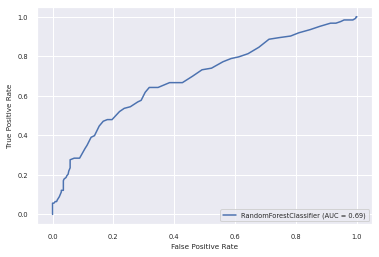

This is the starting index: 574 of patient 1
0.7253218884120172
[([0], 1, array([0.24, 0.76])), ([0], 1, array([0.28, 0.72])), ([0], 0, array([0.61, 0.39])), ([0], 1, array([0.39, 0.61])), ([0], 0, array([0.64, 0.36])), ([0], 0, array([0.71, 0.29])), ([1], 1, array([0.35, 0.65])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.58, 0.42])), ([0], 0, array([0.72, 0.28])), ([0], 0, array([0.7, 0.3])), ([0], 1, array([0.46, 0.54])), ([1], 0, array([0.55, 0.45])), ([0], 0, array([0.63, 0.37])), ([0], 0, array([0.7, 0.3])), ([0], 0, array([0.65, 0.35])), ([0], 1, array([0.45, 0.55])), ([0], 0, array([0.65, 0.35])), ([1], 0, array([0.8, 0.2])), ([0], 0, array([0.55, 0.45])), ([1], 1, array([0.1, 0.9])), ([0], 0, array([0.79, 0.21])), ([1], 1, array([0.11, 0.89])), ([0], 0, array([0.6, 0.4])), ([1], 1, array([0.47, 0.53])), ([0], 0, array([0.88, 0.12])), ([0], 0, array([0.66, 0.34])), ([0], 0, array([0.61, 0.39])), ([0], 0, array([0.77, 0.23])), ([1], 1, array([0.19, 0.81])), ([1], 1, array([0

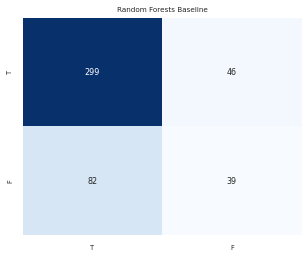

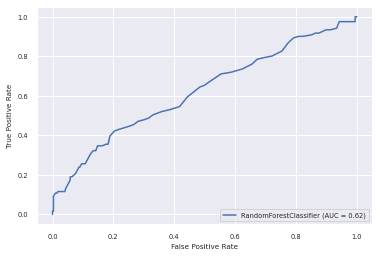

This is the starting index: 1041 of patient 2
0.2935153583617747
[([1], 1, array([0.19, 0.81])), ([0], 0, array([0.56, 0.44])), ([0], 1, array([0.41, 0.59])), ([1], 1, array([0.12, 0.88])), ([0], 0, array([0.5, 0.5])), ([0], 0, array([0.68, 0.32])), ([0], 0, array([0.64, 0.36])), ([1], 1, array([0.09, 0.91])), ([1], 0, array([0.57, 0.43])), ([1], 1, array([0.37, 0.63])), ([1], 0, array([0.51, 0.49])), ([1], 1, array([0.31, 0.69])), ([1], 1, array([0.08, 0.92])), ([0], 1, array([0.49, 0.51])), ([1], 1, array([0.44, 0.56])), ([1], 1, array([0.24, 0.76])), ([0], 1, array([0.27, 0.73])), ([0], 1, array([0.08, 0.92])), ([0], 1, array([0.33, 0.67])), ([0], 0, array([0.58, 0.42])), ([0], 1, array([0.08, 0.92])), ([0], 1, array([0.45, 0.55])), ([0], 1, array([0.36, 0.64])), ([0], 1, array([0., 1.])), ([0], 1, array([0.26, 0.74])), ([0], 1, array([0.05, 0.95])), ([0], 1, array([0.47, 0.53])), ([0], 1, array([0.08, 0.92])), ([0], 1, array([0.09, 0.91])), ([0], 1, array([0.09, 0.91])), ([0], 1, a

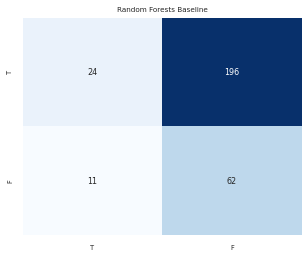

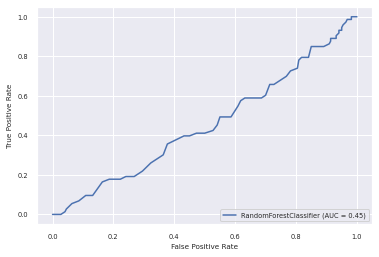

This is the starting index: 1335 of patient 3
0.6428571428571429
[([0], 0, array([0.58, 0.42])), ([1], 0, array([0.5, 0.5])), ([1], 1, array([0.23, 0.77])), ([1], 1, array([0.32, 0.68])), ([1], 1, array([0.13, 0.87])), ([1], 0, array([0.54, 0.46])), ([1], 1, array([0.33, 0.67])), ([0], 0, array([0.53, 0.47])), ([0], 0, array([0.66, 0.34])), ([0], 0, array([0.65, 0.35])), ([0], 1, array([0.41, 0.59])), ([0], 0, array([0.75, 0.25])), ([0], 0, array([0.72, 0.28])), ([1], 0, array([0.69, 0.31])), ([0], 0, array([0.56, 0.44])), ([0], 0, array([0.54, 0.46])), ([0], 0, array([0.59, 0.41])), ([0], 1, array([0.11, 0.89])), ([0], 0, array([0.56, 0.44])), ([0], 0, array([0.56, 0.44])), ([0], 0, array([0.71, 0.29])), ([0], 1, array([0.31, 0.69])), ([0], 1, array([0.46, 0.54])), ([0], 0, array([0.81, 0.19])), ([0], 0, array([0.78, 0.22])), ([0], 0, array([0.63, 0.37])), ([0], 0, array([0.53, 0.47])), ([0], 0, array([0.92, 0.08])), ([0], 1, array([0.46, 0.54])), ([1], 0, array([0.65, 0.35])), ([0], 

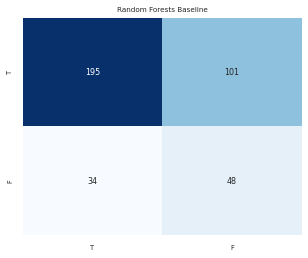

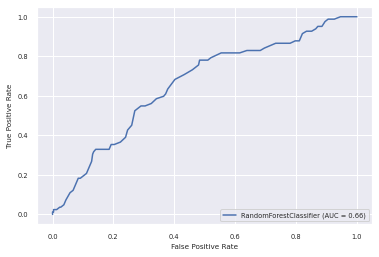

This is the starting index: 1714 of patient 4
0.5415282392026578
[([1], 1, array([0.43, 0.57])), ([1], 1, array([0.35, 0.65])), ([1], 0, array([0.58, 0.42])), ([1], 1, array([0.42, 0.58])), ([1], 1, array([0.42, 0.58])), ([1], 0, array([0.61, 0.39])), ([1], 0, array([0.62, 0.38])), ([1], 0, array([0.61, 0.39])), ([1], 0, array([0.56, 0.44])), ([1], 1, array([0.49, 0.51])), ([1], 1, array([0.49, 0.51])), ([1], 0, array([0.5, 0.5])), ([1], 1, array([0.48, 0.52])), ([1], 1, array([0.46, 0.54])), ([1], 1, array([0.43, 0.57])), ([1], 1, array([0.38, 0.62])), ([1], 1, array([0.26, 0.74])), ([1], 1, array([0.42, 0.58])), ([1], 1, array([0.18, 0.82])), ([1], 1, array([0.37, 0.63])), ([1], 1, array([0.33, 0.67])), ([1], 1, array([0.3, 0.7])), ([1], 1, array([0.35, 0.65])), ([1], 1, array([0.23, 0.77])), ([1], 1, array([0.41, 0.59])), ([1], 1, array([0.33, 0.67])), ([1], 1, array([0.29, 0.71])), ([1], 0, array([0.71, 0.29])), ([1], 0, array([0.54, 0.46])), ([1], 0, array([0.52, 0.48])), ([1], 0,

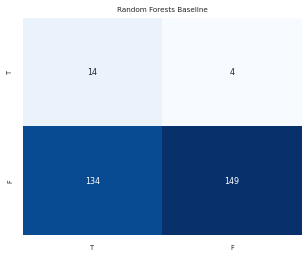

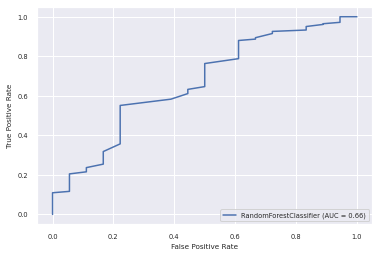

This is the starting index: 2016 of patient 5
0.458980044345898
[([0], 0, array([0.67, 0.33])), ([0], 0, array([0.71, 0.29])), ([0], 0, array([0.59, 0.41])), ([0], 0, array([0.87, 0.13])), ([0], 0, array([0.71, 0.29])), ([0], 0, array([0.8, 0.2])), ([1], 0, array([0.79, 0.21])), ([1], 0, array([0.86, 0.14])), ([1], 0, array([0.63, 0.37])), ([1], 0, array([0.76, 0.24])), ([0], 0, array([0.77, 0.23])), ([1], 0, array([0.77, 0.23])), ([0], 0, array([0.67, 0.33])), ([1], 0, array([0.64, 0.36])), ([1], 0, array([0.72, 0.28])), ([1], 0, array([0.78, 0.22])), ([1], 0, array([0.9, 0.1])), ([1], 0, array([0.64, 0.36])), ([1], 0, array([0.67, 0.33])), ([1], 0, array([0.8, 0.2])), ([1], 1, array([0.1, 0.9])), ([1], 0, array([0.75, 0.25])), ([1], 0, array([0.81, 0.19])), ([1], 0, array([0.53, 0.47])), ([1], 0, array([0.79, 0.21])), ([1], 0, array([0.75, 0.25])), ([1], 1, array([0.11, 0.89])), ([1], 0, array([0.65, 0.35])), ([1], 0, array([0.9, 0.1])), ([1], 1, array([0.39, 0.61])), ([1], 0, array(

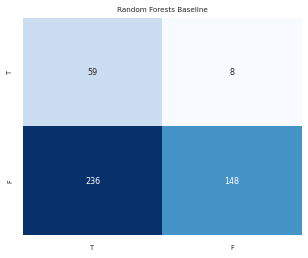

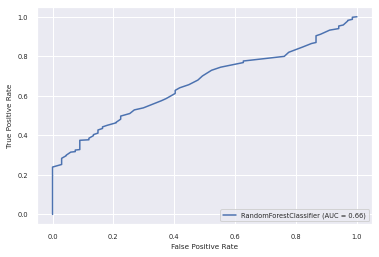

This is the starting index: 2468 of patient 6
0.5459317585301837
[([1], 0, array([0.53, 0.47])), ([1], 0, array([0.54, 0.46])), ([1], 1, array([0.34, 0.66])), ([1], 0, array([0.76, 0.24])), ([1], 0, array([0.65, 0.35])), ([1], 1, array([0.34, 0.66])), ([1], 1, array([0.28, 0.72])), ([1], 0, array([0.81, 0.19])), ([1], 0, array([0.57, 0.43])), ([1], 0, array([0.74, 0.26])), ([0], 0, array([0.78, 0.22])), ([1], 1, array([0.44, 0.56])), ([1], 0, array([0.83, 0.17])), ([1], 1, array([0.45, 0.55])), ([1], 0, array([0.74, 0.26])), ([1], 1, array([0.42, 0.58])), ([1], 1, array([0.26, 0.74])), ([1], 1, array([0.37, 0.63])), ([1], 1, array([0.38, 0.62])), ([0], 0, array([0.68, 0.32])), ([1], 0, array([0.65, 0.35])), ([1], 0, array([0.83, 0.17])), ([1], 1, array([0.46, 0.54])), ([1], 1, array([0.31, 0.69])), ([1], 0, array([0.53, 0.47])), ([1], 0, array([0.65, 0.35])), ([1], 0, array([0.77, 0.23])), ([0], 1, array([0.34, 0.66])), ([0], 0, array([0.86, 0.14])), ([1], 1, array([0.47, 0.53])), ([1]

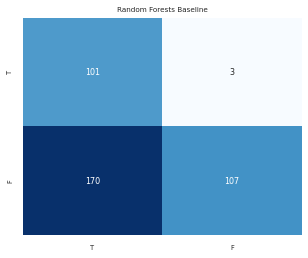

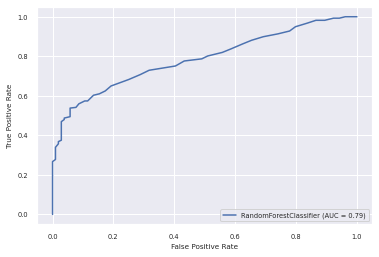

This is the starting index: 2850 of patient 7
0.8206185567010309
[([0], 0, array([0.68, 0.32])), ([0], 0, array([0.79, 0.21])), ([0], 0, array([0.77, 0.23])), ([0], 1, array([0.49, 0.51])), ([0], 0, array([0.59, 0.41])), ([0], 0, array([0.73, 0.27])), ([0], 0, array([0.76, 0.24])), ([0], 0, array([0.85, 0.15])), ([0], 0, array([0.69, 0.31])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.92, 0.08])), ([0], 1, array([0.18, 0.82])), ([0], 1, array([0.25, 0.75])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.95, 0.05])), ([0], 0, array([0.79, 0.21])), ([0], 0, array([0.93, 0.07])), ([0], 0, array([0.73, 0.27])), ([0], 0, array([0.73, 0.27])), ([0], 0, array([0.68, 0.32])), ([0], 0, array([0.82, 0.18])), ([0], 0, array([0.65, 0.35])), ([0], 1, array([0.41, 0.59])), ([0], 0, array([0.73, 0.27])), ([0], 1, array([0.38, 0.62])), ([0], 0, array([0.79, 0.21])), ([0], 0, array([0.89, 0.11])), ([0], 1, array([0.46, 0.54])), ([0], 0, array([0.63, 0.37])), ([1], 0, a

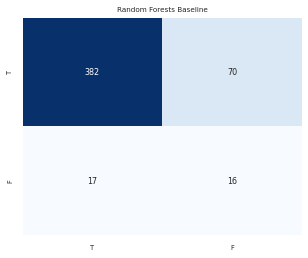

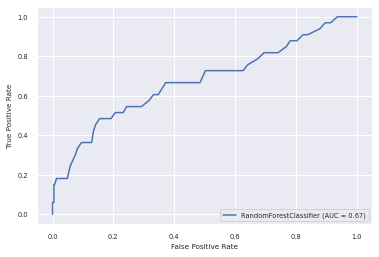

This is the starting index: 3336 of patient 8
0.7214532871972318
[([1], 0, array([0.83, 0.17])), ([1], 1, array([0.25, 0.75])), ([0], 0, array([0.73, 0.27])), ([1], 0, array([0.63, 0.37])), ([1], 1, array([0.4, 0.6])), ([1], 1, array([0.27, 0.73])), ([1], 1, array([0.46, 0.54])), ([1], 1, array([0.26, 0.74])), ([1], 1, array([0.33, 0.67])), ([1], 1, array([0.18, 0.82])), ([0], 1, array([0.46, 0.54])), ([1], 1, array([0.47, 0.53])), ([0], 0, array([0.82, 0.18])), ([1], 1, array([0.39, 0.61])), ([1], 1, array([0.44, 0.56])), ([0], 0, array([0.86, 0.14])), ([0], 0, array([0.65, 0.35])), ([1], 0, array([0.72, 0.28])), ([1], 1, array([0.17, 0.83])), ([1], 0, array([0.66, 0.34])), ([1], 1, array([0.21, 0.79])), ([0], 0, array([0.67, 0.33])), ([1], 1, array([0.33, 0.67])), ([0], 0, array([0.77, 0.23])), ([1], 1, array([0.08, 0.92])), ([0], 1, array([0.4, 0.6])), ([0], 0, array([0.72, 0.28])), ([0], 0, array([0.53, 0.47])), ([0], 0, array([0.75, 0.25])), ([1], 1, array([0.23, 0.77])), ([1], 1,

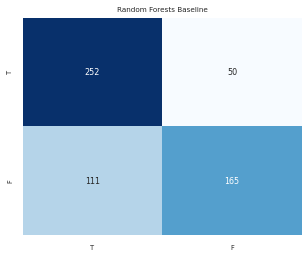

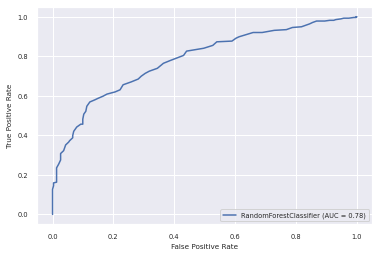

This is the starting index: 3915 of patient 9
0.5857142857142857
[([1], 1, array([0.26, 0.74])), ([1], 1, array([0.43, 0.57])), ([1], 1, array([0.46, 0.54])), ([1], 0, array([0.57, 0.43])), ([1], 1, array([0.38, 0.62])), ([1], 1, array([0.21, 0.79])), ([1], 0, array([0.74, 0.26])), ([1], 0, array([0.72, 0.28])), ([1], 1, array([0.48, 0.52])), ([1], 0, array([0.65, 0.35])), ([1], 1, array([0.28, 0.72])), ([1], 0, array([0.53, 0.47])), ([1], 1, array([0.24, 0.76])), ([1], 1, array([0.45, 0.55])), ([1], 0, array([0.73, 0.27])), ([1], 0, array([0.63, 0.37])), ([1], 1, array([0.42, 0.58])), ([1], 1, array([0.39, 0.61])), ([1], 1, array([0.49, 0.51])), ([1], 1, array([0.45, 0.55])), ([1], 1, array([0.25, 0.75])), ([1], 0, array([0.61, 0.39])), ([1], 0, array([0.58, 0.42])), ([1], 0, array([0.57, 0.43])), ([1], 0, array([0.6, 0.4])), ([0], 1, array([0.4, 0.6])), ([0], 1, array([0.41, 0.59])), ([1], 1, array([0.22, 0.78])), ([1], 0, array([0.79, 0.21])), ([1], 1, array([0.15, 0.85])), ([1], 1,

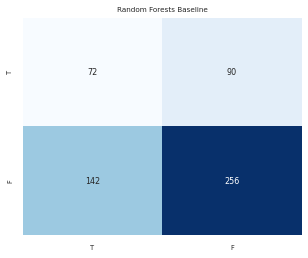

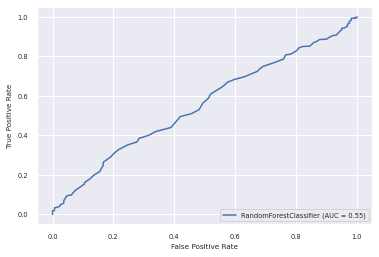

This is the starting index: 4476 of patient 10
0.8719851576994434
[([0], 0, array([0.63, 0.37])), ([0], 0, array([0.74, 0.26])), ([0], 0, array([0.76, 0.24])), ([0], 0, array([0.64, 0.36])), ([0], 0, array([0.65, 0.35])), ([0], 0, array([0.75, 0.25])), ([1], 0, array([0.5, 0.5])), ([1], 0, array([0.65, 0.35])), ([0], 0, array([0.79, 0.21])), ([0], 0, array([0.83, 0.17])), ([1], 0, array([0.5, 0.5])), ([1], 1, array([0.44, 0.56])), ([1], 0, array([0.56, 0.44])), ([0], 0, array([0.9, 0.1])), ([0], 0, array([0.63, 0.37])), ([0], 0, array([0.84, 0.16])), ([0], 0, array([0.76, 0.24])), ([0], 0, array([0.71, 0.29])), ([1], 1, array([0.33, 0.67])), ([0], 0, array([0.65, 0.35])), ([1], 0, array([0.8, 0.2])), ([0], 0, array([0.9, 0.1])), ([0], 0, array([0.62, 0.38])), ([0], 0, array([0.54, 0.46])), ([0], 0, array([0.87, 0.13])), ([1], 0, array([0.56, 0.44])), ([0], 0, array([0.6, 0.4])), ([0], 0, array([0.76, 0.24])), ([0], 0, array([0.51, 0.49])), ([0], 0, array([0.77, 0.23])), ([0], 0, array(

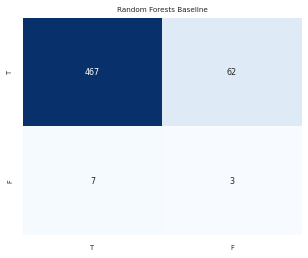

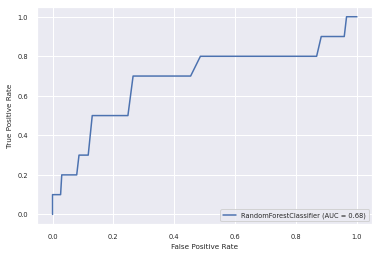

This is the starting index: 5016 of patient 11
0.7445887445887446
[([0], 1, array([0.45, 0.55])), ([0], 0, array([0.51, 0.49])), ([0], 0, array([0.86, 0.14])), ([0], 0, array([0.79, 0.21])), ([0], 1, array([0.35, 0.65])), ([0], 0, array([0.71, 0.29])), ([0], 0, array([0.67, 0.33])), ([0], 0, array([0.71, 0.29])), ([0], 0, array([0.72, 0.28])), ([0], 0, array([0.75, 0.25])), ([0], 0, array([0.79, 0.21])), ([0], 0, array([0.8, 0.2])), ([0], 0, array([0.79, 0.21])), ([1], 1, array([0.43, 0.57])), ([0], 0, array([0.75, 0.25])), ([1], 0, array([0.77, 0.23])), ([0], 0, array([0.65, 0.35])), ([0], 0, array([0.78, 0.22])), ([0], 0, array([0.88, 0.12])), ([1], 0, array([0.95, 0.05])), ([0], 0, array([0.78, 0.22])), ([0], 0, array([0.88, 0.12])), ([0], 0, array([0.92, 0.08])), ([0], 0, array([0.92, 0.08])), ([1], 0, array([0.62, 0.38])), ([0], 0, array([0.78, 0.22])), ([1], 0, array([0.82, 0.18])), ([1], 1, array([0.12, 0.88])), ([0], 0, array([0.76, 0.24])), ([0], 0, array([0.76, 0.24])), ([0],

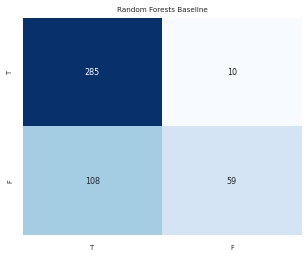

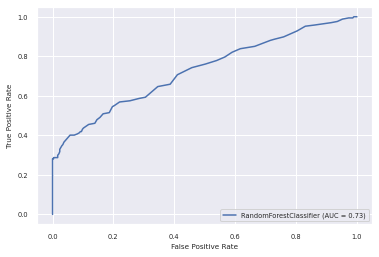

This is the starting index: 5479 of patient 12
0.3588235294117647
[([0], 1, array([0.47, 0.53])), ([0], 1, array([0.43, 0.57])), ([0], 1, array([0.29, 0.71])), ([0], 1, array([0.45, 0.55])), ([0], 0, array([0.7, 0.3])), ([0], 1, array([0.34, 0.66])), ([0], 1, array([0.4, 0.6])), ([0], 1, array([0.37, 0.63])), ([0], 0, array([0.51, 0.49])), ([0], 1, array([0.38, 0.62])), ([0], 1, array([0.26, 0.74])), ([0], 1, array([0.32, 0.68])), ([0], 0, array([0.59, 0.41])), ([0], 1, array([0.31, 0.69])), ([0], 1, array([0.21, 0.79])), ([0], 1, array([0.2, 0.8])), ([0], 1, array([0.49, 0.51])), ([0], 1, array([0.38, 0.62])), ([0], 1, array([0.38, 0.62])), ([0], 1, array([0.38, 0.62])), ([0], 1, array([0.39, 0.61])), ([0], 1, array([0.44, 0.56])), ([0], 1, array([0.33, 0.67])), ([0], 1, array([0.47, 0.53])), ([0], 0, array([0.53, 0.47])), ([0], 1, array([0.35, 0.65])), ([0], 0, array([0.52, 0.48])), ([0], 1, array([0.31, 0.69])), ([0], 1, array([0.38, 0.62])), ([0], 1, array([0.47, 0.53])), ([0], 1, 

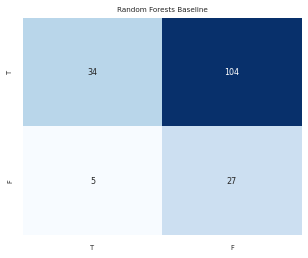

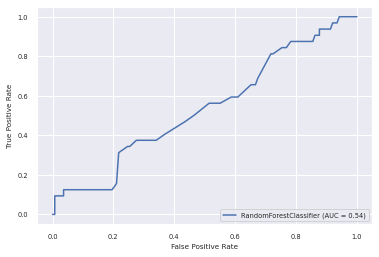

<function matplotlib.pyplot.show>

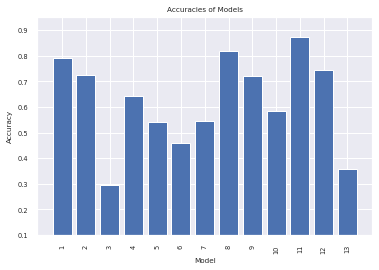

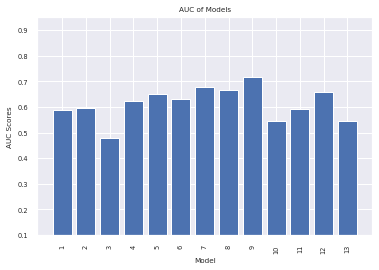

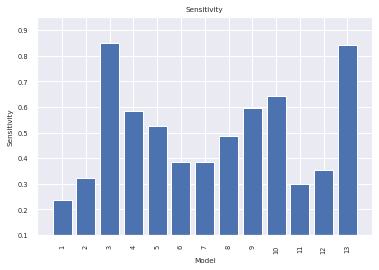

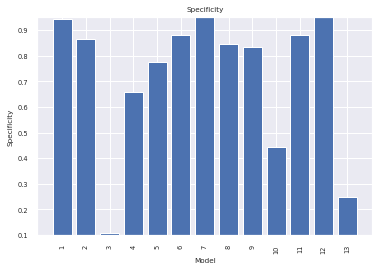

In [46]:
Accuracy = []
auc = []
sensitivity = []
specificity = []
clf = LinearDiscriminantAnalysis()

for i in range(0,13):
    test, train, test_class, train_class = leave_one_out(df,i)
    clf = ExtraTreesClassifier(n_estimators=50)
    clf = clf.fit(train, train_class.ravel())
    model = SelectFromModel(clf, prefit=True)
    train = model.transform(train)
    # clf = ExtraTreesClassifier(n_estimators=50)
    # clf = clf.fit(test, test_class.ravel())
    # model = SelectFromModel(clf, prefit=True) 

    test = model.transform(test)
    clf = RandomForestClassifier()
    clf.fit(train, train_class.ravel())


    y_predicted = clf.predict(test)
    print(metrics.accuracy_score(test_class,y_predicted))
        # print("Random Forest:\n",metrics.classification_report(test_class,y_predicted)) # Classification report
    Accuracy.append(metrics.accuracy_score(test_class,y_predicted))
    auc.append(metrics.roc_auc_score(test_class,y_predicted))
    mcm = confusion_matrix(test_class,y_predicted)
    tn = mcm[0, 0]
    tp = mcm[1, 1]
    fn = mcm[1, 0]
    fp = mcm[0, 1]
    sensitivity.append(tp / (tp + fn))
    specificity.append(tn / (tn + fp))
    pred = clf.predict_proba(test)
    result = [*zip(test_class.tolist(), y_predicted, pred)]
    print(result)
    report = metrics.classification_report(test_class.tolist(), y_predicted)
    matrix = metrics.confusion_matrix(test_class.tolist(),y_predicted)   

    fig, (ax1) = plt.subplots(1, figsize=(5, 4))


    df_cm1 = pd.DataFrame(matrix, range(2), range(2))
    sn.set(font_scale=0.6) # for label size
    sn.heatmap(df_cm1, annot=True,annot_kws={"size": 8}, fmt='g', cmap='Blues', cbar= False, xticklabels=x_axis_labels, yticklabels=y_axis_labels, ax = ax1) # font size


    ax1.set_title('Random Forests Baseline')

    plt.show()
    metrics.plot_roc_curve(clf, test, test_class.tolist())  # doctest: +SKIP
    plt.show()

Model=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13']

Index = [1,2,3,4,5,6,7,8,9,10,11,12,13]
fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,Accuracy)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Accuracy')
plt.xlabel('Model')
plt.title('Accuracies of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,auc)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('AUC Scores')
plt.xlabel('Model')
plt.title('AUC of Models')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,sensitivity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Sensitivity')
plt.xlabel('Model')
plt.title('Sensitivity')
plt.show

fig, ax = plt.subplots()
ax.set(ylim=[0.1, 0.95])
plt.bar(Index,specificity)
plt.xticks(Index, Model, rotation=90)
plt.ylabel('Specificity')
plt.xlabel('Model')
plt.title('Specificity')
plt.show

#### Auto Sklearn Recommendation

In [ ]:
#SVM with manual parameters
svm = Pipeline([('vect', CountVectorizer()),('tfidf', TfidfTransformer()),
                         ('svm', SGDClassifier(loss='hinge', alpha=1e-3, random_state=42)),])

SimpleClassificationPipeline({'balancing:strategy': 'weighting', 'classifier:__choice__': 'random_forest', 'data_preprocessing:categorical_transformer:categorical_encoding:__choice__': 'one_hot_encoding', 'data_preprocessing:categorical_transformer:category_coalescence:__choice__': 'minority_coalescer', 'data_preprocessing:numerical_transformer:imputation:strategy': 'most_frequent', 'data_preprocessing:numerical_transformer:rescaling:__choice__': 'normalize', 'feature_preprocessor:__choice__': 'extra_trees_preproc_for_classification', 'classifier:random_forest:bootstrap': 'False', 'classifier:random_forest:criterion': 'entropy', 'classifier:random_forest:max_depth': 'None', 'classifier:random_forest:max_features': 0.27453376891983117, 'classifier:random_forest:max_leaf_nodes': 'None', 'classifier:random_forest:min_impurity_decrease': 0.0, 'classifier:random_forest:min_samples_leaf': 13, 'classifier:random_forest:min_samples_split': 19, 'classifier:random_forest:min_weight_fraction_leaf': 0.0, 'data_preprocessing:categorical_transformer:category_coalescence:minority_coalescer:minimum_fraction': 0.2166847947584762, 'feature_preprocessor:extra_trees_preproc_for_classification:bootstrap': 'False', 'feature_preprocessor:extra_trees_preproc_for_classification:criterion': 'entropy', 'feature_preprocessor:extra_trees_preproc_for_classification:max_depth': 'None', 'feature_preprocessor:extra_trees_preproc_for_classification:max_features': 0.2819773130241576, 'feature_preprocessor:extra_trees_preproc_for_classification:max_leaf_nodes': 'None', 'feature_preprocessor:extra_trees_preproc_for_classification:min_impurity_decrease': 0.0, 'feature_preprocessor:extra_trees_preproc_for_classification:min_samples_leaf': 20, 'feature_preprocessor:extra_trees_preproc_for_classification:min_samples_split': 3, 'feature_preprocessor:extra_trees_preproc_for_classification:min_weight_fraction_leaf': 0.0, 'feature_preprocessor:extra_trees_preproc_for_classification:n_estimators': 100},
d